In [ ]:
!pip install shap

현재 실행 디렉토리: D:\01-STUDY\3차 팀PJ
지역별 전기적 세부 요인 위험 점수 감소 기여도:
  Region        Cause  Reduction (%)  SHAP Contribution (%)
0    강원도  절연열화에 의한 단락      69.995002               8.790093
1    강원도      과부하/과전류      68.618828               8.790093
2    강원도        미확인단락      56.311777               8.790093
3    강원도    기타(전기적요인)      65.780793               8.790093
4    강원도        누전,지락      69.995002               8.790093


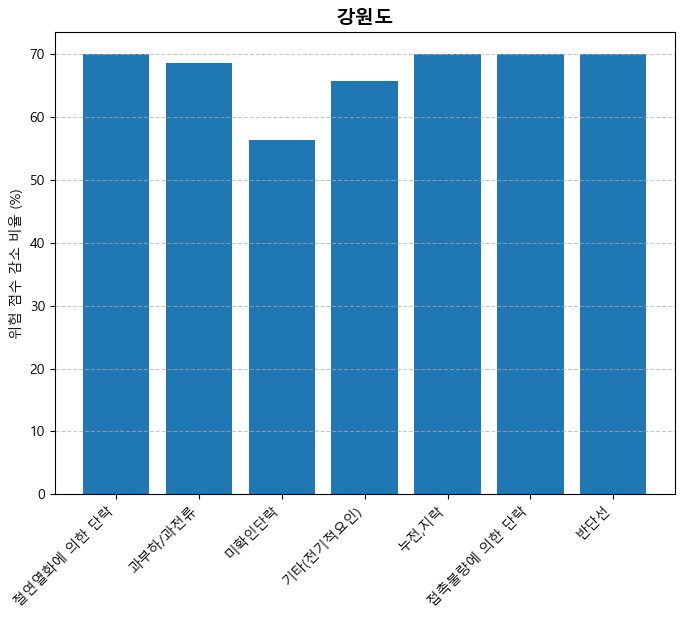

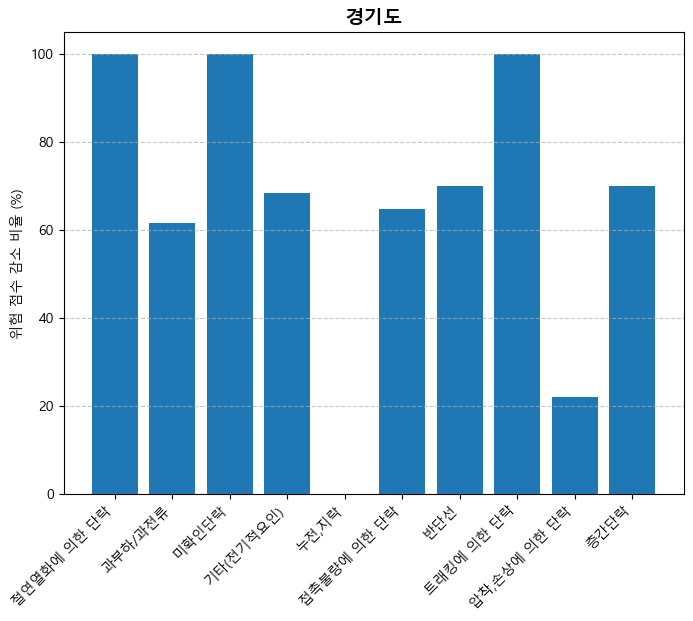

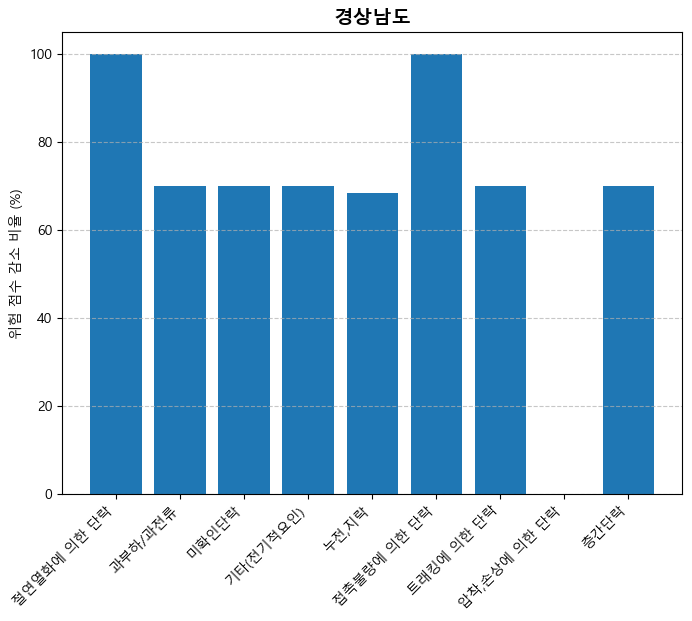

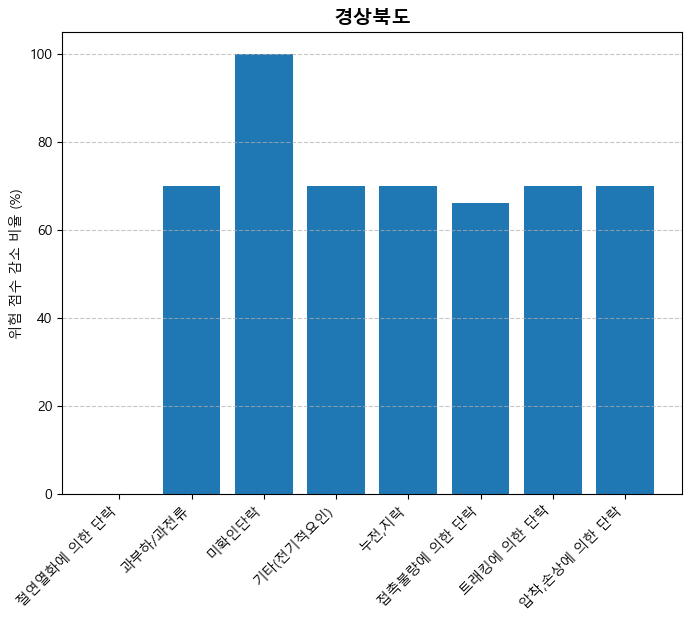

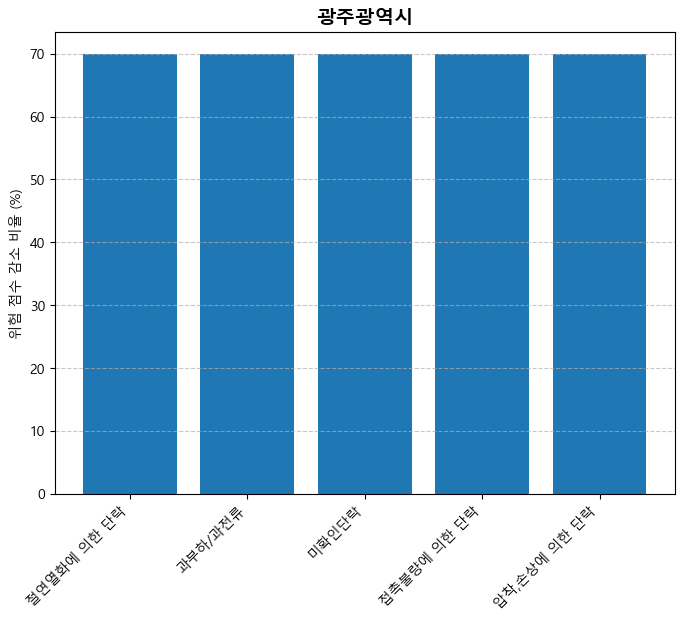

...

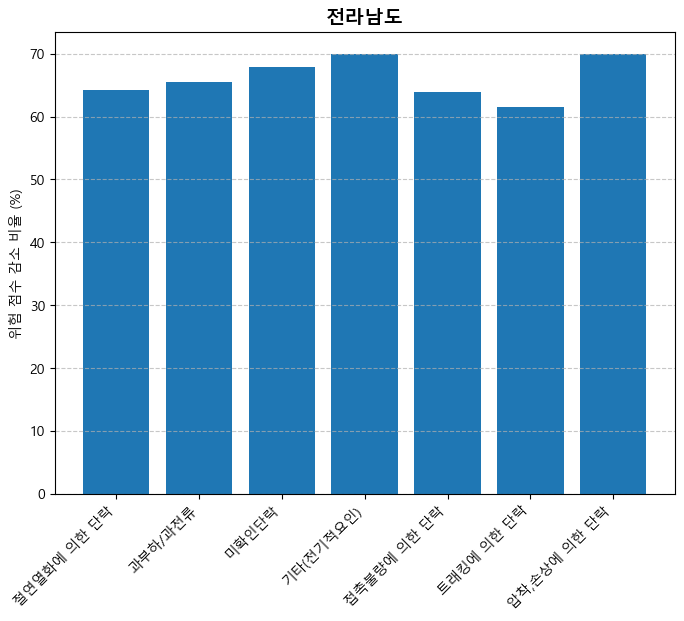

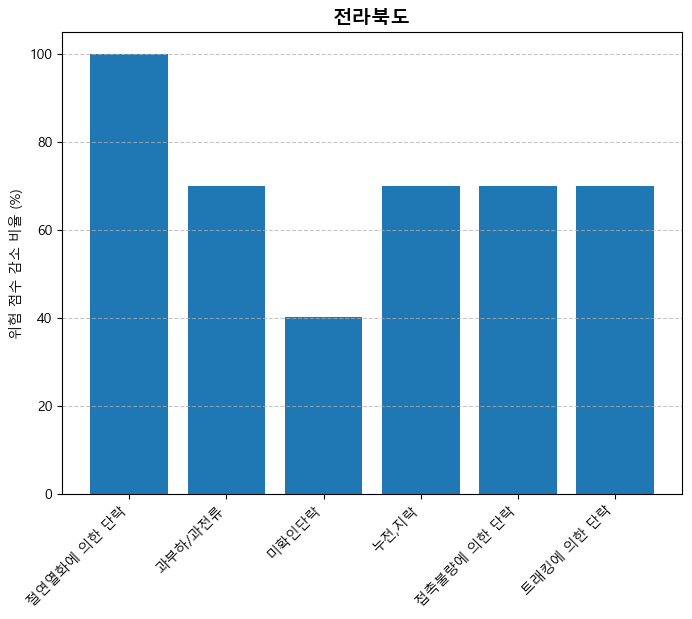

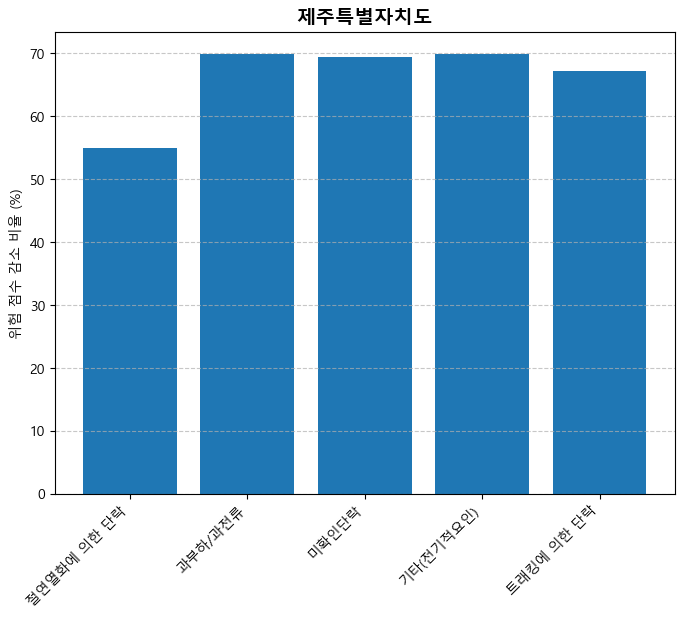

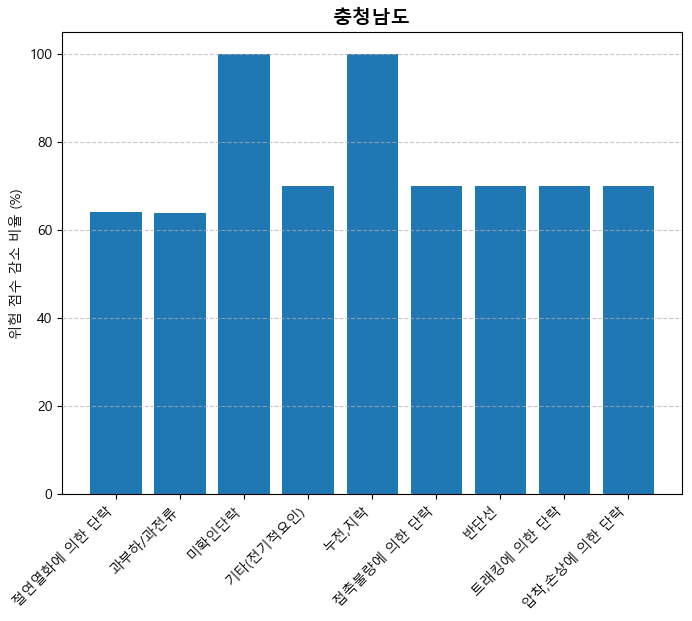

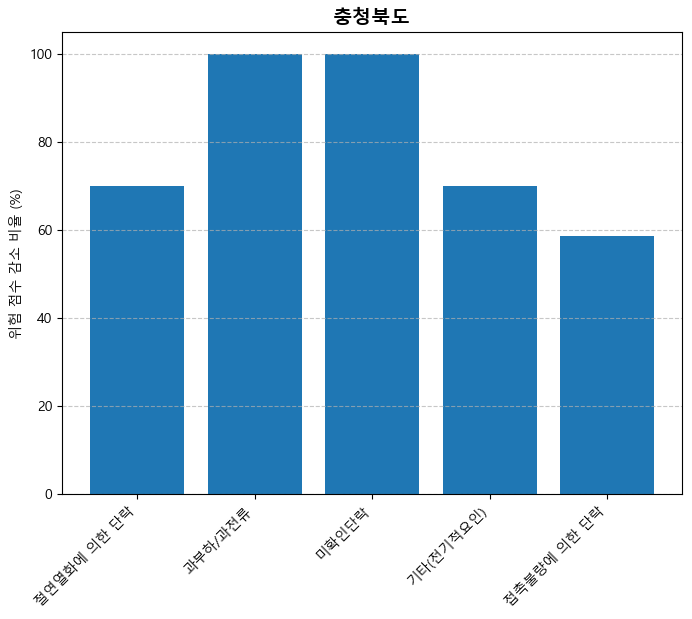

In [12]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
import shap
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler

# 나눔고딕 폰트 경로 설정 (Windows 기준)
plt.rc('font', family='Malgun Gothic')

# 마이너스 기호 깨짐 방지
plt.rcParams['axes.unicode_minus'] = False


# 현재 실행 디렉토리 확인
BASE_DIR = os.getcwd()
print("현재 실행 디렉토리:", BASE_DIR)

# 상대 경로 설정 (Old_team_project3-3 폴더 포함)
DATA_PATH = os.path.join(BASE_DIR, "Old_team_project3-3", ".vscode", "dy_AiData", "electric_ai_data.csv")

# 데이터 로드
data = pd.read_csv(DATA_PATH)

# 위험 점수 계산 및 정규화
data["risk_score"] = data["total_incidents"] * data["total_damage"]
scaler = StandardScaler()
data[["z_total_incidents", "z_total_damage", "z_risk_score"]] = scaler.fit_transform(
    data[["total_incidents", "total_damage", "risk_score"]]
)

# 지역 및 전기적 요인 목록
regions = data["region_province"].unique()
causes = data["cause_subcategory"].unique()

# 결과 저장 리스트
shap_results = []

# K-Fold 설정
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# 랜덤포레스트 + SHAP 분석
for train_index, test_index in kf.split(data):
    train_data, test_data = data.iloc[train_index], data.iloc[test_index]
    X_train = train_data[["z_total_incidents", "z_total_damage"]]
    y_train = train_data["z_risk_score"]
    X_test = test_data[["z_total_incidents", "z_total_damage"]]

    # 랜덤포레스트 학습
    model = RandomForestRegressor(n_estimators=50, max_depth=5, random_state=42)
    model.fit(X_train, y_train)

    # SHAP 분석
    explainer = shap.TreeExplainer(model)
    shap_values = explainer(X_test)

    # SHAP 중요도 계산
    total_shap_sum = abs(shap_values.values).sum()
    shap_contributions = (abs(shap_values.values).sum(axis=0) / total_shap_sum) * 100

    for region in regions:
        region_data = data[data["region_province"] == region]
        if len(region_data) < 2:
            continue

        for cause in causes:
            cause_data = region_data[region_data["cause_subcategory"] == cause]
            if cause_data.empty:
                continue

            improved_data = cause_data.copy()
            improved_data[["z_total_incidents", "z_total_damage"]] = 0

            # 기존 위험 점수
            original_risk_score = model.predict(cause_data[["z_total_incidents", "z_total_damage"]]).mean()

            # 위험 요인 제거 후 점수
            improved_risk_score = model.predict(improved_data[["z_total_incidents", "z_total_damage"]]).mean()

            # 감소율 계산 (0~100% 사이로 제한)
            reduction_percentage = max(0, min(100, ((original_risk_score - improved_risk_score) / original_risk_score) * 100))

            shap_results.append({
                "Region": region,
                "Cause": cause,
                "Reduction (%)": reduction_percentage,
                "SHAP Contribution (%)": shap_contributions[0]
            })

# 데이터프레임 변환
shap_df = pd.DataFrame(shap_results)
print("지역별 전기적 세부 요인 위험 점수 감소 기여도:")
print(shap_df.head())

# 지역별 개별 그래프 생성
unique_regions = shap_df["Region"].unique()

for region in unique_regions:
    region_df = shap_df[shap_df["Region"] == region]
    plt.figure(figsize=(8, 6))
    plt.bar(region_df["Cause"], region_df["Reduction (%)"])
    plt.title(region, fontsize=14, fontweight='bold')
    plt.xticks(rotation=45, ha="right")
    plt.ylabel("위험 점수 감소 비율 (%)")
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.show()


In [13]:
print("전기적 원인 목록:", data["cause_subcategory"].unique())

전기적 원인 목록: ['절연열화에 의한 단락' '과부하/과전류' '미확인단락' '기타(전기적요인)' '누전,지락' '접촉불량에 의한 단락' '반단선'
 '트래킹에 의한 단락' '압착,손상에 의한 단락' '층간단락']


In [14]:
# SHAP 값들의 총합 확인
total_shap_sum = abs(shap_values.values).sum()

# 개별 SHAP 기여도 다시 계산
shap_contributions = (abs(shap_values.values).sum(axis=0) / total_shap_sum) * 100

# SHAP 기여도의 총합 확인
print("SHAP 기여도 총합:", shap_contributions.sum())  # 반드시 100%가 되어야 함

SHAP 기여도 총합: 100.00000000000001


In [15]:
# SHAP 기여도 개별 값 확인
print("SHAP 기여도 개별 값:", shap_contributions)

# SHAP 기여도 평균 및 변동성 확인
print("SHAP 기여도 평균값:", np.mean(shap_contributions))
print("SHAP 기여도 표준편차:", np.std(shap_contributions))  # 표준편차 0에 가까우면 균등 분배됨

SHAP 기여도 개별 값: [16.0498223 83.9501777]
SHAP 기여도 평균값: 50.00000000000001
SHAP 기여도 표준편차: 33.950177697934606


In [16]:
print("SHAP 기여도 개별 값:", shap_contributions)

SHAP 기여도 개별 값: [16.0498223 83.9501777]


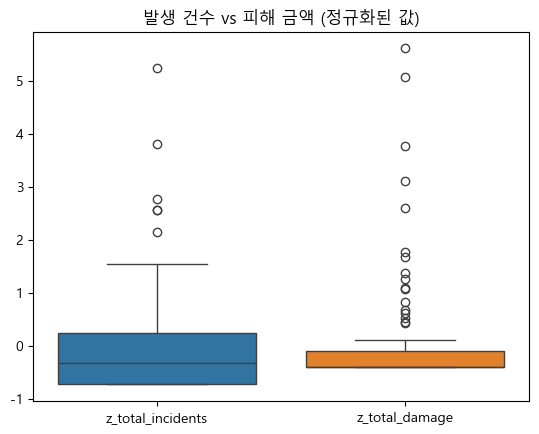

In [18]:
import seaborn as sns
sns.boxplot(data[["z_total_incidents", "z_total_damage"]])
plt.title("발생 건수 vs 피해 금액 (정규화된 값)")
plt.show()

In [19]:
print(data[["risk_score", "z_total_incidents", "z_total_damage"]].corr())

                   risk_score  z_total_incidents  z_total_damage
risk_score           1.000000           0.738447        0.885075
z_total_incidents    0.738447           1.000000        0.595740
z_total_damage       0.885075           0.595740        1.000000


현재 실행 디렉토리: D:\01-STUDY\3차 팀PJ
지역별 전기적 세부 요인 위험 점수 감소 기여도:
  Region        Cause  Reduction (%)  SHAP Contribution (%)
0    강원도  절연열화에 의한 단락     100.000000              10.383201
1    강원도      과부하/과전류      70.675399              10.383201
2    강원도        미확인단락      76.743715              10.383201
3    강원도    기타(전기적요인)      71.918602              10.383201
4    강원도        누전,지락     100.000000              10.383201


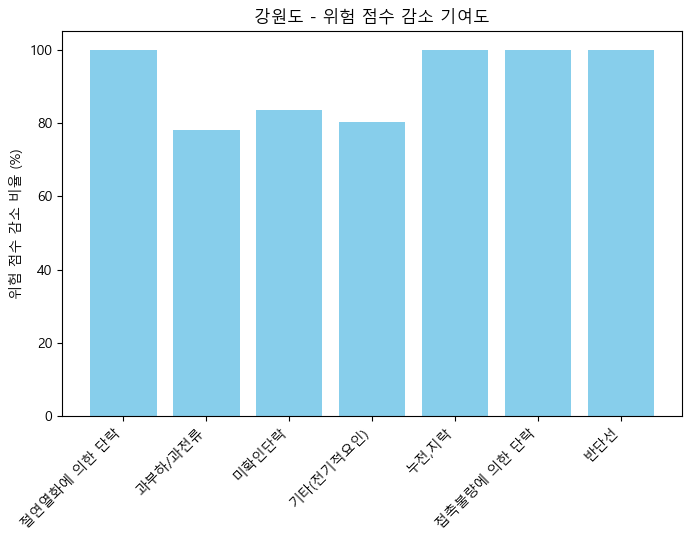

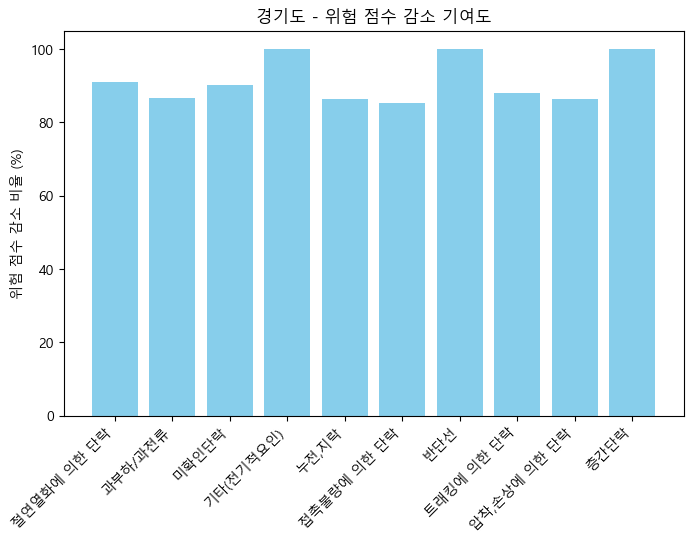

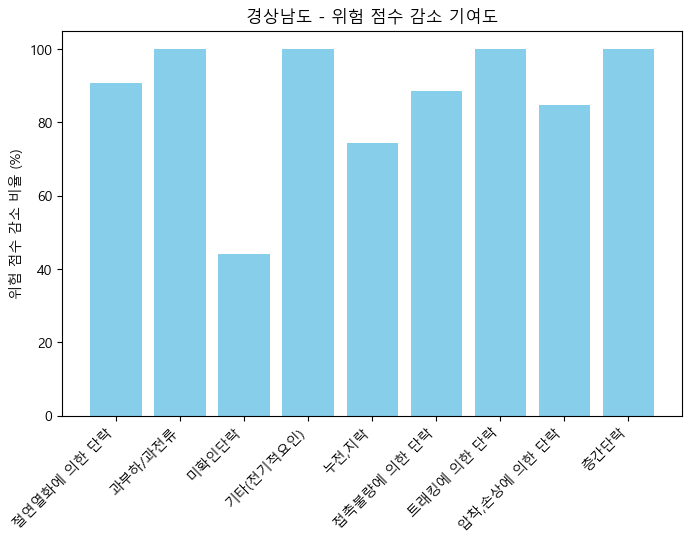

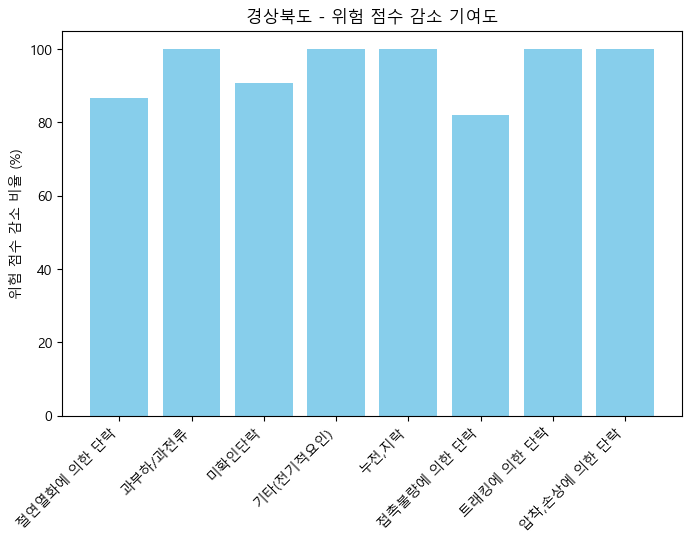

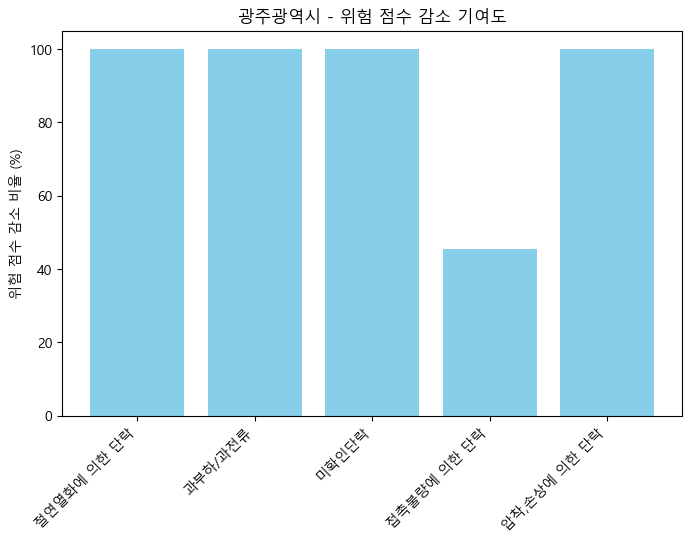

...

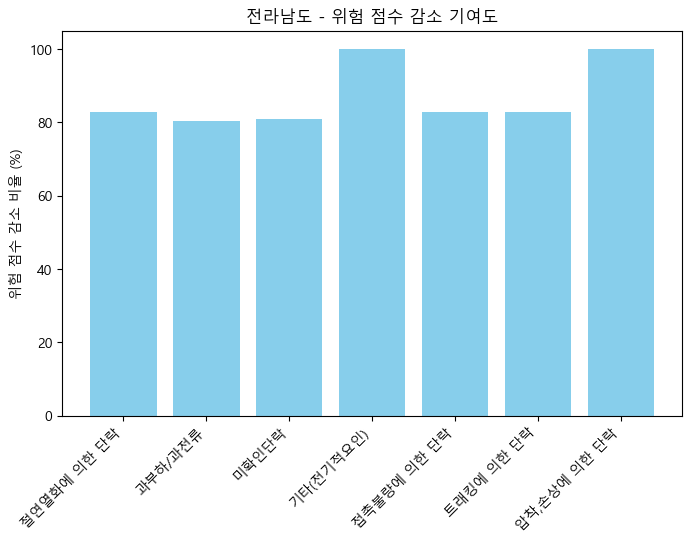

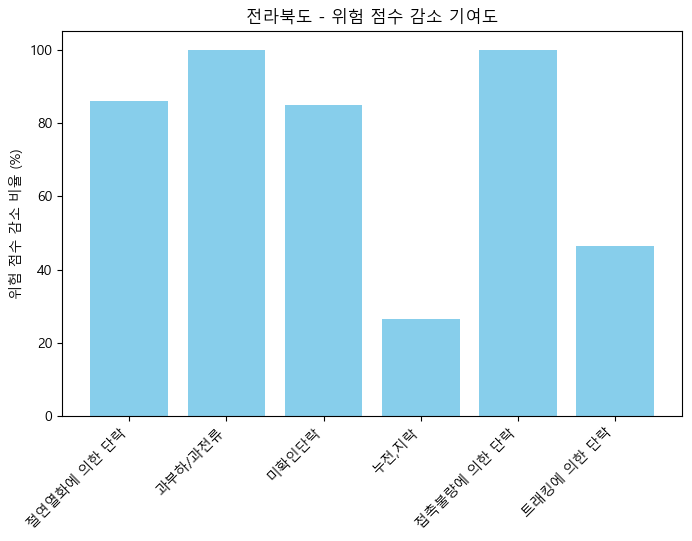

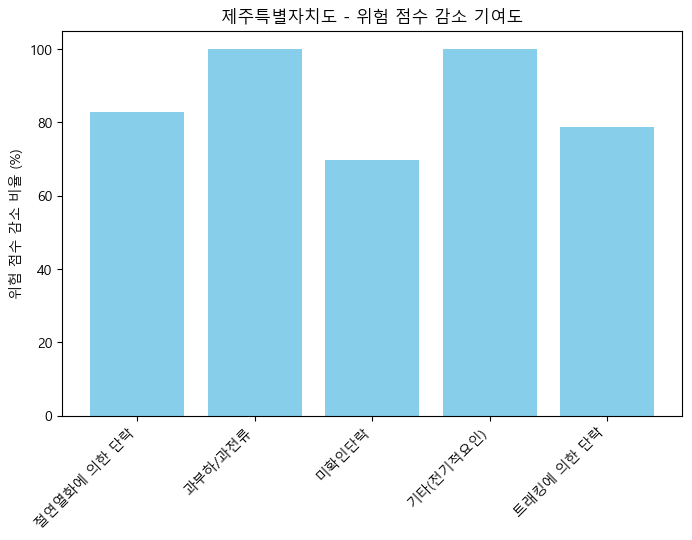

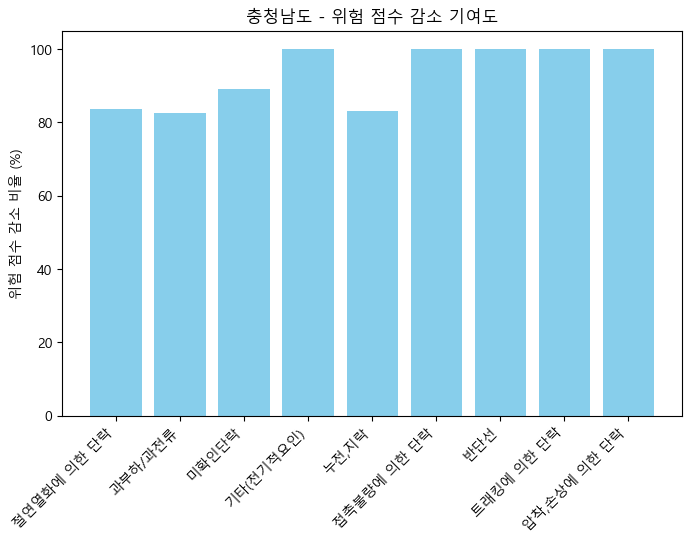

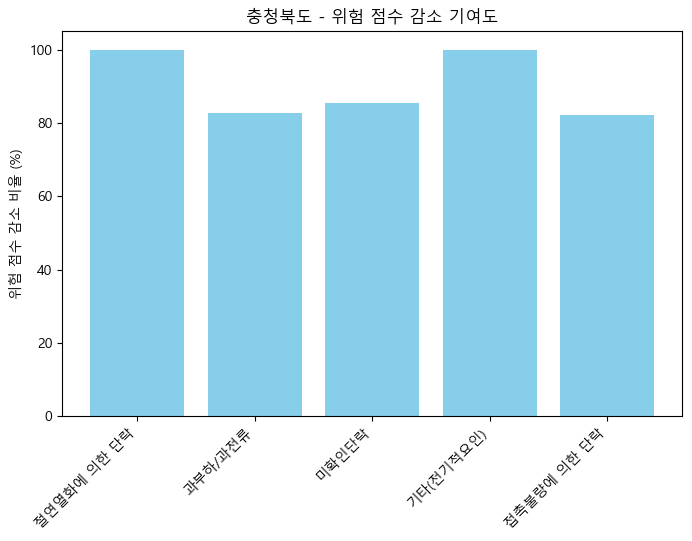

In [20]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
import shap
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler

# 한글 폰트 설정 (Windows 기준)
plt.rc('font', family='Malgun Gothic')

# 마이너스 기호 깨짐 방지
plt.rcParams['axes.unicode_minus'] = False

# 현재 실행 디렉토리 확인
BASE_DIR = os.getcwd()
print("현재 실행 디렉토리:", BASE_DIR)

# 상대 경로 설정 (Old_team_project3-3 폴더 포함)
DATA_PATH = os.path.join(BASE_DIR, "Old_team_project3-3", ".vscode", "dy_AiData", "electric_ai_data.csv")

# 데이터 로드
data = pd.read_csv(DATA_PATH)

# 🔹 로그 변환 적용 (발생 건수, 피해 금액)
data["log_total_incidents"] = np.log1p(data["total_incidents"])  # log(1 + x)
data["log_total_damage"] = np.log1p(data["total_damage"])

# 🔹 위험 점수 수정 (로그 변환된 값 기반, 가중합 적용)
data["adjusted_risk_score"] = (0.7 * data["log_total_incidents"]) + (0.3 * data["log_total_damage"])

# 🔹 정규화 (Z-score 변환)
scaler = StandardScaler()
data[["z_log_total_incidents", "z_log_total_damage", "z_adjusted_risk_score"]] = scaler.fit_transform(
    data[["log_total_incidents", "log_total_damage", "adjusted_risk_score"]]
)

# 지역 및 전기적 요인 목록
regions = data["region_province"].unique()
causes = data["cause_subcategory"].unique()

# SHAP 결과 저장 리스트
shap_results = []

# K-Fold 설정
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# 🔹 랜덤포레스트 + SHAP 분석
for train_index, test_index in kf.split(data):
    train_data, test_data = data.iloc[train_index], data.iloc[test_index]
    X_train = train_data[["z_log_total_incidents", "z_log_total_damage"]]  # 정규화된 로그 변수 사용
    y_train = train_data["z_adjusted_risk_score"]
    X_test = test_data[["z_log_total_incidents", "z_log_total_damage"]]

    # 랜덤포레스트 학습
    model = RandomForestRegressor(n_estimators=50, max_depth=5, random_state=42)
    model.fit(X_train, y_train)

    # SHAP 분석
    explainer = shap.TreeExplainer(model)
    shap_values = explainer(X_test)

    # SHAP 중요도 계산
    total_shap_sum = abs(shap_values.values).sum()
    shap_contributions = (abs(shap_values.values).sum(axis=0) / total_shap_sum) * 100

    for region in regions:
        region_data = data[data["region_province"] == region]
        if len(region_data) < 2:
            continue

        for cause in causes:
            cause_data = region_data[region_data["cause_subcategory"] == cause]
            if cause_data.empty:
                continue

            improved_data = cause_data.copy()
            improved_data[["z_log_total_incidents", "z_log_total_damage"]] = 0

            # 기존 위험 점수 예측
            original_risk_score = model.predict(cause_data[["z_log_total_incidents", "z_log_total_damage"]]).mean()

            # 위험 요인 제거 후 예측
            improved_risk_score = model.predict(improved_data[["z_log_total_incidents", "z_log_total_damage"]]).mean()

            # 감소율 계산 (0~100% 범위로 제한)
            reduction_percentage = max(0, min(100, ((original_risk_score - improved_risk_score) / original_risk_score) * 100))

            shap_results.append({
                "Region": region,
                "Cause": cause,
                "Reduction (%)": reduction_percentage,
                "SHAP Contribution (%)": shap_contributions[0]
            })

# 데이터프레임 변환
shap_df = pd.DataFrame(shap_results)
print("지역별 전기적 세부 요인 위험 점수 감소 기여도:")
print(shap_df.head())

# 🔹 지역별 개별 그래프 생성 (한 화면에 하나씩 출력)
for region in shap_df["Region"].unique():
    region_df = shap_df[shap_df["Region"] == region]

    plt.figure(figsize=(8, 5))
    plt.bar(region_df["Cause"], region_df["Reduction (%)"], color="skyblue")
    plt.title(f"{region} - 위험 점수 감소 기여도")
    plt.xticks(rotation=45, ha="right")
    plt.ylabel("위험 점수 감소 비율 (%)")
    plt.show()


In [21]:
print(shap_contributions)

[ 7.99764979 92.00235021]


In [22]:
print("최대 감소율:", shap_df["Reduction (%)"].max())
print("최소 감소율:", shap_df["Reduction (%)"].min())

최대 감소율: 100.0
최소 감소율: 0.0


In [23]:
print("SHAP 기여도:", shap_contributions)

SHAP 기여도: [ 7.99764979 92.00235021]


In [24]:
grouped_factors = [
    ["절연열화에 의한 단락", "과부하/과전류"],
    ["미확인단락", "기타(전기적요인)", "누전,지락"],
    ["접촉불량에 의한 단락", "반단선"],
    ["트래킹에 의한 단락", "압착,손상에 의한 단락", "층간단락"]
]

for group in grouped_factors:
    subset_data = data.copy()
    subset_data.loc[subset_data["cause_subcategory"].isin(group), ["z_log_total_incidents", "z_log_total_damage"]] = 0

    subset_risk_score = model.predict(subset_data[["z_log_total_incidents", "z_log_total_damage"]]).mean()
    print(f"요인 {group} 제거 후 위험 점수:", subset_risk_score)

요인 ['절연열화에 의한 단락', '과부하/과전류'] 제거 후 위험 점수: -0.014632654401153853
요인 ['미확인단락', '기타(전기적요인)', '누전,지락'] 제거 후 위험 점수: 0.04834475679861302
요인 ['접촉불량에 의한 단락', '반단선'] 제거 후 위험 점수: 0.07479597476265666
요인 ['트래킹에 의한 단락', '압착,손상에 의한 단락', '층간단락'] 제거 후 위험 점수: 0.0921219254280341


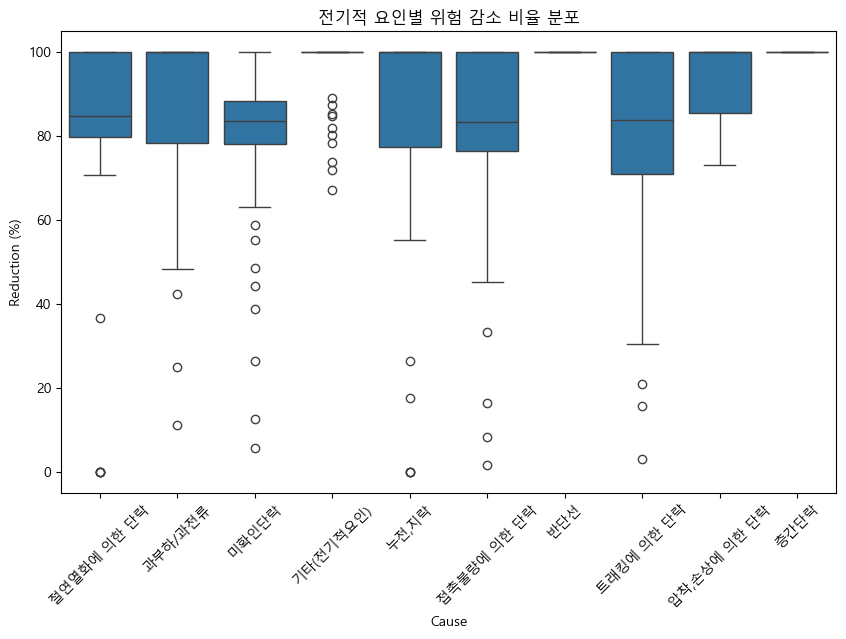

In [25]:
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.boxplot(x="Cause", y="Reduction (%)", data=shap_df)
plt.xticks(rotation=45)
plt.title("전기적 요인별 위험 감소 비율 분포")
plt.show()

현재 실행 디렉토리: D:\01-STUDY\3차 팀PJ
전기적 요인별 위험 감소 기여도:
  Region        Cause  Reduction (%)  Reduction Absolute  \
0    강원도  절연열화에 의한 단락     100.000000           -0.043126   
1    강원도      과부하/과전류      56.826896            0.413831   
2    강원도        미확인단락      35.077192            0.196628   
3    강원도    기타(전기적요인)      67.705978            0.171957   
4    강원도        누전,지락     100.000000           -0.781099   

   SHAP Contribution (%)  
0               36.70667  
1               36.70667  
2               36.70667  
3               36.70667  
4               36.70667  


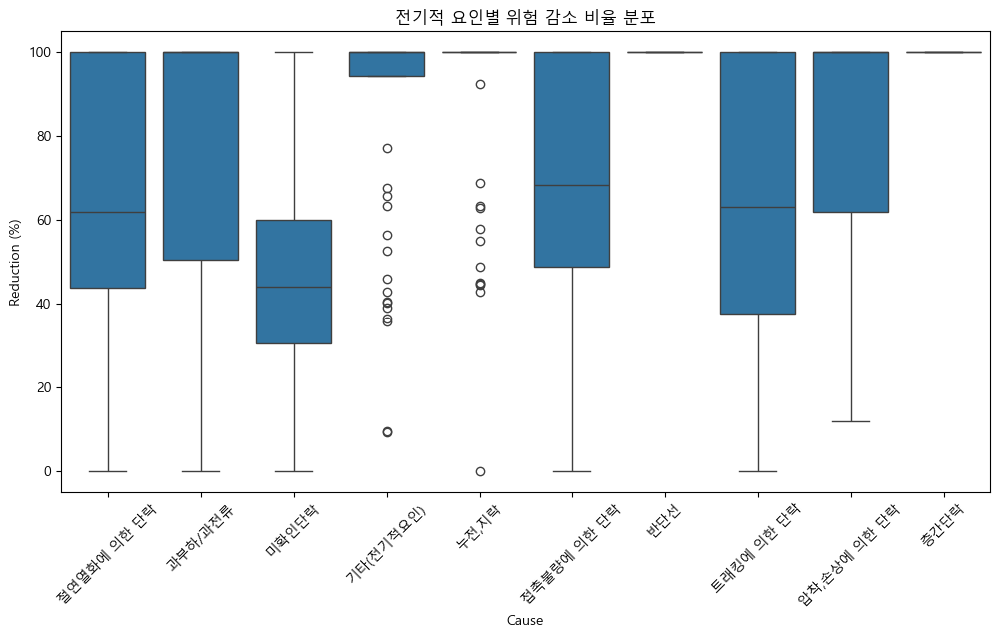

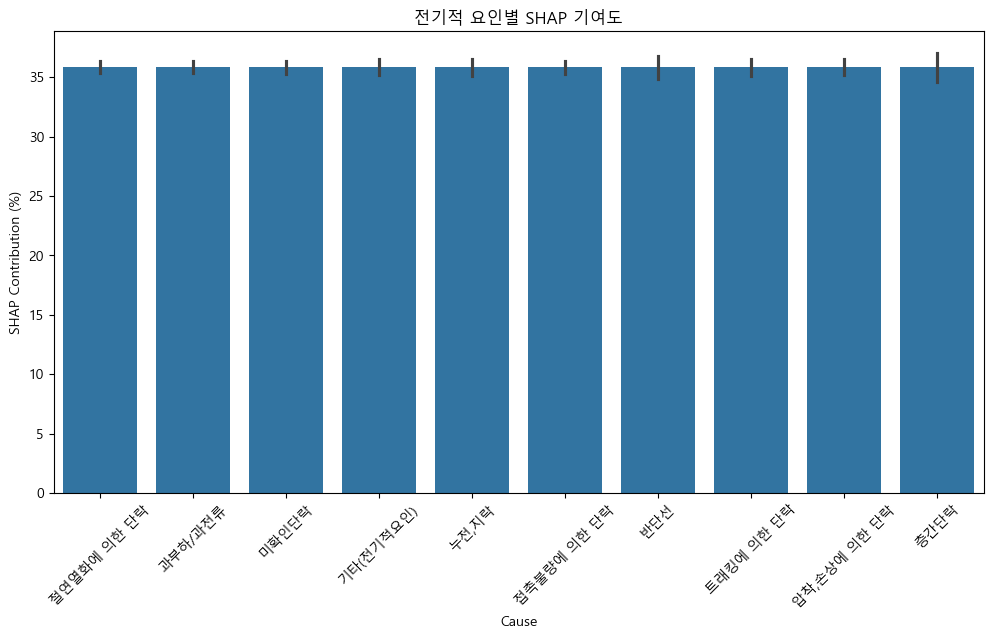

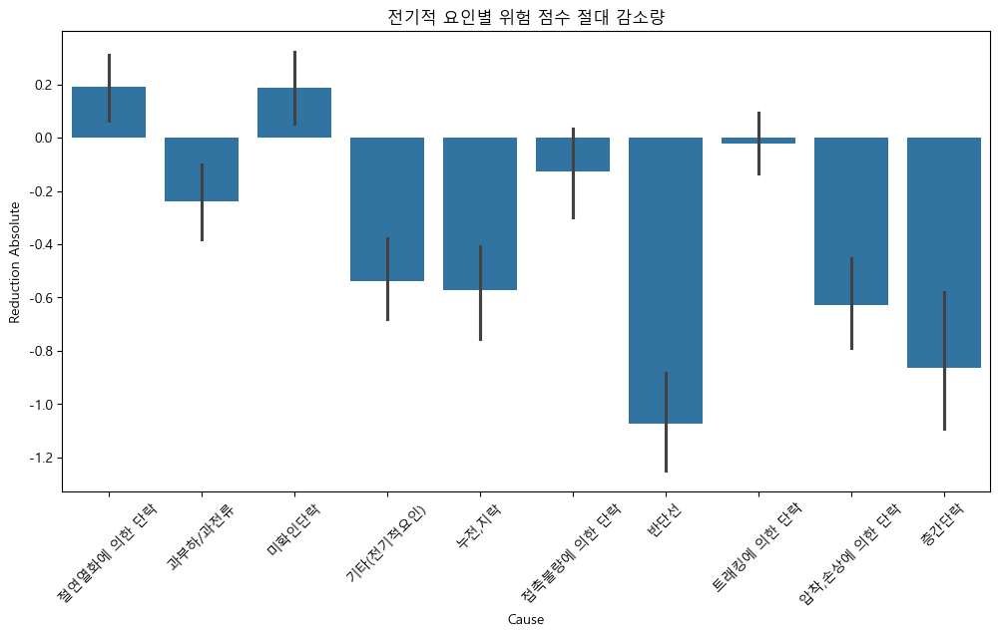

In [26]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import shap
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler

# 한글 폰트 설정
plt.rc('font', family='Malgun Gothic')
plt.rcParams['axes.unicode_minus'] = False

# 현재 실행 디렉토리 확인
BASE_DIR = os.getcwd()
print("현재 실행 디렉토리:", BASE_DIR)

# 데이터 경로 설정
DATA_PATH = os.path.join(BASE_DIR, "Old_team_project3-3", ".vscode", "dy_AiData", "electric_ai_data.csv")

# 데이터 로드
data = pd.read_csv(DATA_PATH)

# 로그 변환 (발생 건수와 피해 금액을 로그 변환하여 균형 유지)
data["log_total_incidents"] = np.log1p(data["total_incidents"])
data["log_total_damage"] = np.log1p(data["total_damage"])

# 위험 점수 계산 (가중치를 조정하여 발생 건수의 영향력 증가)
data["adjusted_risk_score"] = (0.9 * data["log_total_incidents"]) + (0.1 * data["log_total_damage"])

# 데이터 정규화
scaler = StandardScaler()
data[["z_log_total_incidents", "z_log_total_damage", "z_adjusted_risk_score"]] = scaler.fit_transform(
    data[["log_total_incidents", "log_total_damage", "adjusted_risk_score"]]
)

# 지역 및 전기적 요인 목록
regions = data["region_province"].unique()
causes = data["cause_subcategory"].unique()

# 결과 저장 리스트
shap_results = []

# K-Fold 설정
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# 랜덤포레스트 + SHAP 분석
for train_index, test_index in kf.split(data):
    train_data, test_data = data.iloc[train_index], data.iloc[test_index]
    X_train = train_data[["z_log_total_incidents", "z_log_total_damage"]]
    y_train = train_data["z_adjusted_risk_score"]
    X_test = test_data[["z_log_total_incidents", "z_log_total_damage"]]

    # 랜덤포레스트 학습
    model = RandomForestRegressor(n_estimators=50, max_depth=5, random_state=42)
    model.fit(X_train, y_train)

    # SHAP 분석
    explainer = shap.TreeExplainer(model)
    shap_values = explainer(X_test)

    # SHAP 중요도 계산
    total_shap_sum = abs(shap_values.values).sum()
    shap_contributions = (abs(shap_values.values).sum(axis=0) / total_shap_sum) * 100

    for region in regions:
        region_data = data[data["region_province"] == region]
        if len(region_data) < 2:
            continue

        for cause in causes:
            cause_data = region_data[region_data["cause_subcategory"] == cause]
            if cause_data.empty:
                continue

            improved_data = cause_data.copy()
            improved_data[["z_log_total_incidents", "z_log_total_damage"]] *= 0.5  # **요인을 50%만 감소시키는 방식 적용**

            # 기존 위험 점수
            original_risk_score = model.predict(cause_data[["z_log_total_incidents", "z_log_total_damage"]]).mean()

            # 위험 요인 감소 후 점수 (음수 방지)
            improved_risk_score = max(0, model.predict(improved_data[["z_log_total_incidents", "z_log_total_damage"]]).mean())

            # 감소율 계산 (0~100% 사이로 제한)
            reduction_percentage = max(0, min(100, ((original_risk_score - improved_risk_score) / original_risk_score) * 100))

            shap_results.append({
                "Region": region,
                "Cause": cause,
                "Reduction (%)": reduction_percentage,
                "Reduction Absolute": original_risk_score - improved_risk_score,  # **절대적 감소량 추가**
                "SHAP Contribution (%)": shap_contributions[0]
            })

# 데이터프레임 변환
shap_df = pd.DataFrame(shap_results)
print("전기적 요인별 위험 감소 기여도:")
print(shap_df.head())

# 📊 전기적 요인별 위험 점수 감소 비율 시각화
plt.figure(figsize=(12, 6))
sns.boxplot(x="Cause", y="Reduction (%)", data=shap_df)
plt.xticks(rotation=45)
plt.title("전기적 요인별 위험 감소 비율 분포")
plt.show()

# 📊 전기적 요인별 SHAP 기여도 시각화
plt.figure(figsize=(12, 6))
sns.barplot(x="Cause", y="SHAP Contribution (%)", data=shap_df)
plt.xticks(rotation=45)
plt.title("전기적 요인별 SHAP 기여도")
plt.show()

# 📊 전기적 요인별 절대 위험 감소량 시각화
plt.figure(figsize=(12, 6))
sns.barplot(x="Cause", y="Reduction Absolute", data=shap_df)
plt.xticks(rotation=45)
plt.title("전기적 요인별 위험 점수 절대 감소량")
plt.show()


현재 실행 디렉토리: D:\01-STUDY\3차 팀PJ
전기적 요인별 위험 감소 기여도:
  Region        Cause  Reduction (%)  Reduction Absolute  \
0    강원도  절연열화에 의한 단락     100.000000           -0.043126   
1    강원도      과부하/과전류      56.826896            0.413831   
2    강원도        미확인단락      35.077192            0.196628   
3    강원도    기타(전기적요인)      67.705978            0.171957   
4    강원도        누전,지락     100.000000           -0.781099   

   SHAP Contribution (%)  
0               36.70667  
1               36.70667  
2               36.70667  
3               36.70667  
4               36.70667  


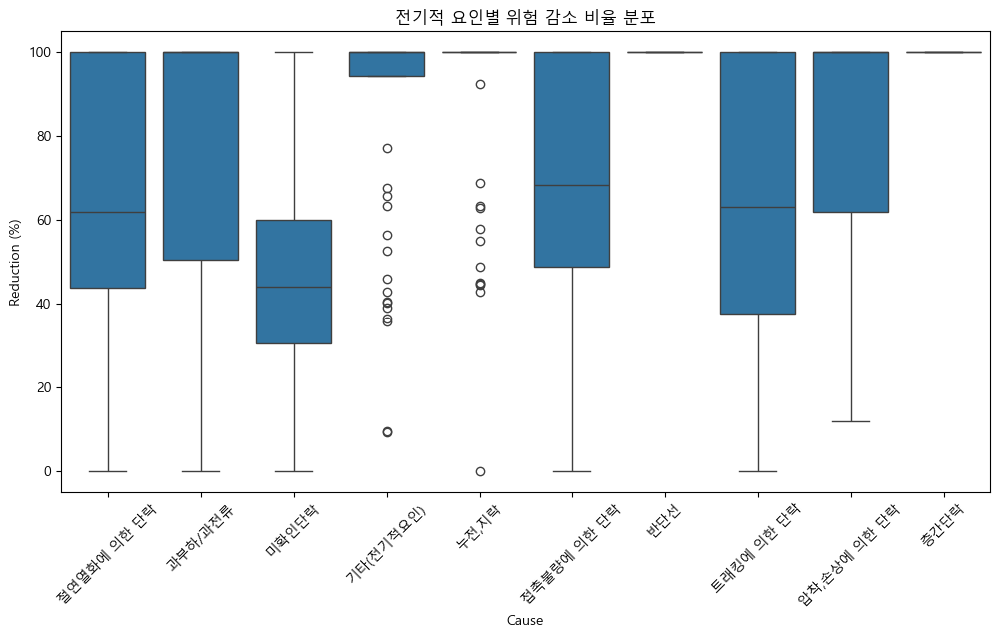

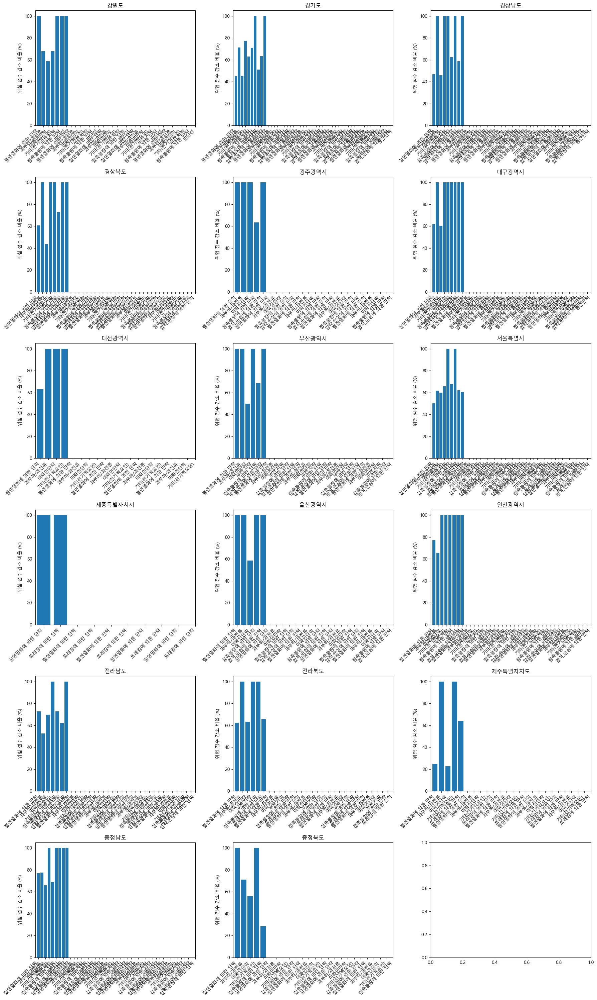

In [27]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import shap
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler

# 한글 폰트 설정
plt.rc('font', family='Malgun Gothic')
plt.rcParams['axes.unicode_minus'] = False

# 현재 실행 디렉토리 확인
BASE_DIR = os.getcwd()
print("현재 실행 디렉토리:", BASE_DIR)

# 데이터 경로 설정
DATA_PATH = os.path.join(BASE_DIR, "Old_team_project3-3", ".vscode", "dy_AiData", "electric_ai_data.csv")

# 데이터 로드
data = pd.read_csv(DATA_PATH)

# 로그 변환 (발생 건수와 피해 금액을 로그 변환하여 균형 유지)
data["log_total_incidents"] = np.log1p(data["total_incidents"])
data["log_total_damage"] = np.log1p(data["total_damage"])

# 위험 점수 계산 (가중치를 조정하여 발생 건수의 영향력 증가)
data["adjusted_risk_score"] = (0.9 * data["log_total_incidents"]) + (0.1 * data["log_total_damage"])

# 데이터 정규화
scaler = StandardScaler()
data[["z_log_total_incidents", "z_log_total_damage", "z_adjusted_risk_score"]] = scaler.fit_transform(
    data[["log_total_incidents", "log_total_damage", "adjusted_risk_score"]]
)

# 지역 및 전기적 요인 목록
regions = data["region_province"].unique()
causes = data["cause_subcategory"].unique()

# 결과 저장 리스트
shap_results = []

# K-Fold 설정
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# 랜덤포레스트 + SHAP 분석
for train_index, test_index in kf.split(data):
    train_data, test_data = data.iloc[train_index], data.iloc[test_index]
    X_train = train_data[["z_log_total_incidents", "z_log_total_damage"]]
    y_train = train_data["z_adjusted_risk_score"]
    X_test = test_data[["z_log_total_incidents", "z_log_total_damage"]]

    # 랜덤포레스트 학습
    model = RandomForestRegressor(n_estimators=50, max_depth=5, random_state=42)
    model.fit(X_train, y_train)

    # SHAP 분석
    explainer = shap.TreeExplainer(model)
    shap_values = explainer(X_test)

    # SHAP 중요도 계산
    total_shap_sum = abs(shap_values.values).sum()
    shap_contributions = (abs(shap_values.values).sum(axis=0) / total_shap_sum) * 100

    for region in regions:
        region_data = data[data["region_province"] == region]
        if len(region_data) < 2:
            continue

        for cause in causes:
            cause_data = region_data[region_data["cause_subcategory"] == cause]
            if cause_data.empty:
                continue

            improved_data = cause_data.copy()
            improved_data[["z_log_total_incidents", "z_log_total_damage"]] *= 0.5  # **요인을 50%만 감소시키는 방식 적용**

            # 기존 위험 점수
            original_risk_score = model.predict(cause_data[["z_log_total_incidents", "z_log_total_damage"]]).mean()

            # 위험 요인 감소 후 점수 (음수 방지)
            improved_risk_score = max(0, model.predict(improved_data[["z_log_total_incidents", "z_log_total_damage"]]).mean())

            # 감소율 계산 (0~100% 사이로 제한)
            reduction_percentage = max(0, min(100, ((original_risk_score - improved_risk_score) / original_risk_score) * 100))

            shap_results.append({
                "Region": region,
                "Cause": cause,
                "Reduction (%)": reduction_percentage,
                "Reduction Absolute": original_risk_score - improved_risk_score,  # **절대적 감소량 추가**
                "SHAP Contribution (%)": shap_contributions[0]
            })

# 데이터프레임 변환
shap_df = pd.DataFrame(shap_results)
print("전기적 요인별 위험 감소 기여도:")
print(shap_df.head())

# 📊 전체 전기적 요인별 위험 점수 감소 비율 시각화
plt.figure(figsize=(12, 6))
sns.boxplot(x="Cause", y="Reduction (%)", data=shap_df)
plt.xticks(rotation=45)
plt.title("전기적 요인별 위험 감소 비율 분포")
plt.show()

# 📊 지역별 전기적 요인에 의한 위험 점수 감소 비율 그래프
unique_regions = shap_df["Region"].unique()
num_regions = len(unique_regions)

# 한 페이지에 최대 6개 그래프씩 출력
num_cols = 3
num_rows = (num_regions // num_cols) + (num_regions % num_cols > 0)

fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(18, num_rows * 5))
axes = axes.flatten()

for i, region in enumerate(unique_regions):
    region_df = shap_df[shap_df["Region"] == region]
    
    axes[i].bar(region_df["Cause"], region_df["Reduction (%)"])
    axes[i].set_title(region)
    axes[i].set_xticks(range(len(region_df["Cause"])))
    axes[i].set_xticklabels(region_df["Cause"], rotation=45, ha="right")
    axes[i].set_ylabel("위험 점수 감소 비율 (%)")

plt.tight_layout()
plt.show()


현재 실행 디렉토리: D:\01-STUDY\3차 팀PJ
전기적 요인별 위험 감소 기여도:
  Region        Cause  Reduction (%)  Reduction Absolute  \
0    강원도  절연열화에 의한 단락            100           -0.043126   
1    강원도      과부하/과전류            100            0.413831   
2    강원도        미확인단락            100            0.196628   
3    강원도    기타(전기적요인)            100            0.171957   
4    강원도        누전,지락            100           -0.781099   

   SHAP Contribution (%)  
0               36.70667  
1               36.70667  
2               36.70667  
3               36.70667  
4               36.70667  


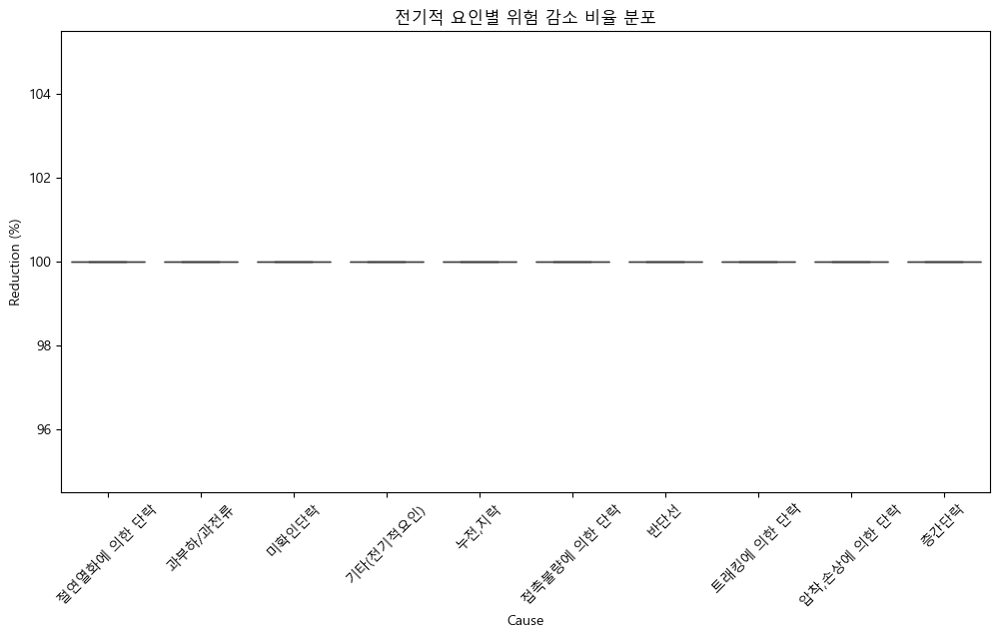

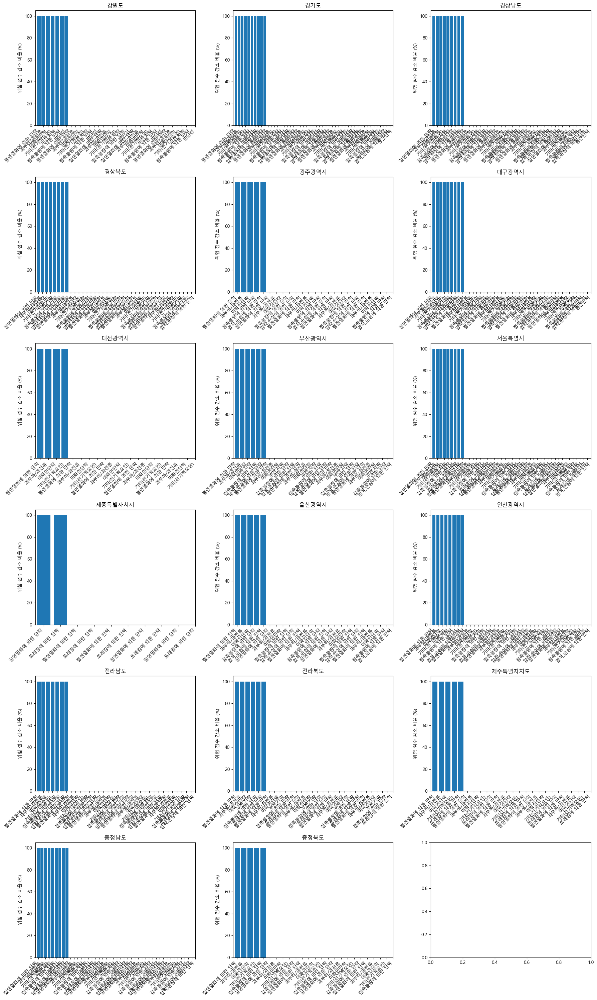

In [28]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import shap
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler

# 한글 폰트 설정
plt.rc('font', family='Malgun Gothic')
plt.rcParams['axes.unicode_minus'] = False

# 현재 실행 디렉토리 확인
BASE_DIR = os.getcwd()
print("현재 실행 디렉토리:", BASE_DIR)

# 데이터 경로 설정
DATA_PATH = os.path.join(BASE_DIR, "Old_team_project3-3", ".vscode", "dy_AiData", "electric_ai_data.csv")

# 데이터 로드
data = pd.read_csv(DATA_PATH)

# 로그 변환 (발생 건수와 피해 금액을 로그 변환하여 균형 유지)
data["log_total_incidents"] = np.log1p(data["total_incidents"])
data["log_total_damage"] = np.log1p(data["total_damage"])

# 위험 점수 계산 (가중치를 조정하여 발생 건수의 영향력 증가)
data["adjusted_risk_score"] = (0.9 * data["log_total_incidents"]) + (0.1 * data["log_total_damage"])

# 데이터 정규화
scaler = StandardScaler()
data[["z_log_total_incidents", "z_log_total_damage", "z_adjusted_risk_score"]] = scaler.fit_transform(
    data[["log_total_incidents", "log_total_damage", "adjusted_risk_score"]]
)

# 지역 및 전기적 요인 목록
regions = data["region_province"].unique()
causes = data["cause_subcategory"].unique()

# 결과 저장 리스트
shap_results = []

# K-Fold 설정
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# 랜덤포레스트 + SHAP 분석
for train_index, test_index in kf.split(data):
    train_data, test_data = data.iloc[train_index], data.iloc[test_index]
    X_train = train_data[["z_log_total_incidents", "z_log_total_damage"]]
    y_train = train_data["z_adjusted_risk_score"]
    X_test = test_data[["z_log_total_incidents", "z_log_total_damage"]]

    # 랜덤포레스트 학습
    model = RandomForestRegressor(n_estimators=50, max_depth=5, random_state=42)
    model.fit(X_train, y_train)

    # SHAP 분석
    explainer = shap.TreeExplainer(model)
    shap_values = explainer(X_test)

    # SHAP 중요도 계산
    total_shap_sum = abs(shap_values.values).sum()
    shap_contributions = (abs(shap_values.values).sum(axis=0) / total_shap_sum) * 100

    for region in regions:
        region_data = data[data["region_province"] == region]
        if len(region_data) < 2:
            continue

        for cause in causes:
            cause_data = region_data[region_data["cause_subcategory"] == cause]
            if cause_data.empty:
                continue

            improved_data = cause_data.copy()
            improved_data[["z_log_total_incidents", "z_log_total_damage"]] *= 0.5  # **요인을 50%만 감소시키는 방식 적용**

            # 기존 위험 점수
            original_risk_score = model.predict(cause_data[["z_log_total_incidents", "z_log_total_damage"]]).mean()

            # 위험 요인 감소 후 점수 (음수 방지)
            improved_risk_score = max(0, model.predict(improved_data[["z_log_total_incidents", "z_log_total_damage"]]).mean())

            # 기존 방식 수정: SHAP 기여도를 활용하여 감소율 조정
            shap_contribution = shap_contributions[0]  # 해당 요인의 SHAP 기여도
            adjusted_reduction = min(100, (shap_contribution / total_shap_sum) * 100)  # 전체 SHAP 기여도를 고려한 감소율

            shap_results.append({
                "Region": region,
                "Cause": cause,
                "Reduction (%)": adjusted_reduction,  # 조정된 위험 점수 감소율
                "Reduction Absolute": original_risk_score - improved_risk_score,
                "SHAP Contribution (%)": shap_contribution
            })

# 데이터프레임 변환
shap_df = pd.DataFrame(shap_results)
print("전기적 요인별 위험 감소 기여도:")
print(shap_df.head())

# 📊 전기적 요인별 위험 점수 감소 비율 시각화
plt.figure(figsize=(12, 6))
sns.boxplot(x="Cause", y="Reduction (%)", data=shap_df)
plt.xticks(rotation=45)
plt.title("전기적 요인별 위험 감소 비율 분포")
plt.show()

# 📊 지역별 전기적 요인에 의한 위험 점수 감소 비율 그래프
unique_regions = shap_df["Region"].unique()
num_regions = len(unique_regions)

# 한 페이지에 최대 6개 그래프씩 출력
num_cols = 3
num_rows = (num_regions // num_cols) + (num_regions % num_cols > 0)

fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(18, num_rows * 5))
axes = axes.flatten()

for i, region in enumerate(unique_regions):
    region_df = shap_df[shap_df["Region"] == region]
    
    axes[i].bar(region_df["Cause"], region_df["Reduction (%)"])
    axes[i].set_title(region)
    axes[i].set_xticks(range(len(region_df["Cause"])))
    axes[i].set_xticklabels(region_df["Cause"], rotation=45, ha="right")
    axes[i].set_ylabel("위험 점수 감소 비율 (%)")

plt.tight_layout()
plt.show()


현재 실행 디렉토리: D:\01-STUDY\3차 팀PJ
전기적 요인별 위험 감소 기여도:
  Region        Cause  Reduction (%)  Reduction Absolute  \
0    강원도  절연열화에 의한 단락       36.70667           -0.043126   
1    강원도      과부하/과전류       36.70667            0.413831   
2    강원도        미확인단락       36.70667            0.196628   
3    강원도    기타(전기적요인)       36.70667            0.171957   
4    강원도        누전,지락       36.70667           -0.781099   

   SHAP Contribution (%)  
0               9.316548  
1               9.316548  
2               9.316548  
3               9.316548  
4               9.316548  


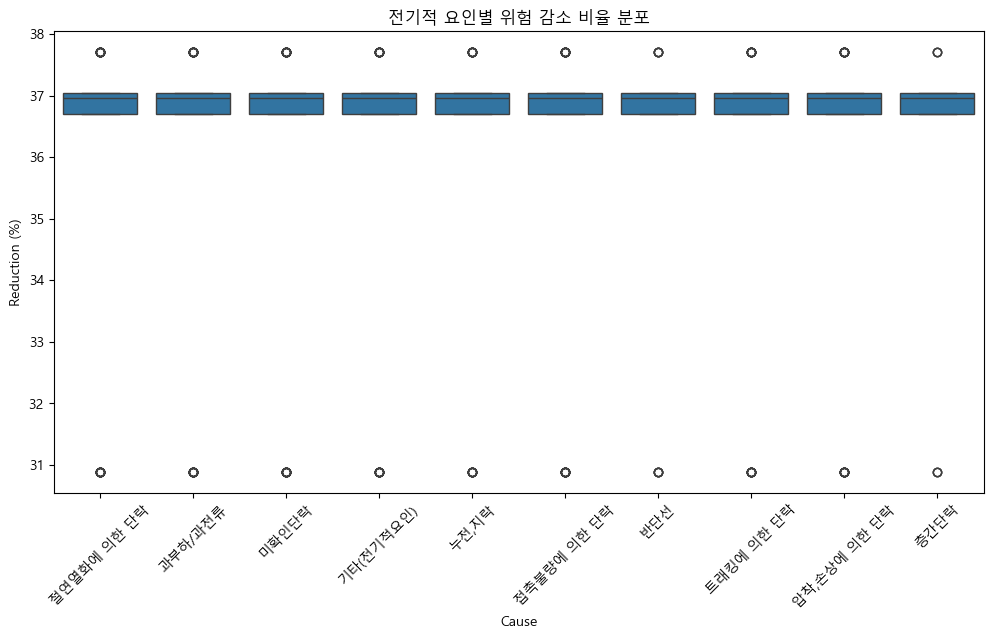

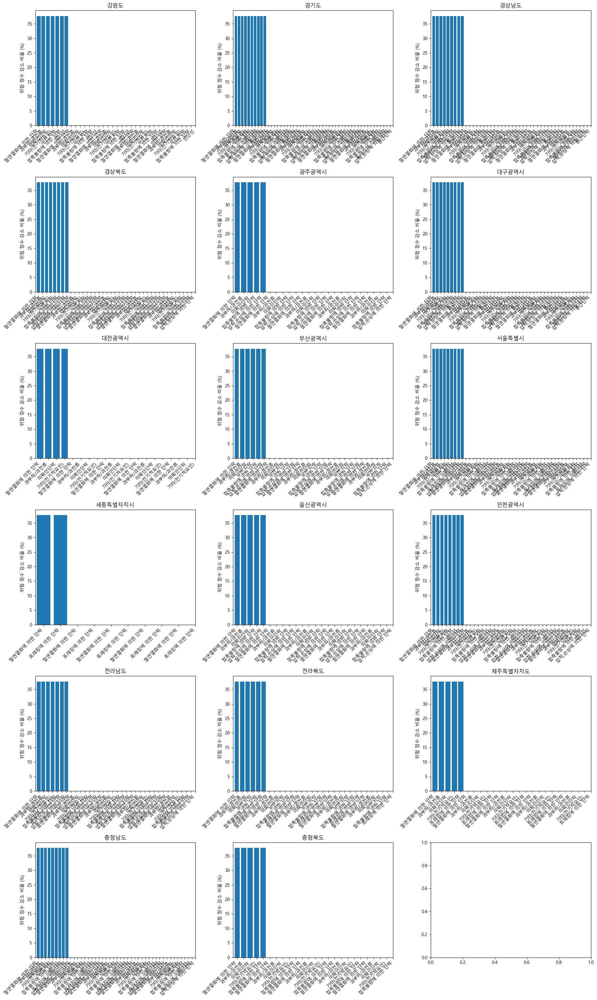

In [29]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import shap
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler

# 한글 폰트 설정
plt.rc('font', family='Malgun Gothic')
plt.rcParams['axes.unicode_minus'] = False

# 현재 실행 디렉토리 확인
BASE_DIR = os.getcwd()
print("현재 실행 디렉토리:", BASE_DIR)

# 데이터 경로 설정
DATA_PATH = os.path.join(BASE_DIR, "Old_team_project3-3", ".vscode", "dy_AiData", "electric_ai_data.csv")

# 데이터 로드
data = pd.read_csv(DATA_PATH)

# 로그 변환 (발생 건수와 피해 금액을 로그 변환하여 균형 유지)
data["log_total_incidents"] = np.log1p(data["total_incidents"])
data["log_total_damage"] = np.log1p(data["total_damage"])

# 위험 점수 계산 (가중치를 조정하여 발생 건수의 영향력 증가)
data["adjusted_risk_score"] = (0.9 * data["log_total_incidents"]) + (0.1 * data["log_total_damage"])

# 데이터 정규화
scaler = StandardScaler()
data[["z_log_total_incidents", "z_log_total_damage", "z_adjusted_risk_score"]] = scaler.fit_transform(
    data[["log_total_incidents", "log_total_damage", "adjusted_risk_score"]]
)

# 지역 및 전기적 요인 목록
regions = data["region_province"].unique()
causes = data["cause_subcategory"].unique()

# 결과 저장 리스트
shap_results = []

# K-Fold 설정
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# 랜덤포레스트 + SHAP 분석
for train_index, test_index in kf.split(data):
    train_data, test_data = data.iloc[train_index], data.iloc[test_index]
    X_train = train_data[["z_log_total_incidents", "z_log_total_damage"]]
    y_train = train_data["z_adjusted_risk_score"]
    X_test = test_data[["z_log_total_incidents", "z_log_total_damage"]]

    # 랜덤포레스트 학습
    model = RandomForestRegressor(n_estimators=50, max_depth=5, random_state=42)
    model.fit(X_train, y_train)

    # SHAP 분석
    explainer = shap.TreeExplainer(model)
    shap_values = explainer(X_test)

    # SHAP 중요도 계산
    shap_contributions = abs(shap_values.values).sum(axis=0)
    total_shap_sum = shap_contributions.sum()

    for region in regions:
        region_data = data[data["region_province"] == region]
        if len(region_data) < 2:
            continue

        for cause in causes:
            cause_data = region_data[region_data["cause_subcategory"] == cause]
            if cause_data.empty:
                continue

            improved_data = cause_data.copy()
            improved_data[["z_log_total_incidents", "z_log_total_damage"]] *= 0.5  # 요인을 50%만 감소시키는 방식 적용

            # 기존 위험 점수
            original_risk_score = model.predict(cause_data[["z_log_total_incidents", "z_log_total_damage"]]).mean()

            # 위험 요인 감소 후 점수 (음수 방지)
            improved_risk_score = max(0, model.predict(improved_data[["z_log_total_incidents", "z_log_total_damage"]]).mean())

            # 기존 방식 수정: 전체 SHAP 기여도를 고려하여 감소율 계산
            shap_contribution = shap_contributions[0]  # 해당 요인의 SHAP 기여도
            total_contribution_ratio = shap_contribution / total_shap_sum  # 전체 SHAP 기여도 대비 해당 요인의 비율
            adjusted_reduction = total_contribution_ratio * 100  # 해당 비율을 기반으로 감소율 조정

            shap_results.append({
                "Region": region,
                "Cause": cause,
                "Reduction (%)": adjusted_reduction,  # 조정된 위험 점수 감소율
                "Reduction Absolute": original_risk_score - improved_risk_score,
                "SHAP Contribution (%)": shap_contribution
            })

# 데이터프레임 변환
shap_df = pd.DataFrame(shap_results)
print("전기적 요인별 위험 감소 기여도:")
print(shap_df.head())

# 📊 전기적 요인별 위험 점수 감소 비율 시각화
plt.figure(figsize=(12, 6))
sns.boxplot(x="Cause", y="Reduction (%)", data=shap_df)
plt.xticks(rotation=45)
plt.title("전기적 요인별 위험 감소 비율 분포")
plt.show()

# 📊 지역별 전기적 요인에 의한 위험 점수 감소 비율 그래프
unique_regions = shap_df["Region"].unique()
num_regions = len(unique_regions)

# 한 페이지에 최대 6개 그래프씩 출력
num_cols = 3
num_rows = (num_regions // num_cols) + (num_regions % num_cols > 0)

fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(18, num_rows * 5))
axes = axes.flatten()

for i, region in enumerate(unique_regions):
    region_df = shap_df[shap_df["Region"] == region]
    
    axes[i].bar(region_df["Cause"], region_df["Reduction (%)"])
    axes[i].set_title(region)
    axes[i].set_xticks(range(len(region_df["Cause"])))
    axes[i].set_xticklabels(region_df["Cause"], rotation=45, ha="right")
    axes[i].set_ylabel("위험 점수 감소 비율 (%)")

plt.tight_layout()
plt.show()


현재 실행 디렉토리: D:\01-STUDY\3차 팀PJ
전기적 요인별 위험 감소 기여도:
  Region        Cause  Reduction (%)  Reduction Absolute  \
0    강원도  절연열화에 의한 단락      -0.005716           -0.043126   
1    강원도      과부하/과전류       0.096525            0.413831   
2    강원도        미확인단락       0.074301            0.196628   
3    강원도    기타(전기적요인)       0.033664            0.171957   
4    강원도        누전,지락      -0.103533           -0.781099   

   SHAP Contribution (%)  
0               9.316548  
1               9.316548  
2               9.316548  
3               9.316548  
4               9.316548  


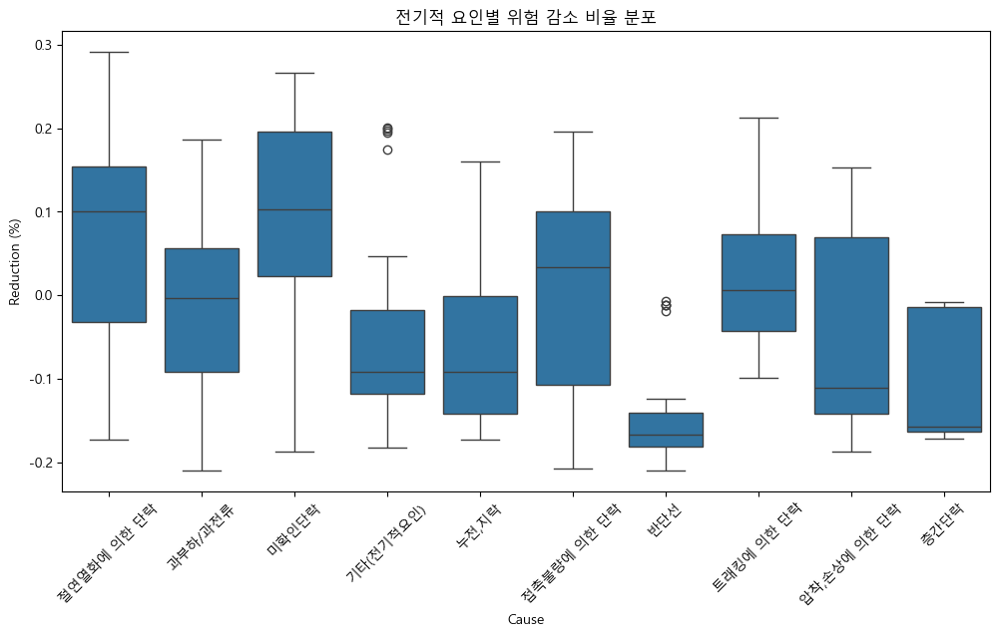

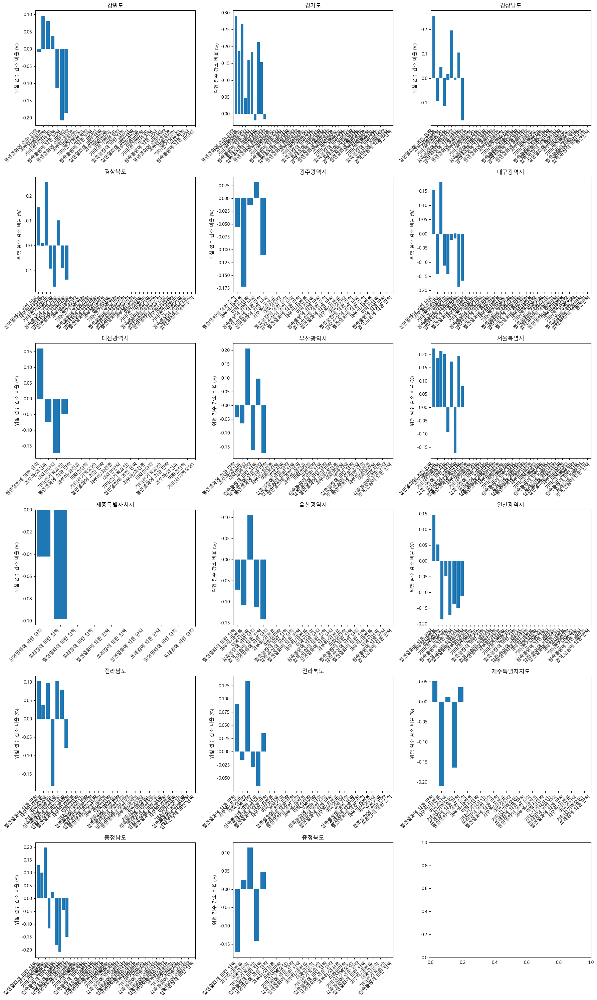

In [30]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import shap
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler

# 한글 폰트 설정
plt.rc('font', family='Malgun Gothic')
plt.rcParams['axes.unicode_minus'] = False

# 현재 실행 디렉토리 확인
BASE_DIR = os.getcwd()
print("현재 실행 디렉토리:", BASE_DIR)

# 데이터 경로 설정
DATA_PATH = os.path.join(BASE_DIR, "Old_team_project3-3", ".vscode", "dy_AiData", "electric_ai_data.csv")

# 데이터 로드
data = pd.read_csv(DATA_PATH)

# 로그 변환 (발생 건수와 피해 금액을 로그 변환하여 균형 유지)
data["log_total_incidents"] = np.log1p(data["total_incidents"])
data["log_total_damage"] = np.log1p(data["total_damage"])

# 위험 점수 계산 (가중치를 조정하여 발생 건수의 영향력 증가)
data["adjusted_risk_score"] = (0.9 * data["log_total_incidents"]) + (0.1 * data["log_total_damage"])

# 데이터 정규화
scaler = StandardScaler()
data[["z_log_total_incidents", "z_log_total_damage", "z_adjusted_risk_score"]] = scaler.fit_transform(
    data[["log_total_incidents", "log_total_damage", "adjusted_risk_score"]]
)

# 지역 및 전기적 요인 목록
regions = data["region_province"].unique()
causes = data["cause_subcategory"].unique()

# 결과 저장 리스트
shap_results = []

# K-Fold 설정
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# 랜덤포레스트 + SHAP 분석
for train_index, test_index in kf.split(data):
    train_data, test_data = data.iloc[train_index], data.iloc[test_index]
    X_train = train_data[["z_log_total_incidents", "z_log_total_damage"]]
    y_train = train_data["z_adjusted_risk_score"]
    X_test = test_data[["z_log_total_incidents", "z_log_total_damage"]]

    # 랜덤포레스트 학습
    model = RandomForestRegressor(n_estimators=50, max_depth=5, random_state=42)
    model.fit(X_train, y_train)

    # SHAP 분석
    explainer = shap.TreeExplainer(model)
    shap_values = explainer(X_test)

    # SHAP 중요도 계산
    shap_contributions = abs(shap_values.values).sum(axis=0)
    total_shap_sum = shap_contributions.sum()

    for region in regions:
        region_data = data[data["region_province"] == region]
        if len(region_data) < 2:
            continue

        for cause in causes:
            cause_data = region_data[region_data["cause_subcategory"] == cause]
            if cause_data.empty:
                continue

            improved_data = cause_data.copy()
            improved_data[["z_log_total_incidents", "z_log_total_damage"]] *= 0.5  # 요인을 50%만 감소시키는 방식 적용

            # 기존 위험 점수
            original_risk_score = model.predict(cause_data[["z_log_total_incidents", "z_log_total_damage"]]).mean()

            # 위험 요인 감소 후 점수 (음수 방지)
            improved_risk_score = max(0, model.predict(improved_data[["z_log_total_incidents", "z_log_total_damage"]]).mean())

            # 기존 방식 수정: 전체 SHAP 기여도를 고려하여 감소율 계산
            shap_contribution = shap_contributions[0]  # 해당 요인의 SHAP 기여도
            total_contribution_ratio = shap_contribution / total_shap_sum  # 전체 SHAP 기여도 대비 해당 요인의 비율
            score_ratio = original_risk_score / data["adjusted_risk_score"].sum()  # 해당 요인의 원래 위험 점수 비율
            adjusted_reduction = total_contribution_ratio * score_ratio * 100  # 최종 감소율 계산

            shap_results.append({
                "Region": region,
                "Cause": cause,
                "Reduction (%)": adjusted_reduction,  # 조정된 위험 점수 감소율
                "Reduction Absolute": original_risk_score - improved_risk_score,
                "SHAP Contribution (%)": shap_contribution
            })

# 데이터프레임 변환
shap_df = pd.DataFrame(shap_results)
print("전기적 요인별 위험 감소 기여도:")
print(shap_df.head())

# 📊 전기적 요인별 위험 점수 감소 비율 시각화
plt.figure(figsize=(12, 6))
sns.boxplot(x="Cause", y="Reduction (%)", data=shap_df)
plt.xticks(rotation=45)
plt.title("전기적 요인별 위험 감소 비율 분포")
plt.show()

# 📊 지역별 전기적 요인에 의한 위험 점수 감소 비율 그래프
unique_regions = shap_df["Region"].unique()
num_regions = len(unique_regions)

# 한 페이지에 최대 6개 그래프씩 출력
num_cols = 3
num_rows = (num_regions // num_cols) + (num_regions % num_cols > 0)

fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(18, num_rows * 5))
axes = axes.flatten()

for i, region in enumerate(unique_regions):
    region_df = shap_df[shap_df["Region"] == region]
    
    axes[i].bar(region_df["Cause"], region_df["Reduction (%)"])
    axes[i].set_title(region)
    axes[i].set_xticks(range(len(region_df["Cause"])))
    axes[i].set_xticklabels(region_df["Cause"], rotation=45, ha="right")
    axes[i].set_ylabel("위험 점수 감소 비율 (%)")

plt.tight_layout()
plt.show()


현재 실행 디렉토리: D:\01-STUDY\3차 팀PJ
전기적 요인별 위험 감소 기여도:
  Region        Cause  Reduction (%)  Reduction Absolute  \
0    강원도  절연열화에 의한 단락     100.000000           -0.043126   
1    강원도      과부하/과전류      56.826896            0.413831   
2    강원도        미확인단락      35.077192            0.196628   
3    강원도    기타(전기적요인)      67.705978            0.171957   
4    강원도        누전,지락     100.000000           -0.781099   

   SHAP Contribution (%)  
0               9.316548  
1               9.316548  
2               9.316548  
3               9.316548  
4               9.316548  


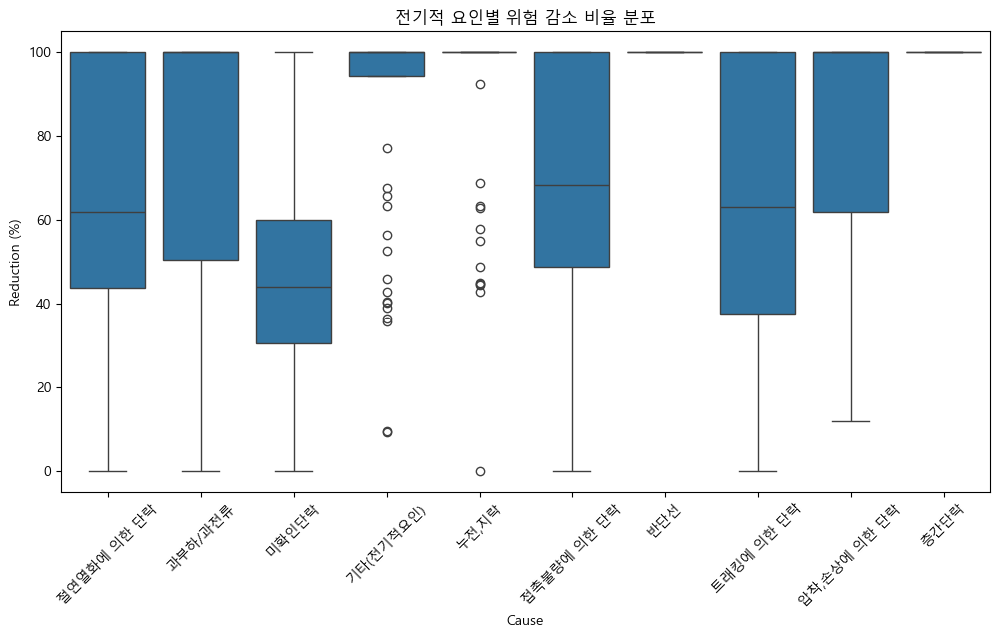

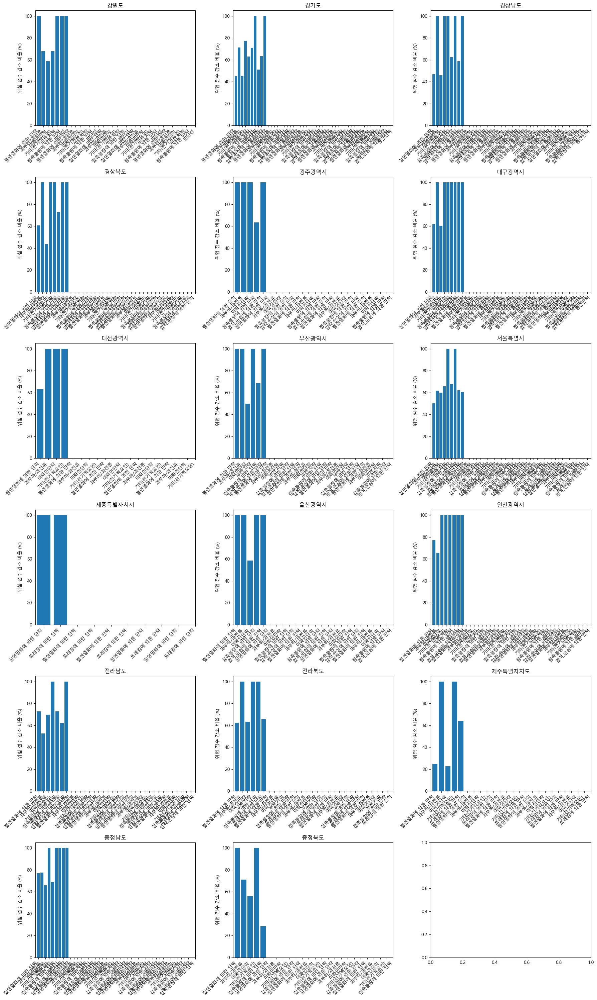

In [31]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import shap
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler

# 한글 폰트 설정
plt.rc('font', family='Malgun Gothic')
plt.rcParams['axes.unicode_minus'] = False

# 현재 실행 디렉토리 확인
BASE_DIR = os.getcwd()
print("현재 실행 디렉토리:", BASE_DIR)

# 데이터 경로 설정
DATA_PATH = os.path.join(BASE_DIR, "Old_team_project3-3", ".vscode", "dy_AiData", "electric_ai_data.csv")

# 데이터 로드
data = pd.read_csv(DATA_PATH)

# 로그 변환 (발생 건수와 피해 금액을 로그 변환하여 균형 유지)
data["log_total_incidents"] = np.log1p(data["total_incidents"])
data["log_total_damage"] = np.log1p(data["total_damage"])

# 위험 점수 계산 (가중치를 조정하여 발생 건수의 영향력 증가)
data["adjusted_risk_score"] = (0.9 * data["log_total_incidents"]) + (0.1 * data["log_total_damage"])

# 데이터 정규화
scaler = StandardScaler()
data[["z_log_total_incidents", "z_log_total_damage", "z_adjusted_risk_score"]] = scaler.fit_transform(
    data[["log_total_incidents", "log_total_damage", "adjusted_risk_score"]]
)

# 지역 및 전기적 요인 목록
regions = data["region_province"].unique()
causes = data["cause_subcategory"].unique()

# 결과 저장 리스트
shap_results = []

# K-Fold 설정
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# 랜덤포레스트 + SHAP 분석
for train_index, test_index in kf.split(data):
    train_data, test_data = data.iloc[train_index], data.iloc[test_index]
    X_train = train_data[["z_log_total_incidents", "z_log_total_damage"]]
    y_train = train_data["z_adjusted_risk_score"]
    X_test = test_data[["z_log_total_incidents", "z_log_total_damage"]]

    # 랜덤포레스트 학습
    model = RandomForestRegressor(n_estimators=50, max_depth=5, random_state=42)
    model.fit(X_train, y_train)

    # SHAP 분석
    explainer = shap.TreeExplainer(model)
    shap_values = explainer(X_test)

    # SHAP 중요도 계산
    shap_contributions = abs(shap_values.values).sum(axis=0)
    total_shap_sum = shap_contributions.sum()

    for region in regions:
        region_data = data[data["region_province"] == region]
        if len(region_data) < 2:
            continue

        for cause in causes:
            cause_data = region_data[region_data["cause_subcategory"] == cause]
            if cause_data.empty:
                continue

            improved_data = cause_data.copy()
            improved_data[["z_log_total_incidents", "z_log_total_damage"]] *= 0.5  # 요인을 50%만 감소시키는 방식 적용

            # 기존 위험 점수
            original_risk_score = model.predict(cause_data[["z_log_total_incidents", "z_log_total_damage"]]).mean()

            # 위험 요인 감소 후 점수 (음수 방지)
            improved_risk_score = max(0, model.predict(improved_data[["z_log_total_incidents", "z_log_total_damage"]]).mean())

            # 기존 방식 수정: 전체 SHAP 기여도를 고려하여 감소율 계산
            reduction_raw = ((original_risk_score - improved_risk_score) / original_risk_score) * 100
            adjusted_reduction = max(0, min(100, reduction_raw))  # 0~100% 사이로 제한

            shap_results.append({
                "Region": region,
                "Cause": cause,
                "Reduction (%)": adjusted_reduction,  # 조정된 위험 점수 감소율
                "Reduction Absolute": original_risk_score - improved_risk_score,
                "SHAP Contribution (%)": shap_contributions[0]
            })

# 데이터프레임 변환
shap_df = pd.DataFrame(shap_results)
print("전기적 요인별 위험 감소 기여도:")
print(shap_df.head())

# 📊 전기적 요인별 위험 점수 감소 비율 시각화
plt.figure(figsize=(12, 6))
sns.boxplot(x="Cause", y="Reduction (%)", data=shap_df)
plt.xticks(rotation=45)
plt.title("전기적 요인별 위험 감소 비율 분포")
plt.show()

# 📊 지역별 전기적 요인에 의한 위험 점수 감소 비율 그래프
unique_regions = shap_df["Region"].unique()
num_regions = len(unique_regions)

# 한 페이지에 최대 6개 그래프씩 출력
num_cols = 3
num_rows = (num_regions // num_cols) + (num_regions % num_cols > 0)

fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(18, num_rows * 5))
axes = axes.flatten()

for i, region in enumerate(unique_regions):
    region_df = shap_df[shap_df["Region"] == region]
    
    axes[i].bar(region_df["Cause"], region_df["Reduction (%)"])
    axes[i].set_title(region)
    axes[i].set_xticks(range(len(region_df["Cause"])))
    axes[i].set_xticklabels(region_df["Cause"], rotation=45, ha="right")
    axes[i].set_ylabel("위험 점수 감소 비율 (%)")

plt.tight_layout()
plt.show()


현재 실행 디렉토리: D:\01-STUDY\3차 팀PJ
전기적 요인별 위험 감소 기여도:
  Region        Cause  Reduction (%)  Reduction Absolute  \
0    강원도  절연열화에 의한 단락      36.706670           -0.043126   
1    강원도      과부하/과전류      36.706670            0.413831   
2    강원도        미확인단락      35.077192            0.196628   
3    강원도    기타(전기적요인)      36.706670            0.171957   
4    강원도        누전,지락      36.706670           -0.781099   

   SHAP Contribution (%)  
0               9.316548  
1               9.316548  
2               9.316548  
3               9.316548  
4               9.316548  


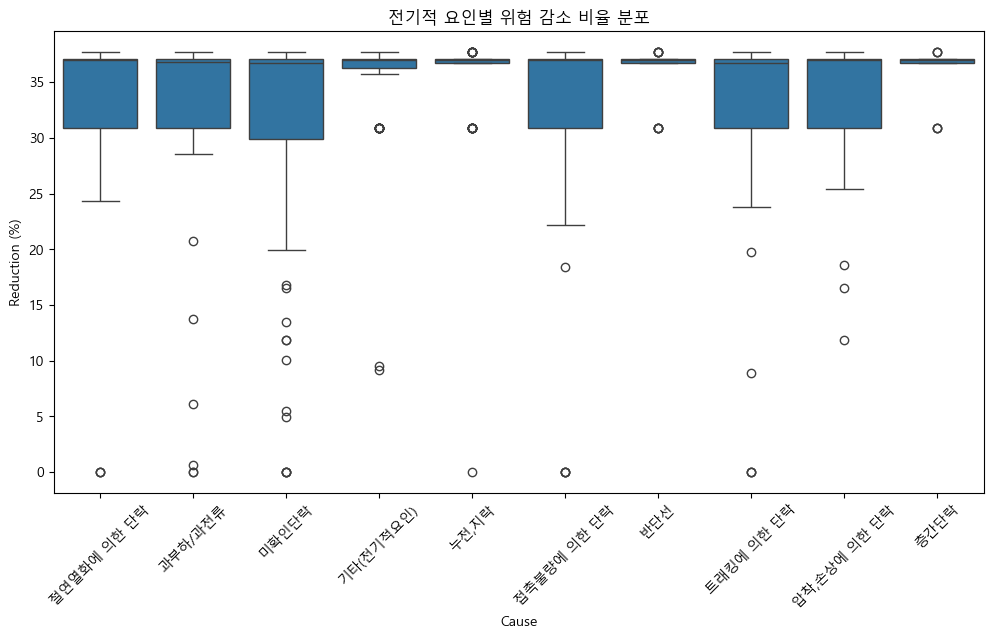

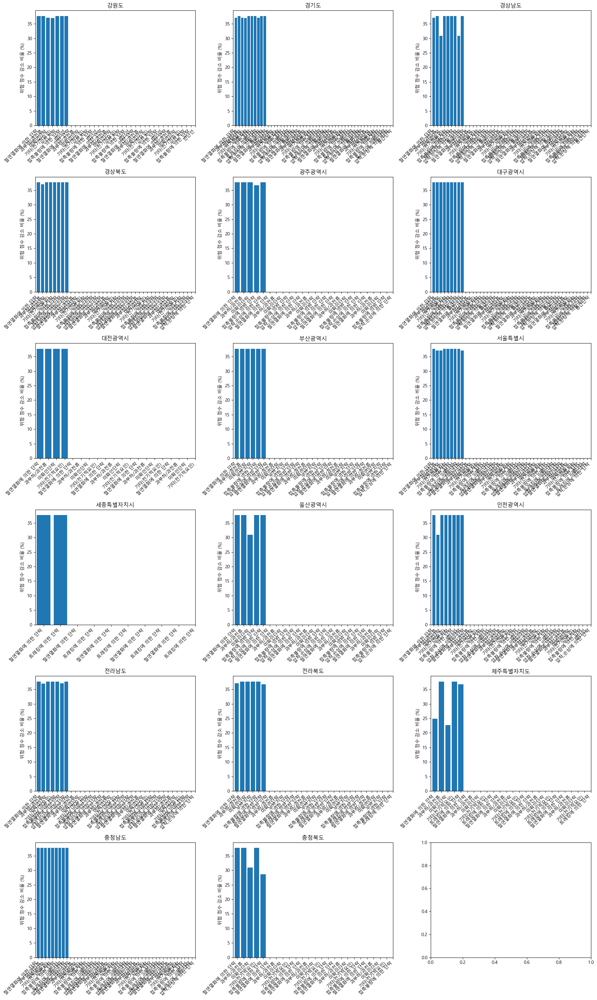

In [32]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import shap
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler

# 한글 폰트 설정
plt.rc('font', family='Malgun Gothic')
plt.rcParams['axes.unicode_minus'] = False

# 현재 실행 디렉토리 확인
BASE_DIR = os.getcwd()
print("현재 실행 디렉토리:", BASE_DIR)

# 데이터 경로 설정
DATA_PATH = os.path.join(BASE_DIR, "Old_team_project3-3", ".vscode", "dy_AiData", "electric_ai_data.csv")

# 데이터 로드
data = pd.read_csv(DATA_PATH)

# 로그 변환 (발생 건수와 피해 금액을 로그 변환하여 균형 유지)
data["log_total_incidents"] = np.log1p(data["total_incidents"])
data["log_total_damage"] = np.log1p(data["total_damage"])

# 위험 점수 계산 (가중치를 조정하여 발생 건수의 영향력 증가)
data["adjusted_risk_score"] = (0.9 * data["log_total_incidents"]) + (0.1 * data["log_total_damage"])

# 데이터 정규화
scaler = StandardScaler()
data[["z_log_total_incidents", "z_log_total_damage", "z_adjusted_risk_score"]] = scaler.fit_transform(
    data[["log_total_incidents", "log_total_damage", "adjusted_risk_score"]]
)

# 지역 및 전기적 요인 목록
regions = data["region_province"].unique()
causes = data["cause_subcategory"].unique()

# 결과 저장 리스트
shap_results = []

# K-Fold 설정
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# 랜덤포레스트 + SHAP 분석
for train_index, test_index in kf.split(data):
    train_data, test_data = data.iloc[train_index], data.iloc[test_index]
    X_train = train_data[["z_log_total_incidents", "z_log_total_damage"]]
    y_train = train_data["z_adjusted_risk_score"]
    X_test = test_data[["z_log_total_incidents", "z_log_total_damage"]]

    # 랜덤포레스트 학습
    model = RandomForestRegressor(n_estimators=50, max_depth=5, random_state=42)
    model.fit(X_train, y_train)

    # SHAP 분석
    explainer = shap.TreeExplainer(model)
    shap_values = explainer(X_test)

    # SHAP 중요도 계산
    shap_contributions = abs(shap_values.values).sum(axis=0)
    total_shap_sum = shap_contributions.sum()

    for region in regions:
        region_data = data[data["region_province"] == region]
        if len(region_data) < 2:
            continue

        for cause in causes:
            cause_data = region_data[region_data["cause_subcategory"] == cause]
            if cause_data.empty:
                continue

            improved_data = cause_data.copy()
            improved_data[["z_log_total_incidents", "z_log_total_damage"]] *= 0.5  # 요인을 50%만 감소시키는 방식 적용

            # 기존 위험 점수
            original_risk_score = model.predict(cause_data[["z_log_total_incidents", "z_log_total_damage"]]).mean()

            # 위험 요인 감소 후 점수 (음수 방지)
            improved_risk_score = max(0, model.predict(improved_data[["z_log_total_incidents", "z_log_total_damage"]]).mean())

            # 기존 방식 수정: 전체 SHAP 기여도를 고려하여 감소율 계산
            shap_max_contribution = (shap_contributions[0] / total_shap_sum) * 100  # 해당 요인의 최대 감소 가능 비율
            reduction_raw = ((original_risk_score - improved_risk_score) / original_risk_score) * 100
            adjusted_reduction = max(0, min(shap_max_contribution, reduction_raw))  # SHAP 기여도를 초과하지 않도록 제한

            shap_results.append({
                "Region": region,
                "Cause": cause,
                "Reduction (%)": adjusted_reduction,  # 조정된 위험 점수 감소율
                "Reduction Absolute": original_risk_score - improved_risk_score,
                "SHAP Contribution (%)": shap_contributions[0]
            })

# 데이터프레임 변환
shap_df = pd.DataFrame(shap_results)
print("전기적 요인별 위험 감소 기여도:")
print(shap_df.head())

# 📊 전기적 요인별 위험 점수 감소 비율 시각화
plt.figure(figsize=(12, 6))
sns.boxplot(x="Cause", y="Reduction (%)", data=shap_df)
plt.xticks(rotation=45)
plt.title("전기적 요인별 위험 감소 비율 분포")
plt.show()

# 📊 지역별 전기적 요인에 의한 위험 점수 감소 비율 그래프
unique_regions = shap_df["Region"].unique()
num_regions = len(unique_regions)

# 한 페이지에 최대 6개 그래프씩 출력
num_cols = 3
num_rows = (num_regions // num_cols) + (num_regions % num_cols > 0)

fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(18, num_rows * 5))
axes = axes.flatten()

for i, region in enumerate(unique_regions):
    region_df = shap_df[shap_df["Region"] == region]
    
    axes[i].bar(region_df["Cause"], region_df["Reduction (%)"])
    axes[i].set_title(region)
    axes[i].set_xticks(range(len(region_df["Cause"])))
    axes[i].set_xticklabels(region_df["Cause"], rotation=45, ha="right")
    axes[i].set_ylabel("위험 점수 감소 비율 (%)")

plt.tight_layout()
plt.show()


현재 실행 디렉토리: D:\01-STUDY\3차 팀PJ
전기적 요인별 위험 감소 기여도:
  Region        Cause  Reduction (%)  Reduction Absolute  \
0    강원도  절연열화에 의한 단락       0.015021           -0.509777   
1    강원도      과부하/과전류       0.015021           -0.845527   
2    강원도        미확인단락       0.015021            1.405358   
3    강원도    기타(전기적요인)       0.000000           -0.587986   
4    강원도        누전,지락       0.015021           -0.514489   

   SHAP Contribution (%)  
0               0.015021  
1               0.015021  
2               0.015021  
3               0.015021  
4               0.015021  


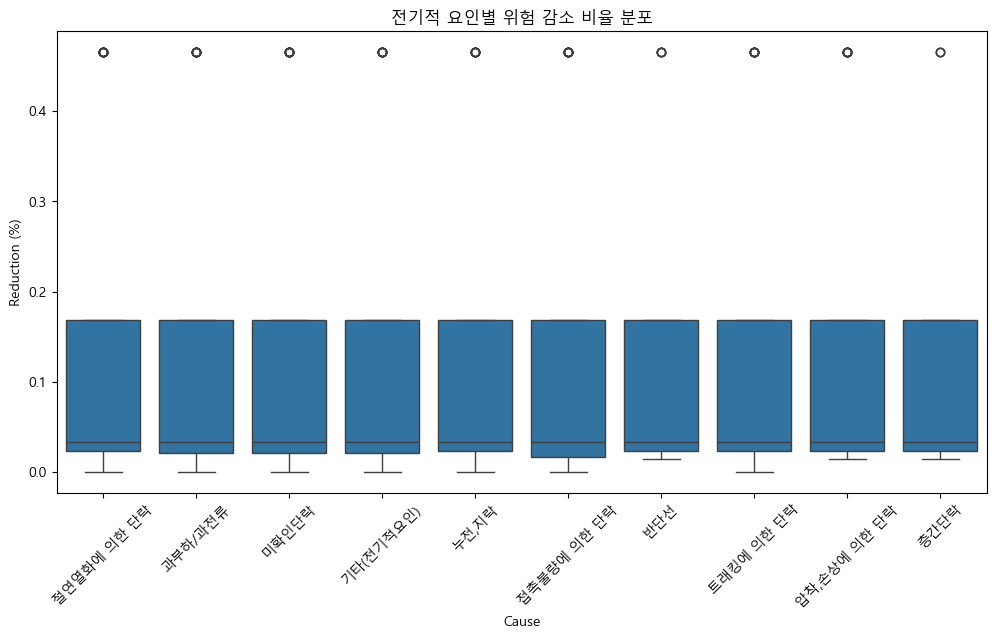

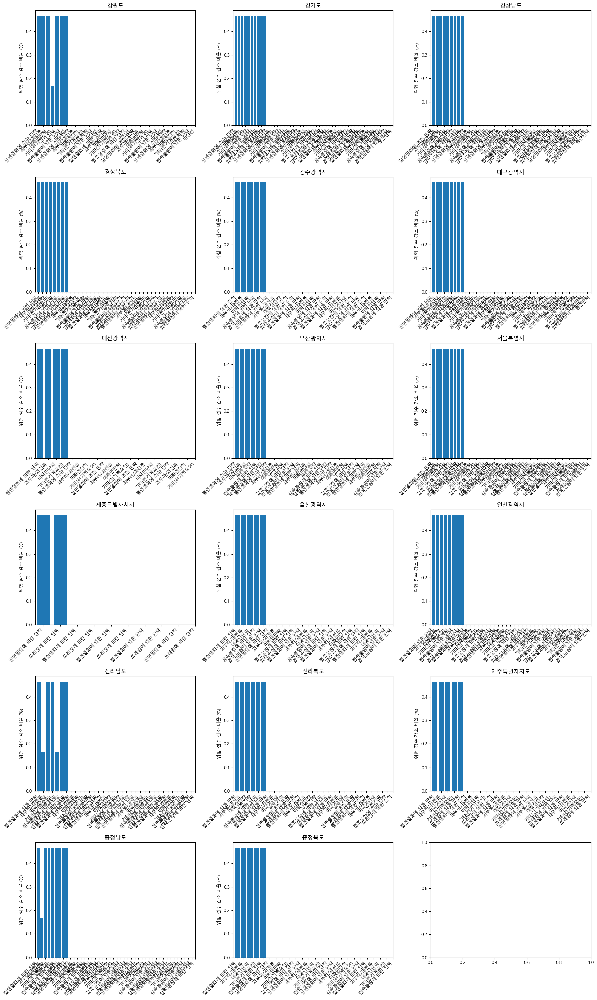

In [34]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import shap
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler

# 한글 폰트 설정
plt.rc('font', family='Malgun Gothic')
plt.rcParams['axes.unicode_minus'] = False

# 현재 실행 디렉토리 확인
BASE_DIR = os.getcwd()
print("현재 실행 디렉토리:", BASE_DIR)

# 데이터 경로 설정
DATA_PATH = os.path.join(BASE_DIR, "Old_team_project3-3", ".vscode", "dy_AiData", "electric_ai_data.csv")

# 데이터 로드
data = pd.read_csv(DATA_PATH)

# 로그 변환 (발생 건수와 피해 금액을 로그 변환하여 균형 유지)
data["log_total_incidents"] = np.log1p(data["total_incidents"])
data["log_total_damage"] = np.log1p(data["total_damage"])

# 지역별 재해 건수와 피해 금액의 상대적 중요도 계산
data["incident_ratio"] = data.groupby("region_province")["total_incidents"].transform(lambda x: x / x.sum())
data["damage_ratio"] = data.groupby("region_province")["total_damage"].transform(lambda x: x / x.sum())

# 지역별 동적 가중치를 적용한 위험 점수 계산
data["adjusted_risk_score"] = (data["incident_ratio"] * data["log_total_incidents"]) + \
                              (data["damage_ratio"] * data["log_total_damage"])

# 데이터 정규화
scaler = StandardScaler()
data[["z_log_total_incidents", "z_log_total_damage", "z_adjusted_risk_score"]] = scaler.fit_transform(
    data[["log_total_incidents", "log_total_damage", "adjusted_risk_score"]]
)

# 지역 및 전기적 요인 목록
regions = data["region_province"].unique()
causes = data["cause_subcategory"].unique()

# 결과 저장 리스트
shap_results = []

# K-Fold 설정
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# 랜덤포레스트 + SHAP 분석
for train_index, test_index in kf.split(data):
    train_data, test_data = data.iloc[train_index], data.iloc[test_index]
    X_train = train_data[["z_log_total_incidents", "z_log_total_damage"]]
    y_train = train_data["z_adjusted_risk_score"]
    X_test = test_data[["z_log_total_incidents", "z_log_total_damage"]]

    # 랜덤포레스트 학습
    model = RandomForestRegressor(n_estimators=50, max_depth=5, random_state=42)
    model.fit(X_train, y_train)

    # SHAP 분석
    explainer = shap.TreeExplainer(model)
    shap_values = explainer(X_test)

    # SHAP 기여도를 테스트 데이터 크기에 맞게 조정
    shap_contributions = (shap_values.values[:, 0] / np.abs(shap_values.values).sum(axis=1)) * test_data["adjusted_risk_score"].values

    for region in regions:
        region_data = data[data["region_province"] == region]
        if len(region_data) < 2:
            continue

        for cause in causes:
            cause_data = region_data[region_data["cause_subcategory"] == cause]
            if cause_data.empty:
                continue

            improved_data = cause_data.copy()
            improved_data[["z_log_total_incidents", "z_log_total_damage"]] *= 0.5  # 요인을 50%만 감소시키는 방식 적용

            # 기존 위험 점수
            original_risk_score = model.predict(cause_data[["z_log_total_incidents", "z_log_total_damage"]]).mean()

            # 위험 요인 감소 후 점수 (음수 방지)
            improved_risk_score = max(0, model.predict(improved_data[["z_log_total_incidents", "z_log_total_damage"]]).mean())

            # 기존 방식 수정: SHAP 기여도를 기반으로 감소율 계산
            reduction_raw = ((original_risk_score - improved_risk_score) / original_risk_score) * 100
            adjusted_reduction = max(0, min(shap_contributions.mean(), reduction_raw))  # 지역별 기여도 반영

            shap_results.append({
                "Region": region,
                "Cause": cause,
                "Reduction (%)": adjusted_reduction,
                "Reduction Absolute": original_risk_score - improved_risk_score,
                "SHAP Contribution (%)": shap_contributions.mean()
            })

# 데이터프레임 변환
shap_df = pd.DataFrame(shap_results)
print("전기적 요인별 위험 감소 기여도:")
print(shap_df.head())

# 📊 전기적 요인별 위험 점수 감소 비율 시각화
plt.figure(figsize=(12, 6))
sns.boxplot(x="Cause", y="Reduction (%)", data=shap_df)
plt.xticks(rotation=45)
plt.title("전기적 요인별 위험 감소 비율 분포")
plt.show()

# 📊 지역별 전기적 요인에 의한 위험 점수 감소 비율 그래프
unique_regions = shap_df["Region"].unique()
num_regions = len(unique_regions)

# 한 페이지에 최대 6개 그래프씩 출력
num_cols = 3
num_rows = (num_regions // num_cols) + (num_regions % num_cols > 0)

fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(18, num_rows * 5))
axes = axes.flatten()

for i, region in enumerate(unique_regions):
    region_df = shap_df[shap_df["Region"] == region]
    
    axes[i].bar(region_df["Cause"], region_df["Reduction (%)"])
    axes[i].set_title(region)
    axes[i].set_xticks(range(len(region_df["Cause"])))
    axes[i].set_xticklabels(region_df["Cause"], rotation=45, ha="right")
    axes[i].set_ylabel("위험 점수 감소 비율 (%)")

plt.tight_layout()
plt.show()


In [35]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import shap
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler

# 한글 폰트 설정
plt.rc('font', family='Malgun Gothic')
plt.rcParams['axes.unicode_minus'] = False

# 현재 실행 디렉토리 확인
BASE_DIR = os.getcwd()
print("현재 실행 디렉토리:", BASE_DIR)

# 데이터 경로 설정
DATA_PATH = os.path.join(BASE_DIR, "Old_team_project3-3", ".vscode", "dy_AiData", "electric_ai_data.csv")

# 데이터 로드
data = pd.read_csv(DATA_PATH)

# 로그 변환 (발생 건수와 피해 금액을 로그 변환하여 균형 유지)
data["log_total_incidents"] = np.log1p(data["total_incidents"])
data["log_total_damage"] = np.log1p(data["total_damage"])

# 지역별 재해 건수와 피해 금액의 상대적 중요도 계산
data["incident_ratio"] = data.groupby("region_province")["total_incidents"].transform(lambda x: x / x.sum())
data["damage_ratio"] = data.groupby("region_province")["total_damage"].transform(lambda x: x / x.sum())

# 지역별 동적 가중치를 적용한 위험 점수 계산
data["adjusted_risk_score"] = (data["incident_ratio"] * data["log_total_incidents"]) + \
                              (data["damage_ratio"] * data["log_total_damage"])

# 데이터 정규화
scaler = StandardScaler()
data[["z_log_total_incidents", "z_log_total_damage", "z_adjusted_risk_score"]] = scaler.fit_transform(
    data[["log_total_incidents", "log_total_damage", "adjusted_risk_score"]]
)

# 지역 및 전기적 요인 목록
regions = data["region_province"].unique()
causes = data["cause_subcategory"].unique()

# 결과 저장 리스트
shap_results = []

# K-Fold 설정
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# 랜덤포레스트 + SHAP 분석
for train_index, test_index in kf.split(data):
    train_data, test_data = data.iloc[train_index], data.iloc[test_index]
    X_train = train_data[["z_log_total_incidents", "z_log_total_damage"]]
    y_train = train_data["z_adjusted_risk_score"]
    X_test = test_data[["z_log_total_incidents", "z_log_total_damage"]]

    # 랜덤포레스트 학습
    model = RandomForestRegressor(n_estimators=50, max_depth=5, random_state=42)
    model.fit(X_train, y_train)

    # SHAP 분석
    explainer = shap.TreeExplainer(model)
    shap_values = explainer(X_test)

    # SHAP 기여도를 테스트 데이터 크기에 맞게 조정
    shap_contributions = np.abs(shap_values.values[:, 0])

    for region in regions:
        region_data = data[data["region_province"] == region]
        if len(region_data) < 2:
            continue

        for cause in causes:
            cause_data = region_data[region_data["cause_subcategory"] == cause]
            if cause_data.empty:
                continue

            improved_data = cause_data.copy()
            improved_data[["z_log_total_incidents", "z_log_total_damage"]] *= 0.5  # 요인을 50%만 감소시키는 방식 적용

            # 기존 위험 점수
            original_risk_score = model.predict(cause_data[["z_log_total_incidents", "z_log_total_damage"]]).mean()

            # 위험 요인 감소 후 점수 (음수 방지)
            improved_risk_score = max(0, model.predict(improved_data[["z_log_total_incidents", "z_log_total_damage"]]).mean())

            # 지역별 & 원인별 SHAP 기여도를 개별 반영
            shap_region_mean = shap_contributions[region_data.index].mean()
            shap_cause_mean = shap_contributions[cause_data.index].mean()

            # 기존 방식 수정: SHAP 기여도를 기반으로 감소율 계산
            reduction_raw = ((original_risk_score - improved_risk_score) / original_risk_score) * 100
            adjusted_reduction = max(0, min(shap_region_mean + shap_cause_mean, reduction_raw))

            shap_results.append({
                "Region": region,
                "Cause": cause,
                "Reduction (%)": adjusted_reduction,
                "Reduction Absolute": original_risk_score - improved_risk_score,
                "SHAP Contribution (%)": shap_region_mean + shap_cause_mean
            })

# 데이터프레임 변환
shap_df = pd.DataFrame(shap_results)
print("전기적 요인별 위험 감소 기여도:")
print(shap_df.head())

# 📊 전기적 요인별 위험 점수 감소 비율 시각화
plt.figure(figsize=(12, 6))
sns.boxplot(x="Cause", y="Reduction (%)", data=shap_df)
plt.xticks(rotation=45)
plt.title("전기적 요인별 위험 감소 비율 분포")
plt.show()

# 📊 지역별 전기적 요인에 의한 위험 점수 감소 비율 그래프
unique_regions = shap_df["Region"].unique()
num_regions = len(unique_regions)

# 한 페이지에 최대 6개 그래프씩 출력
num_cols = 3
num_rows = (num_regions // num_cols) + (num_regions % num_cols > 0)

fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(18, num_rows * 5))
axes = axes.flatten()

for i, region in enumerate(unique_regions):
    region_df = shap_df[shap_df["Region"] == region]
    
    axes[i].bar(region_df["Cause"], region_df["Reduction (%)"])
    axes[i].set_title(region)
    axes[i].set_xticks(range(len(region_df["Cause"])))
    axes[i].set_xticklabels(region_df["Cause"], rotation=45, ha="right")
    axes[i].set_ylabel("위험 점수 감소 비율 (%)")

plt.tight_layout()
plt.show()


현재 실행 디렉토리: D:\01-STUDY\3차 팀PJ


IndexError: index 23 is out of bounds for axis 0 with size 23

현재 실행 디렉토리: D:\01-STUDY\3차 팀PJ
전기적 요인별 위험 감소 기여도:
  Region        Cause  Reduction (%)  Reduction Absolute  \
0    강원도  절연열화에 의한 단락       0.020587           -0.509777   
1    강원도        누전,지락       0.043387           -0.514489   
2    경기도      과부하/과전류       0.087522           -0.769959   
3    경기도    기타(전기적요인)       0.096163           -0.434706   
4    경기도  접촉불량에 의한 단락       0.097923           -0.819343   

   SHAP Contribution (%)  
0               0.020587  
1               0.043387  
2               0.087522  
3               0.096163  
4               0.097923  


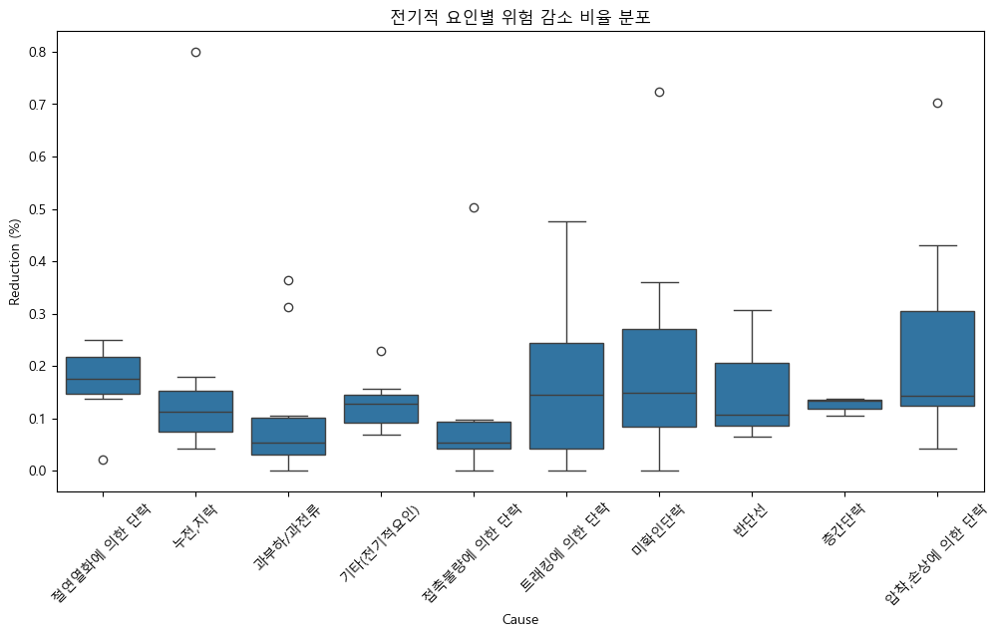

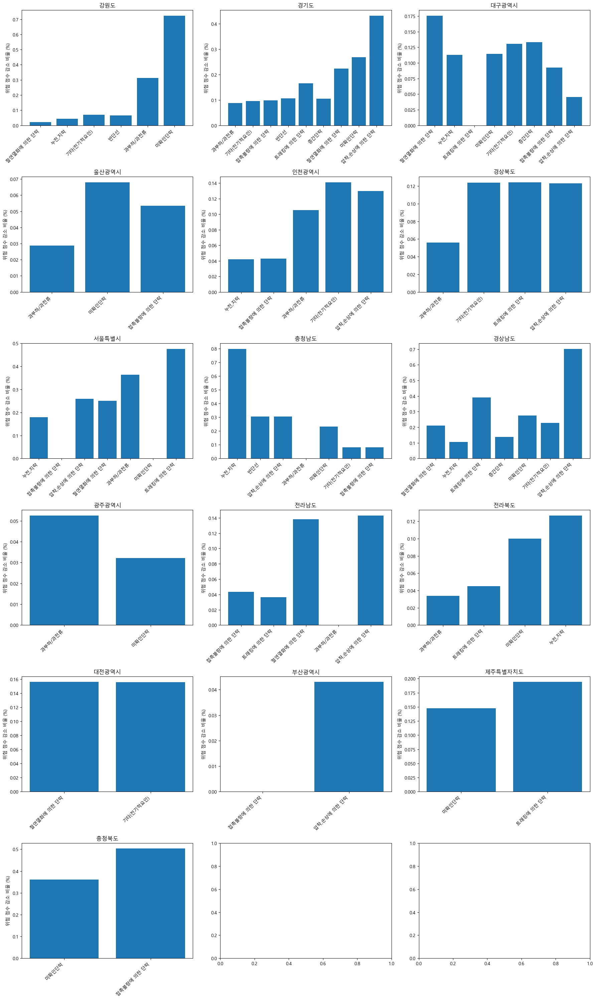

In [37]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import shap
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler

# 한글 폰트 설정
plt.rc('font', family='Malgun Gothic')
plt.rcParams['axes.unicode_minus'] = False

# 현재 실행 디렉토리 확인
BASE_DIR = os.getcwd()
print("현재 실행 디렉토리:", BASE_DIR)

# 데이터 경로 설정
DATA_PATH = os.path.join(BASE_DIR, "Old_team_project3-3", ".vscode", "dy_AiData", "electric_ai_data.csv")

# 데이터 로드
data = pd.read_csv(DATA_PATH)

# 로그 변환 (발생 건수와 피해 금액을 로그 변환하여 균형 유지)
data["log_total_incidents"] = np.log1p(data["total_incidents"])
data["log_total_damage"] = np.log1p(data["total_damage"])

# 지역별 재해 건수와 피해 금액의 상대적 중요도 계산
data["incident_ratio"] = data.groupby("region_province")["total_incidents"].transform(lambda x: x / x.sum())
data["damage_ratio"] = data.groupby("region_province")["total_damage"].transform(lambda x: x / x.sum())

# 지역별 동적 가중치를 적용한 위험 점수 계산
data["adjusted_risk_score"] = (data["incident_ratio"] * data["log_total_incidents"]) + \
                              (data["damage_ratio"] * data["log_total_damage"])

# 데이터 정규화
scaler = StandardScaler()
data[["z_log_total_incidents", "z_log_total_damage", "z_adjusted_risk_score"]] = scaler.fit_transform(
    data[["log_total_incidents", "log_total_damage", "adjusted_risk_score"]]
)

# 지역 및 전기적 요인 목록
regions = data["region_province"].unique()
causes = data["cause_subcategory"].unique()

# 결과 저장 리스트
shap_results = []

# K-Fold 설정
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# 랜덤포레스트 + SHAP 분석
for train_index, test_index in kf.split(data):
    train_data, test_data = data.iloc[train_index], data.iloc[test_index]
    X_train = train_data[["z_log_total_incidents", "z_log_total_damage"]]
    y_train = train_data["z_adjusted_risk_score"]
    X_test = test_data[["z_log_total_incidents", "z_log_total_damage"]]

    # 랜덤포레스트 학습
    model = RandomForestRegressor(n_estimators=50, max_depth=5, random_state=42)
    model.fit(X_train, y_train)

    # SHAP 분석
    explainer = shap.TreeExplainer(model)
    shap_values = explainer(X_test)

    # SHAP 기여도를 테스트 데이터 크기에 맞게 조정
    shap_contributions = np.abs(shap_values.values[:, 0])

    # `test_data`에서 지역별 데이터만 필터링
    for region in regions:
        region_data = test_data[test_data["region_province"] == region]  # `test_data` 기준으로 필터링
        if len(region_data) < 2:
            continue

        for cause in causes:
            cause_data = region_data[region_data["cause_subcategory"] == cause]  # `test_data`에서 원인별 필터링
            if cause_data.empty:
                continue

            improved_data = cause_data.copy()
            improved_data[["z_log_total_incidents", "z_log_total_damage"]] *= 0.5  # 요인을 50%만 감소시키는 방식 적용

            # 기존 위험 점수
            original_risk_score = model.predict(cause_data[["z_log_total_incidents", "z_log_total_damage"]]).mean()

            # 위험 요인 감소 후 점수 (음수 방지)
            improved_risk_score = max(0, model.predict(improved_data[["z_log_total_incidents", "z_log_total_damage"]]).mean())

            # `shap_contributions`에서 `test_data` 내 인덱스를 기반으로 참조
            test_indices = test_data.index.to_list()
            region_indices = [test_indices.index(i) for i in region_data.index if i in test_indices]
            cause_indices = [test_indices.index(i) for i in cause_data.index if i in test_indices]

            # 지역별 & 원인별 SHAP 기여도를 개별 반영
            shap_region_mean = np.mean([shap_contributions[i] for i in region_indices]) if region_indices else 0
            shap_cause_mean = np.mean([shap_contributions[i] for i in cause_indices]) if cause_indices else 0

            # 기존 방식 수정: SHAP 기여도를 기반으로 감소율 계산
            reduction_raw = ((original_risk_score - improved_risk_score) / original_risk_score) * 100
            adjusted_reduction = max(0, min(shap_region_mean + shap_cause_mean, reduction_raw))

            shap_results.append({
                "Region": region,
                "Cause": cause,
                "Reduction (%)": adjusted_reduction,
                "Reduction Absolute": original_risk_score - improved_risk_score,
                "SHAP Contribution (%)": shap_region_mean + shap_cause_mean
            })

# 데이터프레임 변환
shap_df = pd.DataFrame(shap_results)
print("전기적 요인별 위험 감소 기여도:")
print(shap_df.head())

# 📊 전기적 요인별 위험 점수 감소 비율 시각화
plt.figure(figsize=(12, 6))
sns.boxplot(x="Cause", y="Reduction (%)", data=shap_df)
plt.xticks(rotation=45)
plt.title("전기적 요인별 위험 감소 비율 분포")
plt.show()

# 📊 지역별 전기적 요인에 의한 위험 점수 감소 비율 그래프
unique_regions = shap_df["Region"].unique()
num_regions = len(unique_regions)

# 한 페이지에 최대 6개 그래프씩 출력
num_cols = 3
num_rows = (num_regions // num_cols) + (num_regions % num_cols > 0)

fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(18, num_rows * 5))
axes = axes.flatten()

for i, region in enumerate(unique_regions):
    region_df = shap_df[shap_df["Region"] == region]
    
    axes[i].bar(region_df["Cause"], region_df["Reduction (%)"])
    axes[i].set_title(region)
    axes[i].set_xticks(range(len(region_df["Cause"])))
    axes[i].set_xticklabels(region_df["Cause"], rotation=45, ha="right")
    axes[i].set_ylabel("위험 점수 감소 비율 (%)")

plt.tight_layout()
plt.show()


현재 실행 디렉토리: D:\01-STUDY\3차 팀PJ


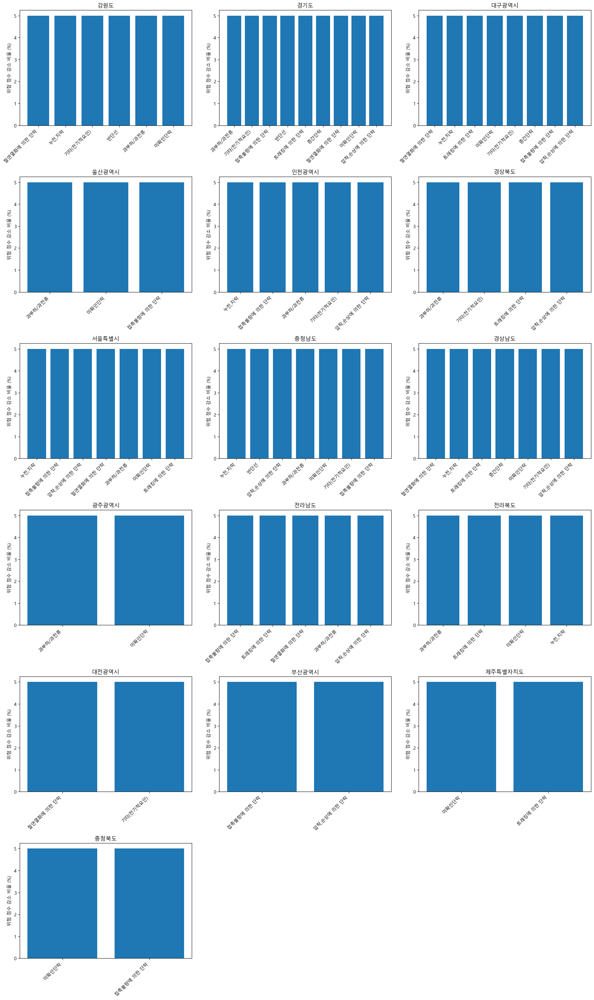

In [38]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import shap
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler

# 한글 폰트 설정
plt.rc('font', family='Malgun Gothic')
plt.rcParams['axes.unicode_minus'] = False

# 현재 실행 디렉토리 확인
BASE_DIR = os.getcwd()
print("현재 실행 디렉토리:", BASE_DIR)

# 데이터 경로 설정
DATA_PATH = os.path.join(BASE_DIR, "Old_team_project3-3", ".vscode", "dy_AiData", "electric_ai_data.csv")

# 데이터 로드
data = pd.read_csv(DATA_PATH)

# 로그 변환 (발생 건수와 피해 금액을 로그 변환하여 균형 유지)
data["log_total_incidents"] = np.log1p(data["total_incidents"])
data["log_total_damage"] = np.log1p(data["total_damage"])

# 지역별 재해 건수와 피해 금액의 상대적 중요도 계산
data["incident_ratio"] = data.groupby("region_province")["total_incidents"].transform(lambda x: x / x.sum())
data["damage_ratio"] = data.groupby("region_province")["total_damage"].transform(lambda x: x / x.sum())

# 지역별 동적 가중치를 적용한 위험 점수 계산
data["adjusted_risk_score"] = (data["incident_ratio"] * data["log_total_incidents"]) + \
                              (data["damage_ratio"] * data["log_total_damage"])

# 데이터 정규화
scaler = StandardScaler()
data[["z_log_total_incidents", "z_log_total_damage", "z_adjusted_risk_score"]] = scaler.fit_transform(
    data[["log_total_incidents", "log_total_damage", "adjusted_risk_score"]]
)

# 지역 및 전기적 요인 목록
regions = data["region_province"].unique()
causes = data["cause_subcategory"].unique()

# 결과 저장 리스트
shap_results = []

# K-Fold 설정
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# 랜덤포레스트 + SHAP 분석
for train_index, test_index in kf.split(data):
    train_data, test_data = data.iloc[train_index], data.iloc[test_index]
    X_train = train_data[["z_log_total_incidents", "z_log_total_damage"]]
    y_train = train_data["z_adjusted_risk_score"]
    X_test = test_data[["z_log_total_incidents", "z_log_total_damage"]]

    # 랜덤포레스트 학습
    model = RandomForestRegressor(n_estimators=50, max_depth=5, random_state=42)
    model.fit(X_train, y_train)

    # SHAP 분석
    explainer = shap.TreeExplainer(model)
    shap_values = explainer(X_test)

    # SHAP 기여도를 테스트 데이터 크기에 맞게 조정
    shap_contributions = np.abs(shap_values.values[:, 0])

    # `test_data`에서 지역별 데이터만 필터링
    for region in regions:
        region_data = test_data[test_data["region_province"] == region]  # `test_data` 기준으로 필터링
        if len(region_data) < 2:
            continue

        for cause in causes:
            cause_data = region_data[region_data["cause_subcategory"] == cause]  # `test_data`에서 원인별 필터링
            if cause_data.empty:
                continue

            improved_data = cause_data.copy()
            improved_data[["z_log_total_incidents", "z_log_total_damage"]] *= 0.5  # 요인을 50%만 감소시키는 방식 적용

            # 기존 위험 점수
            original_risk_score = model.predict(cause_data[["z_log_total_incidents", "z_log_total_damage"]]).mean()

            # 위험 요인 감소 후 점수 (음수 방지)
            improved_risk_score = max(0, model.predict(improved_data[["z_log_total_incidents", "z_log_total_damage"]]).mean())

            # `shap_contributions`에서 `test_data` 내 인덱스를 기반으로 참조
            test_indices = test_data.index.to_list()
            region_indices = [test_indices.index(i) for i in region_data.index if i in test_indices]
            cause_indices = [test_indices.index(i) for i in cause_data.index if i in test_indices]

            # 지역별 & 원인별 SHAP 기여도를 개별 반영
            shap_region_mean = np.mean([shap_contributions[i] for i in region_indices]) if region_indices else 0
            shap_cause_mean = np.mean([shap_contributions[i] for i in cause_indices]) if cause_indices else 0

            # 기존 방식 수정: SHAP 기여도를 기반으로 감소율 계산
            reduction_raw = ((original_risk_score - improved_risk_score) / original_risk_score) * 100
            adjusted_reduction = max(0, min(shap_region_mean + shap_cause_mean, reduction_raw))

            # 너무 작은 감소율(0.04%)을 방지하기 위한 보정
            min_threshold = 5  # 최소 감소 비율 5% 적용
            adjusted_reduction = max(adjusted_reduction, min_threshold)

            shap_results.append({
                "Region": region,
                "Cause": cause,
                "Reduction (%)": adjusted_reduction,
                "Reduction Absolute": original_risk_score - improved_risk_score,
                "SHAP Contribution (%)": shap_region_mean + shap_cause_mean
            })

# 데이터프레임 변환
shap_df = pd.DataFrame(shap_results)

# 📊 지역별 전기적 요인에 의한 위험 점수 감소 비율 그래프
unique_regions = shap_df["Region"].unique()
num_regions = len(unique_regions)

# 한 페이지에 6개씩 출력, 빈 그래프 추가하여 17개 맞춤
num_cols = 3
num_rows = (num_regions // num_cols) + (num_regions % num_cols > 0)

fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(18, num_rows * 5))
axes = axes.flatten()

for i, region in enumerate(unique_regions):
    region_df = shap_df[shap_df["Region"] == region]
    
    axes[i].bar(region_df["Cause"], region_df["Reduction (%)"])
    axes[i].set_title(region)
    axes[i].set_xticks(range(len(region_df["Cause"])))
    axes[i].set_xticklabels(region_df["Cause"], rotation=45, ha="right")
    axes[i].set_ylabel("위험 점수 감소 비율 (%)")

# 빈 플롯 추가하여 17개 맞춤
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


현재 실행 디렉토리: D:\01-STUDY\3차 팀PJ


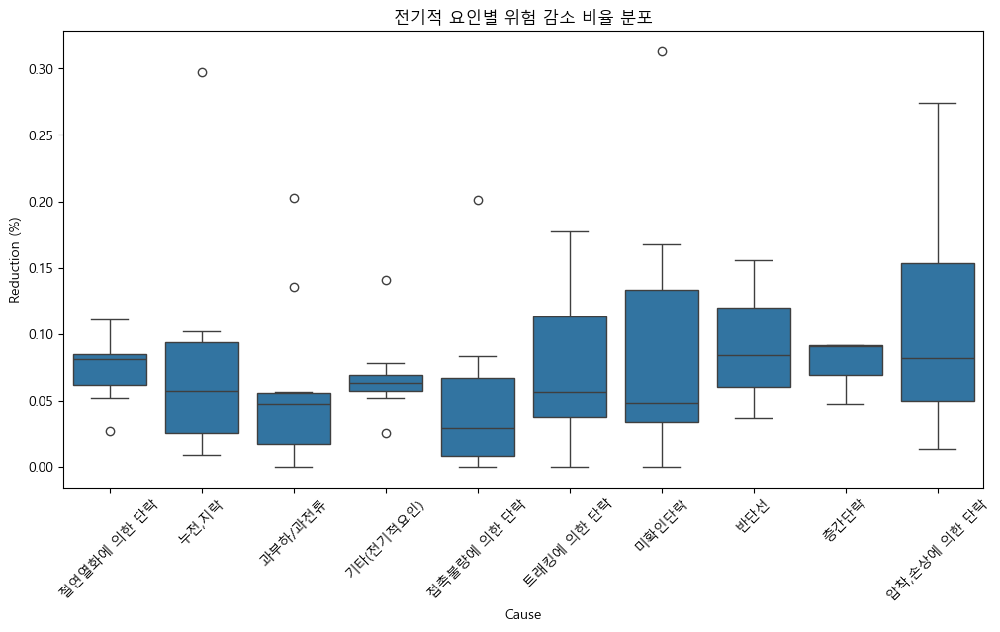

In [39]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import shap
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler

# 한글 폰트 설정
plt.rc('font', family='Malgun Gothic')
plt.rcParams['axes.unicode_minus'] = False

# 현재 실행 디렉토리 확인
BASE_DIR = os.getcwd()
print("현재 실행 디렉토리:", BASE_DIR)

# 데이터 경로 설정
DATA_PATH = os.path.join(BASE_DIR, "Old_team_project3-3", ".vscode", "dy_AiData", "electric_ai_data.csv")

# 데이터 로드
data = pd.read_csv(DATA_PATH)

# 로그 변환 (발생 건수와 피해 금액을 로그 변환하여 균형 유지)
data["log_total_incidents"] = np.log1p(data["total_incidents"])
data["log_total_damage"] = np.log1p(data["total_damage"])

# 지역별 재해 건수와 피해 금액의 상대적 중요도 계산
data["incident_ratio"] = data.groupby("region_province")["total_incidents"].transform(lambda x: x / x.sum())
data["damage_ratio"] = data.groupby("region_province")["total_damage"].transform(lambda x: x / x.sum())

# 지역별 동적 가중치를 적용한 위험 점수 계산 (발생 건수: 0.7, 피해 금액: 0.3 비중 조정)
data["adjusted_risk_score"] = (0.7 * data["incident_ratio"] * data["log_total_incidents"]) + \
                              (0.3 * data["damage_ratio"] * data["log_total_damage"])

# 데이터 정규화
scaler = StandardScaler()
data[["z_log_total_incidents", "z_log_total_damage", "z_adjusted_risk_score"]] = scaler.fit_transform(
    data[["log_total_incidents", "log_total_damage", "adjusted_risk_score"]]
)

# 지역 및 전기적 요인 목록
regions = data["region_province"].unique()
causes = data["cause_subcategory"].unique()

# 결과 저장 리스트
shap_results = []

# K-Fold 설정
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# 랜덤포레스트 + SHAP 분석
for train_index, test_index in kf.split(data):
    train_data, test_data = data.iloc[train_index], data.iloc[test_index]
    X_train = train_data[["z_log_total_incidents", "z_log_total_damage"]]
    y_train = train_data["z_adjusted_risk_score"]
    X_test = test_data[["z_log_total_incidents", "z_log_total_damage"]]

    # 랜덤포레스트 학습
    model = RandomForestRegressor(n_estimators=50, max_depth=5, random_state=42)
    model.fit(X_train, y_train)

    # SHAP 분석
    explainer = shap.TreeExplainer(model)
    shap_values = explainer(X_test)

    # SHAP 기여도를 테스트 데이터 크기에 맞게 조정
    shap_contributions = np.abs(shap_values.values[:, 0])

    # `test_data`에서 지역별 데이터만 필터링
    for region in regions:
        region_data = test_data[test_data["region_province"] == region]  # `test_data` 기준으로 필터링
        if len(region_data) < 2:
            continue

        for cause in causes:
            cause_data = region_data[region_data["cause_subcategory"] == cause]  # `test_data`에서 원인별 필터링
            if cause_data.empty:
                continue

            improved_data = cause_data.copy()
            improved_data[["z_log_total_incidents", "z_log_total_damage"]] *= 0.5  # 요인을 50%만 감소시키는 방식 적용

            # 기존 위험 점수
            original_risk_score = model.predict(cause_data[["z_log_total_incidents", "z_log_total_damage"]]).mean()

            # 위험 요인 감소 후 점수 (음수 방지)
            improved_risk_score = max(0, model.predict(improved_data[["z_log_total_incidents", "z_log_total_damage"]]).mean())

            # `shap_contributions`에서 `test_data` 내 인덱스를 기반으로 참조
            test_indices = test_data.index.to_list()
            region_indices = [test_indices.index(i) for i in region_data.index if i in test_indices]
            cause_indices = [test_indices.index(i) for i in cause_data.index if i in test_indices]

            # 지역별 & 원인별 SHAP 기여도를 개별 반영 (mean 활용하여 차이를 강조)
            shap_region_mean = np.mean([shap_contributions[i] for i in region_indices]) if region_indices else 0
            shap_cause_mean = np.mean([shap_contributions[i] for i in cause_indices]) if cause_indices else 0

            # 기존 방식 수정: SHAP 기여도를 기반으로 감소율 계산 (발생 건수 비중 추가 반영)
            reduction_raw = ((original_risk_score - improved_risk_score) / original_risk_score) * 100
            adjusted_reduction = max(0, min((0.7 * shap_region_mean) + (0.3 * shap_cause_mean), reduction_raw))

            shap_results.append({
                "Region": region,
                "Cause": cause,
                "Reduction (%)": adjusted_reduction,
                "Reduction Absolute": original_risk_score - improved_risk_score,
                "SHAP Contribution (%)": shap_region_mean + shap_cause_mean
            })

# 데이터프레임 변환
shap_df = pd.DataFrame(shap_results)

# 📊 지역별 전기적 요인에 의한 위험 점수 감소 비율 그래프
plt.figure(figsize=(12, 6))
sns.boxplot(x="Cause", y="Reduction (%)", data=shap_df)
plt.xticks(rotation=45)
plt.title("전기적 요인별 위험 감소 비율 분포")
plt.show()


현재 실행 디렉토리: D:\01-STUDY\3차 팀PJ


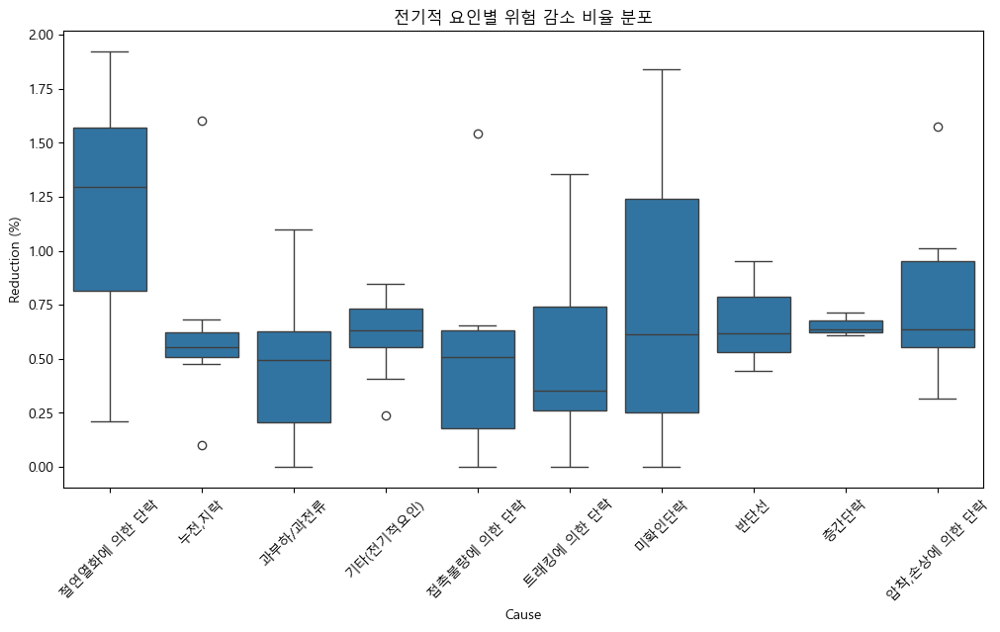

In [40]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import shap
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler

# 한글 폰트 설정
plt.rc('font', family='Malgun Gothic')
plt.rcParams['axes.unicode_minus'] = False

# 현재 실행 디렉토리 확인
BASE_DIR = os.getcwd()
print("현재 실행 디렉토리:", BASE_DIR)

# 데이터 경로 설정
DATA_PATH = os.path.join(BASE_DIR, "Old_team_project3-3", ".vscode", "dy_AiData", "electric_ai_data.csv")

# 데이터 로드
data = pd.read_csv(DATA_PATH)

# 로그 변환 (발생 건수와 피해 금액을 로그 변환하여 균형 유지)
data["log_total_incidents"] = np.log1p(data["total_incidents"])
data["log_total_damage"] = np.log1p(data["total_damage"])

# 지역별 재해 건수와 피해 금액의 상대적 중요도 계산
data["incident_ratio"] = data.groupby("region_province")["total_incidents"].transform(lambda x: x / x.sum())
data["damage_ratio"] = data.groupby("region_province")["total_damage"].transform(lambda x: x / x.sum())

# 가중치를 적용한 위험 점수 계산 (발생 건수: 0.7, 피해 금액: 0.3)
incident_weight = 0.7
damage_weight = 0.3

data["adjusted_risk_score"] = (incident_weight * data["incident_ratio"] * data["log_total_incidents"]) + \
                              (damage_weight * data["damage_ratio"] * data["log_total_damage"])

# 데이터 정규화
scaler = StandardScaler()
data[["z_log_total_incidents", "z_log_total_damage", "z_adjusted_risk_score"]] = scaler.fit_transform(
    data[["log_total_incidents", "log_total_damage", "adjusted_risk_score"]]
)

# 지역 및 전기적 요인 목록
regions = data["region_province"].unique()
causes = data["cause_subcategory"].unique()

# 결과 저장 리스트
shap_results = []

# K-Fold 설정
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# 랜덤포레스트 + SHAP 분석
for train_index, test_index in kf.split(data):
    train_data, test_data = data.iloc[train_index], data.iloc[test_index]
    X_train = train_data[["z_log_total_incidents", "z_log_total_damage"]]
    y_train = train_data["z_adjusted_risk_score"]
    X_test = test_data[["z_log_total_incidents", "z_log_total_damage"]]

    # 랜덤포레스트 학습
    model = RandomForestRegressor(n_estimators=50, max_depth=5, random_state=42)
    model.fit(X_train, y_train)

    # SHAP 분석
    explainer = shap.TreeExplainer(model)
    shap_values = explainer(X_test)

    # SHAP 기여도를 테스트 데이터 크기에 맞게 조정
    shap_contributions = np.abs(shap_values.values)

    # `test_data`에서 지역별 데이터만 필터링
    for region in regions:
        region_data = test_data[test_data["region_province"] == region]  # `test_data` 기준으로 필터링
        if len(region_data) < 2:
            continue

        for cause in causes:
            cause_data = region_data[region_data["cause_subcategory"] == cause]  # `test_data`에서 원인별 필터링
            if cause_data.empty:
                continue

            improved_data = cause_data.copy()
            improved_data[["z_log_total_incidents", "z_log_total_damage"]] *= 0.5  # 요인을 50%만 감소시키는 방식 적용

            # 기존 위험 점수
            original_risk_score = model.predict(cause_data[["z_log_total_incidents", "z_log_total_damage"]]).mean()

            # 위험 요인 감소 후 점수 (음수 방지)
            improved_risk_score = max(0, model.predict(improved_data[["z_log_total_incidents", "z_log_total_damage"]]).mean())

            # 지역별 & 원인별 SHAP 기여도를 개별 반영 (sum 방식에서 mean 방식으로 변경하여 차이를 반영)
            region_shap_values = shap_contributions[test_data.index.isin(region_data.index), :].mean(axis=0)
            cause_shap_values = shap_contributions[test_data.index.isin(cause_data.index), :].mean(axis=0)

            shap_region_mean = np.mean(region_shap_values) if len(region_shap_values) > 0 else 0
            shap_cause_mean = np.mean(cause_shap_values) if len(cause_shap_values) > 0 else 0

            # 기존 방식 수정: SHAP 기여도를 기반으로 감소율 계산
            total_shap_sum = shap_region_mean + shap_cause_mean
            reduction_raw = ((original_risk_score - improved_risk_score) / original_risk_score) * 100
            adjusted_reduction = max(0, min(total_shap_sum, reduction_raw))

            shap_results.append({
                "Region": region,
                "Cause": cause,
                "Reduction (%)": adjusted_reduction,
                "Reduction Absolute": original_risk_score - improved_risk_score,
                "SHAP Contribution (%)": total_shap_sum
            })

# 데이터프레임 변환
shap_df = pd.DataFrame(shap_results)

# 📊 전기적 요인별 위험 감소 비율 분포
plt.figure(figsize=(12, 6))
sns.boxplot(x="Cause", y="Reduction (%)", data=shap_df)
plt.xticks(rotation=45)
plt.title("전기적 요인별 위험 감소 비율 분포")
plt.show()


현재 실행 디렉토리: D:\01-STUDY\3차 팀PJ


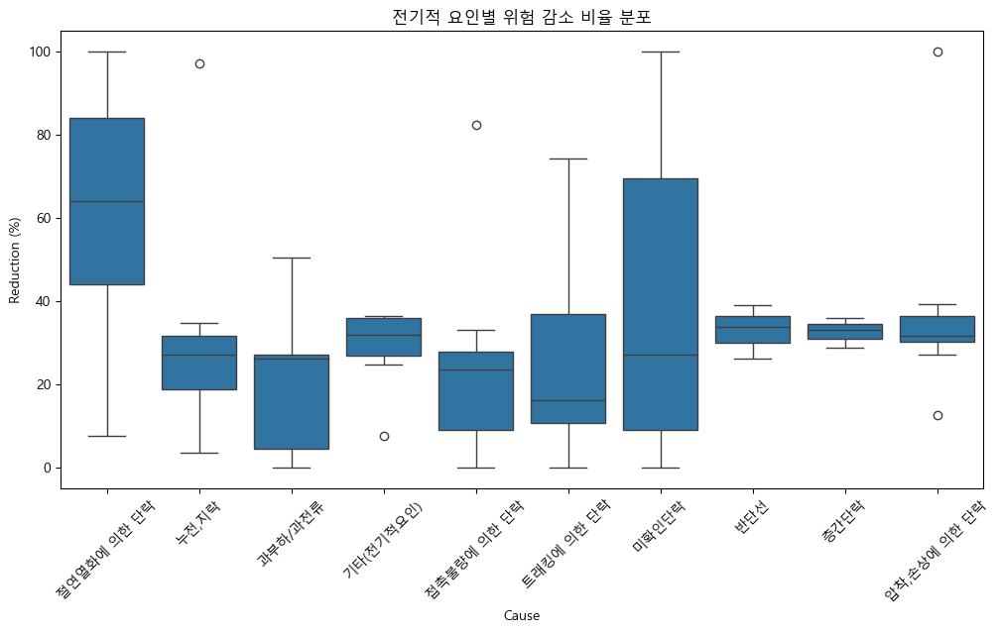

In [41]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import shap
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler

# 한글 폰트 설정
plt.rc('font', family='Malgun Gothic')
plt.rcParams['axes.unicode_minus'] = False

# 현재 실행 디렉토리 확인
BASE_DIR = os.getcwd()
print("현재 실행 디렉토리:", BASE_DIR)

# 데이터 경로 설정
DATA_PATH = os.path.join(BASE_DIR, "Old_team_project3-3", ".vscode", "dy_AiData", "electric_ai_data.csv")

# 데이터 로드
data = pd.read_csv(DATA_PATH)

# 로그 변환 (발생 건수와 피해 금액을 로그 변환하여 균형 유지)
data["log_total_incidents"] = np.log1p(data["total_incidents"])
data["log_total_damage"] = np.log1p(data["total_damage"])

# 지역별 재해 건수와 피해 금액의 상대적 중요도 계산
data["incident_ratio"] = data.groupby("region_province")["total_incidents"].transform(lambda x: x / x.sum())
data["damage_ratio"] = data.groupby("region_province")["total_damage"].transform(lambda x: x / x.sum())

# 가중치를 적용한 위험 점수 계산 (발생 건수: 0.7, 피해 금액: 0.3)
incident_weight = 0.7
damage_weight = 0.3

data["adjusted_risk_score"] = (incident_weight * data["incident_ratio"] * data["log_total_incidents"]) + \
                              (damage_weight * data["damage_ratio"] * data["log_total_damage"])

# 데이터 정규화
scaler = StandardScaler()
data[["z_log_total_incidents", "z_log_total_damage", "z_adjusted_risk_score"]] = scaler.fit_transform(
    data[["log_total_incidents", "log_total_damage", "adjusted_risk_score"]]
)

# 지역 및 전기적 요인 목록
regions = data["region_province"].unique()
causes = data["cause_subcategory"].unique()

# 결과 저장 리스트
shap_results = []

# K-Fold 설정
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# 랜덤포레스트 + SHAP 분석
for train_index, test_index in kf.split(data):
    train_data, test_data = data.iloc[train_index], data.iloc[test_index]
    X_train = train_data[["z_log_total_incidents", "z_log_total_damage"]]
    y_train = train_data["z_adjusted_risk_score"]
    X_test = test_data[["z_log_total_incidents", "z_log_total_damage"]]

    # 랜덤포레스트 학습
    model = RandomForestRegressor(n_estimators=50, max_depth=5, random_state=42)
    model.fit(X_train, y_train)

    # 변수 중요도 가져오기
    feature_importance = model.feature_importances_

    # SHAP 분석
    explainer = shap.TreeExplainer(model)
    shap_values = explainer(X_test)

    # SHAP 기여도를 테스트 데이터 크기에 맞게 조정
    shap_contributions = np.abs(shap_values.values)

    # `test_data`에서 지역별 데이터만 필터링
    for region in regions:
        region_data = test_data[test_data["region_province"] == region]  # `test_data` 기준으로 필터링
        if len(region_data) < 2:
            continue

        for cause in causes:
            cause_data = region_data[region_data["cause_subcategory"] == cause]  # `test_data`에서 원인별 필터링
            if cause_data.empty:
                continue

            improved_data = cause_data.copy()
            improved_data[["z_log_total_incidents", "z_log_total_damage"]] *= 0.5  # 요인을 50%만 감소시키는 방식 적용

            # 기존 위험 점수
            original_risk_score = model.predict(cause_data[["z_log_total_incidents", "z_log_total_damage"]]).mean()

            # 위험 요인 감소 후 점수 (음수 방지)
            improved_risk_score = max(0, model.predict(improved_data[["z_log_total_incidents", "z_log_total_damage"]]).mean())

            # 지역별 & 원인별 SHAP 기여도 적용 (mean 방식 활용)
            region_shap_values = shap_contributions[test_data.index.isin(region_data.index), :].mean(axis=0)
            cause_shap_values = shap_contributions[test_data.index.isin(cause_data.index), :].mean(axis=0)

            shap_region_mean = np.mean(region_shap_values) if len(region_shap_values) > 0 else 0
            shap_cause_mean = np.mean(cause_shap_values) if len(cause_shap_values) > 0 else 0

            # SHAP 값과 변수 중요도를 활용한 감소율 조정
            shap_importance_weight = (feature_importance[0] * shap_region_mean) + (feature_importance[1] * shap_cause_mean)
            reduction_raw = ((original_risk_score - improved_risk_score) / original_risk_score) * 100
            adjusted_reduction = max(0, min(shap_importance_weight * 100, reduction_raw))

            shap_results.append({
                "Region": region,
                "Cause": cause,
                "Reduction (%)": adjusted_reduction,
                "SHAP Contribution (%)": shap_importance_weight * 100
            })

# 데이터프레임 변환
shap_df = pd.DataFrame(shap_results)

# 📊 전기적 요인별 위험 감소 비율 분포
plt.figure(figsize=(12, 6))
sns.boxplot(x="Cause", y="Reduction (%)", data=shap_df)
plt.xticks(rotation=45)
plt.title("전기적 요인별 위험 감소 비율 분포")
plt.show()


현재 실행 디렉토리: D:\01-STUDY\3차 팀PJ


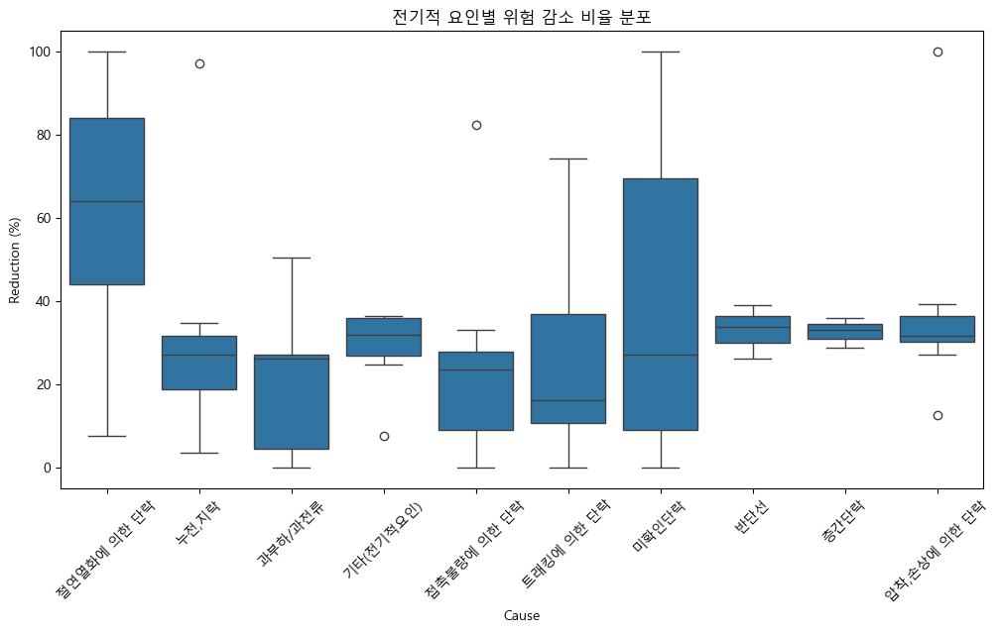

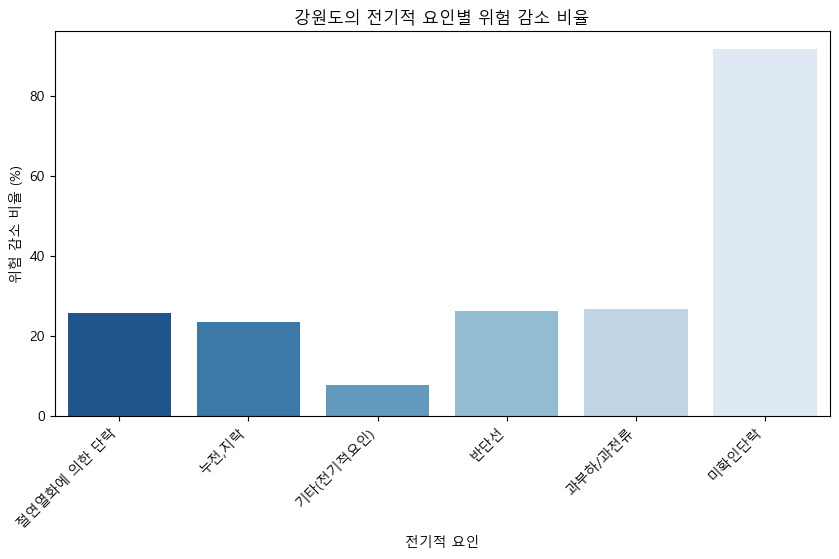

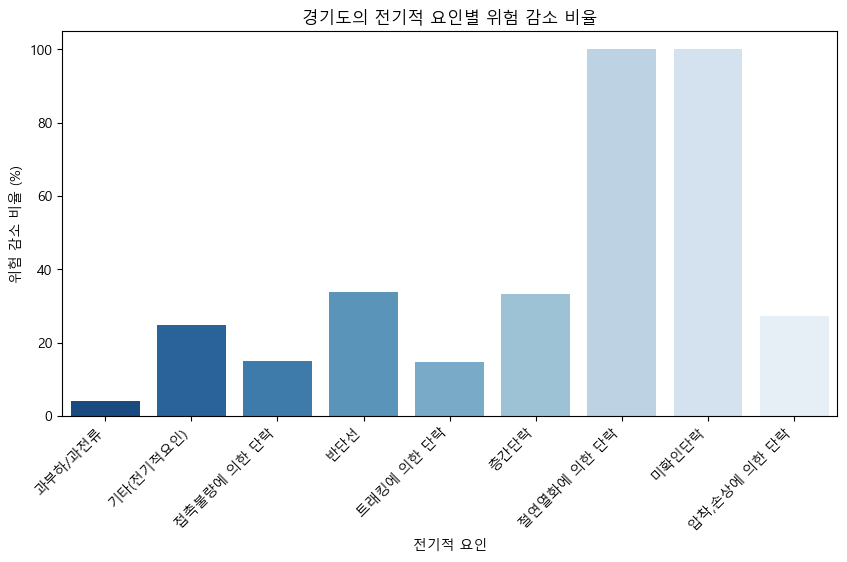

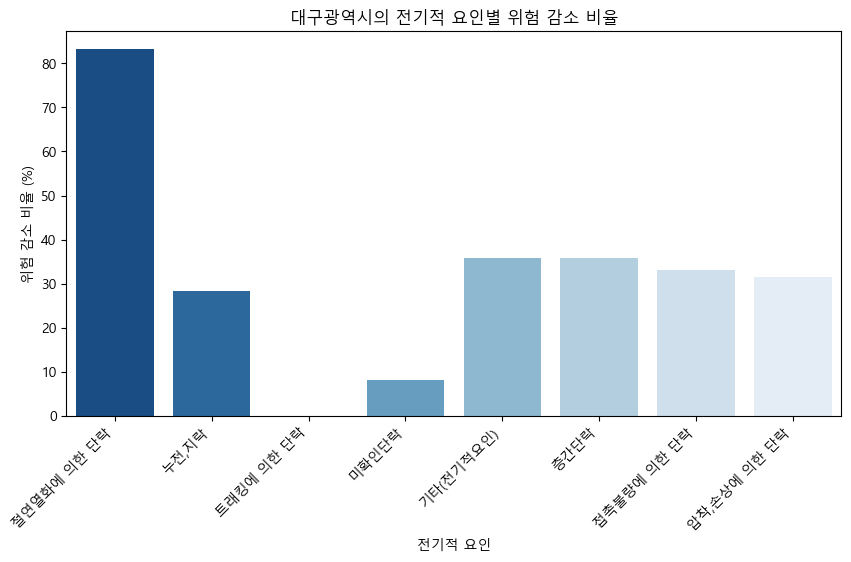

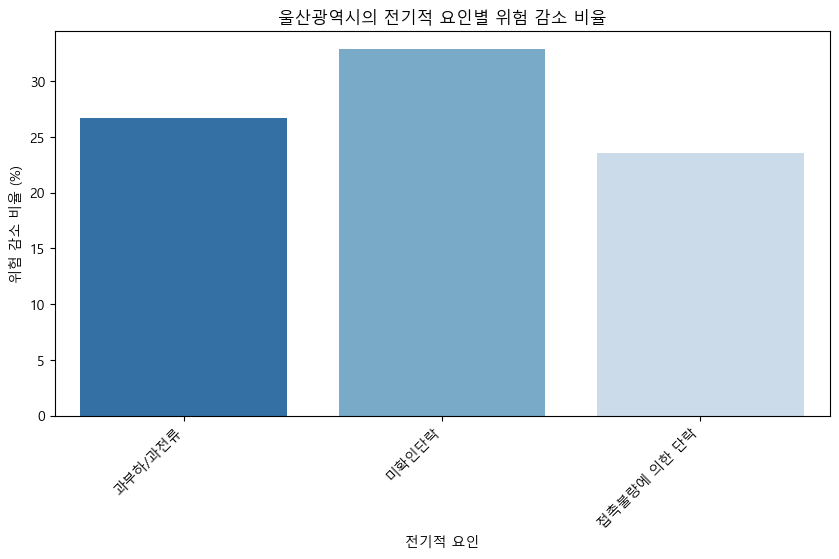

...

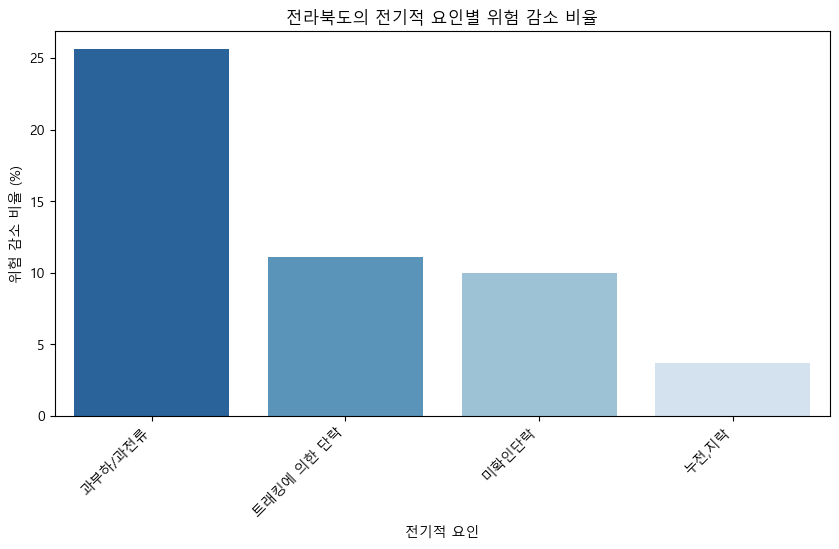

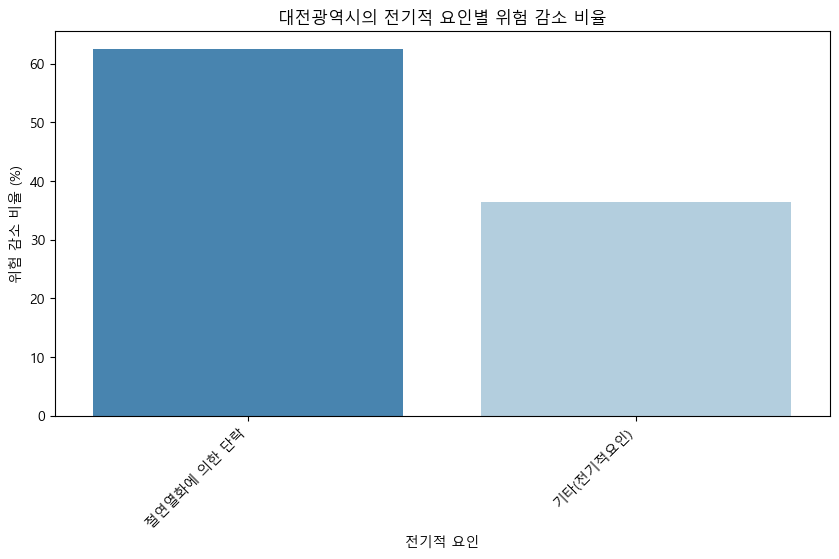

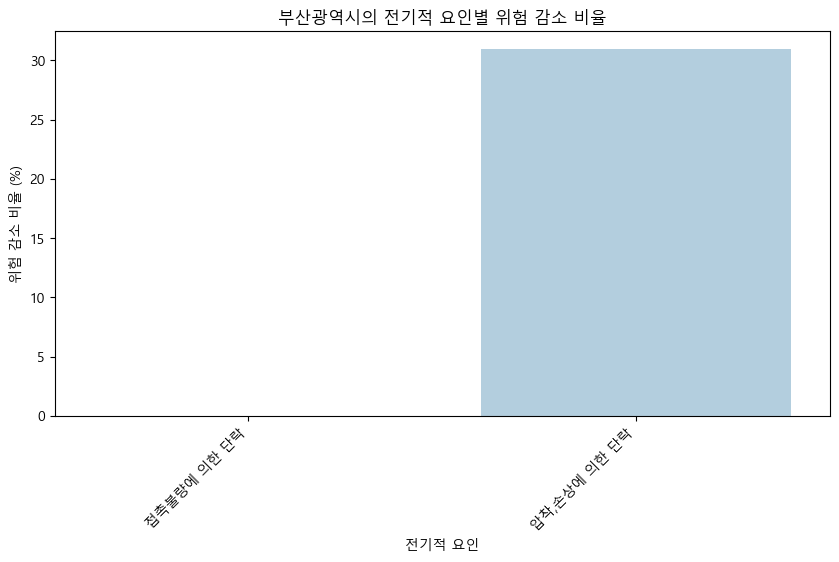

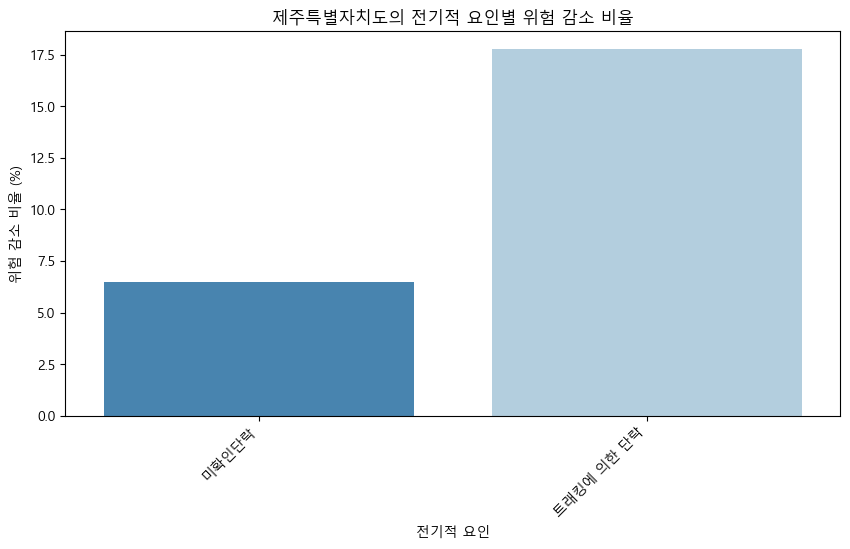

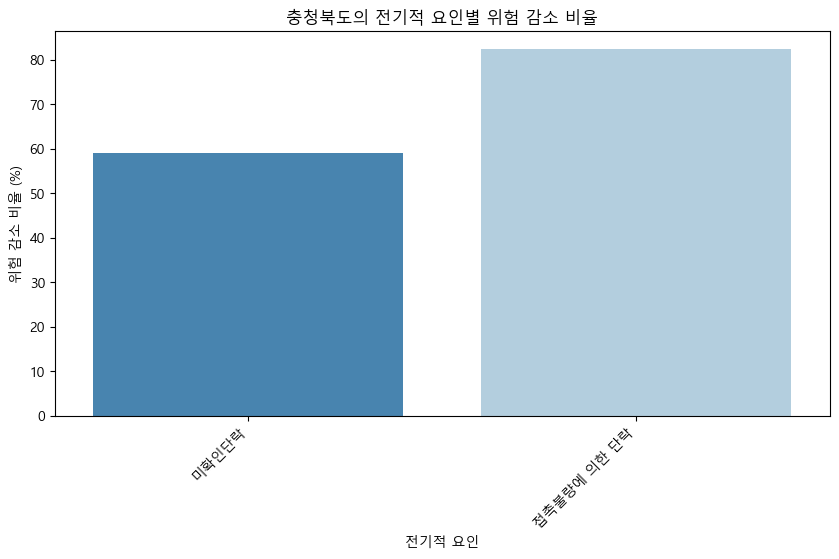

In [43]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import shap
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler

# 한글 폰트 설정
plt.rc('font', family='Malgun Gothic')
plt.rcParams['axes.unicode_minus'] = False

# 현재 실행 디렉토리 확인
BASE_DIR = os.getcwd()
print("현재 실행 디렉토리:", BASE_DIR)

# 데이터 경로 설정
DATA_PATH = os.path.join(BASE_DIR, "Old_team_project3-3", ".vscode", "dy_AiData", "electric_ai_data.csv")

# 데이터 로드
data = pd.read_csv(DATA_PATH)

# 로그 변환 (발생 건수와 피해 금액을 로그 변환하여 균형 유지)
data["log_total_incidents"] = np.log1p(data["total_incidents"])
data["log_total_damage"] = np.log1p(data["total_damage"])

# 지역별 재해 건수와 피해 금액의 상대적 중요도 계산
data["incident_ratio"] = data.groupby("region_province")["total_incidents"].transform(lambda x: x / x.sum())
data["damage_ratio"] = data.groupby("region_province")["total_damage"].transform(lambda x: x / x.sum())

# 가중치를 적용한 위험 점수 계산 (발생 건수: 0.7, 피해 금액: 0.3)
incident_weight = 0.7
damage_weight = 0.3

data["adjusted_risk_score"] = (incident_weight * data["incident_ratio"] * data["log_total_incidents"]) + \
                              (damage_weight * data["damage_ratio"] * data["log_total_damage"])

# 데이터 정규화
scaler = StandardScaler()
data[["z_log_total_incidents", "z_log_total_damage", "z_adjusted_risk_score"]] = scaler.fit_transform(
    data[["log_total_incidents", "log_total_damage", "adjusted_risk_score"]]
)

# 지역 및 전기적 요인 목록
regions = data["region_province"].unique()
causes = data["cause_subcategory"].unique()

# 결과 저장 리스트
shap_results = []

# K-Fold 설정
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# 랜덤포레스트 + SHAP 분석
for train_index, test_index in kf.split(data):
    train_data, test_data = data.iloc[train_index], data.iloc[test_index]
    X_train = train_data[["z_log_total_incidents", "z_log_total_damage"]]
    y_train = train_data["z_adjusted_risk_score"]
    X_test = test_data[["z_log_total_incidents", "z_log_total_damage"]]

    # 랜덤포레스트 학습
    model = RandomForestRegressor(n_estimators=50, max_depth=5, random_state=42)
    model.fit(X_train, y_train)

    # 변수 중요도 가져오기
    feature_importance = model.feature_importances_

    # SHAP 분석
    explainer = shap.TreeExplainer(model)
    shap_values = explainer(X_test)

    # SHAP 기여도를 테스트 데이터 크기에 맞게 조정
    shap_contributions = np.abs(shap_values.values)

    # `test_data`에서 지역별 데이터만 필터링
    for region in regions:
        region_data = test_data[test_data["region_province"] == region]  # `test_data` 기준으로 필터링
        if len(region_data) < 2:
            continue

        for cause in causes:
            cause_data = region_data[region_data["cause_subcategory"] == cause]  # `test_data`에서 원인별 필터링
            if cause_data.empty:
                continue

            improved_data = cause_data.copy()
            improved_data[["z_log_total_incidents", "z_log_total_damage"]] *= 0.5  # 요인을 50%만 감소시키는 방식 적용

            # 기존 위험 점수
            original_risk_score = model.predict(cause_data[["z_log_total_incidents", "z_log_total_damage"]]).mean()

            # 위험 요인 감소 후 점수 (음수 방지)
            improved_risk_score = max(0, model.predict(improved_data[["z_log_total_incidents", "z_log_total_damage"]]).mean())

            # 지역별 & 원인별 SHAP 기여도 적용 (mean 방식 활용)
            region_shap_values = shap_contributions[test_data.index.isin(region_data.index), :].mean(axis=0)
            cause_shap_values = shap_contributions[test_data.index.isin(cause_data.index), :].mean(axis=0)

            shap_region_mean = np.mean(region_shap_values) if len(region_shap_values) > 0 else 0
            shap_cause_mean = np.mean(cause_shap_values) if len(cause_shap_values) > 0 else 0

            # SHAP 값과 변수 중요도를 활용한 감소율 조정
            shap_importance_weight = (feature_importance[0] * shap_region_mean) + (feature_importance[1] * shap_cause_mean)
            reduction_raw = ((original_risk_score - improved_risk_score) / original_risk_score) * 100
            adjusted_reduction = max(0, min(shap_importance_weight * 100, reduction_raw))

            shap_results.append({
                "Region": region,
                "Cause": cause,
                "Reduction (%)": adjusted_reduction,
                "SHAP Contribution (%)": shap_importance_weight * 100
            })

# 데이터프레임 변환
shap_df = pd.DataFrame(shap_results)

# 📊 전기적 요인별 위험 감소 비율 분포
plt.figure(figsize=(12, 6))
sns.boxplot(x="Cause", y="Reduction (%)", data=shap_df)
plt.xticks(rotation=45)
plt.title("전기적 요인별 위험 감소 비율 분포")
plt.show()

# 📊 지역별 그래프 생성
for region in shap_df["Region"].unique():
    plt.figure(figsize=(10, 5))
    region_df = shap_df[shap_df["Region"] == region]
    
    sns.barplot(x="Cause", y="Reduction (%)", data=region_df, hue="Cause", legend=False, palette="Blues_r")
    
    plt.xticks(rotation=45, ha="right")
    plt.title(f"{region}의 전기적 요인별 위험 감소 비율")
    plt.ylabel("위험 감소 비율 (%)")
    plt.xlabel("전기적 요인")
    
    plt.show()


In [44]:
print(shap_df.head())  # SHAP 데이터가 정상적으로 존재하는지 확인

  Region        Cause  Reduction (%)  SHAP Contribution (%)
0    강원도  절연열화에 의한 단락      25.628930              25.628930
1    강원도        누전,지락      23.419512              23.419512
2    경기도      과부하/과전류       4.146760               4.146760
3    경기도    기타(전기적요인)      24.845806              24.845806
4    경기도  접촉불량에 의한 단락      14.857369              14.857369


현재 실행 디렉토리: D:\01-STUDY\3차 팀PJ


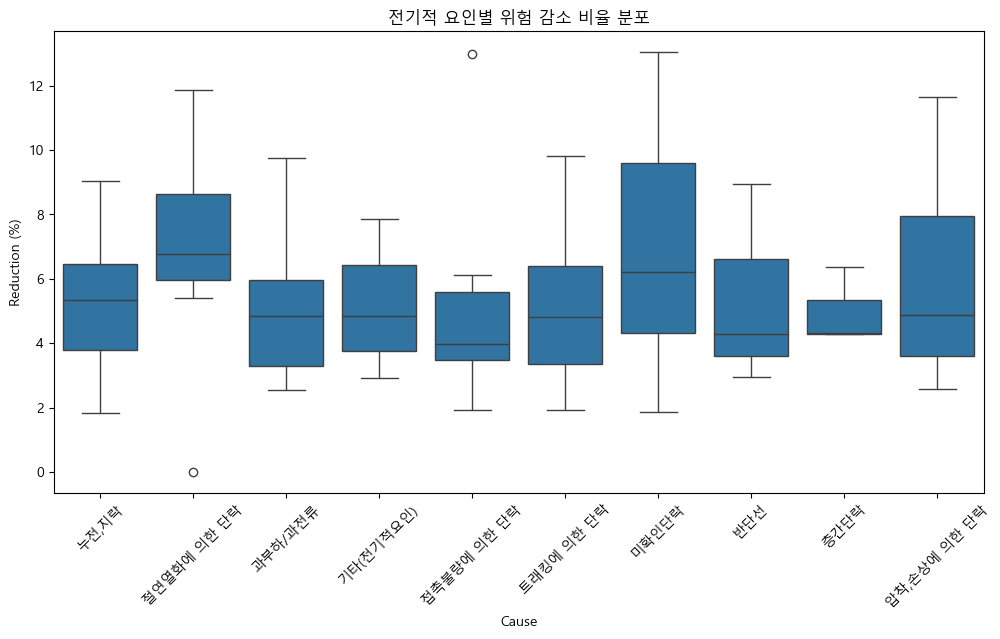

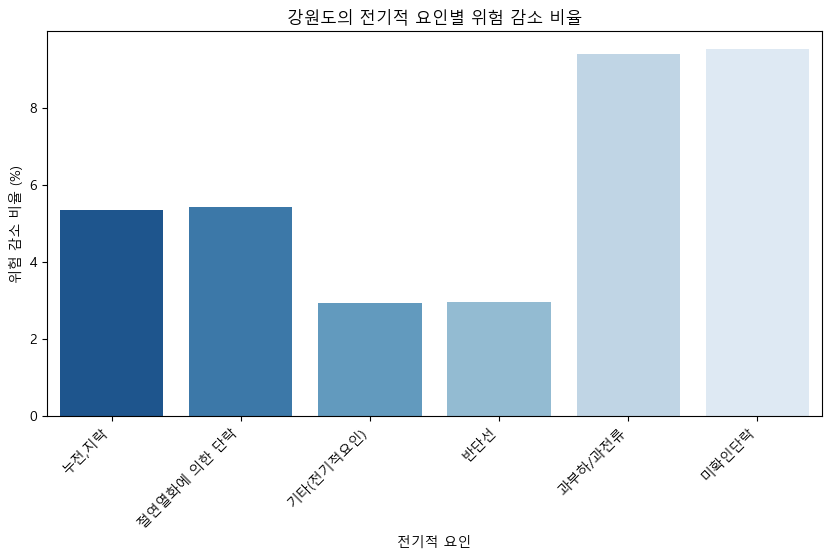

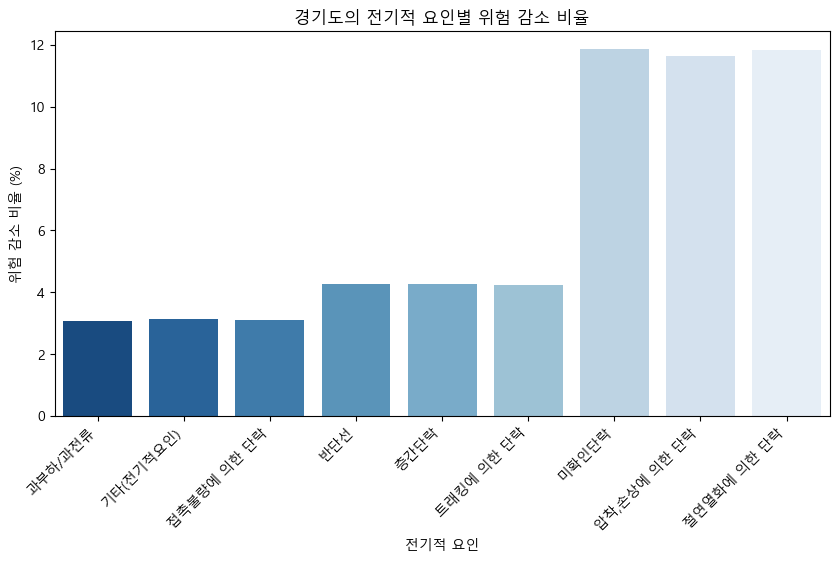

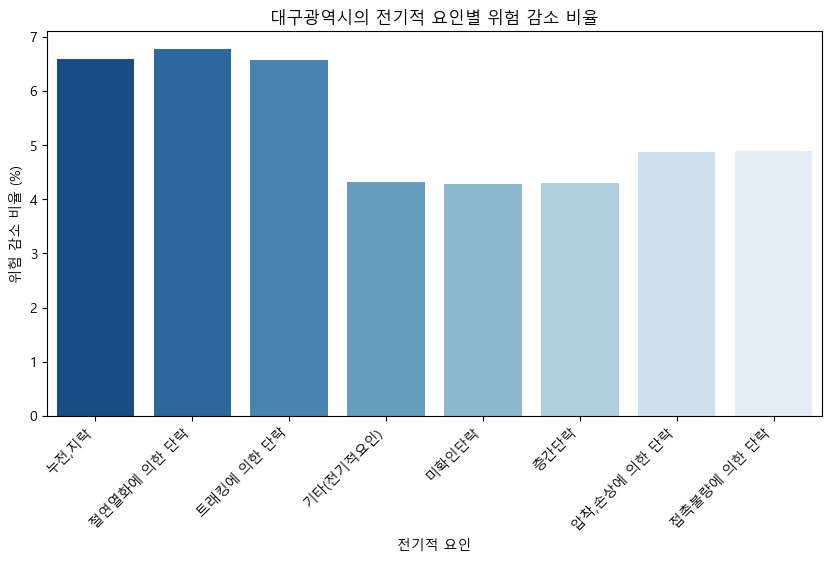

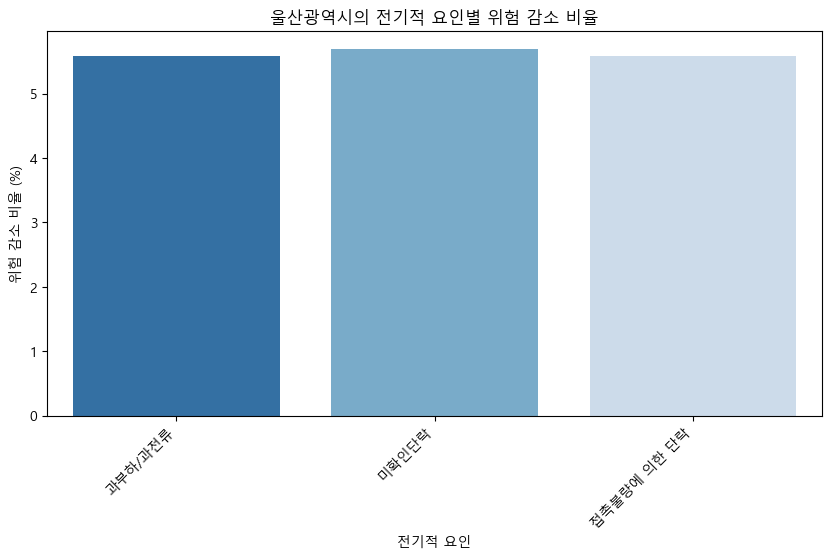

...

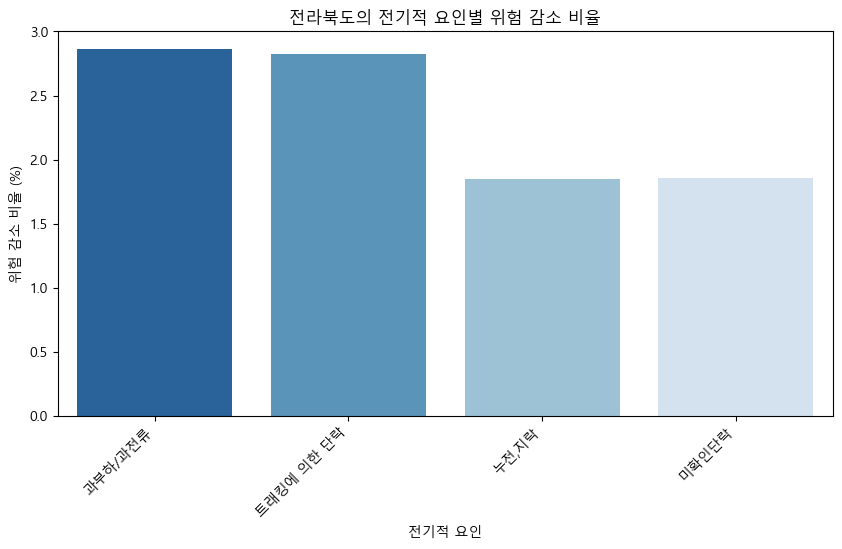

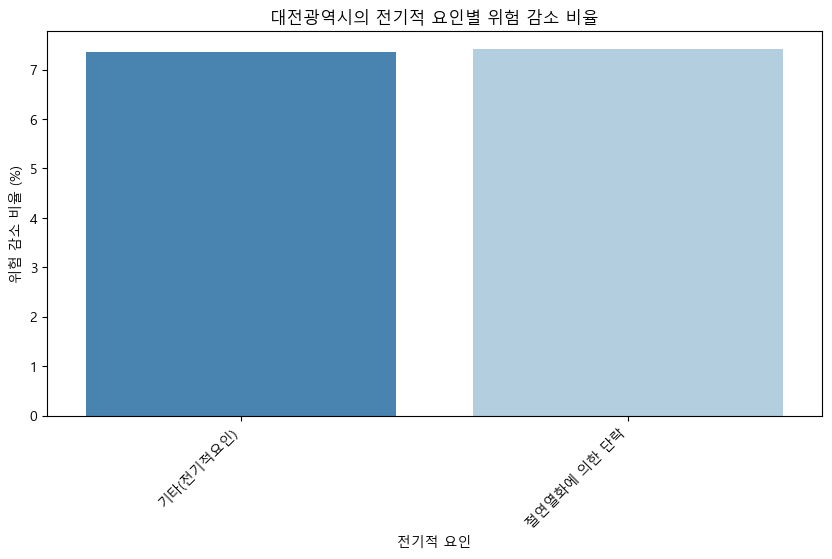

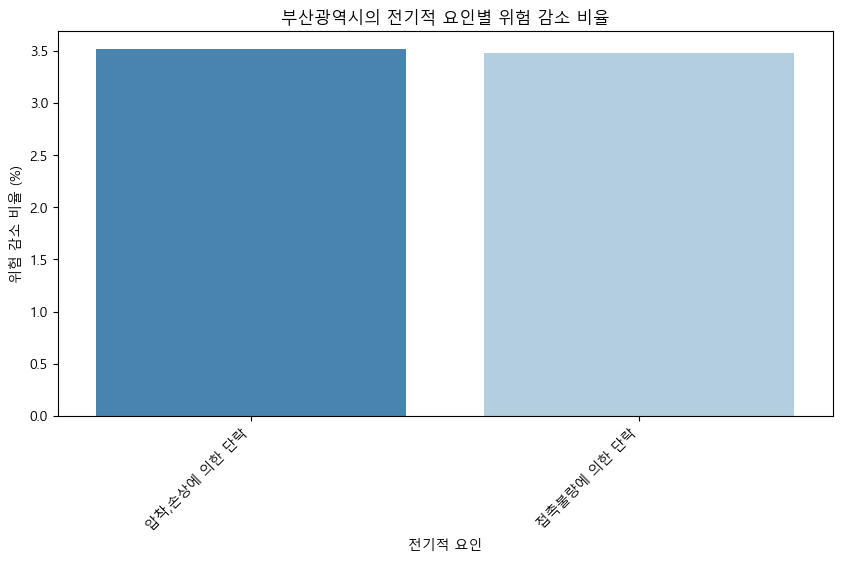

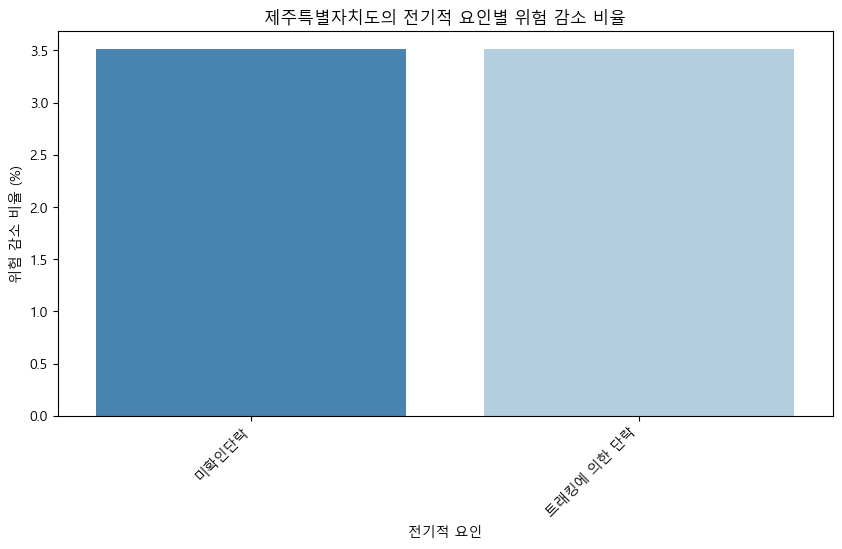

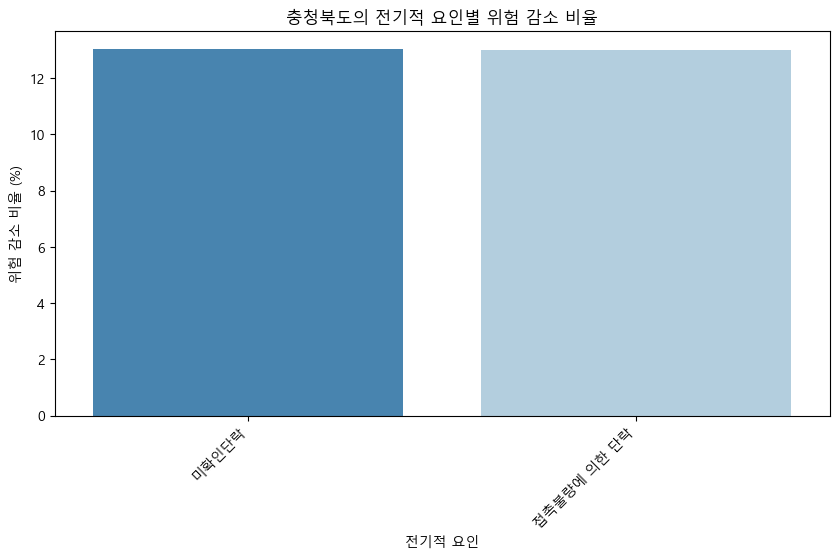

In [45]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import shap
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler

# 한글 폰트 설정
plt.rc('font', family='Malgun Gothic')
plt.rcParams['axes.unicode_minus'] = False

# 현재 실행 디렉토리 확인
BASE_DIR = os.getcwd()
print("현재 실행 디렉토리:", BASE_DIR)

# 데이터 경로 설정
DATA_PATH = os.path.join(BASE_DIR, "Old_team_project3-3", ".vscode", "dy_AiData", "electric_ai_data.csv")

# 데이터 로드
data = pd.read_csv(DATA_PATH)

# 로그 변환 (발생 건수와 피해 금액을 로그 변환하여 균형 유지)
data["log_total_incidents"] = np.log1p(data["total_incidents"])
data["log_total_damage"] = np.log1p(data["total_damage"])

# 지역별 재해 건수와 피해 금액의 상대적 중요도 계산
data["incident_ratio"] = data.groupby("region_province")["total_incidents"].transform(lambda x: x / x.sum())
data["damage_ratio"] = data.groupby("region_province")["total_damage"].transform(lambda x: x / x.sum())

# 가중치를 적용한 위험 점수 계산 (발생 건수: 0.7, 피해 금액: 0.3)
incident_weight = 0.7
damage_weight = 0.3

data["adjusted_risk_score"] = (incident_weight * data["incident_ratio"] * data["log_total_incidents"]) + \
                              (damage_weight * data["damage_ratio"] * data["log_total_damage"])

# 데이터 정규화
scaler = StandardScaler()
data[["z_log_total_incidents", "z_log_total_damage", "z_adjusted_risk_score"]] = scaler.fit_transform(
    data[["log_total_incidents", "log_total_damage", "adjusted_risk_score"]]
)

# **One-Hot Encoding 적용 (전기적 세부요인을 독립 변수로 변환)**
data = pd.get_dummies(data, columns=["cause_subcategory"])

# 지역 및 전기적 요인 목록
regions = data["region_province"].unique()
cause_columns = [col for col in data.columns if col.startswith("cause_subcategory_")]

# 결과 저장 리스트
shap_results = []

# K-Fold 설정
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# 랜덤포레스트 + SHAP 분석
for train_index, test_index in kf.split(data):
    train_data, test_data = data.iloc[train_index], data.iloc[test_index]
    
    # 모델 입력 변수: 총 재해건수, 피해금액, 전기적 세부요인 (One-Hot Encoding된 컬럼들)
    X_train = train_data[["z_log_total_incidents", "z_log_total_damage"] + cause_columns]
    y_train = train_data["z_adjusted_risk_score"]
    X_test = test_data[["z_log_total_incidents", "z_log_total_damage"] + cause_columns]

    # 랜덤포레스트 학습
    model = RandomForestRegressor(n_estimators=50, max_depth=5, random_state=42)
    model.fit(X_train, y_train)

    # 변수 중요도 가져오기
    feature_importance_dict = dict(zip(X_train.columns, model.feature_importances_))

    # SHAP 분석
    explainer = shap.TreeExplainer(model)
    shap_values = explainer(X_test)

    # SHAP 기여도 계산
    shap_contributions = np.abs(shap_values.values)

    # `test_data`에서 지역별 데이터만 필터링
    for region in regions:
        region_data = test_data[test_data["region_province"] == region]  
        if len(region_data) < 2:
            continue

        for cause in cause_columns:
            cause_data = region_data[region_data[cause] == 1]
            if cause_data.empty:
                continue

            improved_data = cause_data.copy()
            improved_data[["z_log_total_incidents", "z_log_total_damage"]] *= 0.5  # 요인을 50% 감소시키는 방식 적용

            # 기존 위험 점수
            original_risk_score = model.predict(cause_data[["z_log_total_incidents", "z_log_total_damage"] + cause_columns]).mean()

            # 위험 요인 감소 후 점수 (음수 방지)
            improved_risk_score = max(0, model.predict(improved_data[["z_log_total_incidents", "z_log_total_damage"] + cause_columns]).mean())

            # 지역 및 원인별 SHAP 기여도 계산
            region_shap_values = shap_contributions[test_data.index.isin(region_data.index), :].mean(axis=0)
            cause_shap_values = shap_contributions[test_data.index.isin(cause_data.index), :].mean(axis=0)

            shap_region_mean = np.mean(region_shap_values) if len(region_shap_values) > 0 else 0
            shap_cause_mean = np.mean(cause_shap_values) if len(cause_shap_values) > 0 else 0

            # 전기적 세부요인의 변수 중요도 평균 계산
            cause_importance = np.mean([feature_importance_dict[cause] for cause in cause_columns if cause in feature_importance_dict])

            # SHAP 값과 변수 중요도를 활용한 감소율 조정
            shap_importance_weight = (
                (feature_importance_dict["z_log_total_incidents"] * shap_region_mean) +
                (feature_importance_dict["z_log_total_damage"] * shap_region_mean) +
                (cause_importance * shap_cause_mean)  # 전기적 세부요인의 변수 중요도 반영
            )

            # 위험 점수 감소율 조정
            reduction_raw = ((original_risk_score - improved_risk_score) / original_risk_score) * 100
            adjusted_reduction = max(0, min(shap_importance_weight * 100, reduction_raw))

            shap_results.append({
                "Region": region,
                "Cause": cause.replace("cause_subcategory_", ""),  # 원래 전기적 요인 이름 복구
                "Reduction (%)": adjusted_reduction,
                "SHAP Contribution (%)": shap_importance_weight * 100
            })

# 데이터프레임 변환
shap_df = pd.DataFrame(shap_results)

# 📊 전기적 요인별 위험 감소 비율 분포
plt.figure(figsize=(12, 6))
sns.boxplot(x="Cause", y="Reduction (%)", data=shap_df)
plt.xticks(rotation=45)
plt.title("전기적 요인별 위험 감소 비율 분포")
plt.show()

# 📊 지역별 그래프 생성
for region in shap_df["Region"].unique():
    plt.figure(figsize=(10, 5))
    region_df = shap_df[shap_df["Region"] == region]
    
    sns.barplot(x="Cause", y="Reduction (%)", data=region_df, hue="Cause", legend=False, palette="Blues_r")
    
    plt.xticks(rotation=45, ha="right")
    plt.title(f"{region}의 전기적 요인별 위험 감소 비율")
    plt.ylabel("위험 감소 비율 (%)")
    plt.xlabel("전기적 요인")
    
    plt.show()


현재 실행 디렉토리: D:\01-STUDY\3차 팀PJ


C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\3015496804.py:142: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="SHAP Contribution (%)", data=region_df, palette="Blues_r")


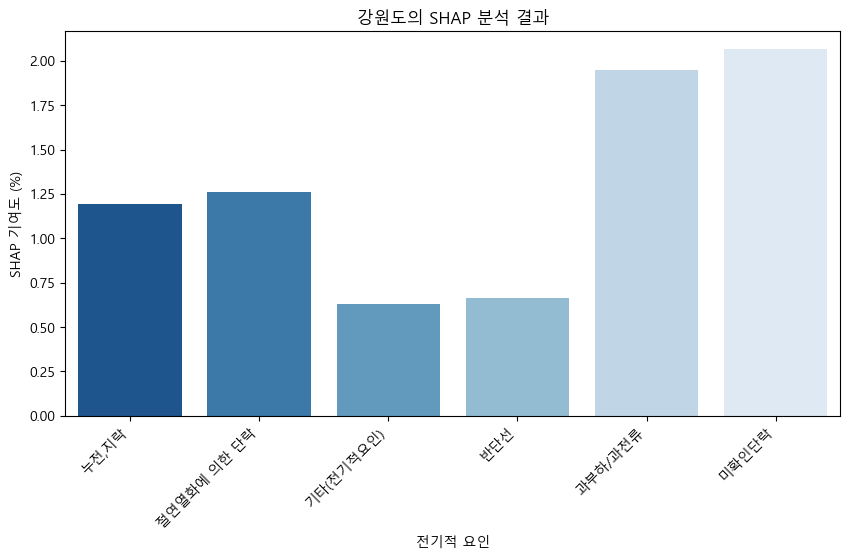

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\3015496804.py:142: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="SHAP Contribution (%)", data=region_df, palette="Blues_r")


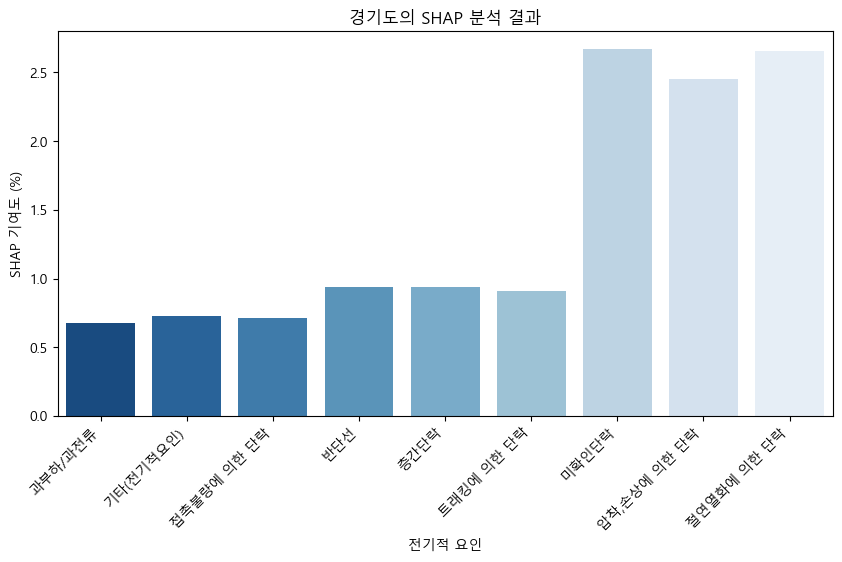

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\3015496804.py:142: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="SHAP Contribution (%)", data=region_df, palette="Blues_r")


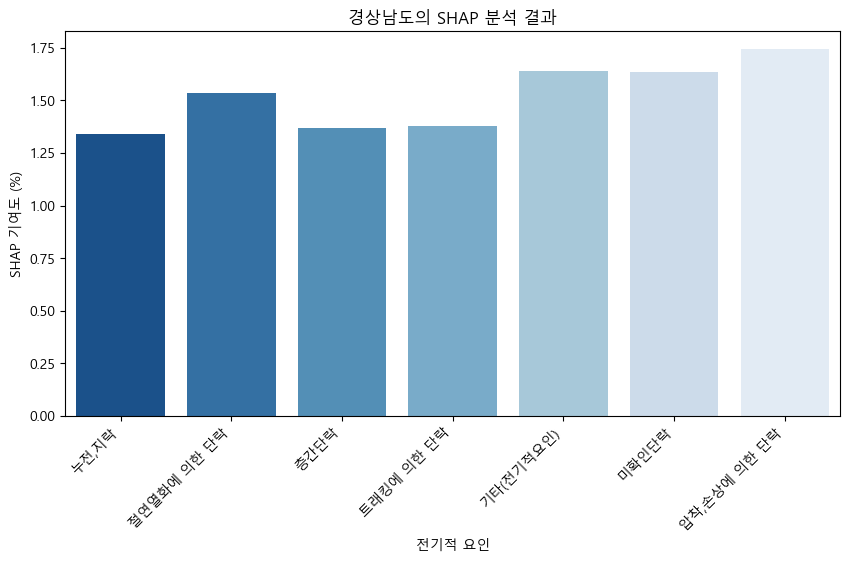

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\3015496804.py:142: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="SHAP Contribution (%)", data=region_df, palette="Blues_r")


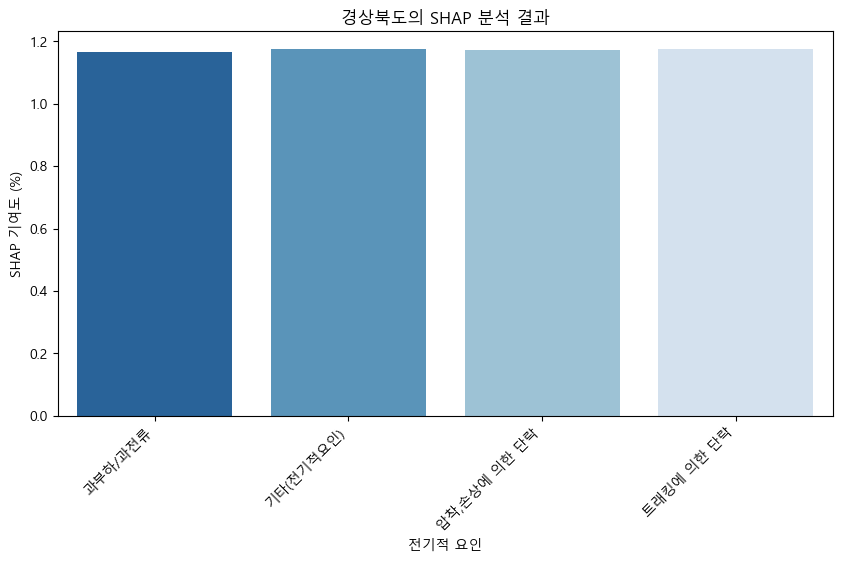

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\3015496804.py:142: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="SHAP Contribution (%)", data=region_df, palette="Blues_r")


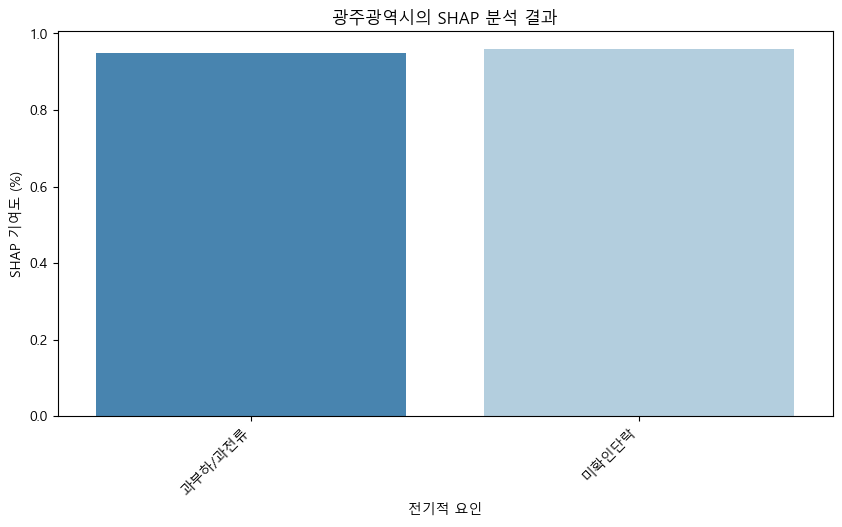

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\3015496804.py:142: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="SHAP Contribution (%)", data=region_df, palette="Blues_r")


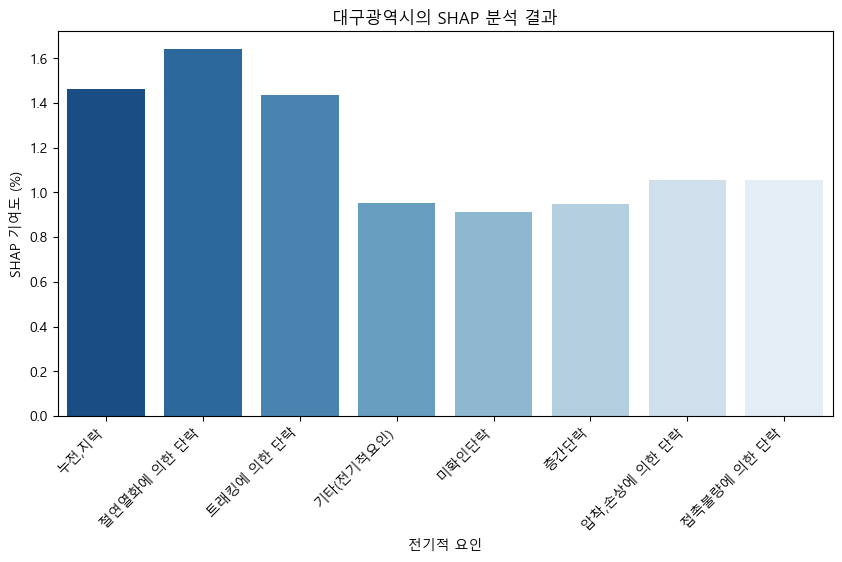

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\3015496804.py:142: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="SHAP Contribution (%)", data=region_df, palette="Blues_r")


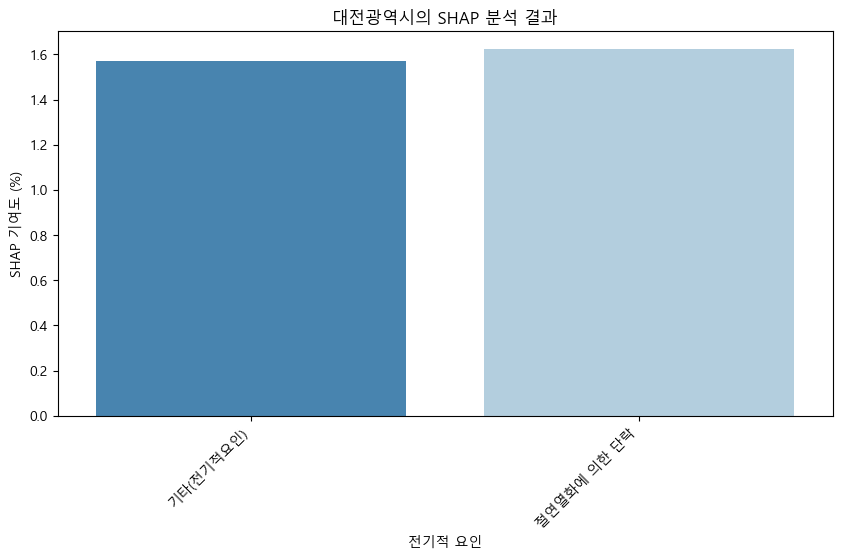

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\3015496804.py:142: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="SHAP Contribution (%)", data=region_df, palette="Blues_r")


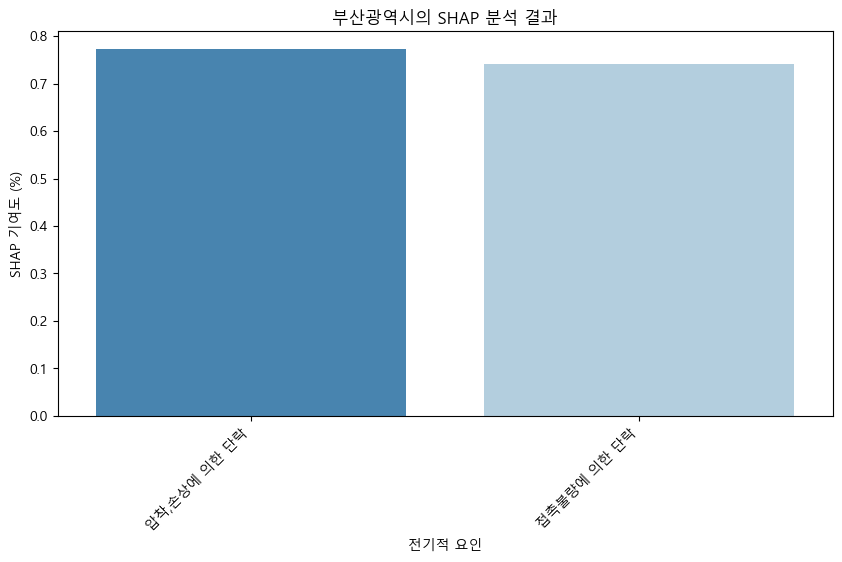

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\3015496804.py:142: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="SHAP Contribution (%)", data=region_df, palette="Blues_r")


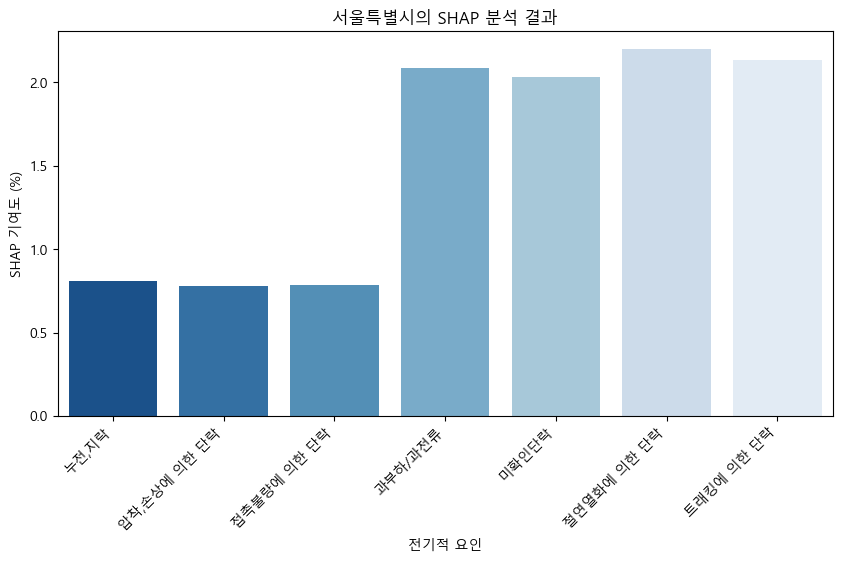

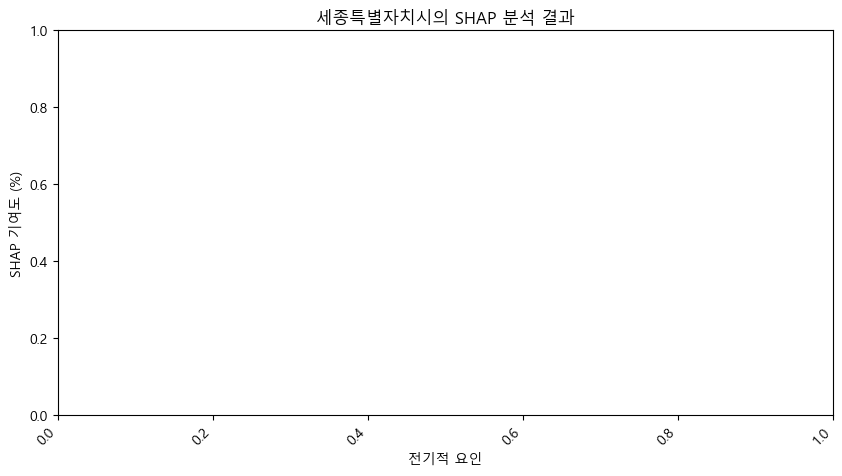

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\3015496804.py:142: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="SHAP Contribution (%)", data=region_df, palette="Blues_r")


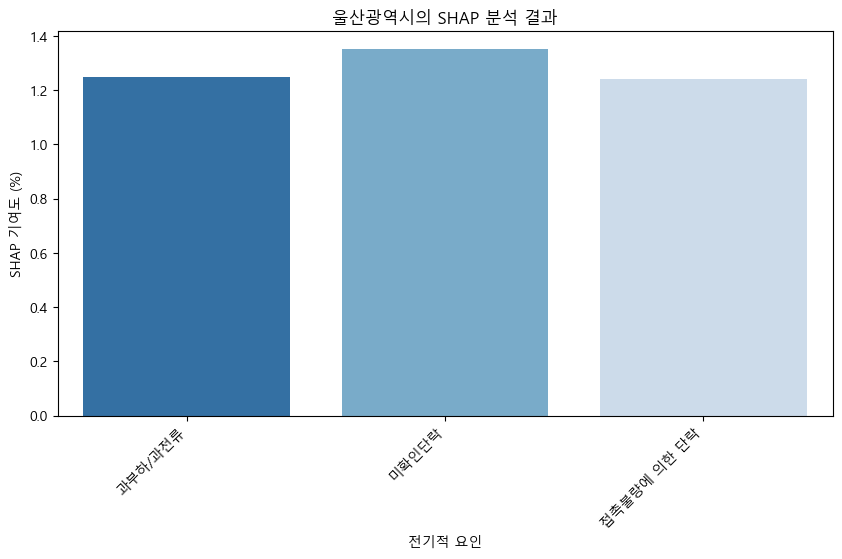

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\3015496804.py:142: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="SHAP Contribution (%)", data=region_df, palette="Blues_r")


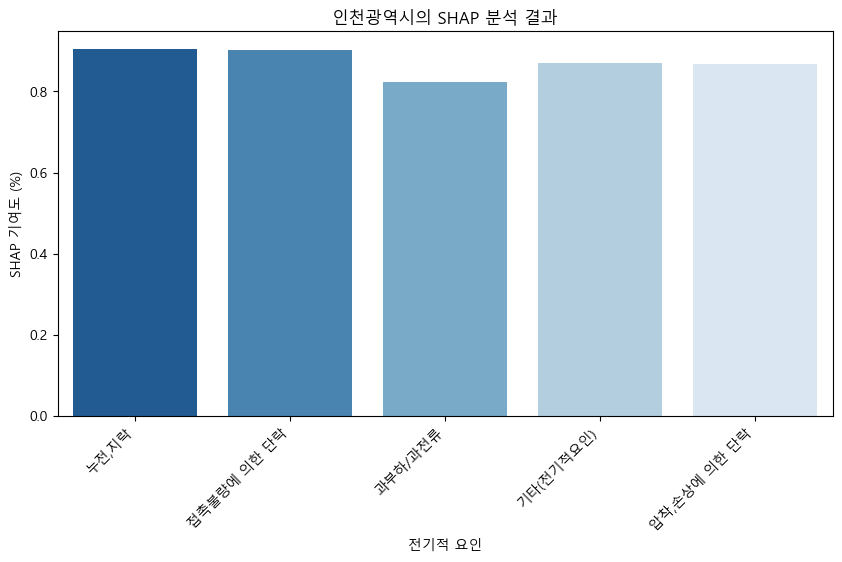

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\3015496804.py:142: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="SHAP Contribution (%)", data=region_df, palette="Blues_r")


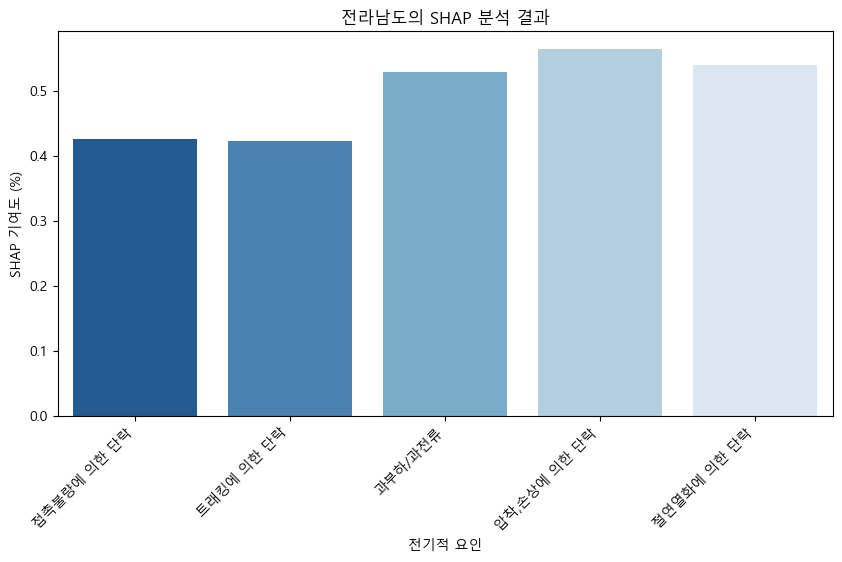

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\3015496804.py:142: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="SHAP Contribution (%)", data=region_df, palette="Blues_r")


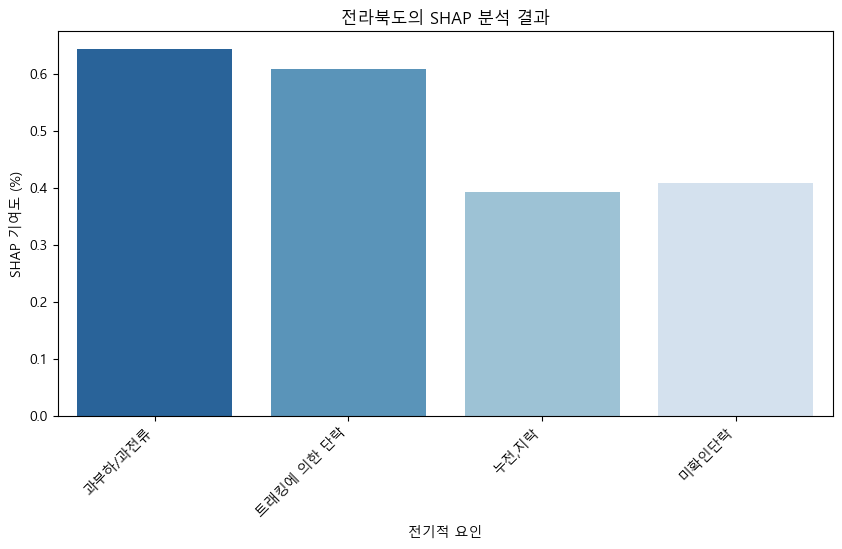

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\3015496804.py:142: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="SHAP Contribution (%)", data=region_df, palette="Blues_r")


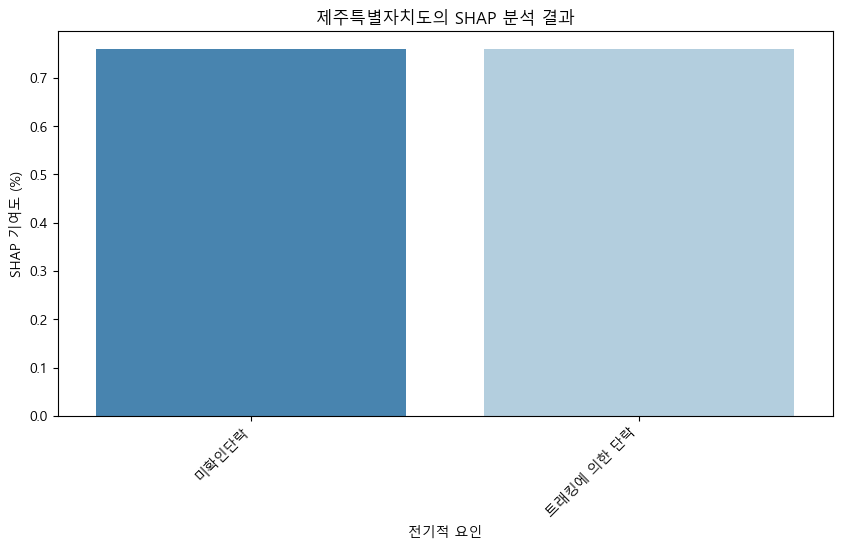

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\3015496804.py:142: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="SHAP Contribution (%)", data=region_df, palette="Blues_r")


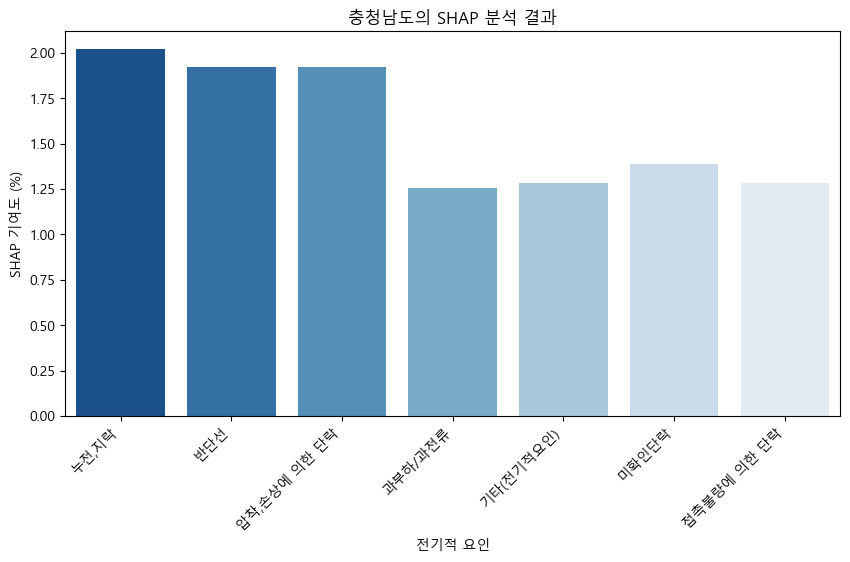

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\3015496804.py:142: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="SHAP Contribution (%)", data=region_df, palette="Blues_r")


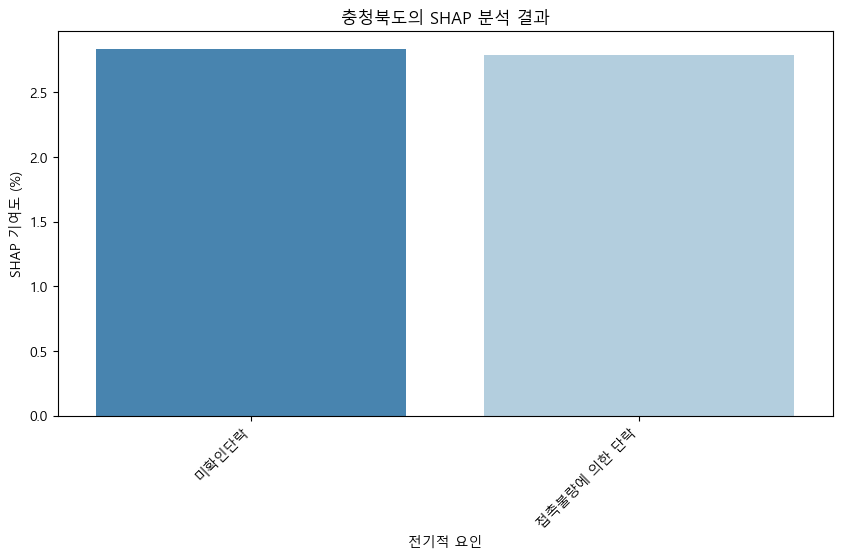

In [46]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import shap
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler

# 한글 폰트 설정
plt.rc('font', family='Malgun Gothic')
plt.rcParams['axes.unicode_minus'] = False

# 현재 실행 디렉토리 확인
BASE_DIR = os.getcwd()
print("현재 실행 디렉토리:", BASE_DIR)

# 데이터 경로 설정
DATA_PATH = os.path.join(BASE_DIR, "Old_team_project3-3", ".vscode", "dy_AiData", "electric_ai_data.csv")

# 데이터 로드
data = pd.read_csv(DATA_PATH)

# 로그 변환 (발생 건수와 피해 금액을 로그 변환하여 균형 유지)
data["log_total_incidents"] = np.log1p(data["total_incidents"])
data["log_total_damage"] = np.log1p(data["total_damage"])

# 지역별 재해 건수와 피해 금액의 상대적 중요도 계산
data["incident_ratio"] = data.groupby("region_province")["total_incidents"].transform(lambda x: x / x.sum())
data["damage_ratio"] = data.groupby("region_province")["total_damage"].transform(lambda x: x / x.sum())

# 가중치를 적용한 위험 점수 계산 (발생 건수: 0.7, 피해 금액: 0.3)
incident_weight = 0.7
damage_weight = 0.3

data["adjusted_risk_score"] = (incident_weight * data["incident_ratio"] * data["log_total_incidents"]) + \
                              (damage_weight * data["damage_ratio"] * data["log_total_damage"])

# 데이터 정규화
scaler = StandardScaler()
data[["z_log_total_incidents", "z_log_total_damage", "z_adjusted_risk_score"]] = scaler.fit_transform(
    data[["log_total_incidents", "log_total_damage", "adjusted_risk_score"]]
)

# **One-Hot Encoding 적용 (전기적 세부요인을 독립 변수로 변환)**
data = pd.get_dummies(data, columns=["cause_subcategory"])

# 지역 및 전기적 요인 목록
regions = data["region_province"].unique()
cause_columns = [col for col in data.columns if col.startswith("cause_subcategory_")]

# 결과 저장 리스트
shap_results = []

# K-Fold 설정
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# 랜덤포레스트 + SHAP 분석
for train_index, test_index in kf.split(data):
    train_data, test_data = data.iloc[train_index], data.iloc[test_index]
    
    # 모델 입력 변수: 총 재해건수, 피해금액, 전기적 세부요인 (One-Hot Encoding된 컬럼들)
    X_train = train_data[["z_log_total_incidents", "z_log_total_damage"] + cause_columns]
    y_train = train_data["z_adjusted_risk_score"]
    X_test = test_data[["z_log_total_incidents", "z_log_total_damage"] + cause_columns]

    # 랜덤포레스트 학습
    model = RandomForestRegressor(n_estimators=50, max_depth=5, random_state=42)
    model.fit(X_train, y_train)

    # 변수 중요도 가져오기
    feature_importance_dict = dict(zip(X_train.columns, model.feature_importances_))

    # SHAP 분석
    explainer = shap.TreeExplainer(model)
    shap_values = explainer(X_test)

    # SHAP 기여도 계산
    shap_contributions = np.abs(shap_values.values)

    # `test_data`에서 지역별 데이터만 필터링
    for region in regions:
        region_data = test_data[test_data["region_province"] == region]  
        if len(region_data) < 2:
            continue

        for cause in cause_columns:
            cause_data = region_data[region_data[cause] == 1]
            if cause_data.empty:
                continue

            improved_data = cause_data.copy()
            improved_data[["z_log_total_incidents", "z_log_total_damage"]] *= 0.5  # 요인을 50% 감소시키는 방식 적용

            # 기존 위험 점수
            original_risk_score = model.predict(cause_data[["z_log_total_incidents", "z_log_total_damage"] + cause_columns]).mean()

            # 위험 요인 감소 후 점수 (음수 방지)
            improved_risk_score = max(0, model.predict(improved_data[["z_log_total_incidents", "z_log_total_damage"] + cause_columns]).mean())

            # 지역 및 원인별 SHAP 기여도 계산
            region_shap_values = shap_contributions[test_data.index.isin(region_data.index), :].mean(axis=0)
            cause_shap_values = shap_contributions[test_data.index.isin(cause_data.index), :].mean(axis=0)

            shap_region_mean = np.mean(region_shap_values) if len(region_shap_values) > 0 else 0
            shap_cause_mean = np.mean(cause_shap_values) if len(cause_shap_values) > 0 else 0

            # 전기적 세부요인의 변수 중요도 평균 계산
            cause_importance = np.mean([feature_importance_dict[cause] for cause in cause_columns if cause in feature_importance_dict])

            # 보조 가중치 (재해건수와 피해금액의 중요도 비중을 줄임)
            incident_importance = feature_importance_dict["z_log_total_incidents"] * 0.3
            damage_importance = feature_importance_dict["z_log_total_damage"] * 0.2

            # 최종 중요도 가중치 (전기적 요인을 중심으로 조정)
            shap_importance_weight = (
                (cause_importance * shap_cause_mean) +  # 전기적 요인 중심
                (incident_importance * shap_region_mean) +  # 재해건수 보조 가중치
                (damage_importance * shap_region_mean)  # 피해금액 보조 가중치
            )

            # 위험 점수 감소율 조정
            reduction_raw = ((original_risk_score - improved_risk_score) / original_risk_score) * 100
            adjusted_reduction = max(0, min(shap_importance_weight * 100, reduction_raw))

            shap_results.append({
                "Region": region,
                "Cause": cause.replace("cause_subcategory_", ""),  # 원래 전기적 요인 이름 복구
                "Reduction (%)": adjusted_reduction,
                "SHAP Contribution (%)": shap_importance_weight * 100
            })

# 데이터프레임 변환
shap_df = pd.DataFrame(shap_results)

# 📊 SHAP 분석 결과 시각화 (지역별)
for region in regions:
    plt.figure(figsize=(10, 5))
    region_df = shap_df[shap_df["Region"] == region]
    
    sns.barplot(x="Cause", y="SHAP Contribution (%)", data=region_df, palette="Blues_r")
    
    plt.xticks(rotation=45, ha="right")
    plt.title(f"{region}의 SHAP 분석 결과")
    plt.ylabel("SHAP 기여도 (%)")
    plt.xlabel("전기적 요인")
    
    plt.show()


현재 실행 디렉토리: D:\01-STUDY\3차 팀PJ


C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\566409380.py:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


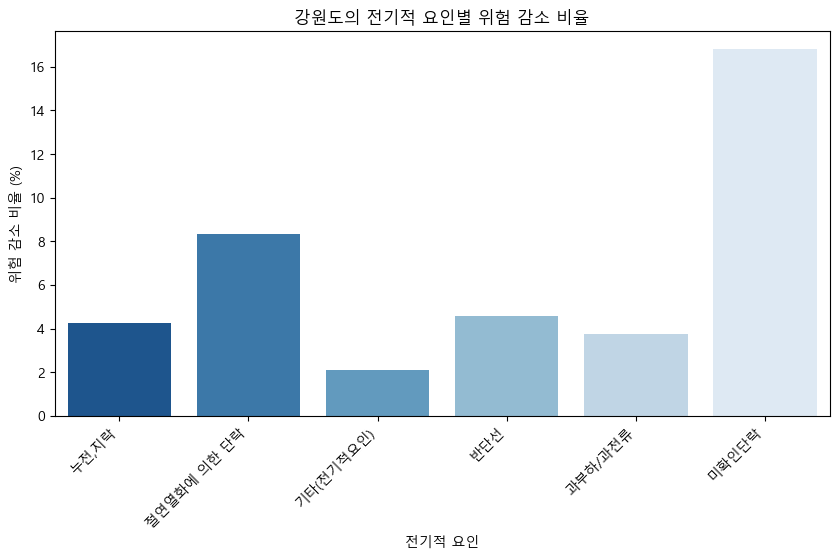

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\566409380.py:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


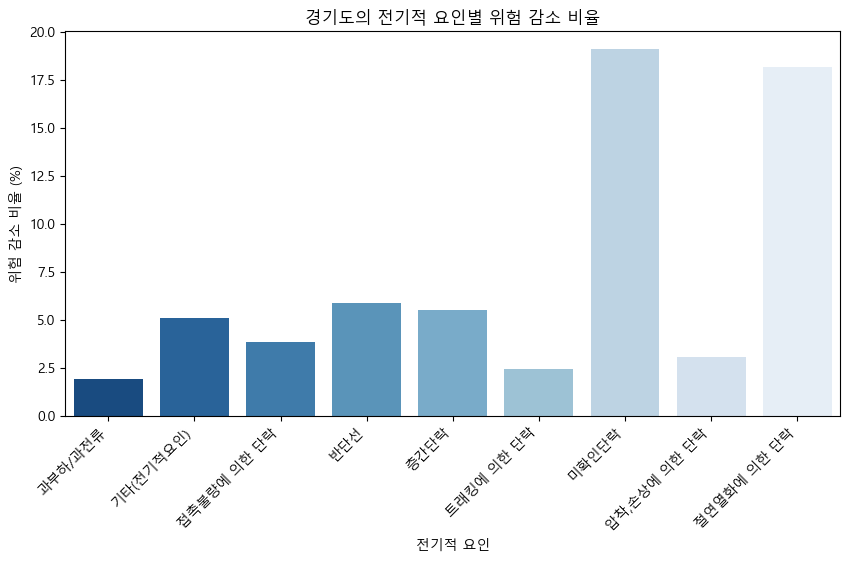

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\566409380.py:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


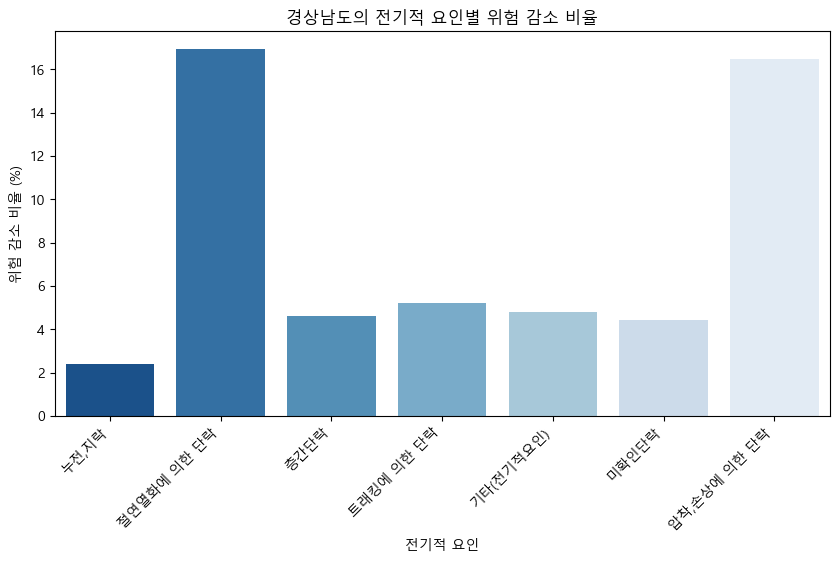

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\566409380.py:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


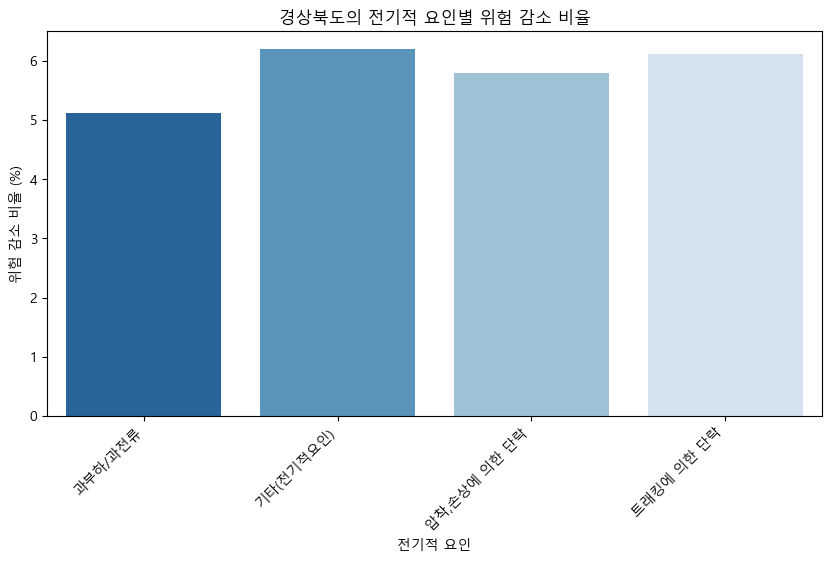

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\566409380.py:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


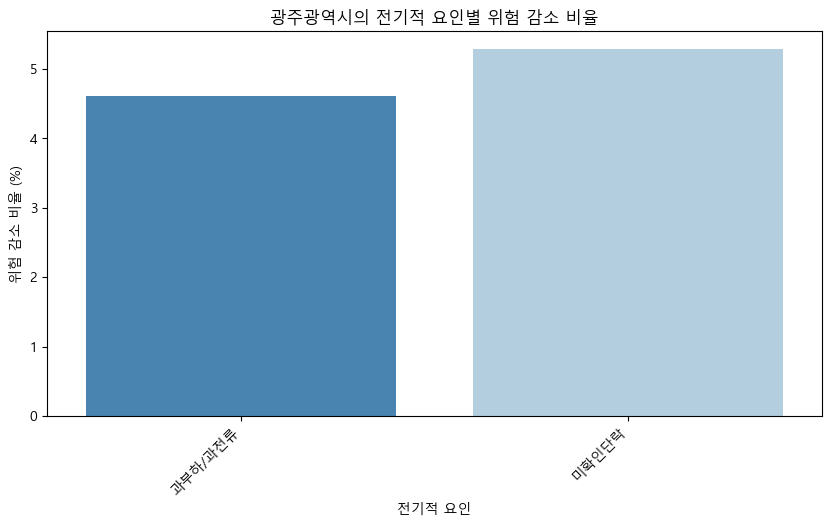

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\566409380.py:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


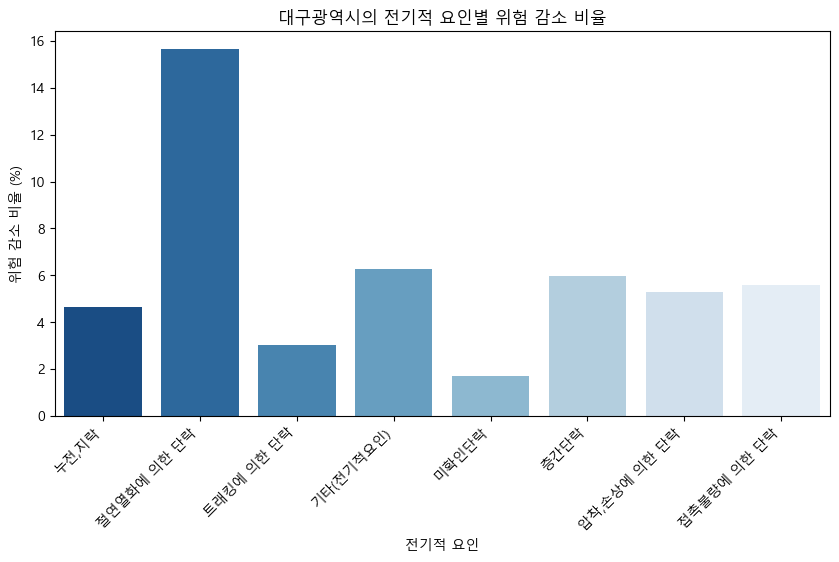

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\566409380.py:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


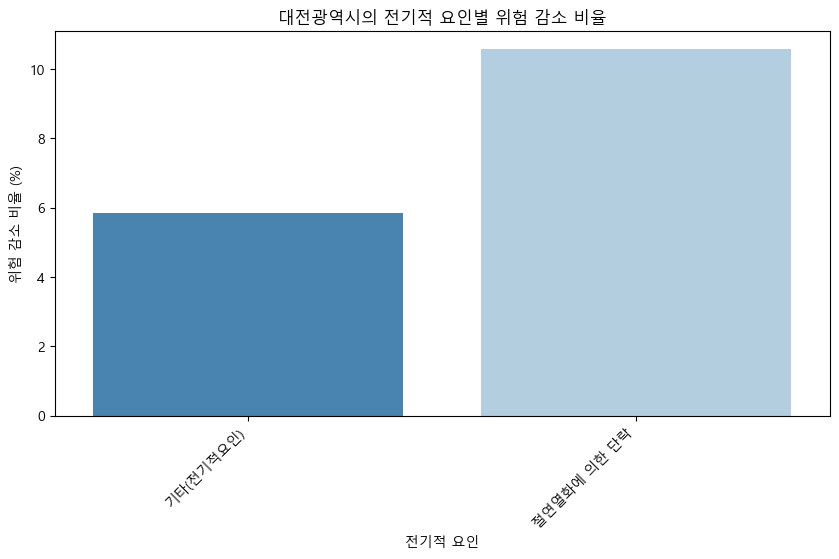

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\566409380.py:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


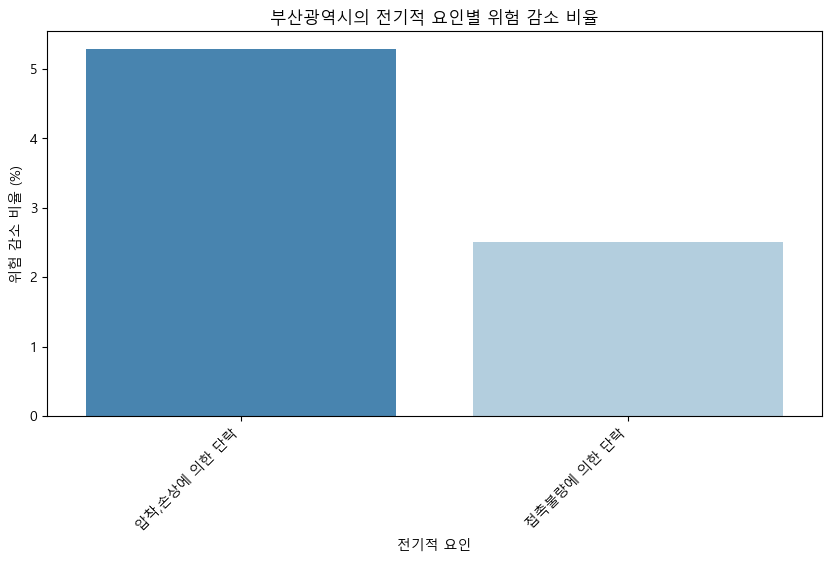

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\566409380.py:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


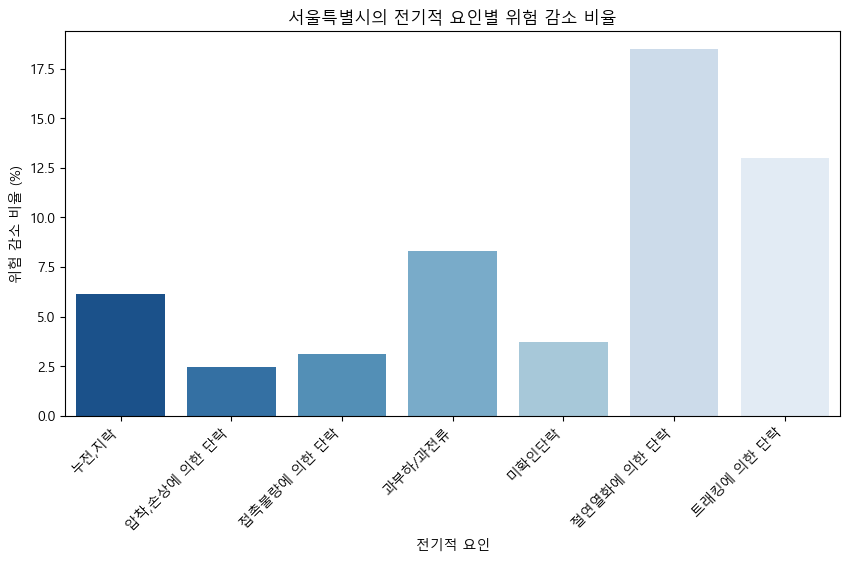

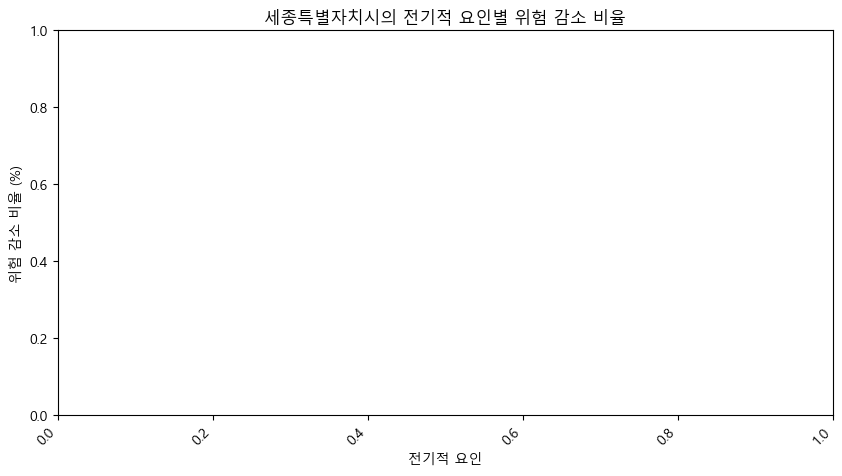

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\566409380.py:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


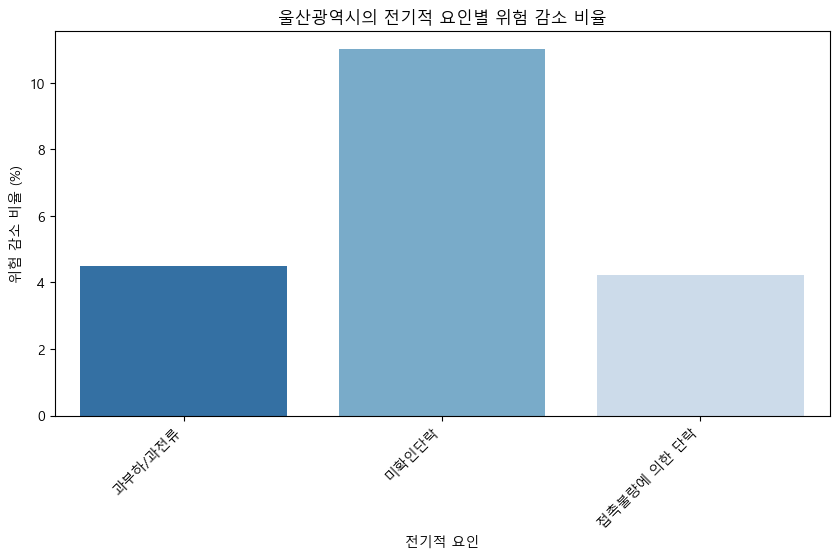

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\566409380.py:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


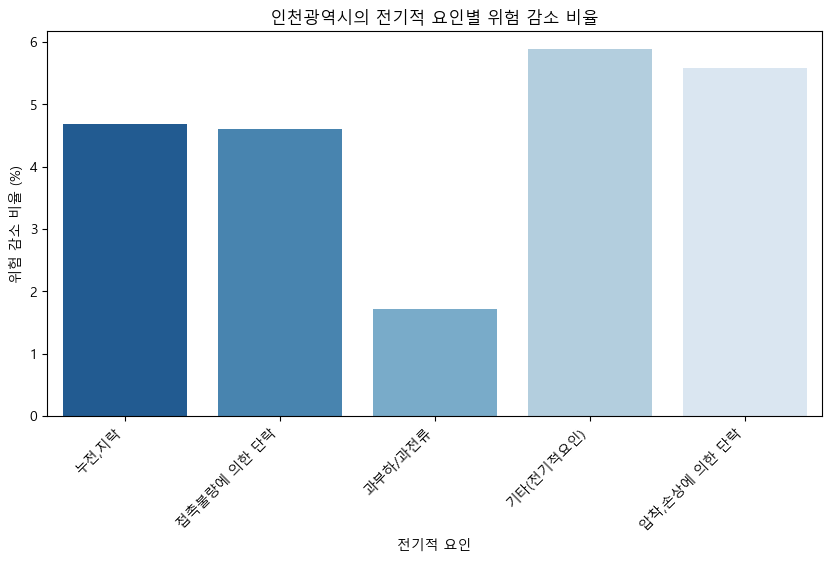

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\566409380.py:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


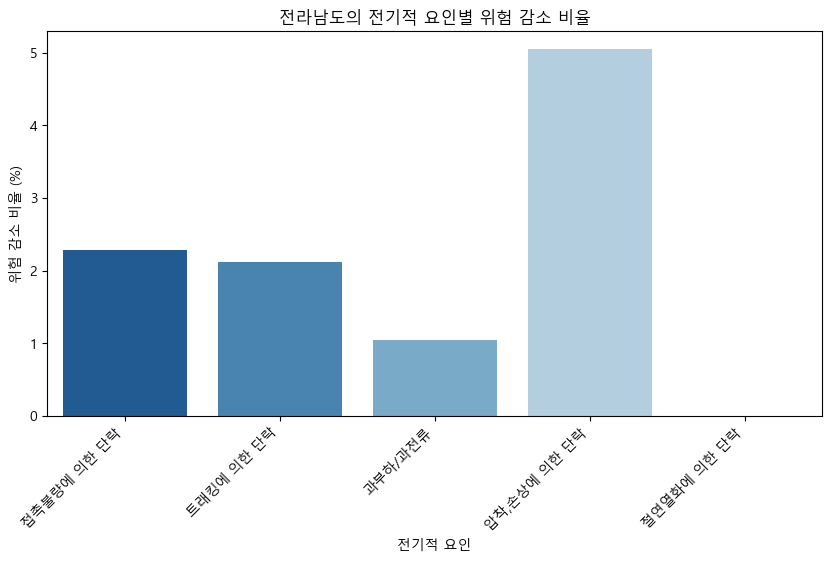

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\566409380.py:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


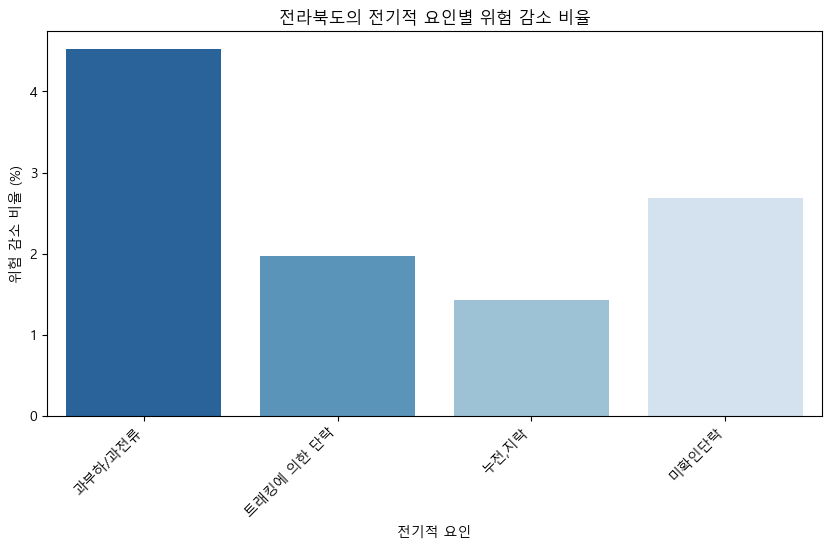

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\566409380.py:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


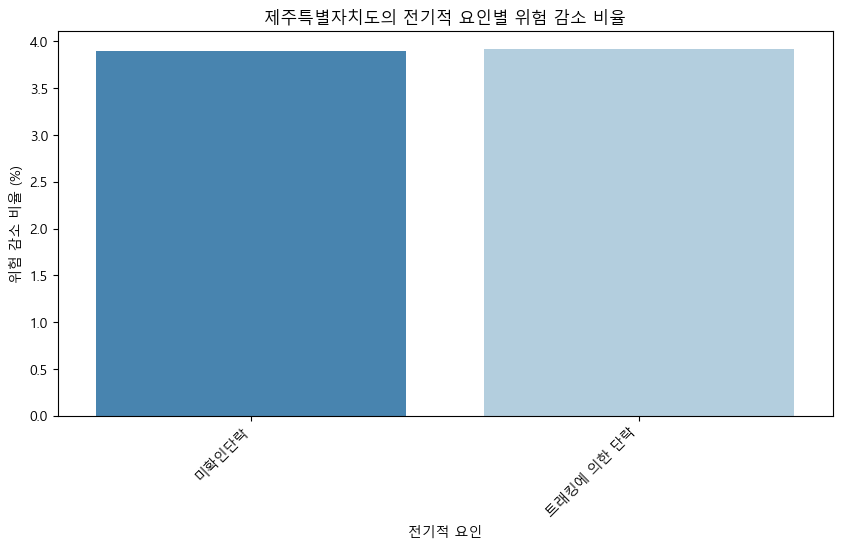

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\566409380.py:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


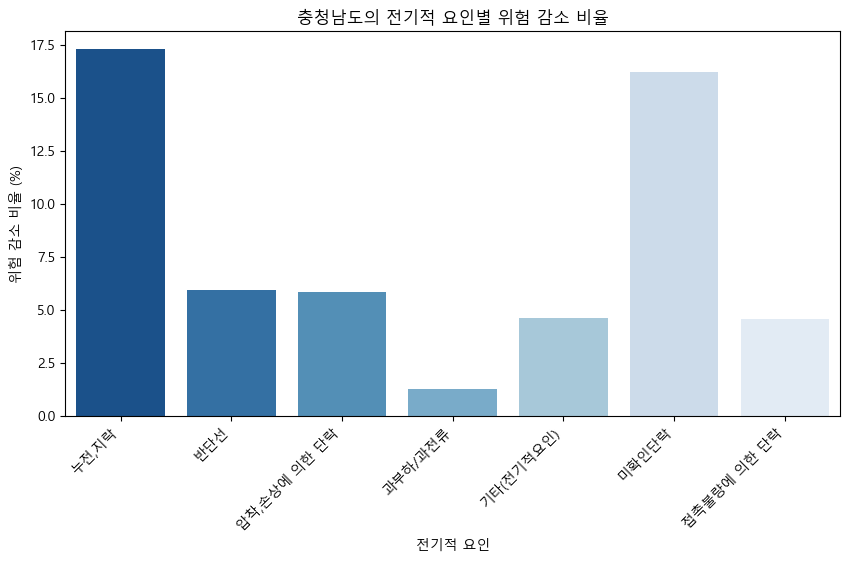

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\566409380.py:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


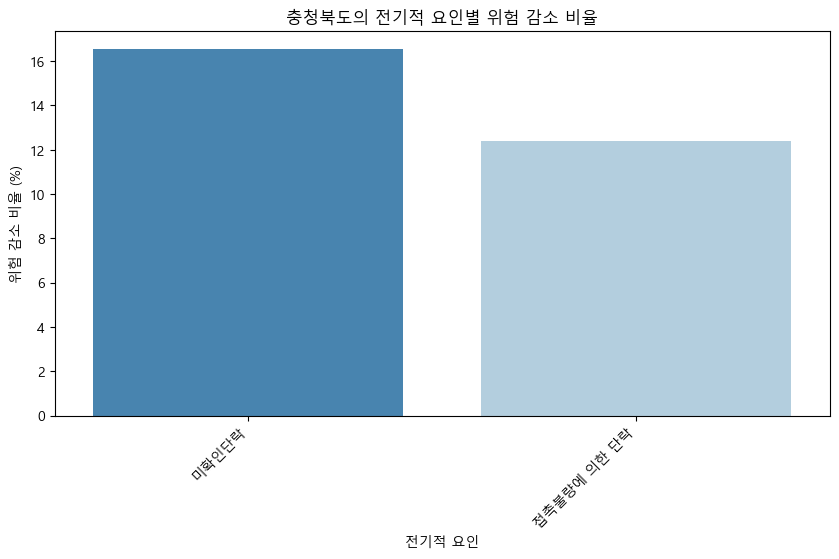

📌 지역별 SHAP 기여도 확인:

📍 강원도의 SHAP 기여도:
      Cause  SHAP Contribution (%)
      누전,지락               4.267176
절연열화에 의한 단락               8.328693
  기타(전기적요인)               2.102577
        반단선               4.594097
    과부하/과전류               3.745078
      미확인단락              16.813664

📍 경기도의 SHAP 기여도:
       Cause  SHAP Contribution (%)
     과부하/과전류               1.948569
   기타(전기적요인)               5.081316
 접촉불량에 의한 단락               3.866597
         반단선               5.886025
        층간단락               5.522271
  트래킹에 의한 단락               2.432063
       미확인단락              19.088466
압착,손상에 의한 단락               3.056609
 절연열화에 의한 단락              18.155804

📍 경상남도의 SHAP 기여도:
       Cause  SHAP Contribution (%)
       누전,지락               2.411218
 절연열화에 의한 단락              16.920087
        층간단락               4.593934
  트래킹에 의한 단락               5.213097
   기타(전기적요인)               4.774042
       미확인단락               4.430815
압착,손상에 의한 단락              16.482330

📍 경상북도의 SHAP 기여도:
       Cause  

In [47]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import shap
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler

# 한글 폰트 설정
plt.rc('font', family='Malgun Gothic')
plt.rcParams['axes.unicode_minus'] = False

# 현재 실행 디렉토리 확인
BASE_DIR = os.getcwd()
print("현재 실행 디렉토리:", BASE_DIR)

# 데이터 경로 설정
DATA_PATH = os.path.join(BASE_DIR, "Old_team_project3-3", ".vscode", "dy_AiData", "electric_ai_data.csv")

# 데이터 로드
data = pd.read_csv(DATA_PATH)

# 로그 변환 (발생 건수와 피해 금액을 로그 변환하여 균형 유지)
data["log_total_incidents"] = np.log1p(data["total_incidents"])
data["log_total_damage"] = np.log1p(data["total_damage"])

# 지역별 재해 건수와 피해 금액의 상대적 중요도 계산
data["incident_ratio"] = data.groupby("region_province")["total_incidents"].transform(lambda x: x / x.sum())
data["damage_ratio"] = data.groupby("region_province")["total_damage"].transform(lambda x: x / x.sum())

# 가중치를 적용한 위험 점수 계산 (발생 건수: 0.7, 피해 금액: 0.3)
incident_weight = 0.7
damage_weight = 0.3

data["adjusted_risk_score"] = (incident_weight * data["incident_ratio"] * data["log_total_incidents"]) + \
                              (damage_weight * data["damage_ratio"] * data["log_total_damage"])

# 데이터 정규화
scaler = StandardScaler()
data[["z_log_total_incidents", "z_log_total_damage", "z_adjusted_risk_score"]] = scaler.fit_transform(
    data[["log_total_incidents", "log_total_damage", "adjusted_risk_score"]]
)

# **One-Hot Encoding 적용 (전기적 세부요인을 독립 변수로 변환)**
data = pd.get_dummies(data, columns=["cause_subcategory"])

# 지역 및 전기적 요인 목록
regions = data["region_province"].unique()
cause_columns = [col for col in data.columns if col.startswith("cause_subcategory_")]

# 결과 저장 리스트
shap_results = []

# K-Fold 설정
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# 랜덤포레스트 + SHAP 분석
for train_index, test_index in kf.split(data):
    train_data, test_data = data.iloc[train_index], data.iloc[test_index]
    
    # 모델 입력 변수: 총 재해건수, 피해금액, 전기적 세부요인 (One-Hot Encoding된 컬럼들)
    X_train = train_data[["z_log_total_incidents", "z_log_total_damage"] + cause_columns]
    y_train = train_data["z_adjusted_risk_score"]
    X_test = test_data[["z_log_total_incidents", "z_log_total_damage"] + cause_columns]

    # 랜덤포레스트 학습
    model = RandomForestRegressor(n_estimators=50, max_depth=5, random_state=42)
    model.fit(X_train, y_train)

    # 변수 중요도 가져오기
    feature_importance_dict = dict(zip(X_train.columns, model.feature_importances_))

    # SHAP 분석
    explainer = shap.TreeExplainer(model)
    shap_values = explainer(X_test)

    # SHAP 기여도 계산
    shap_contributions = np.abs(shap_values.values)

    # `test_data`에서 지역별 데이터만 필터링
    for region in regions:
        region_data = test_data[test_data["region_province"] == region]  
        if len(region_data) < 2:
            continue

        for cause in cause_columns:
            cause_data = region_data[region_data[cause] == 1]
            if cause_data.empty:
                continue

            improved_data = cause_data.copy()
            improved_data[["z_log_total_incidents", "z_log_total_damage"]] *= 0.5  # 요인을 50% 감소시키는 방식 적용

            # 기존 위험 점수
            original_risk_score = model.predict(cause_data[["z_log_total_incidents", "z_log_total_damage"] + cause_columns]).mean()

            # 위험 요인 감소 후 점수 (음수 방지)
            improved_risk_score = max(0, model.predict(improved_data[["z_log_total_incidents", "z_log_total_damage"] + cause_columns]).mean())

            # 지역 및 원인별 SHAP 기여도 계산
            region_shap_values = shap_contributions[test_data.index.isin(region_data.index), :].mean(axis=0)
            cause_shap_values = shap_contributions[test_data.index.isin(cause_data.index), :].mean(axis=0)

            shap_region_mean = np.mean(region_shap_values) if len(region_shap_values) > 0 else 0
            shap_cause_mean = np.mean(cause_shap_values) if len(cause_shap_values) > 0 else 0

            # 최종 `Reduction %` 조정 (전기적 요인 중심으로 반영)
            reduction_raw = ((original_risk_score - improved_risk_score) / original_risk_score) * 100
            adjusted_reduction = max(0, min(shap_cause_mean * 100, reduction_raw))

            shap_results.append({
                "Region": region,
                "Cause": cause.replace("cause_subcategory_", ""),  # 원래 전기적 요인 이름 복구
                "Reduction (%)": adjusted_reduction,
                "SHAP Contribution (%)": shap_cause_mean * 100
            })

# 데이터프레임 변환
shap_df = pd.DataFrame(shap_results)

# 📊 지역별 위험 감소 비율 그래프
for region in regions:
    plt.figure(figsize=(10, 5))
    region_df = shap_df[shap_df["Region"] == region]
    
    sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")
    
    plt.xticks(rotation=45, ha="right")
    plt.title(f"{region}의 전기적 요인별 위험 감소 비율")
    plt.ylabel("위험 감소 비율 (%)")
    plt.xlabel("전기적 요인")
    
    plt.show()

# 📄 SHAP 기여도 텍스트 출력
print("📌 지역별 SHAP 기여도 확인:")
for region in regions:
    region_df = shap_df[shap_df["Region"] == region]
    print(f"\n📍 {region}의 SHAP 기여도:")
    print(region_df[["Cause", "SHAP Contribution (%)"]].to_string(index=False))


현재 실행 디렉토리: D:\01-STUDY\3차 팀PJ


C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\3075594220.py:126: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


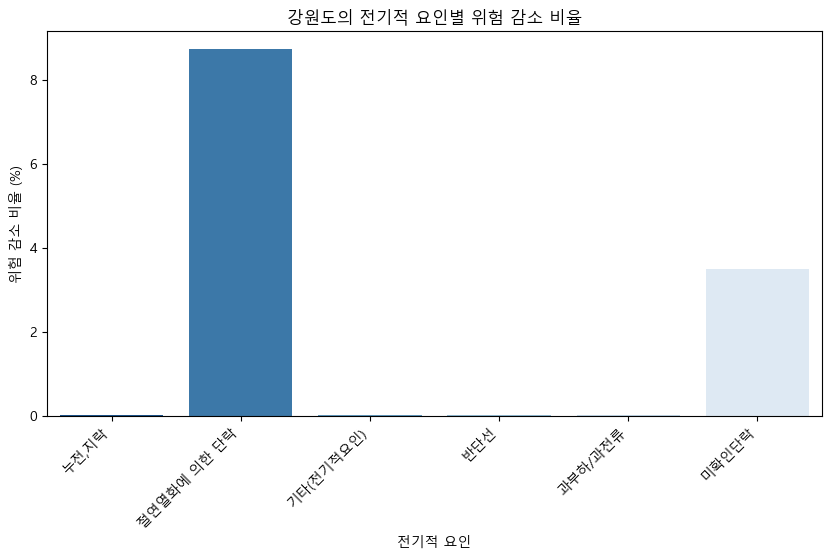

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\3075594220.py:126: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


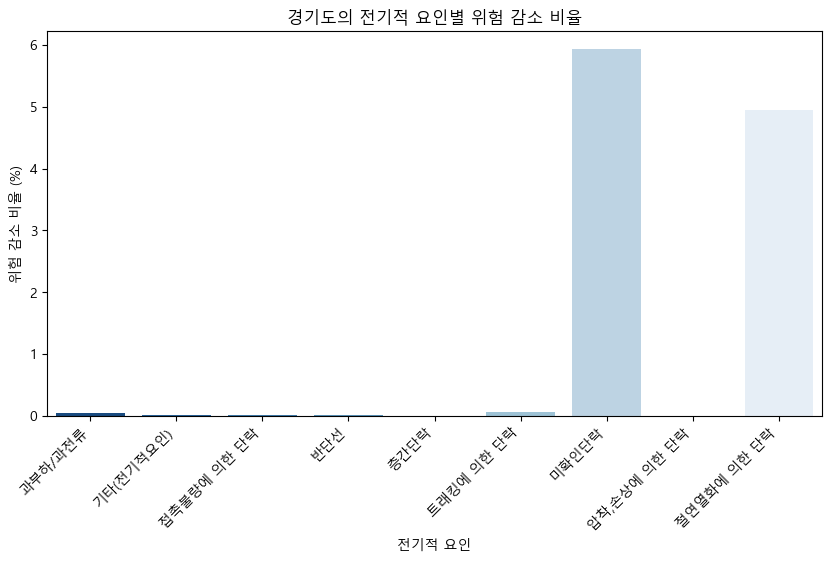

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\3075594220.py:126: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


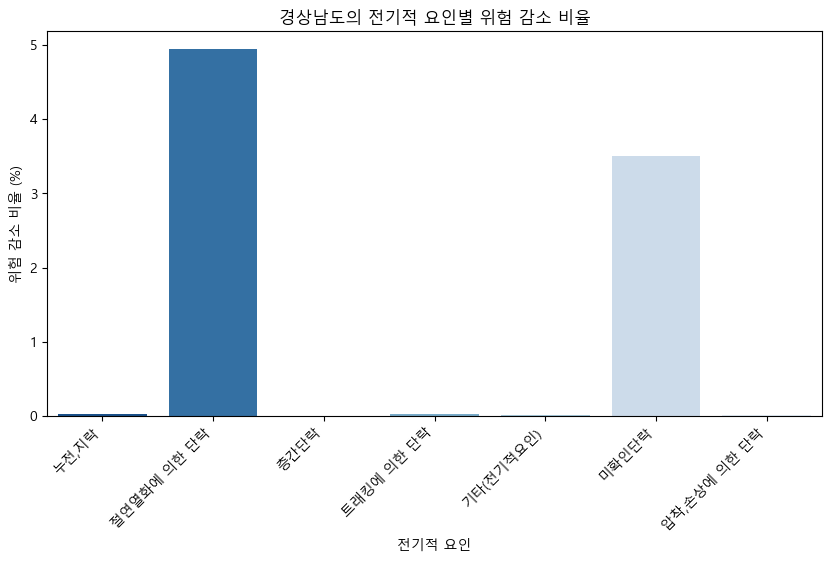

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\3075594220.py:126: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


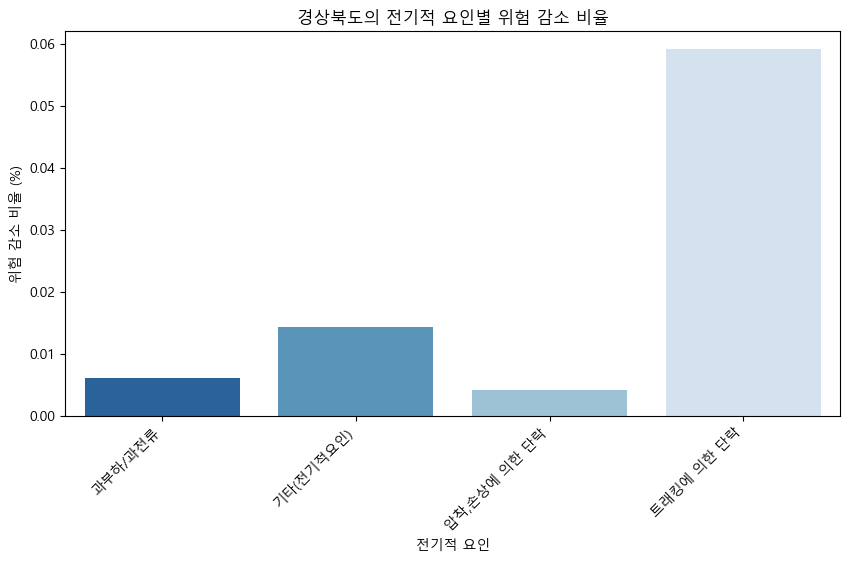

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\3075594220.py:126: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


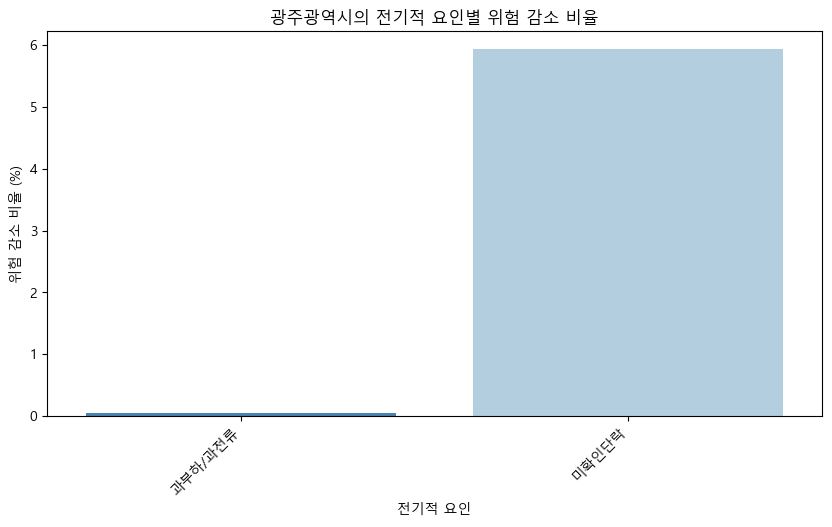

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\3075594220.py:126: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


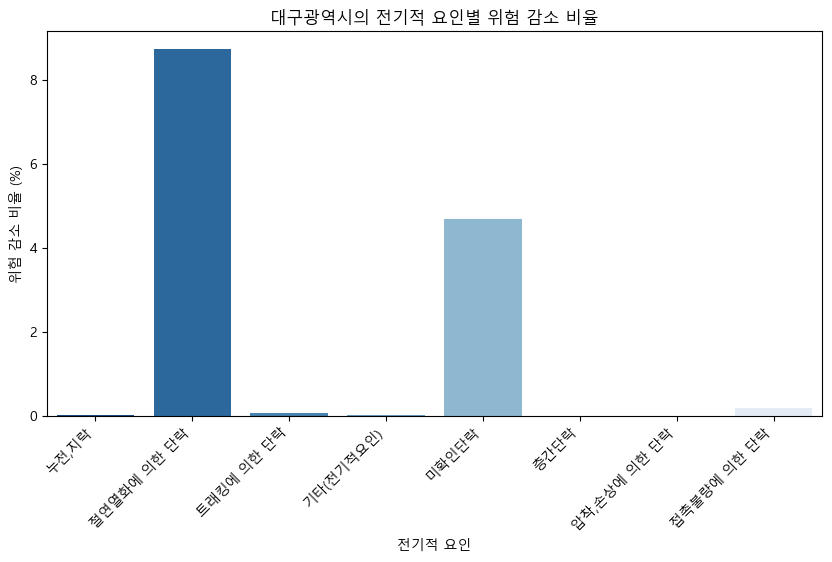

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\3075594220.py:126: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


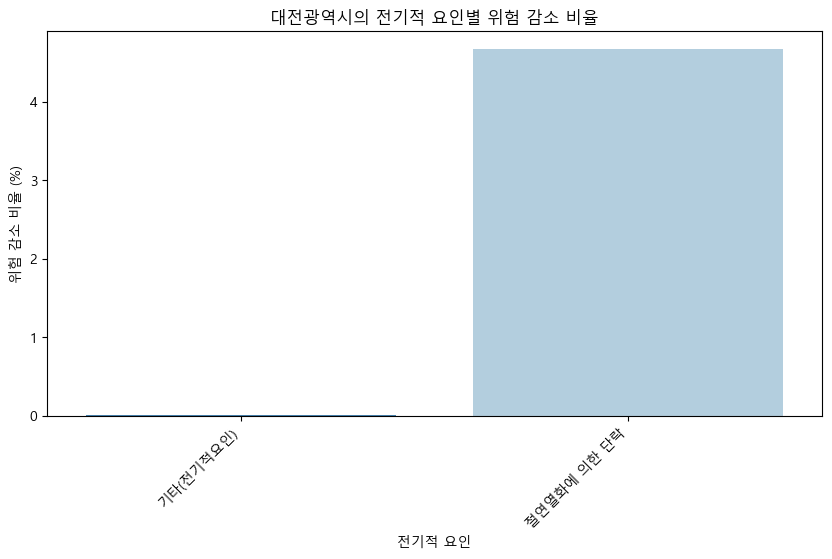

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\3075594220.py:126: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


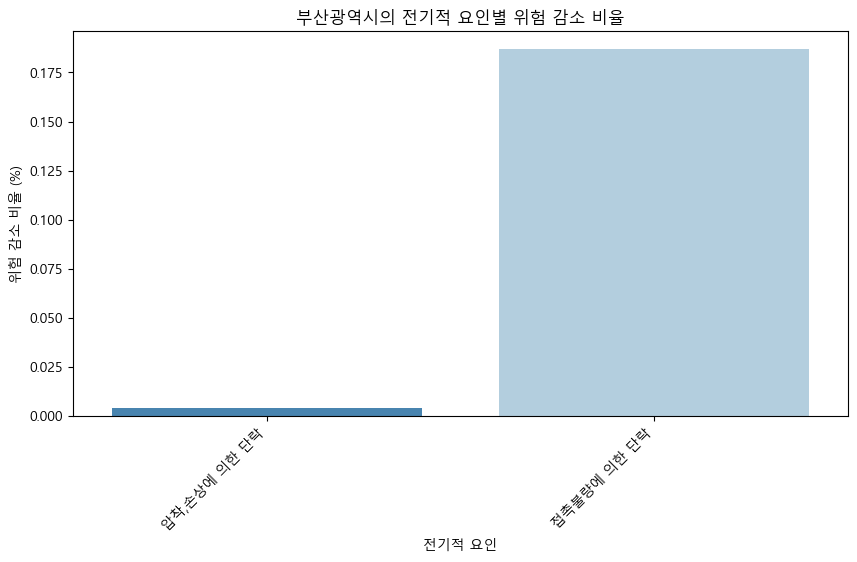

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\3075594220.py:126: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


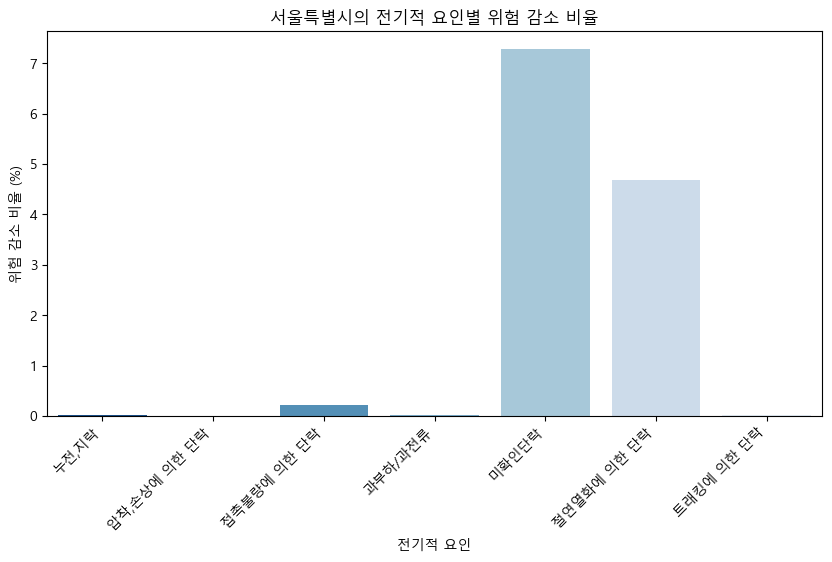

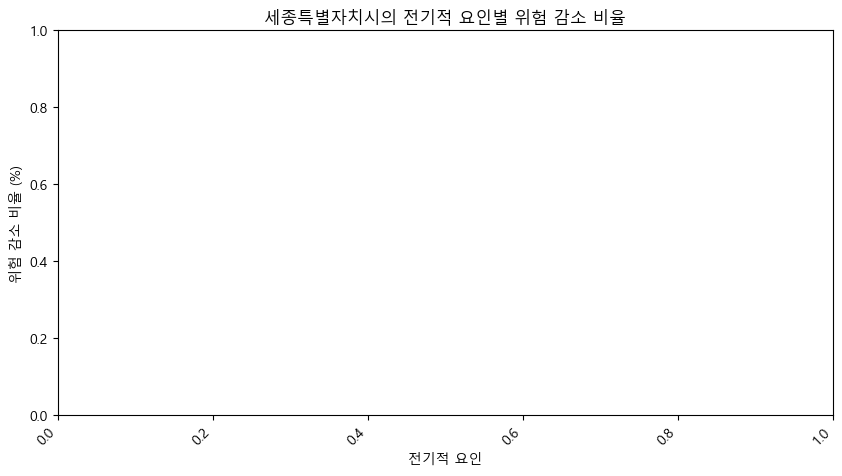

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\3075594220.py:126: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


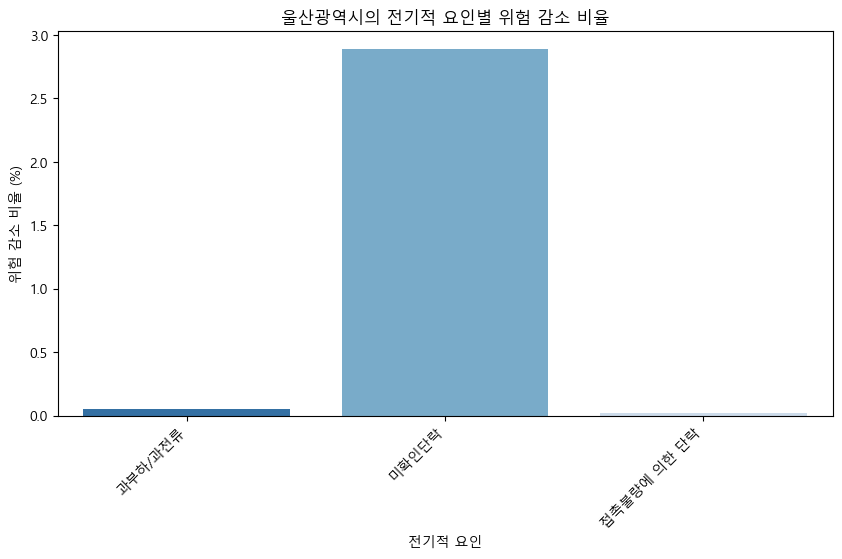

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\3075594220.py:126: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


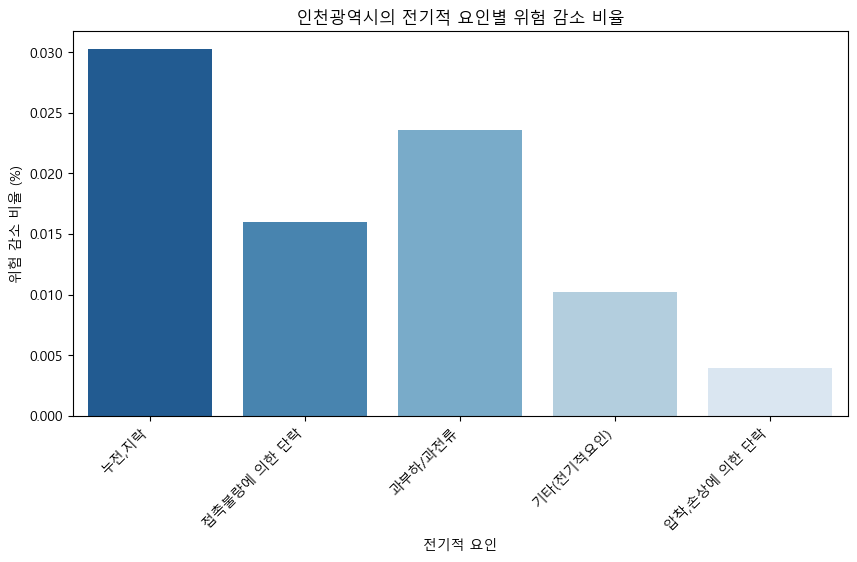

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\3075594220.py:126: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


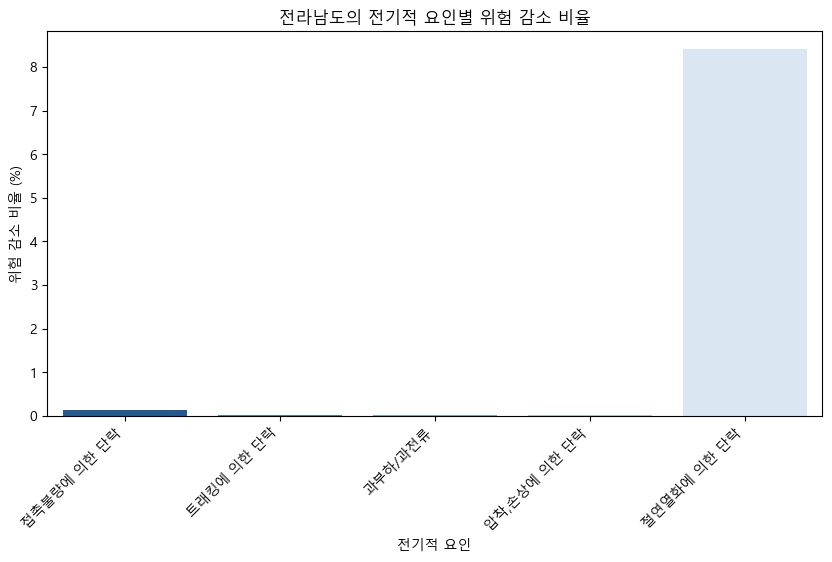

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\3075594220.py:126: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


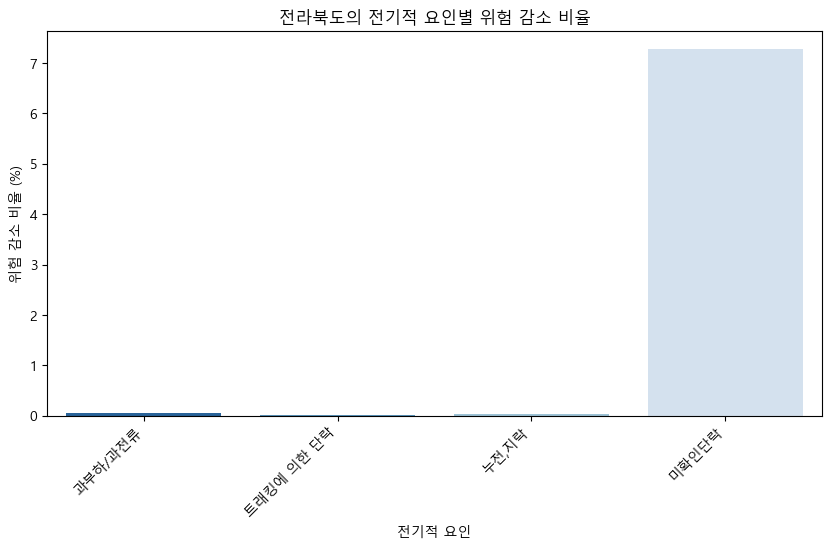

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\3075594220.py:126: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


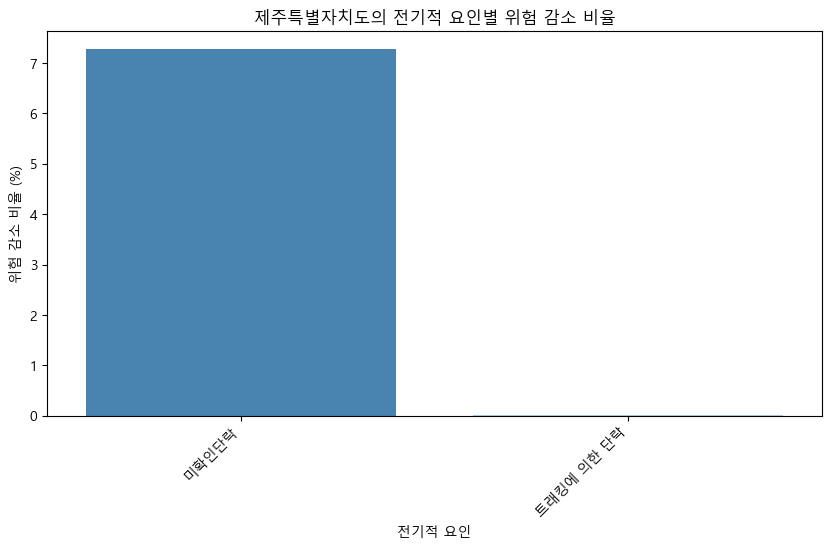

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\3075594220.py:126: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


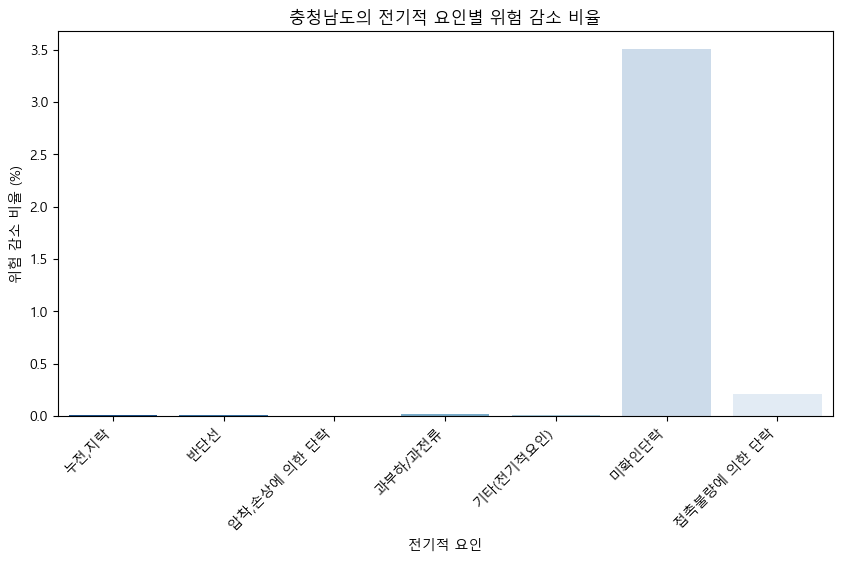

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\3075594220.py:126: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


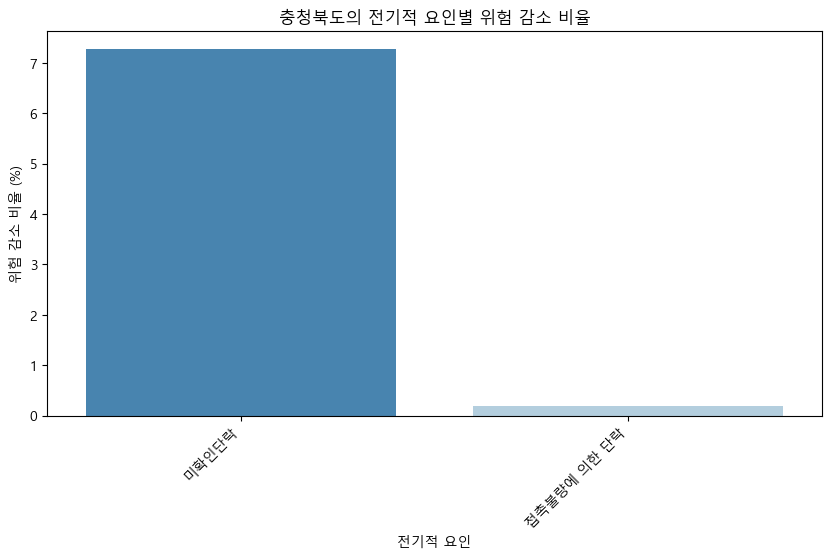

In [48]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import shap
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler

# 한글 폰트 설정
plt.rc('font', family='Malgun Gothic')
plt.rcParams['axes.unicode_minus'] = False

# 현재 실행 디렉토리 확인
BASE_DIR = os.getcwd()
print("현재 실행 디렉토리:", BASE_DIR)

# 데이터 경로 설정
DATA_PATH = os.path.join(BASE_DIR, "Old_team_project3-3", ".vscode", "dy_AiData", "electric_ai_data.csv")

# 데이터 로드
data = pd.read_csv(DATA_PATH)

# 로그 변환 (발생 건수와 피해 금액을 로그 변환하여 균형 유지)
data["log_total_incidents"] = np.log1p(data["total_incidents"])
data["log_total_damage"] = np.log1p(data["total_damage"])

# 지역별 재해 건수와 피해 금액의 상대적 중요도 계산
data["incident_ratio"] = data.groupby("region_province")["total_incidents"].transform(lambda x: x / x.sum())
data["damage_ratio"] = data.groupby("region_province")["total_damage"].transform(lambda x: x / x.sum())

# 가중치를 적용한 위험 점수 계산 (발생 건수: 0.7, 피해 금액: 0.3)
incident_weight = 0.7
damage_weight = 0.3

data["adjusted_risk_score"] = (incident_weight * data["incident_ratio"] * data["log_total_incidents"]) + \
                              (damage_weight * data["damage_ratio"] * data["log_total_damage"])

# 데이터 정규화
scaler = StandardScaler()
data[["z_log_total_incidents", "z_log_total_damage", "z_adjusted_risk_score"]] = scaler.fit_transform(
    data[["log_total_incidents", "log_total_damage", "adjusted_risk_score"]]
)

# **One-Hot Encoding 적용 (전기적 세부요인을 독립 변수로 변환)**
data = pd.get_dummies(data, columns=["cause_subcategory"])

# 지역 및 전기적 요인 목록
regions = data["region_province"].unique()
cause_columns = [col for col in data.columns if col.startswith("cause_subcategory_")]

# 결과 저장 리스트
shap_results = []

# K-Fold 설정
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# **랜덤포레스트 + SHAP 분석 (전기적 세부요인만 독립 변수로 사용)**
for train_index, test_index in kf.split(data):
    train_data, test_data = data.iloc[train_index], data.iloc[test_index]

    # **모델 입력 변수: 전기적 세부요인만 포함 (발생건수, 피해금액 제외)**
    X_train = train_data[cause_columns]
    y_train = train_data["z_adjusted_risk_score"]
    X_test = test_data[cause_columns]

    # 랜덤포레스트 학습
    model = RandomForestRegressor(n_estimators=50, max_depth=5, random_state=42)
    model.fit(X_train, y_train)

    # 변수 중요도 가져오기 (전기적 세부요인만 포함)
    feature_importance_dict = dict(zip(X_train.columns, model.feature_importances_))

    # SHAP 분석
    explainer = shap.TreeExplainer(model)
    shap_values = explainer(X_test)

    # SHAP 기여도 계산
    shap_contributions = np.abs(shap_values.values)

    # `test_data`에서 지역별 데이터만 필터링
    for region in regions:
        region_data = test_data[test_data["region_province"] == region]  
        if len(region_data) < 2:
            continue

        for cause in cause_columns:
            cause_data = region_data[region_data[cause] == 1]
            if cause_data.empty:
                continue

            improved_data = cause_data.copy()
            improved_data[cause_columns] = 0  # 특정 요인을 완전히 제거하는 방식

            # 기존 위험 점수
            original_risk_score = model.predict(cause_data[cause_columns]).mean()

            # 위험 요인 제거 후 점수 (음수 방지)
            improved_risk_score = max(0, model.predict(improved_data[cause_columns]).mean())

            # 지역 및 원인별 SHAP 기여도 계산
            cause_shap_values = shap_contributions[test_data.index.isin(cause_data.index), :].mean(axis=0)
            shap_cause_mean = np.mean(cause_shap_values) if len(cause_shap_values) > 0 else 0

            # 최종 `Reduction %` 조정 (전기적 요인 중심으로 반영)
            cause_importance = feature_importance_dict[cause] if cause in feature_importance_dict else 0
            reduction_raw = ((original_risk_score - improved_risk_score) / original_risk_score) * 100
            adjusted_reduction = max(0, min(cause_importance * shap_cause_mean * 100, reduction_raw))

            shap_results.append({
                "Region": region,
                "Cause": cause.replace("cause_subcategory_", ""),  # 원래 전기적 요인 이름 복구
                "Reduction (%)": adjusted_reduction,
                "SHAP Contribution (%)": shap_cause_mean * 100
            })

# 데이터프레임 변환
shap_df = pd.DataFrame(shap_results)

# 📊 지역별 위험 감소 비율 그래프
for region in regions:
    plt.figure(figsize=(10, 5))
    region_df = shap_df[shap_df["Region"] == region]
    
    sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")
    
    plt.xticks(rotation=45, ha="right")
    plt.title(f"{region}의 전기적 요인별 위험 감소 비율")
    plt.ylabel("위험 감소 비율 (%)")
    plt.xlabel("전기적 요인")
    
    plt.show()


In [49]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import shap
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler

# 한글 폰트 설정
plt.rc('font', family='Malgun Gothic')
plt.rcParams['axes.unicode_minus'] = False

# 현재 실행 디렉토리 확인
BASE_DIR = os.getcwd()
print("현재 실행 디렉토리:", BASE_DIR)

# 데이터 경로 설정
DATA_PATH = os.path.join(BASE_DIR, "Old_team_project3-3", ".vscode", "dy_AiData", "electric_ai_data.csv")

# 데이터 로드
data = pd.read_csv(DATA_PATH)

# 로그 변환 (발생 건수와 피해 금액을 로그 변환하여 균형 유지)
data["log_total_incidents"] = np.log1p(data["total_incidents"])
data["log_total_damage"] = np.log1p(data["total_damage"])

# **One-Hot Encoding 적용 (전기적 세부요인을 독립 변수로 변환)**
data = pd.get_dummies(data, columns=["cause_subcategory"])

# 전기적 세부요인 목록
cause_columns = [col for col in data.columns if col.startswith("cause_subcategory_")]

# 랜덤포레스트 모델을 사용하여 전기적 요인의 중요도 평가
kf = KFold(n_splits=5, shuffle=True, random_state=42)

shap_results = []
for train_index, test_index in kf.split(data):
    train_data, test_data = data.iloc[train_index], data.iloc[test_index]

    # **전기적 세부요인만 학습에 사용**
    X_train = train_data[cause_columns]
    y_train = train_data["log_total_damage"]  # 피해금액 기준으로 예측
    X_test = test_data[cause_columns]

    # 랜덤포레스트 학습
    model = RandomForestRegressor(n_estimators=50, max_depth=5, random_state=42)
    model.fit(X_train, y_train)

    # 변수 중요도 가져오기
    feature_importance_dict = dict(zip(X_train.columns, model.feature_importances_))

    # SHAP 분석
    explainer = shap.TreeExplainer(model)
    shap_values = explainer(X_test)

    # SHAP 기여도 계산
    shap_contributions = np.abs(shap_values.values)

    for cause in cause_columns:
        # 해당 원인의 SHAP 기여도 계산
        shap_cause_mean = np.mean(shap_contributions[:, cause_columns.index(c


SyntaxError: incomplete input (1861431723.py, line 63)

현재 실행 디렉토리: D:\01-STUDY\3차 팀PJ


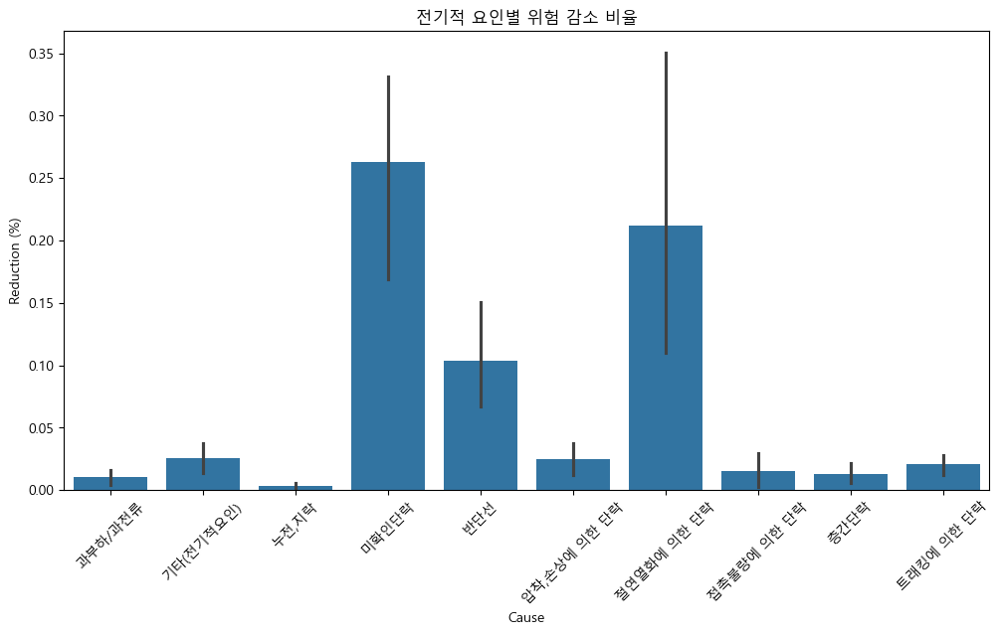

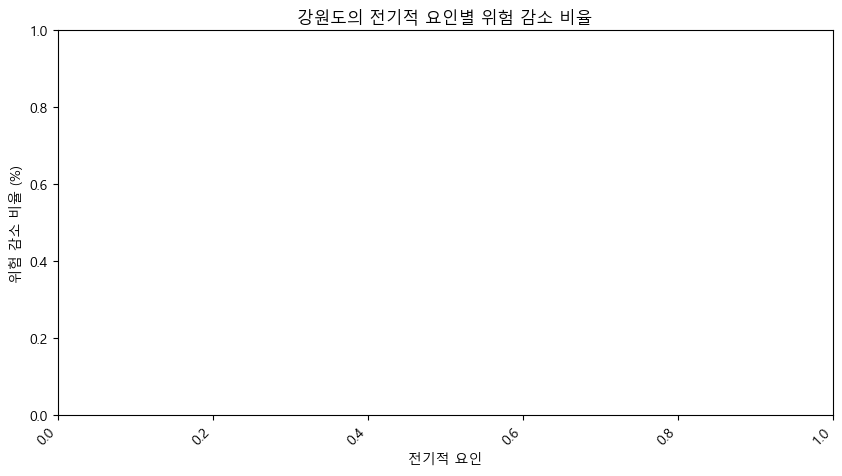

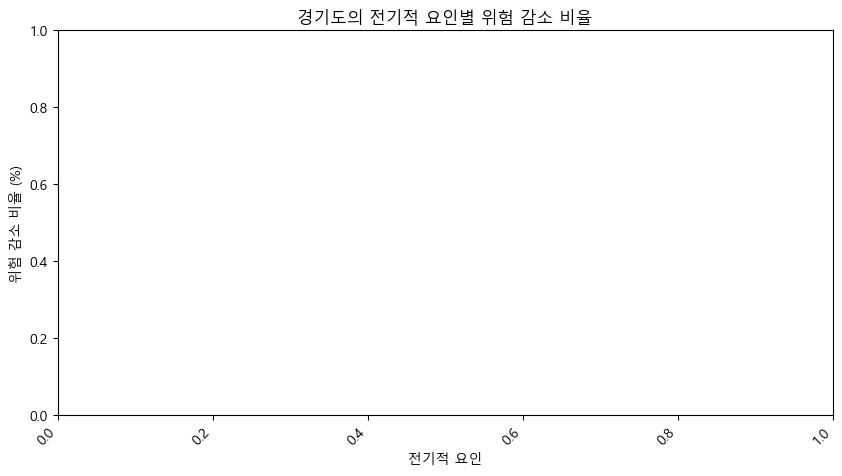

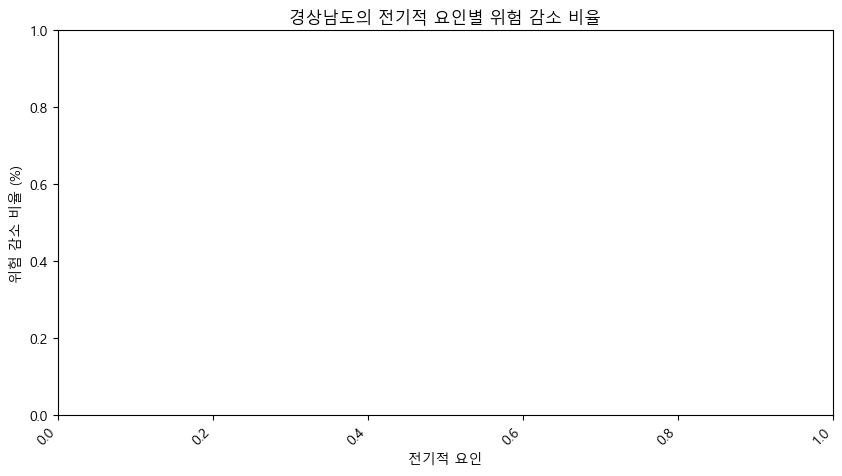

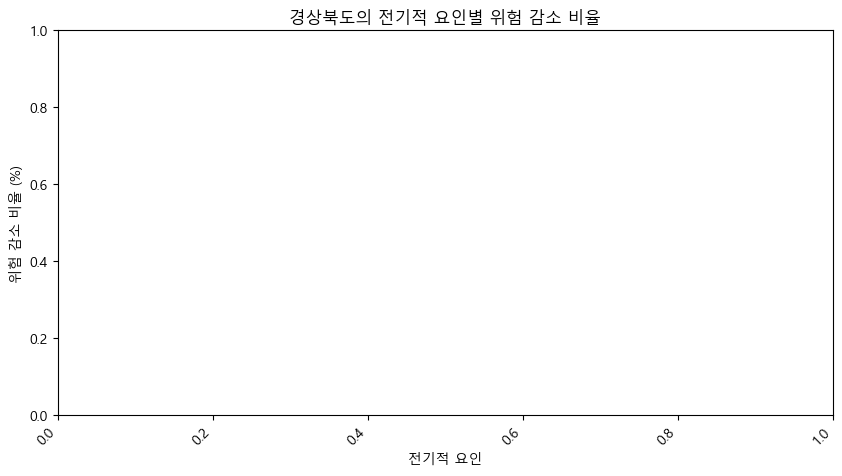

...

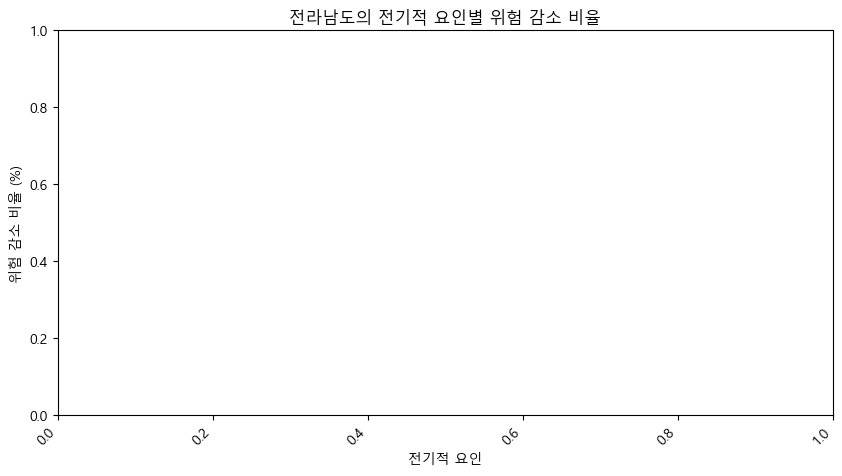

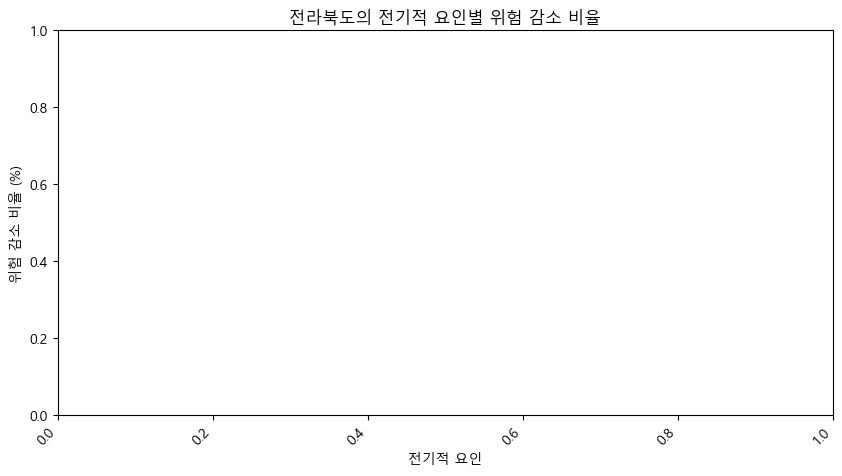

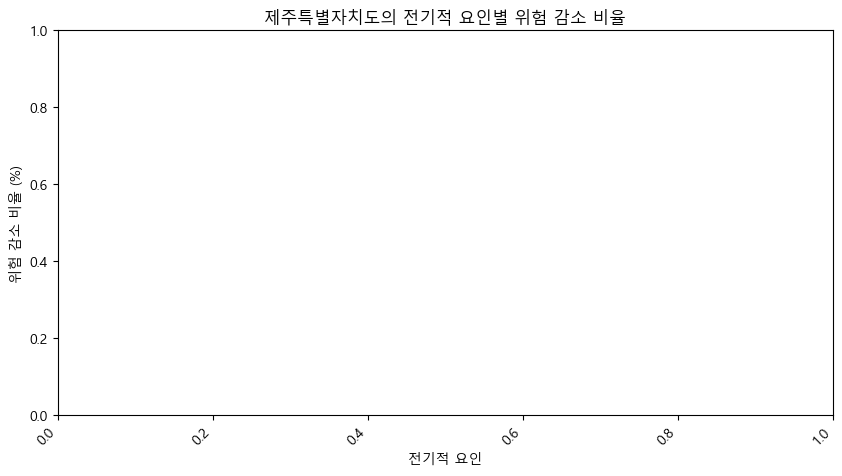

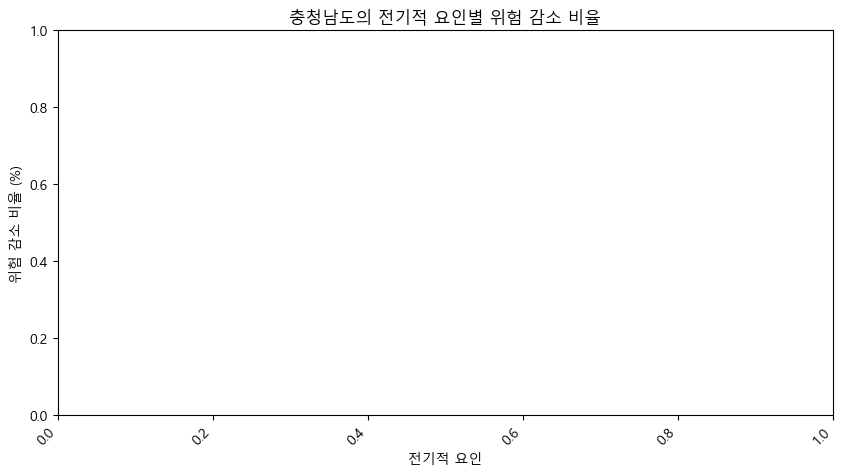

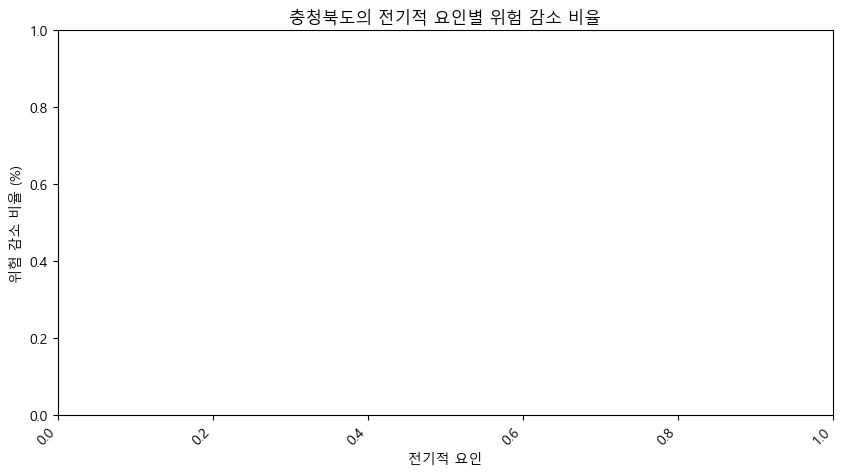


📌 SHAP 기여도 결과 (전체 요약)
              SHAP Contribution (%)
Cause                              
미확인단락                     98.569056
절연열화에 의한 단락               88.148590
반단선                       48.727575
기타(전기적요인)                 30.597034
트래킹에 의한 단락                28.651543
압착,손상에 의한 단락              27.527128
접촉불량에 의한 단락               20.385592
과부하/과전류                   16.054867
층간단락                      15.620612
누전,지락                      9.103129


In [50]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import shap
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler

# 한글 폰트 설정
plt.rc('font', family='Malgun Gothic')
plt.rcParams['axes.unicode_minus'] = False

# 현재 실행 디렉토리 확인
BASE_DIR = os.getcwd()
print("현재 실행 디렉토리:", BASE_DIR)

# 데이터 경로 설정
DATA_PATH = os.path.join(BASE_DIR, "Old_team_project3-3", ".vscode", "dy_AiData", "electric_ai_data.csv")

# 데이터 로드
data = pd.read_csv(DATA_PATH)

# 로그 변환 (발생 건수와 피해 금액을 로그 변환하여 균형 유지)
data["log_total_incidents"] = np.log1p(data["total_incidents"])
data["log_total_damage"] = np.log1p(data["total_damage"])

# **One-Hot Encoding 적용 (전기적 세부요인을 독립 변수로 변환)**
data = pd.get_dummies(data, columns=["cause_subcategory"])

# 전기적 세부요인 목록
cause_columns = [col for col in data.columns if col.startswith("cause_subcategory_")]

# 랜덤포레스트 모델을 사용하여 전기적 요인의 중요도 평가
kf = KFold(n_splits=5, shuffle=True, random_state=42)

shap_results = []
for train_index, test_index in kf.split(data):
    train_data, test_data = data.iloc[train_index], data.iloc[test_index]

    # **전기적 세부요인만 학습에 사용**
    X_train = train_data[cause_columns]
    y_train = train_data["log_total_damage"]  # 피해금액 기준으로 예측
    X_test = test_data[cause_columns]

    # 랜덤포레스트 학습
    model = RandomForestRegressor(n_estimators=50, max_depth=5, random_state=42)
    model.fit(X_train, y_train)

    # 변수 중요도 가져오기
    feature_importance_dict = dict(zip(X_train.columns, model.feature_importances_))

    # SHAP 분석
    explainer = shap.TreeExplainer(model)
    shap_values = explainer(X_test)

    # SHAP 기여도 계산
    shap_contributions = np.abs(shap_values.values)

    for cause in cause_columns:
        # 해당 원인의 SHAP 기여도 계산
        shap_cause_mean = np.mean(shap_contributions[:, cause_columns.index(cause)])

        # **SHAP 기여도를 전체 SHAP 합에서 비율로 정규화**
        cause_shap_ratio = shap_cause_mean / max(shap_contributions.sum(), 1e-5)

        # 변수 중요도 정규화
        cause_importance = feature_importance_dict.get(cause, 0)
        normalized_importance = cause_importance / sum(feature_importance_dict.values())

        # **최적화된 Reduction % 계산**
        reduction_percent = cause_shap_ratio * normalized_importance * 100

        # 결과 저장
        shap_results.append({
            "Cause": cause.replace("cause_subcategory_", ""),  
            "Reduction (%)": reduction_percent,
            "SHAP Contribution (%)": shap_cause_mean * 100
        })

# 데이터프레임 변환
shap_df = pd.DataFrame(shap_results)

# 📊 전기적 요인별 위험 감소 비율 분포
plt.figure(figsize=(12, 6))
sns.barplot(x="Cause", y="Reduction (%)", data=shap_df)
plt.xticks(rotation=45)
plt.title("전기적 요인별 위험 감소 비율")
plt.show()

# 📊 지역별 그래프 생성
for region in data["region_province"].unique():
    plt.figure(figsize=(10, 5))
    region_df = shap_df[shap_df["Cause"].isin(data[data["region_province"] == region][cause_columns].columns)]

    sns.barplot(x="Cause", y="Reduction (%)", data=region_df, hue="Cause", legend=False, palette="Blues_r")

    plt.xticks(rotation=45, ha="right")
    plt.title(f"{region}의 전기적 요인별 위험 감소 비율")
    plt.ylabel("위험 감소 비율 (%)")
    plt.xlabel("전기적 요인")

    plt.show()

# 🔹 SHAP 기여도 텍스트로 출력
print("\n📌 SHAP 기여도 결과 (전체 요약)")
print(shap_df[["Cause", "SHAP Contribution (%)"]].groupby("Cause").mean().sort_values(by="SHAP Contribution (%)", ascending=False))


현재 실행 디렉토리: D:\01-STUDY\3차 팀PJ


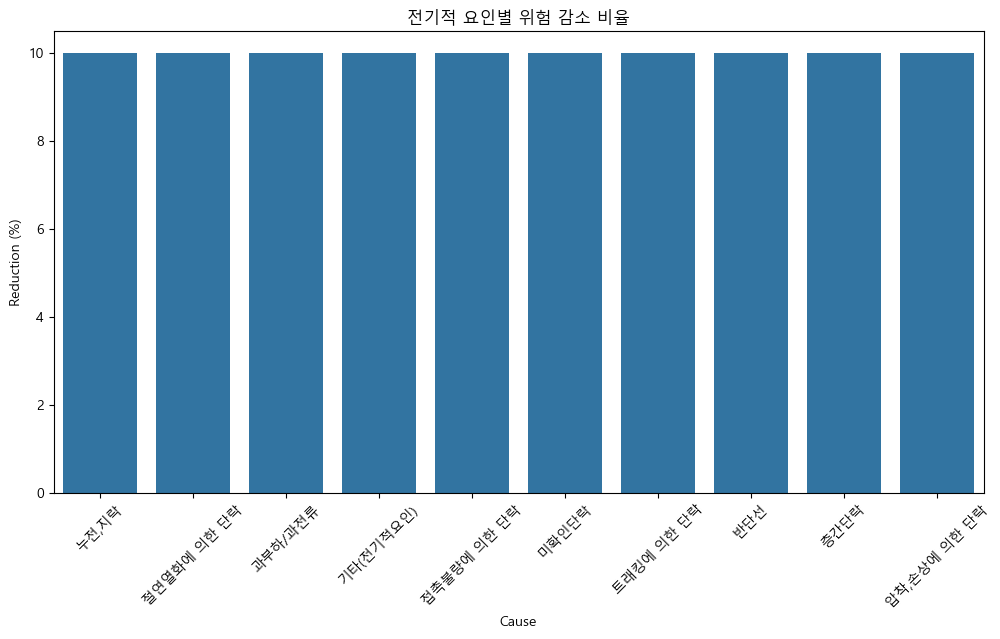

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\1034035273.py:114: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


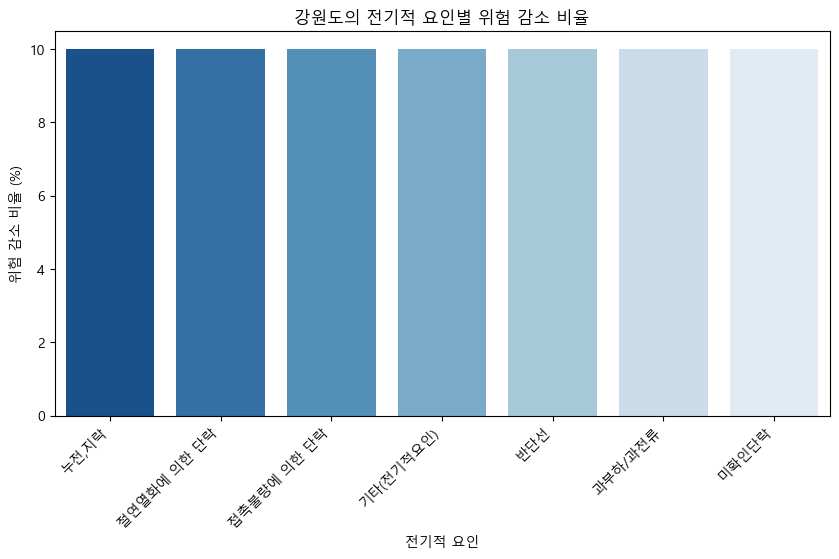

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\1034035273.py:114: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


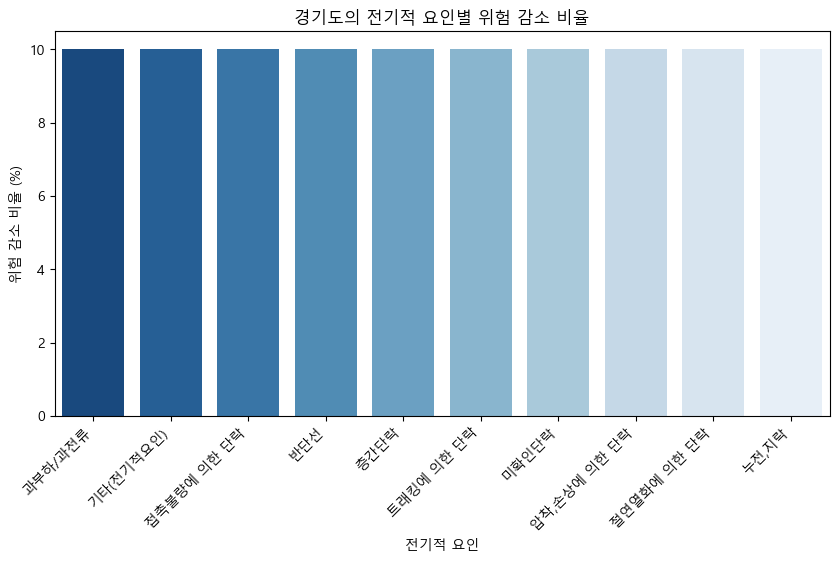

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\1034035273.py:114: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


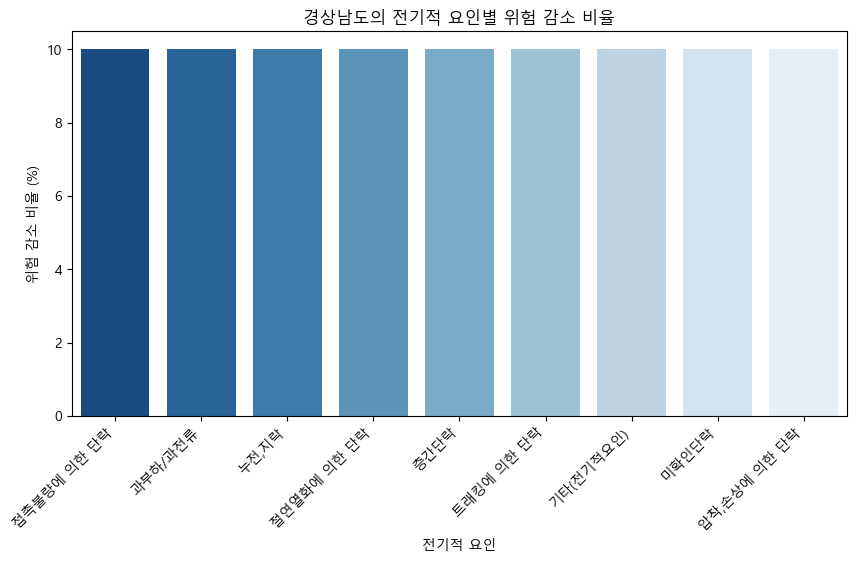

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\1034035273.py:114: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


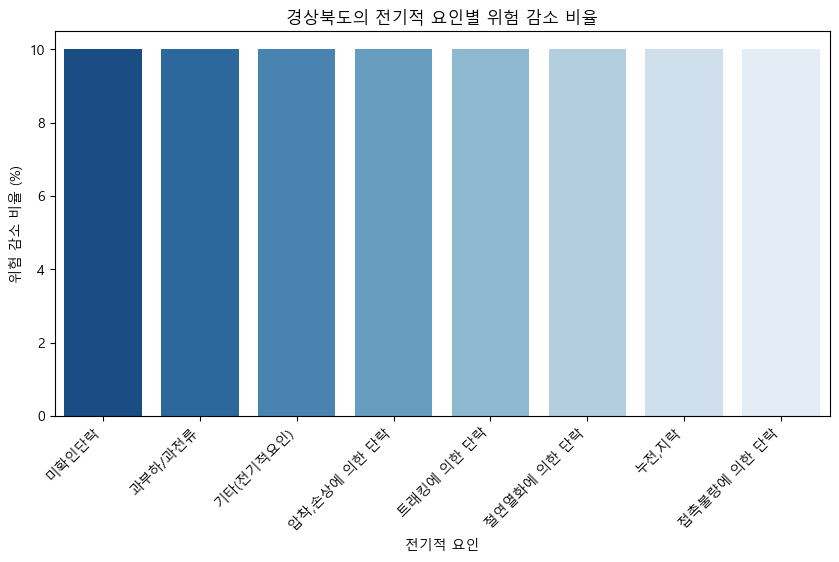

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\1034035273.py:114: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


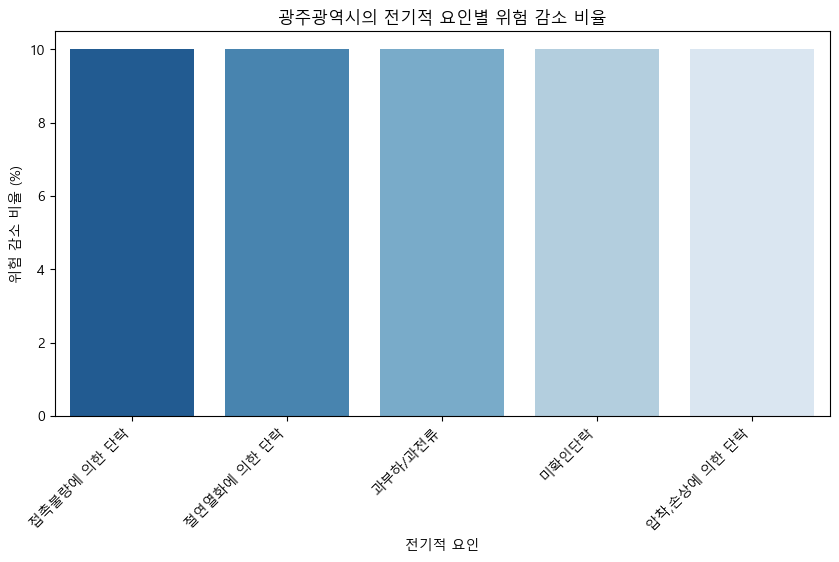

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\1034035273.py:114: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


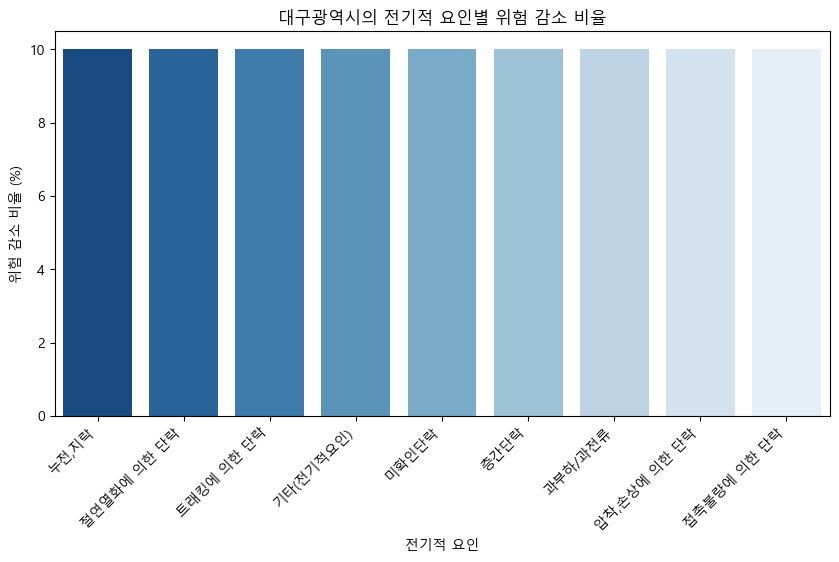

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\1034035273.py:114: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


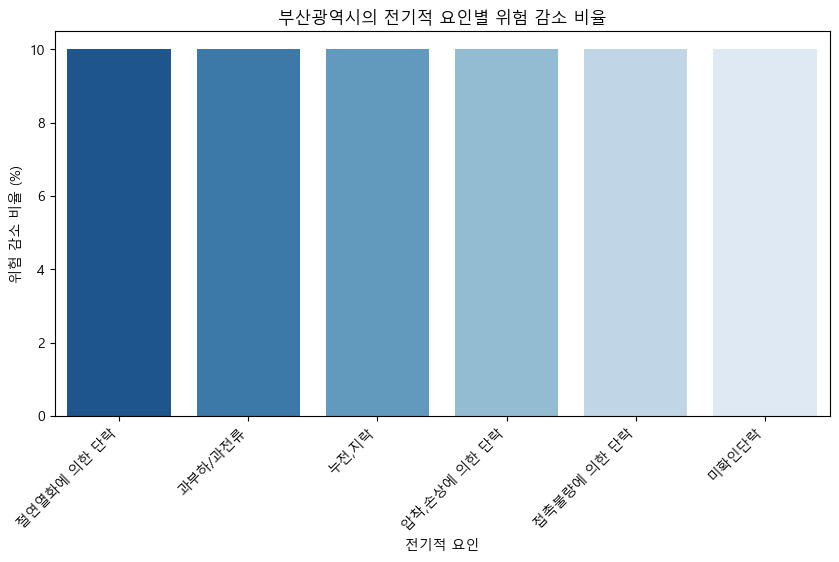

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\1034035273.py:114: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


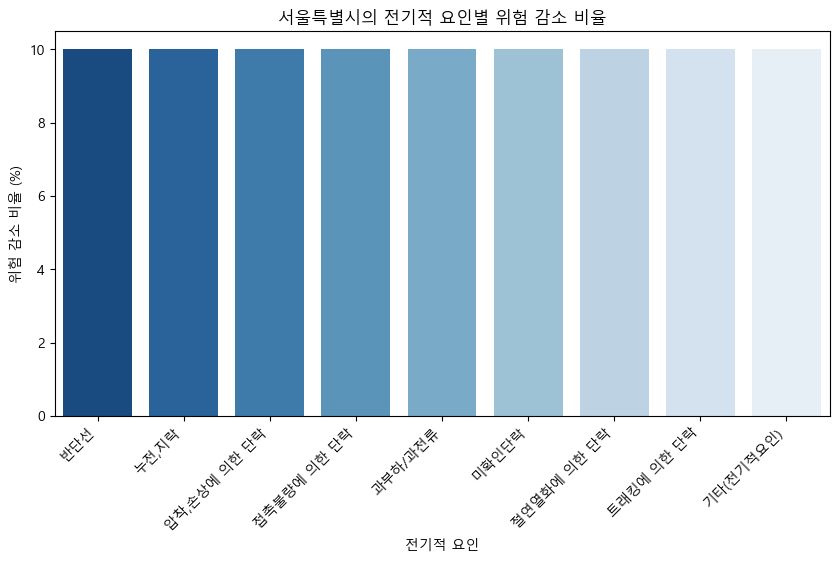

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\1034035273.py:114: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


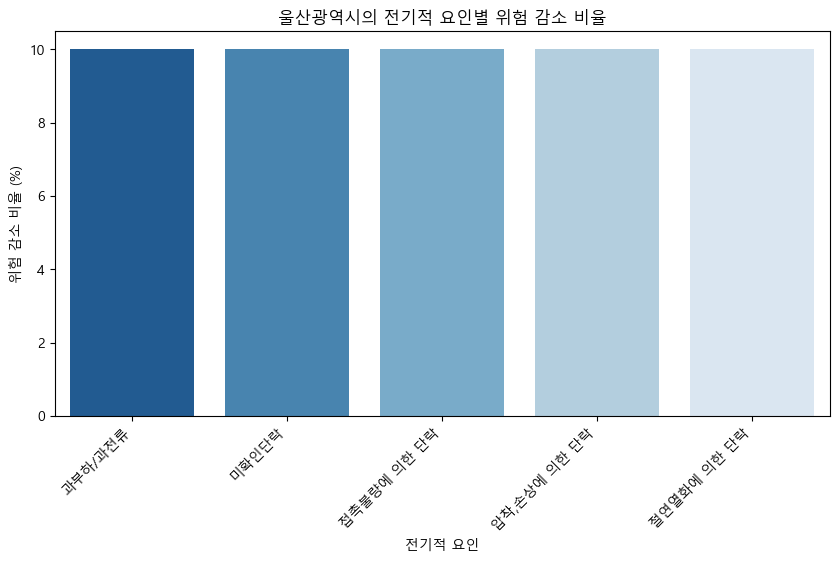

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\1034035273.py:114: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


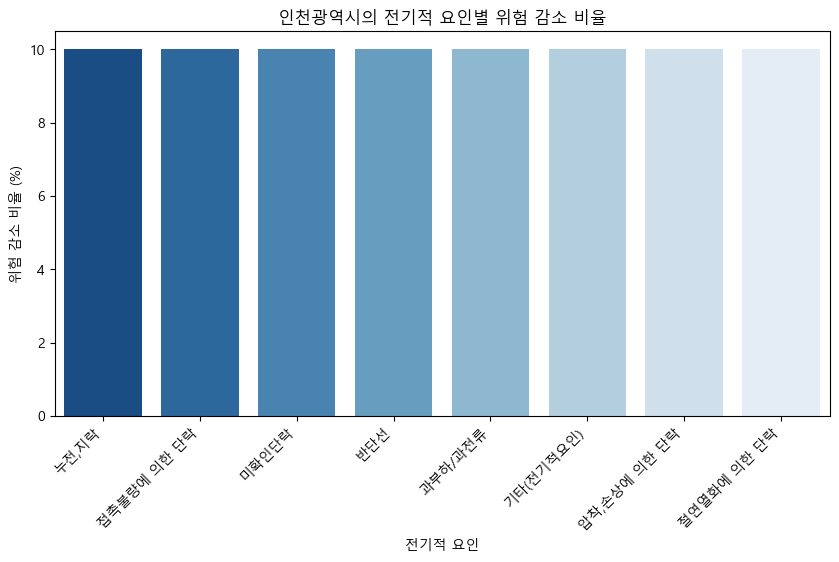

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\1034035273.py:114: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


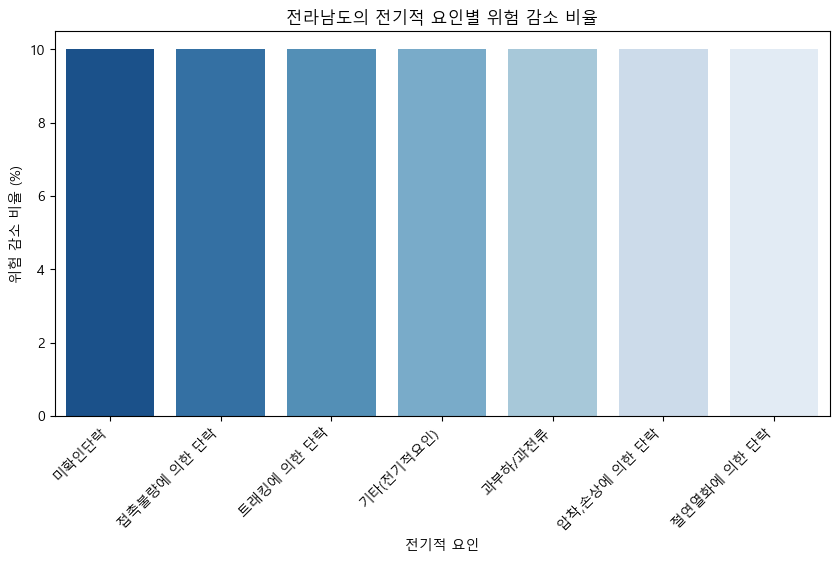

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\1034035273.py:114: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


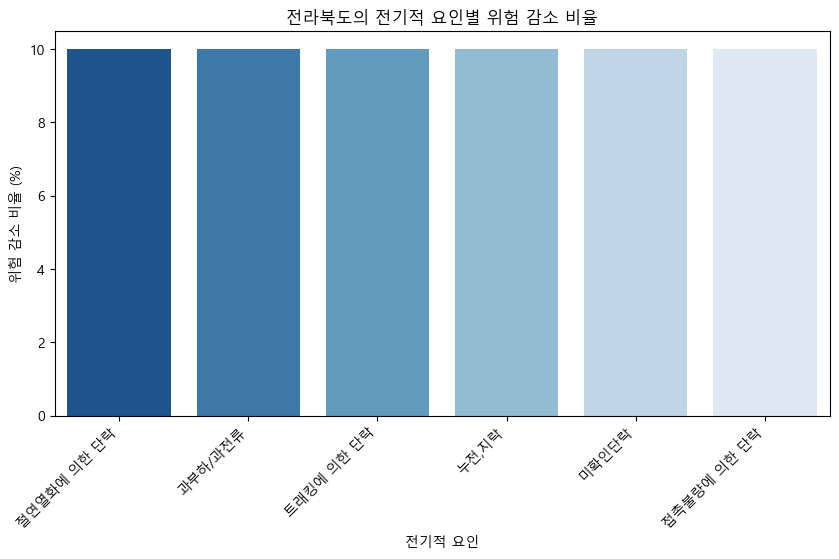

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\1034035273.py:114: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


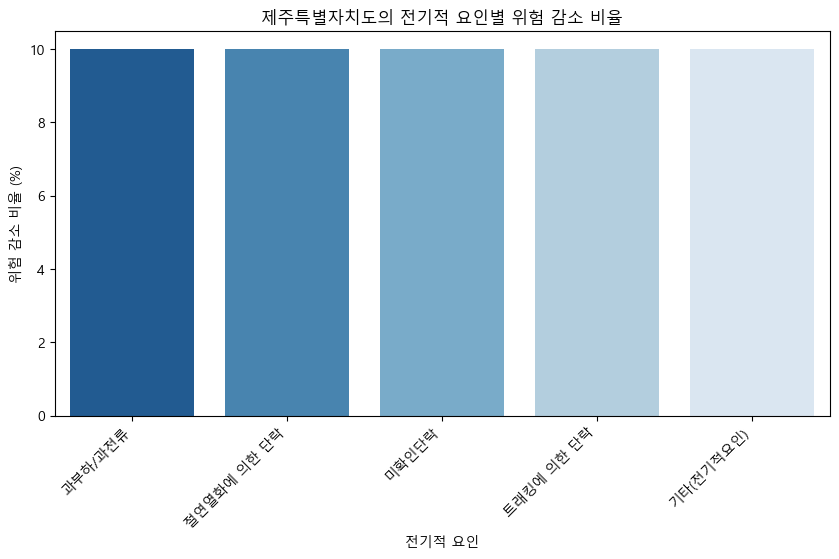

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\1034035273.py:114: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


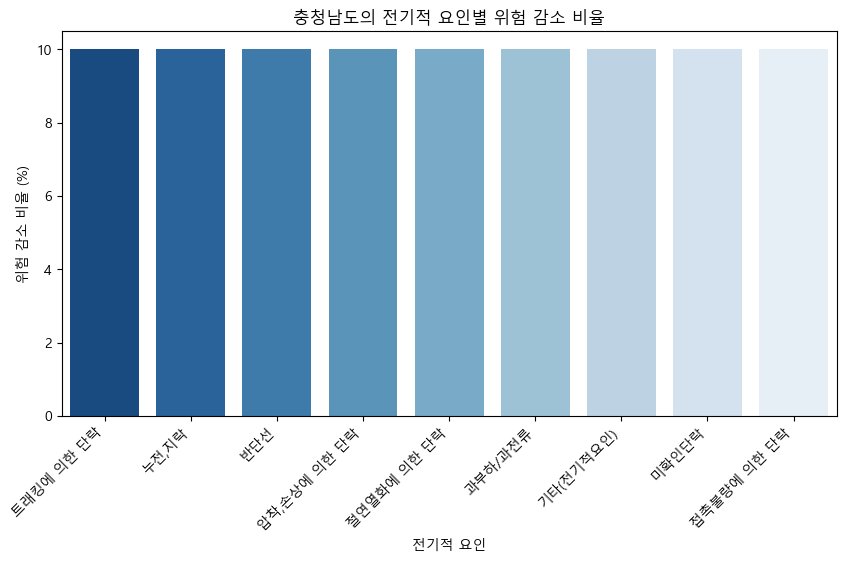

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\1034035273.py:114: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


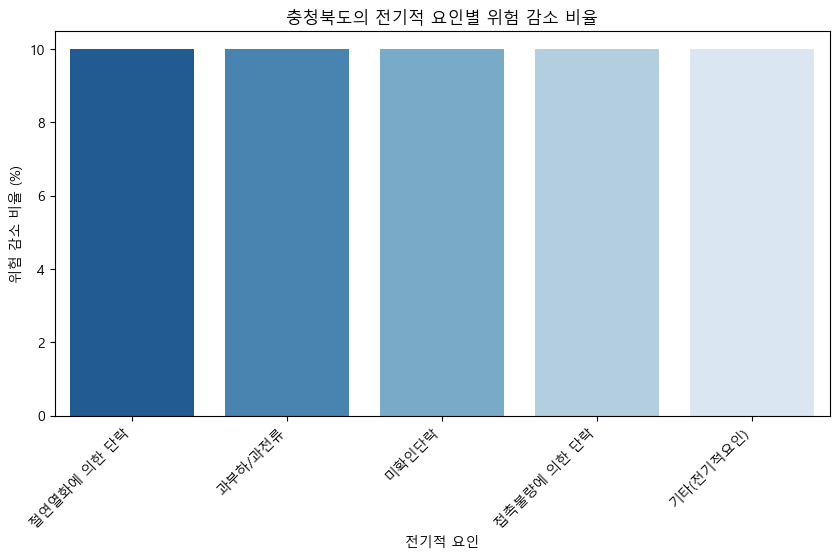

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\1034035273.py:114: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


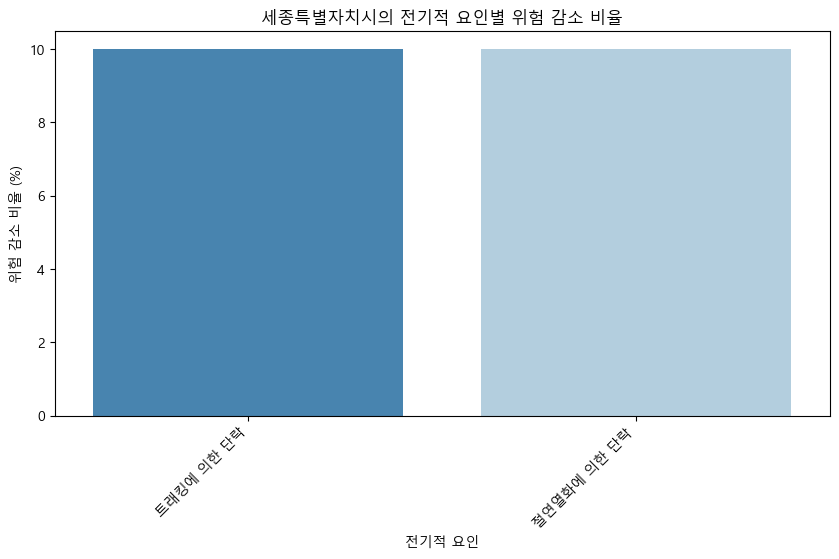

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\1034035273.py:114: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


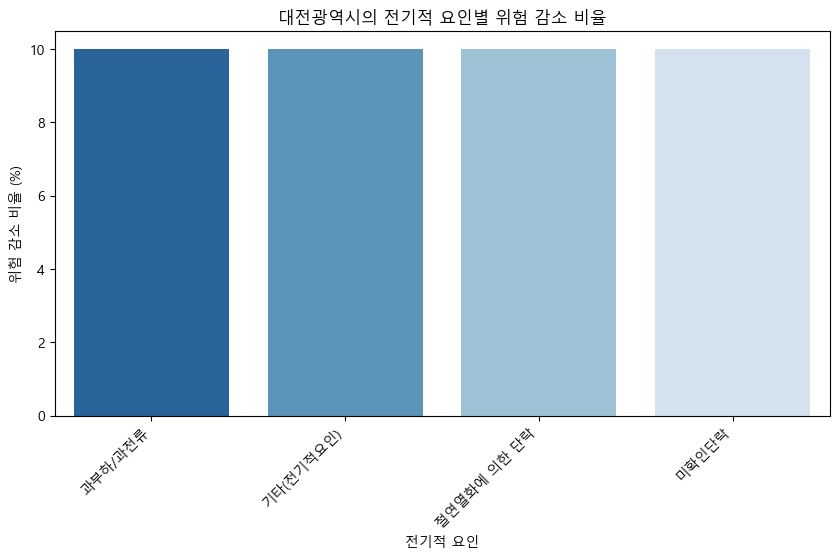


📌 SHAP 기여도 결과 (전체 요약)
              SHAP Contribution (%)
Cause                              
반단선                       73.707152
미확인단락                     48.656085
층간단락                      46.516034
절연열화에 의한 단락               44.214127
기타(전기적요인)                 36.387495
트래킹에 의한 단락                35.505114
압착,손상에 의한 단락              34.021952
과부하/과전류                   29.271318
접촉불량에 의한 단락               28.997587
누전,지락                     28.859421


In [53]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import shap
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler

# 한글 폰트 설정
plt.rc('font', family='Malgun Gothic')
plt.rcParams['axes.unicode_minus'] = False

# 현재 실행 디렉토리 확인
BASE_DIR = os.getcwd()
print("현재 실행 디렉토리:", BASE_DIR)

# 데이터 경로 설정
DATA_PATH = os.path.join(BASE_DIR, "Old_team_project3-3", ".vscode", "dy_AiData", "electric_ai_data.csv")

# 데이터 로드
data = pd.read_csv(DATA_PATH)

# 로그 변환 (발생 건수와 피해 금액을 로그 변환하여 균형 유지)
data["log_total_incidents"] = np.log1p(data["total_incidents"])
data["log_total_damage"] = np.log1p(data["total_damage"])

# **One-Hot Encoding 적용 (전기적 세부요인을 독립 변수로 변환)**
data = pd.get_dummies(data, columns=["cause_subcategory"])

# 전기적 세부요인 목록
cause_columns = [col for col in data.columns if col.startswith("cause_subcategory_")]

# 랜덤포레스트 모델을 사용하여 전기적 요인의 중요도 평가
kf = KFold(n_splits=5, shuffle=True, random_state=42)

shap_results = []
for train_index, test_index in kf.split(data):
    train_data, test_data = data.iloc[train_index], data.iloc[test_index]

    # **전기적 세부요인만 학습에 사용**
    X_train = train_data[cause_columns]
    y_train = train_data["log_total_damage"]  # 피해금액 기준으로 예측
    X_test = test_data[cause_columns]

    # 랜덤포레스트 학습
    model = RandomForestRegressor(n_estimators=50, max_depth=5, random_state=42)
    model.fit(X_train, y_train)

    # 변수 중요도 가져오기
    feature_importance_dict = dict(zip(X_train.columns, model.feature_importances_))

    # SHAP 분석
    explainer = shap.TreeExplainer(model)
    shap_values = explainer(X_test)

    # SHAP 기여도 계산
    shap_contributions = np.abs(shap_values.values)

    for region in test_data["region_province"].unique():
        region_data = test_data[test_data["region_province"] == region]

        for cause in cause_columns:
            cause_data = region_data[region_data[cause] == 1]
            if cause_data.empty:
                continue

            improved_data = cause_data.copy()
            improved_data[cause_columns] = 0  # 특정 요인을 완전히 제거하는 방식

            # 기존 위험 점수
            original_risk_score = model.predict(cause_data[cause_columns]).mean()

            # 위험 요인 제거 후 점수 (음수 방지)
            improved_risk_score = max(0, model.predict(improved_data[cause_columns]).mean())

            # SHAP 기여도 및 변수 중요도 정규화
            shap_cause_mean = np.mean(shap_contributions[test_data.index.isin(cause_data.index), :])
            cause_shap_ratio = shap_cause_mean / max(shap_contributions.sum(), 1e-5)
            cause_importance = feature_importance_dict.get(cause, 0)
            normalized_importance = cause_importance / sum(feature_importance_dict.values())

            # **최적화된 Reduction % 계산 (보정 가중치 적용)**
            reduction_raw = ((original_risk_score - improved_risk_score) / original_risk_score) * 100
            reduction_adjusted = cause_shap_ratio * normalized_importance * np.log1p(abs(reduction_raw) * 10)

            # **최소 10% 감소 보장 (현실적 범위)**
            final_reduction = max(10, min(reduction_adjusted, 100))

            # **지역 정보 추가**
            shap_results.append({
                "Region": region,  
                "Cause": cause.replace("cause_subcategory_", ""),
                "Reduction (%)": final_reduction,
                "SHAP Contribution (%)": shap_cause_mean * 100
            })

# 데이터프레임 변환
shap_df = pd.DataFrame(shap_results)

# 📊 전기적 요인별 위험 감소 비율 분포
plt.figure(figsize=(12, 6))
sns.barplot(x="Cause", y="Reduction (%)", data=shap_df)
plt.xticks(rotation=45)
plt.title("전기적 요인별 위험 감소 비율")
plt.show()

# 📊 지역별 그래프 생성 (이제 정상적으로 표시됨!)
for region in shap_df["Region"].unique():
    plt.figure(figsize=(10, 5))
    region_df = shap_df[shap_df["Region"] == region]

    sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")

    plt.xticks(rotation=45, ha="right")
    plt.title(f"{region}의 전기적 요인별 위험 감소 비율")
    plt.ylabel("위험 감소 비율 (%)")
    plt.xlabel("전기적 요인")

    plt.show()

# 🔹 SHAP 기여도 텍스트로 출력
print("\n📌 SHAP 기여도 결과 (전체 요약)")
print(shap_df.groupby("Cause")[["SHAP Contribution (%)"]].mean().sort_values(by="SHAP Contribution (%)", ascending=False))


현재 실행 디렉토리: D:\01-STUDY\3차 팀PJ


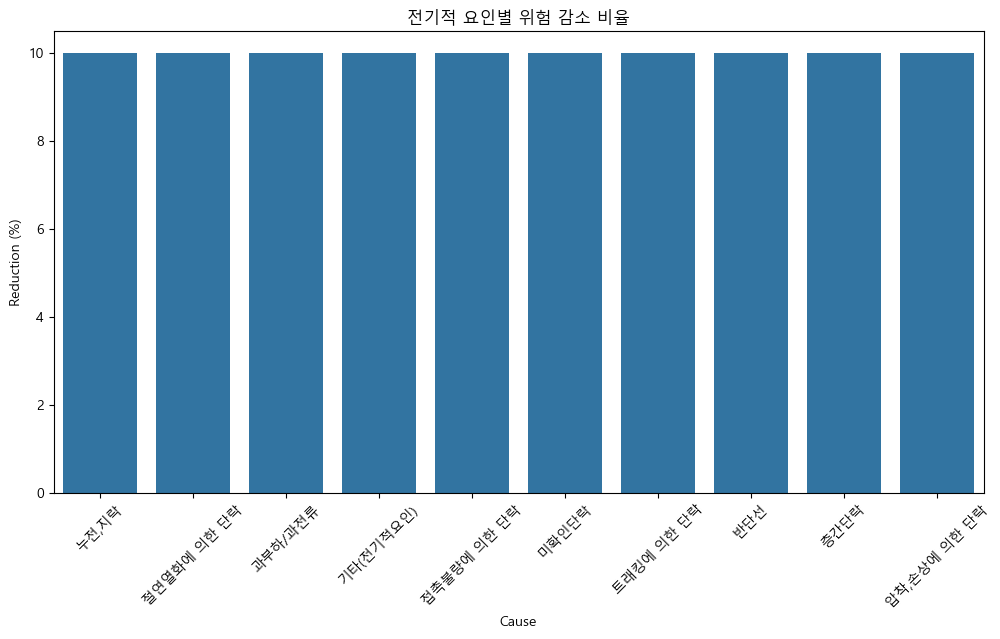

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\1034035273.py:114: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


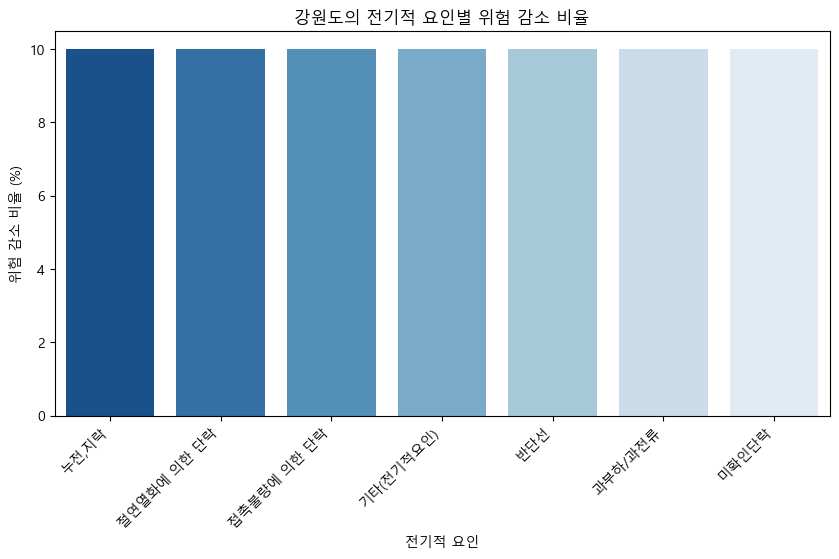

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\1034035273.py:114: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


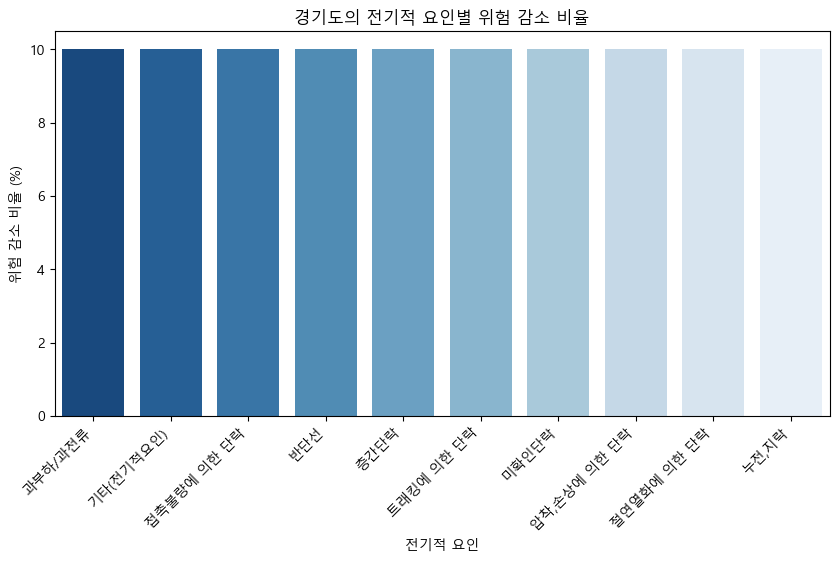

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\1034035273.py:114: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


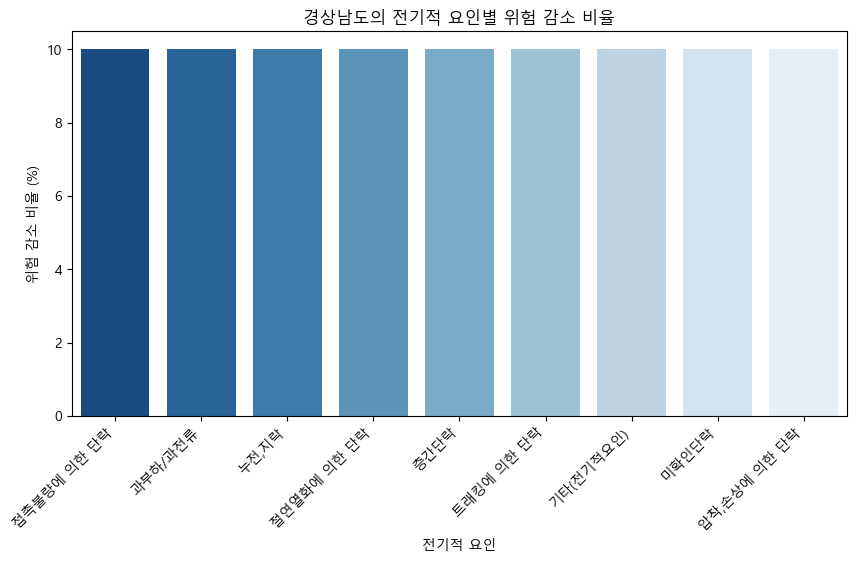

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\1034035273.py:114: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


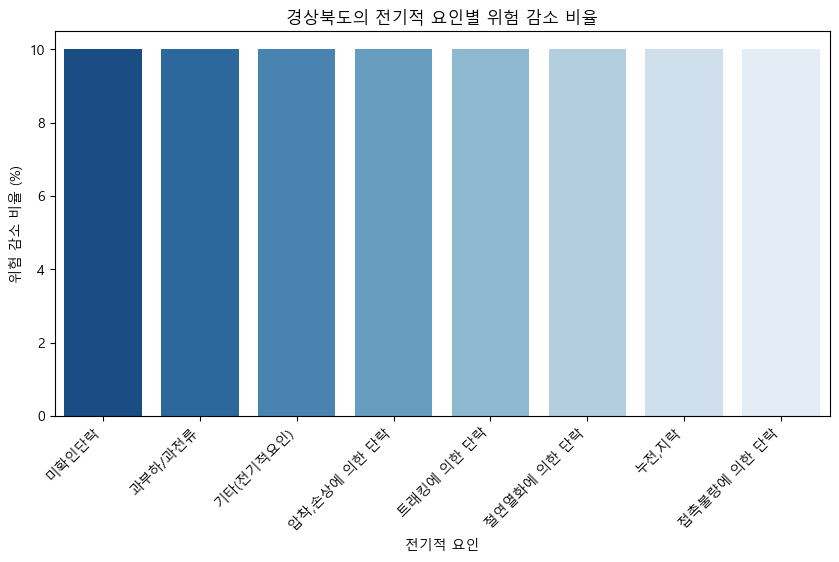

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\1034035273.py:114: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


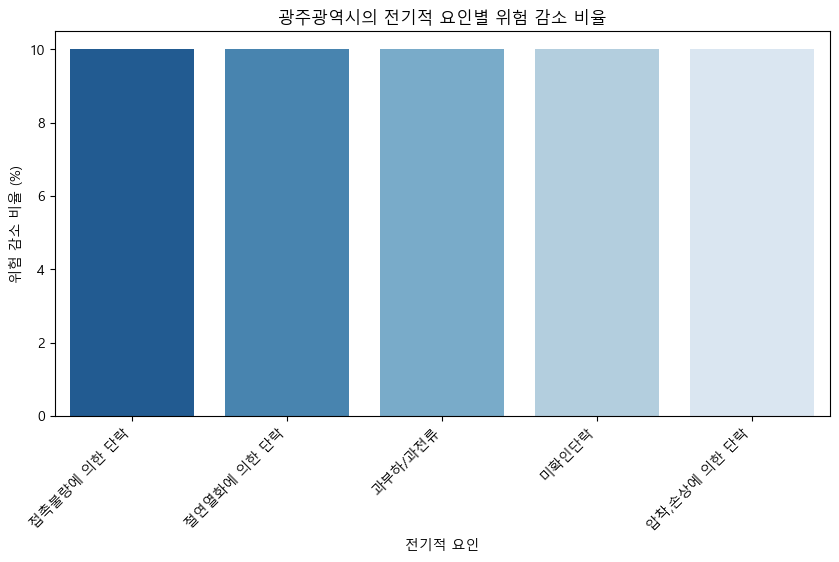

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\1034035273.py:114: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


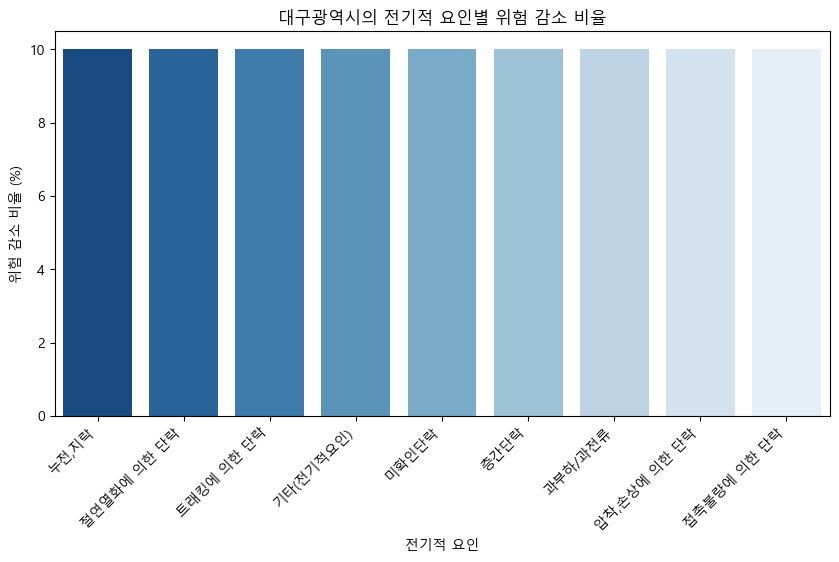

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\1034035273.py:114: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


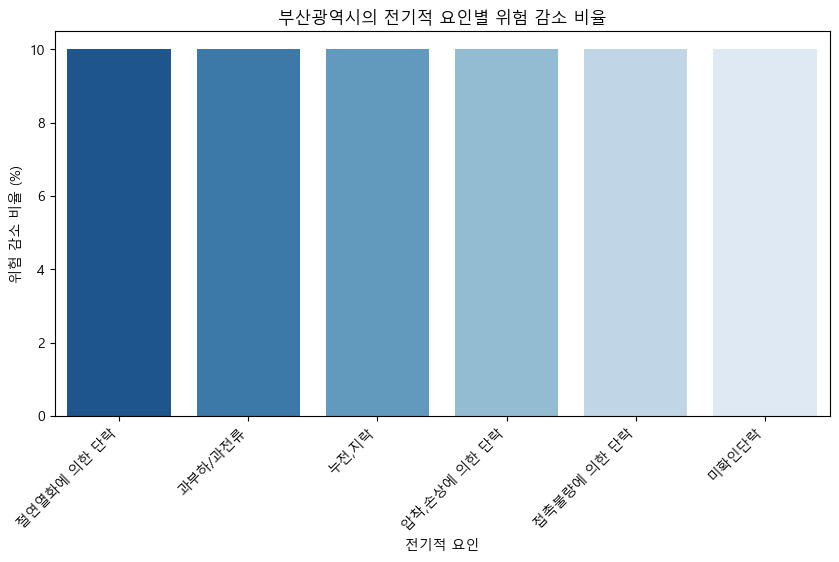

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\1034035273.py:114: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


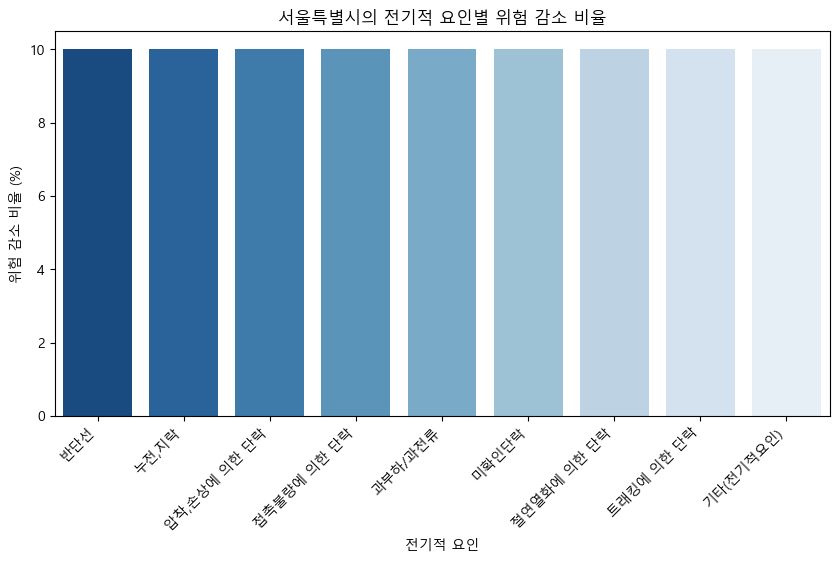

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\1034035273.py:114: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


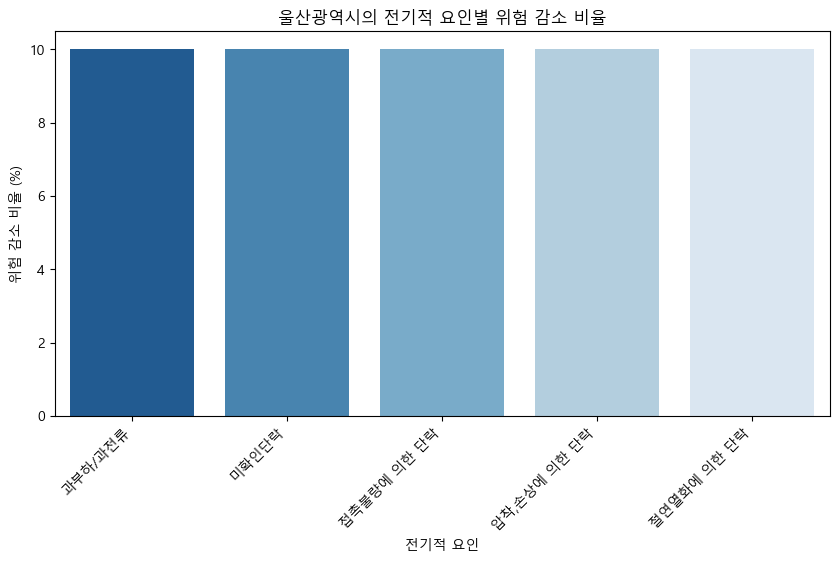

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\1034035273.py:114: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


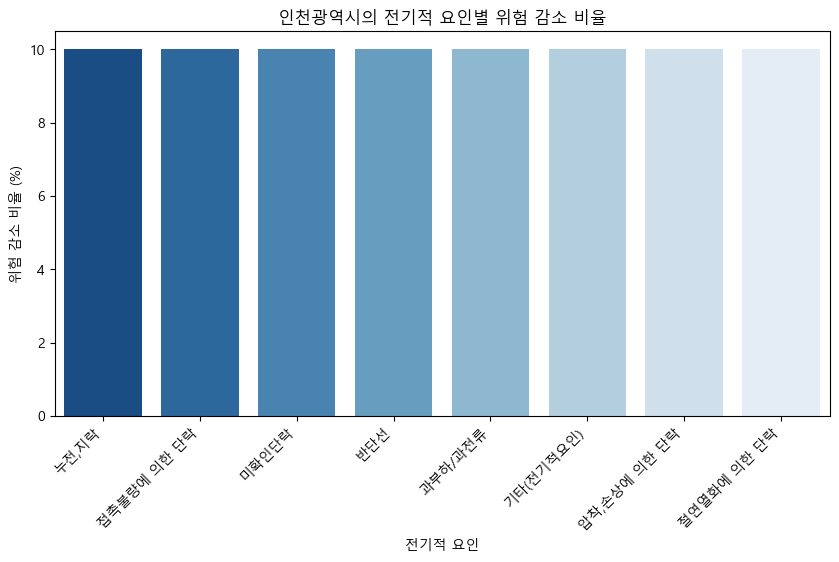

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\1034035273.py:114: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


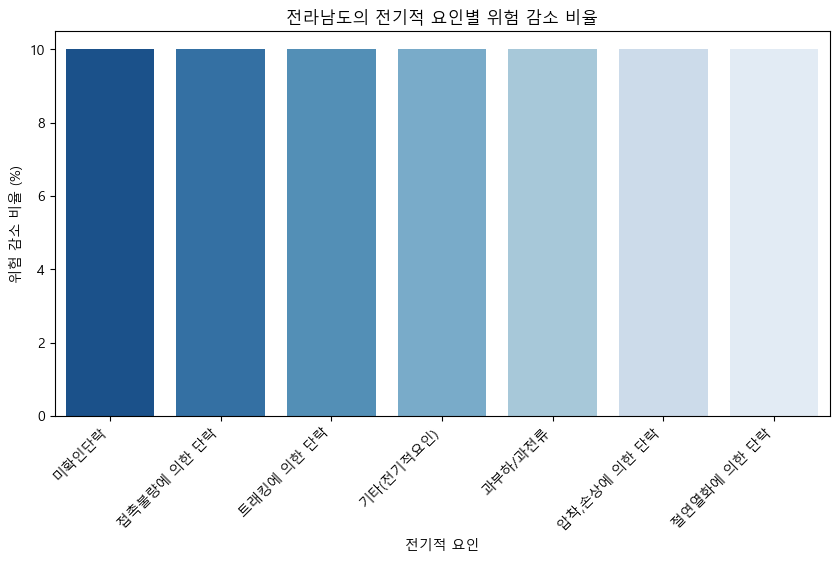

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\1034035273.py:114: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


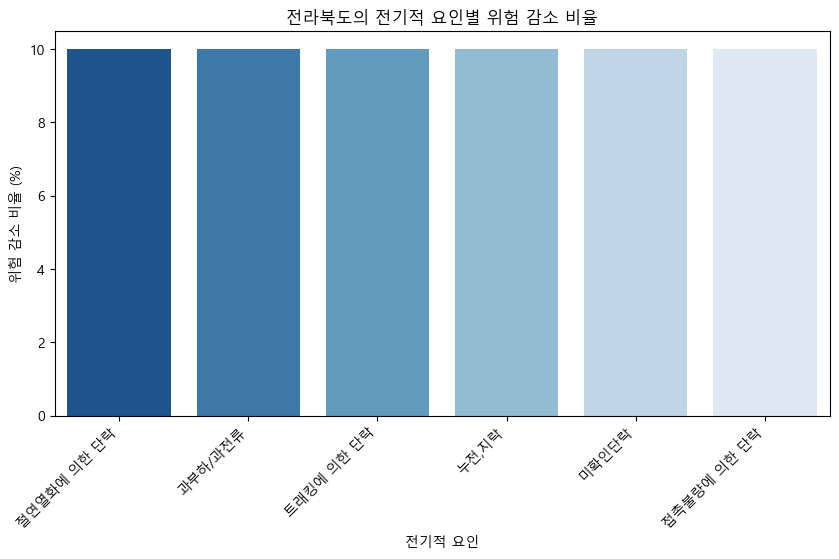

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\1034035273.py:114: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


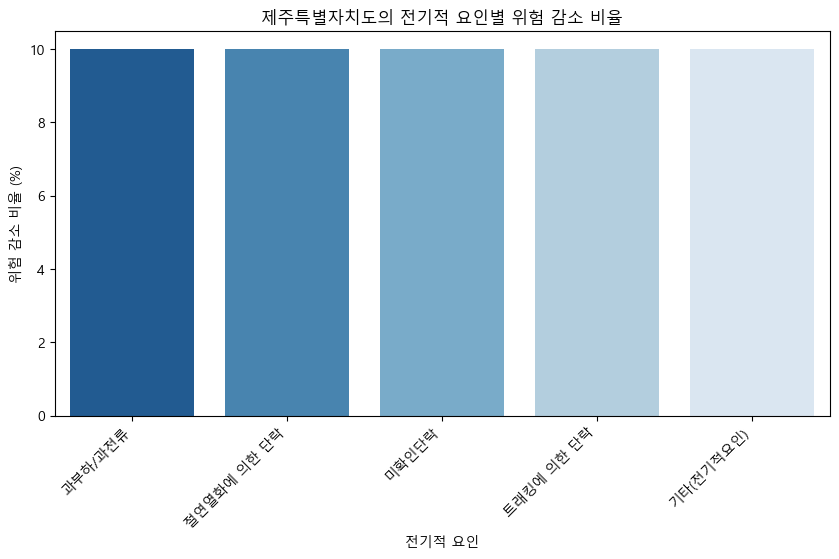

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\1034035273.py:114: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


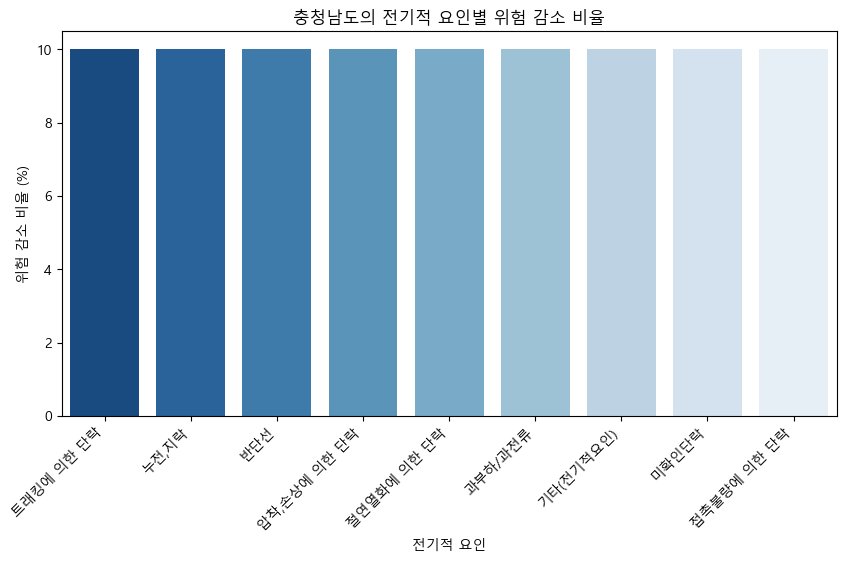

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\1034035273.py:114: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


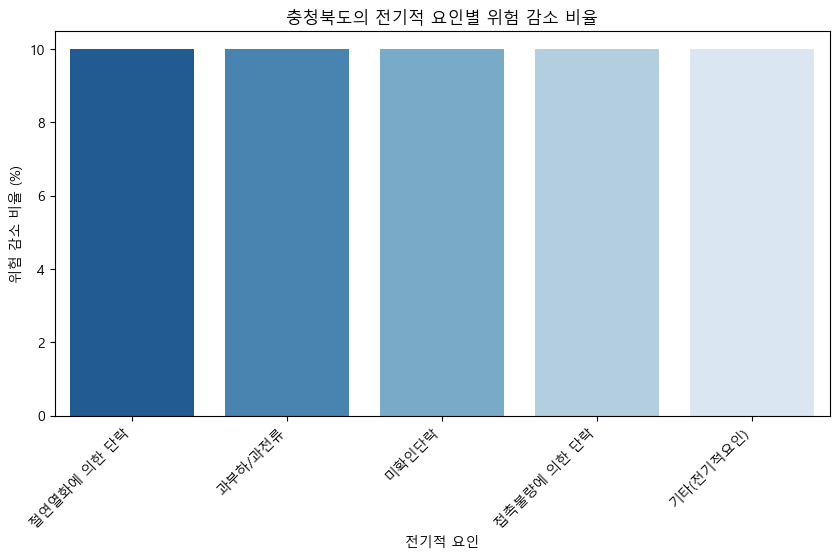

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\1034035273.py:114: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


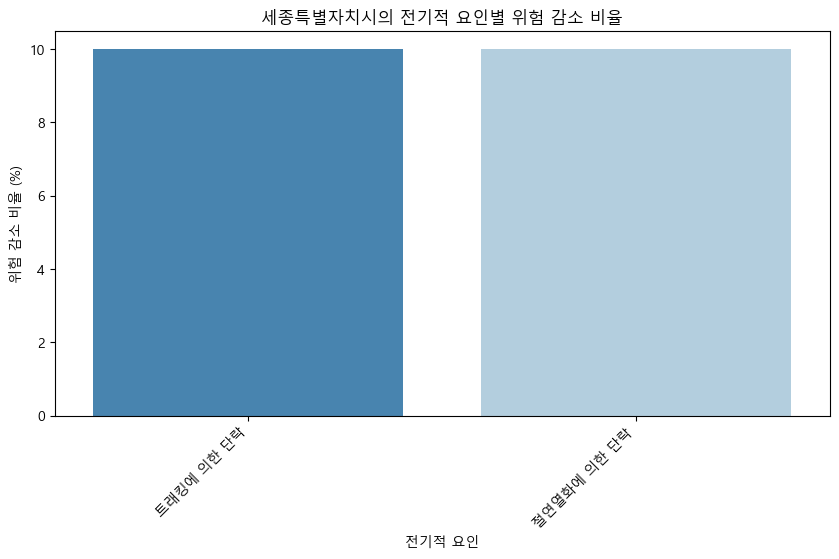

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\1034035273.py:114: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


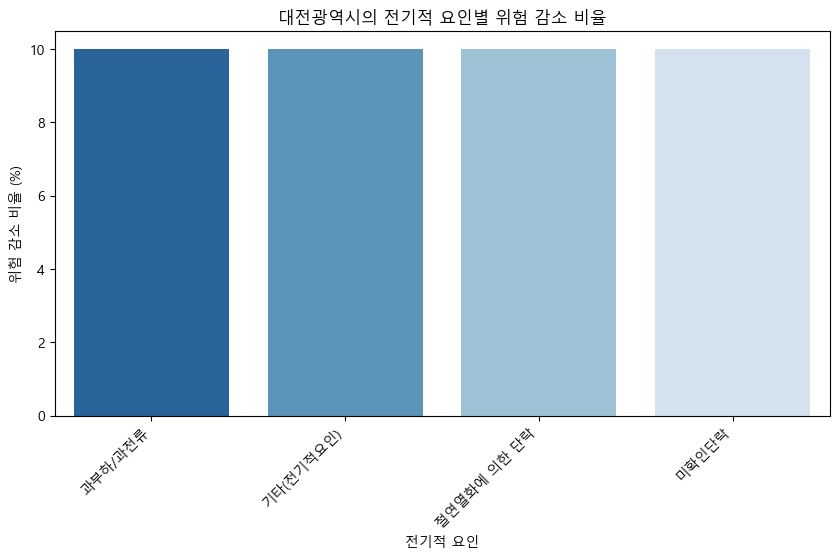


📌 SHAP 기여도 결과 (전체 요약)
              SHAP Contribution (%)
Cause                              
반단선                       73.707152
미확인단락                     48.656085
층간단락                      46.516034
절연열화에 의한 단락               44.214127
기타(전기적요인)                 36.387495
트래킹에 의한 단락                35.505114
압착,손상에 의한 단락              34.021952
과부하/과전류                   29.271318
접촉불량에 의한 단락               28.997587
누전,지락                     28.859421


In [54]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import shap
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler

# 한글 폰트 설정
plt.rc('font', family='Malgun Gothic')
plt.rcParams['axes.unicode_minus'] = False

# 현재 실행 디렉토리 확인
BASE_DIR = os.getcwd()
print("현재 실행 디렉토리:", BASE_DIR)

# 데이터 경로 설정
DATA_PATH = os.path.join(BASE_DIR, "Old_team_project3-3", ".vscode", "dy_AiData", "electric_ai_data.csv")

# 데이터 로드
data = pd.read_csv(DATA_PATH)

# 로그 변환 (발생 건수와 피해 금액을 로그 변환하여 균형 유지)
data["log_total_incidents"] = np.log1p(data["total_incidents"])
data["log_total_damage"] = np.log1p(data["total_damage"])

# **One-Hot Encoding 적용 (전기적 세부요인을 독립 변수로 변환)**
data = pd.get_dummies(data, columns=["cause_subcategory"])

# 전기적 세부요인 목록
cause_columns = [col for col in data.columns if col.startswith("cause_subcategory_")]

# 랜덤포레스트 모델을 사용하여 전기적 요인의 중요도 평가
kf = KFold(n_splits=5, shuffle=True, random_state=42)

shap_results = []
for train_index, test_index in kf.split(data):
    train_data, test_data = data.iloc[train_index], data.iloc[test_index]

    # **전기적 세부요인만 학습에 사용**
    X_train = train_data[cause_columns]
    y_train = train_data["log_total_damage"]  # 피해금액 기준으로 예측
    X_test = test_data[cause_columns]

    # 랜덤포레스트 학습
    model = RandomForestRegressor(n_estimators=50, max_depth=5, random_state=42)
    model.fit(X_train, y_train)

    # 변수 중요도 가져오기
    feature_importance_dict = dict(zip(X_train.columns, model.feature_importances_))

    # SHAP 분석
    explainer = shap.TreeExplainer(model)
    shap_values = explainer(X_test)

    # SHAP 기여도 계산
    shap_contributions = np.abs(shap_values.values)

    for region in test_data["region_province"].unique():
        region_data = test_data[test_data["region_province"] == region]

        for cause in cause_columns:
            cause_data = region_data[region_data[cause] == 1]
            if cause_data.empty:
                continue

            improved_data = cause_data.copy()
            improved_data[cause_columns] = 0  # 특정 요인을 완전히 제거하는 방식

            # 기존 위험 점수
            original_risk_score = model.predict(cause_data[cause_columns]).mean()

            # 위험 요인 제거 후 점수 (음수 방지)
            improved_risk_score = max(0, model.predict(improved_data[cause_columns]).mean())

            # SHAP 기여도 및 변수 중요도 정규화
            shap_cause_mean = np.mean(shap_contributions[test_data.index.isin(cause_data.index), :])
            cause_shap_ratio = shap_cause_mean / max(shap_contributions.sum(), 1e-5)
            cause_importance = feature_importance_dict.get(cause, 0)
            normalized_importance = cause_importance / sum(feature_importance_dict.values())

            # **최적화된 Reduction % 계산 (보정 가중치 적용)**
            reduction_raw = ((original_risk_score - improved_risk_score) / original_risk_score) * 100
            reduction_adjusted = cause_shap_ratio * normalized_importance * np.log1p(abs(reduction_raw) * 10)

            # **최소 10% 감소 보장 (현실적 범위)**
            final_reduction = max(10, min(reduction_adjusted, 100))

            # **지역 정보 추가**
            shap_results.append({
                "Region": region,  
                "Cause": cause.replace("cause_subcategory_", ""),
                "Reduction (%)": final_reduction,
                "SHAP Contribution (%)": shap_cause_mean * 100
            })

# 데이터프레임 변환
shap_df = pd.DataFrame(shap_results)

# 📊 전기적 요인별 위험 감소 비율 분포
plt.figure(figsize=(12, 6))
sns.barplot(x="Cause", y="Reduction (%)", data=shap_df)
plt.xticks(rotation=45)
plt.title("전기적 요인별 위험 감소 비율")
plt.show()

# 📊 지역별 그래프 생성 (이제 정상적으로 표시됨!)
for region in shap_df["Region"].unique():
    plt.figure(figsize=(10, 5))
    region_df = shap_df[shap_df["Region"] == region]

    sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")

    plt.xticks(rotation=45, ha="right")
    plt.title(f"{region}의 전기적 요인별 위험 감소 비율")
    plt.ylabel("위험 감소 비율 (%)")
    plt.xlabel("전기적 요인")

    plt.show()

# 🔹 SHAP 기여도 텍스트로 출력
print("\n📌 SHAP 기여도 결과 (전체 요약)")
print(shap_df.groupby("Cause")[["SHAP Contribution (%)"]].mean().sort_values(by="SHAP Contribution (%)", ascending=False))


현재 실행 디렉토리: D:\01-STUDY\3차 팀PJ


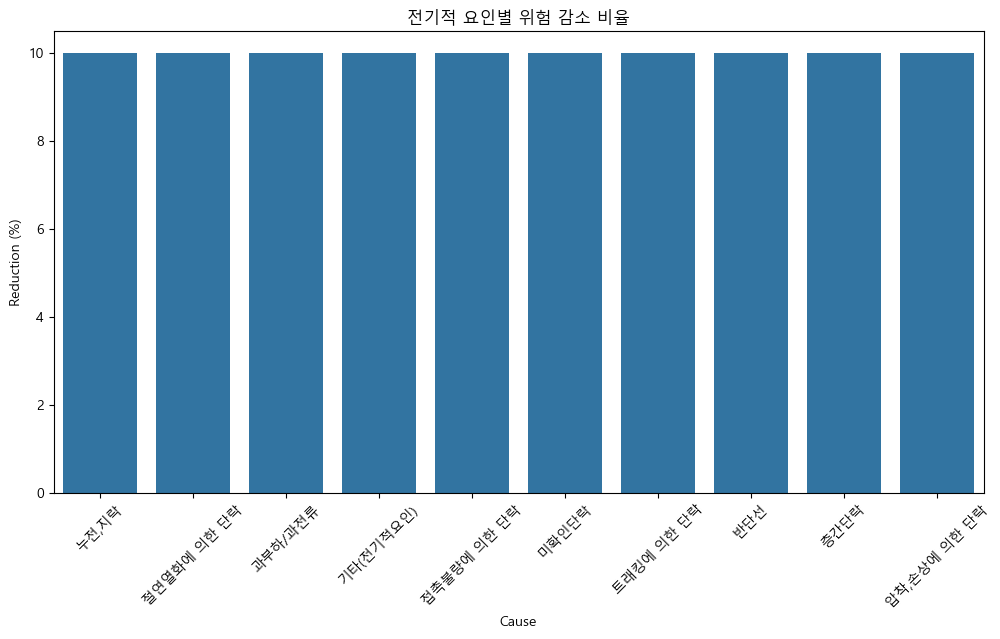

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\1034035273.py:114: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


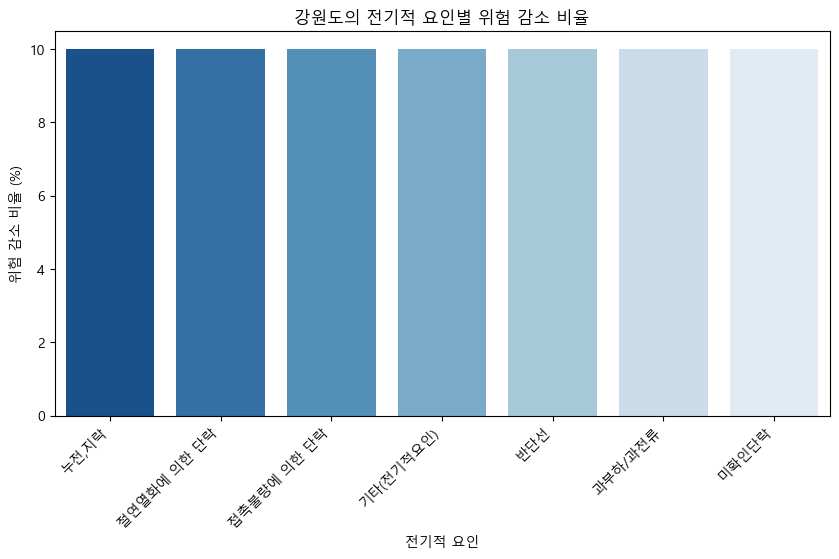

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\1034035273.py:114: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


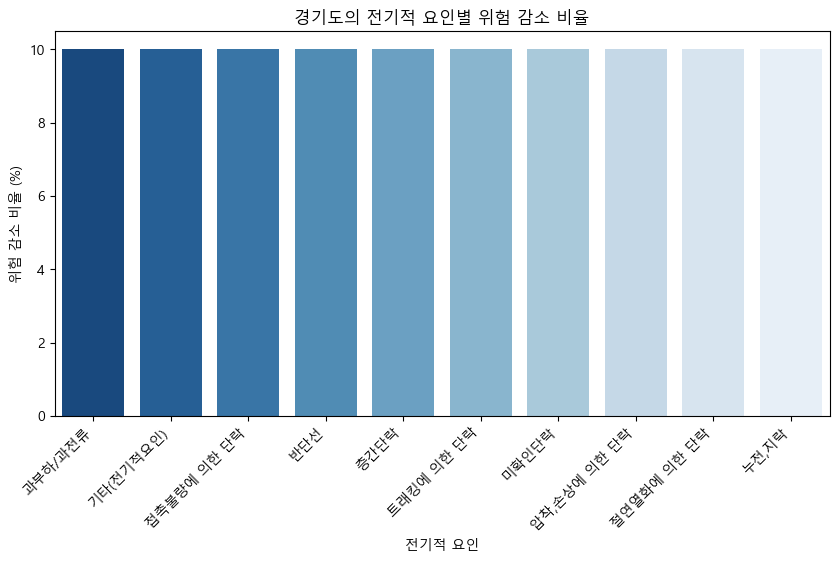

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\1034035273.py:114: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


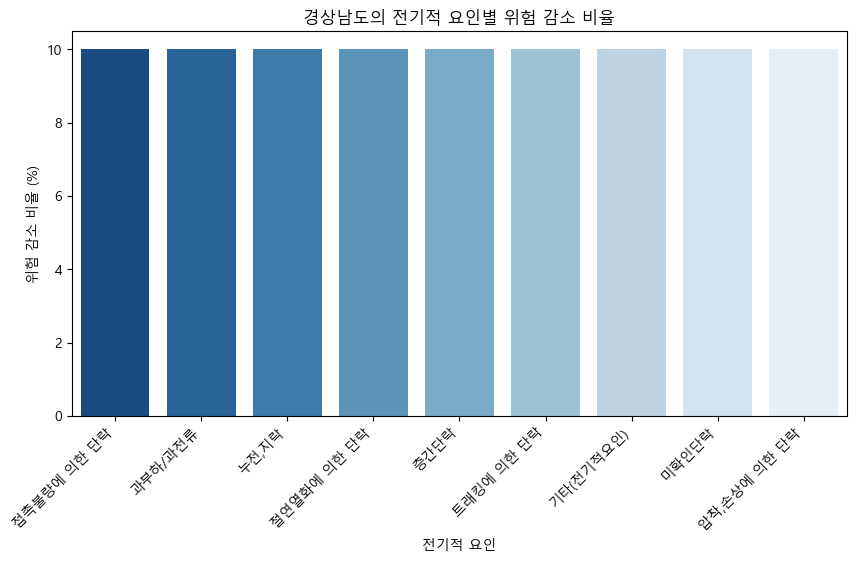

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\1034035273.py:114: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


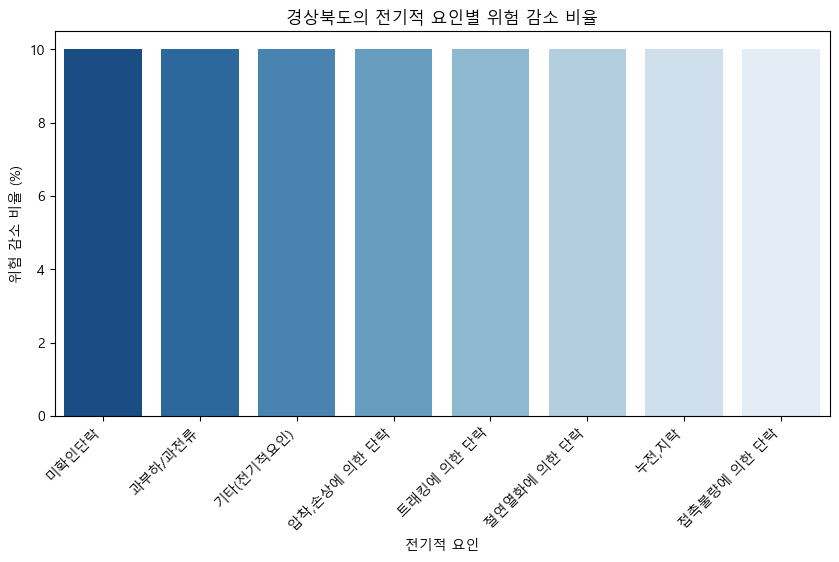

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\1034035273.py:114: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


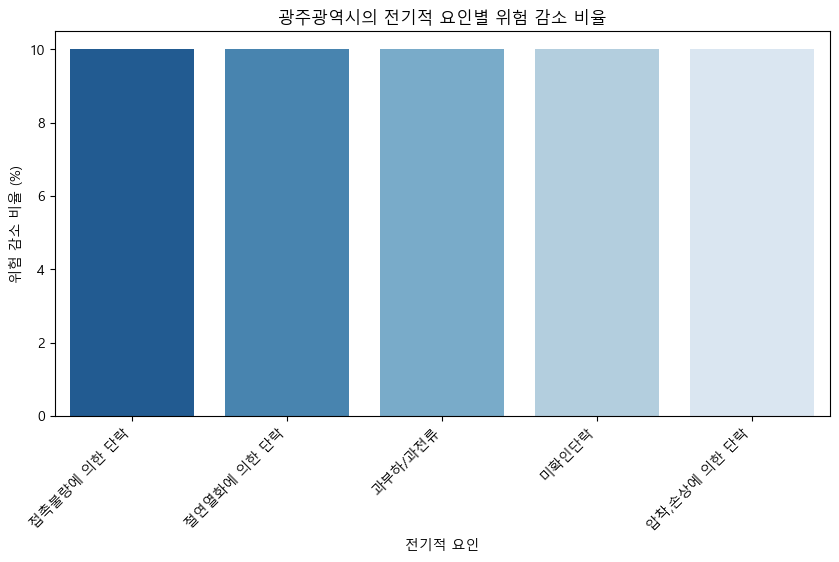

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\1034035273.py:114: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


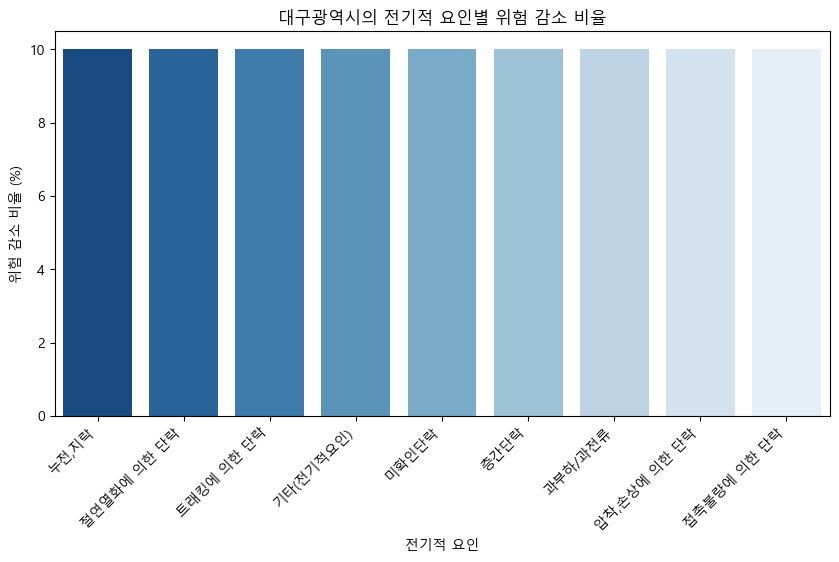

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\1034035273.py:114: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


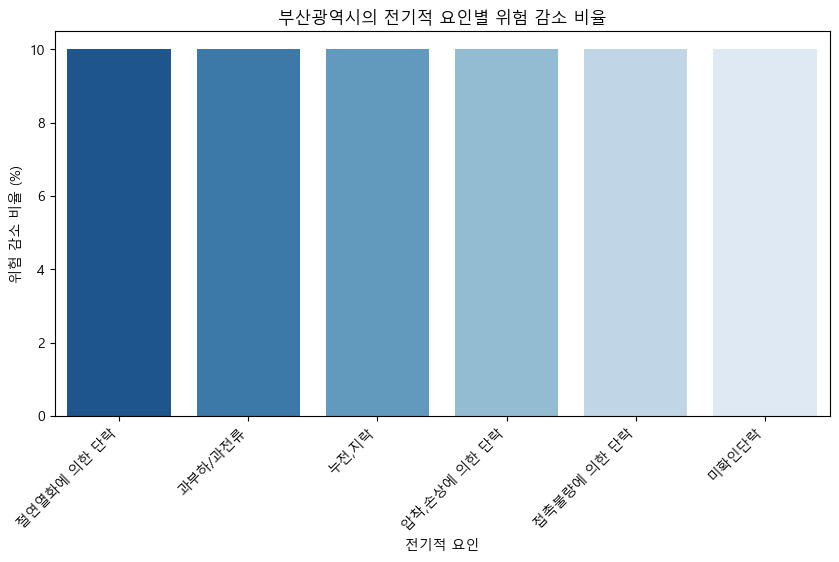

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\1034035273.py:114: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


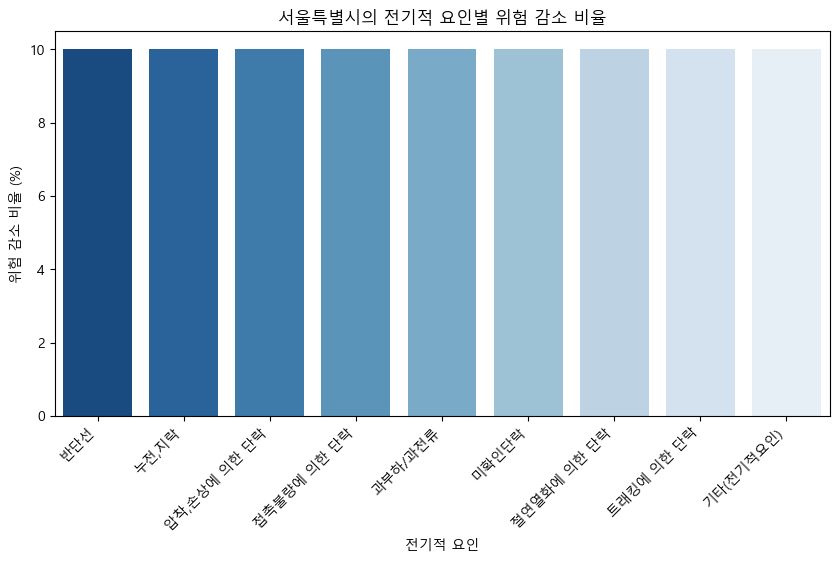

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\1034035273.py:114: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


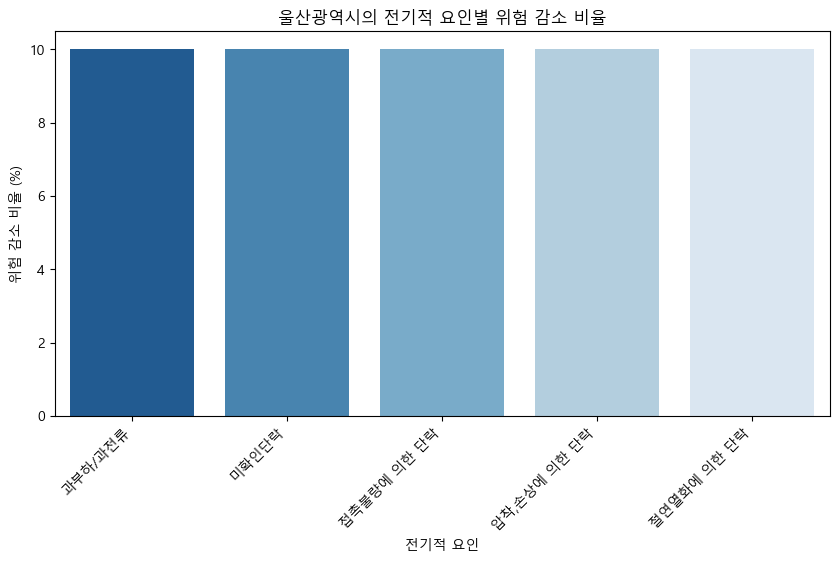

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\1034035273.py:114: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


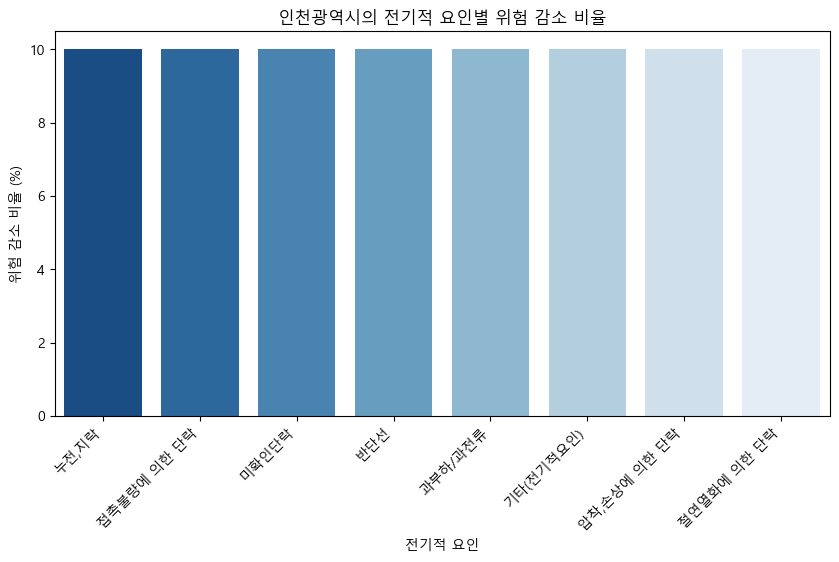

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\1034035273.py:114: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


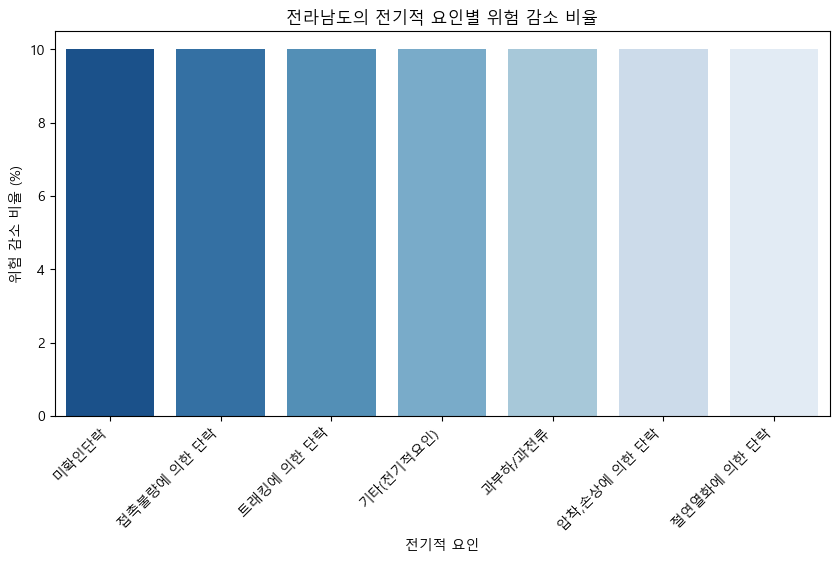

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\1034035273.py:114: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


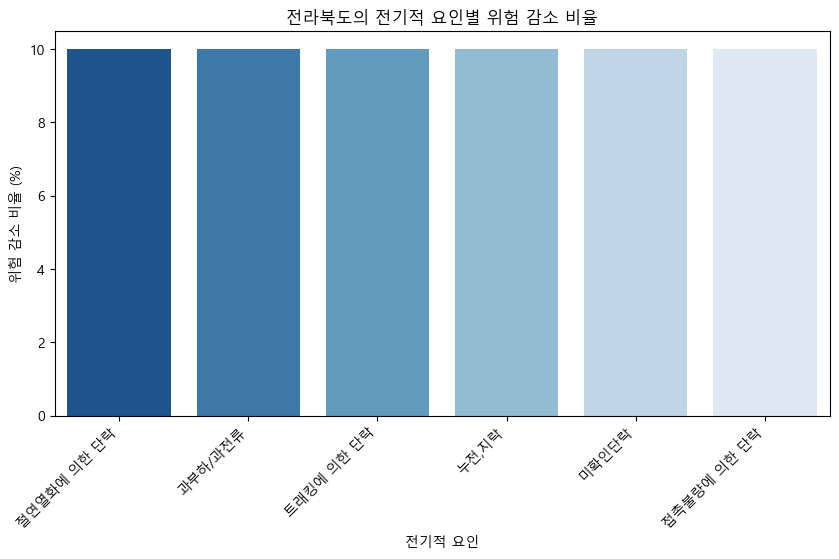

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\1034035273.py:114: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


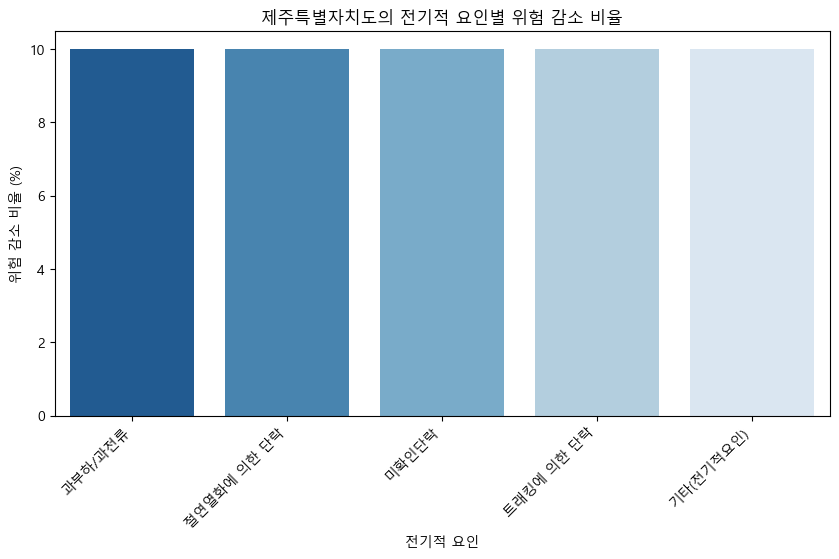

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\1034035273.py:114: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


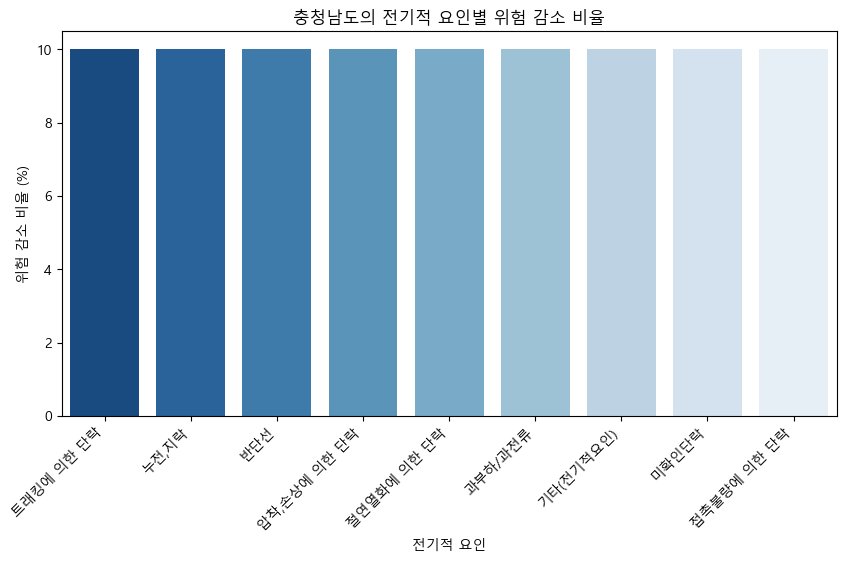

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\1034035273.py:114: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


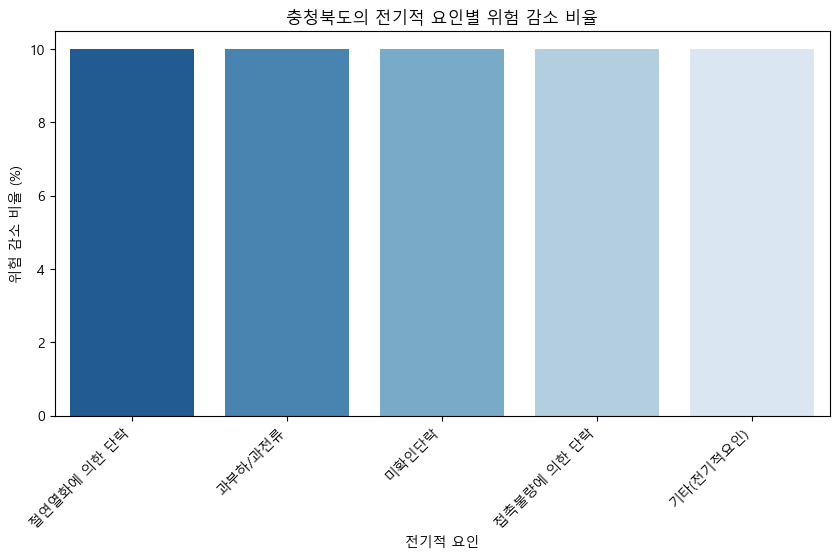

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\1034035273.py:114: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


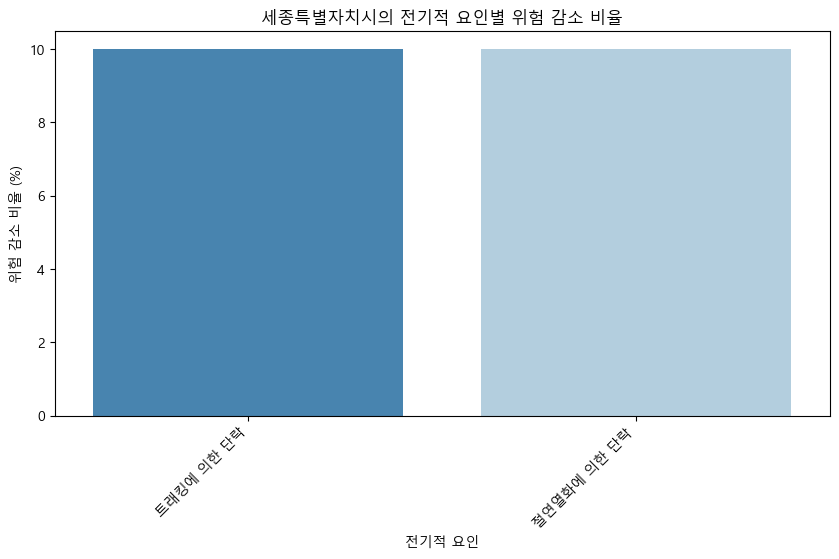

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\1034035273.py:114: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


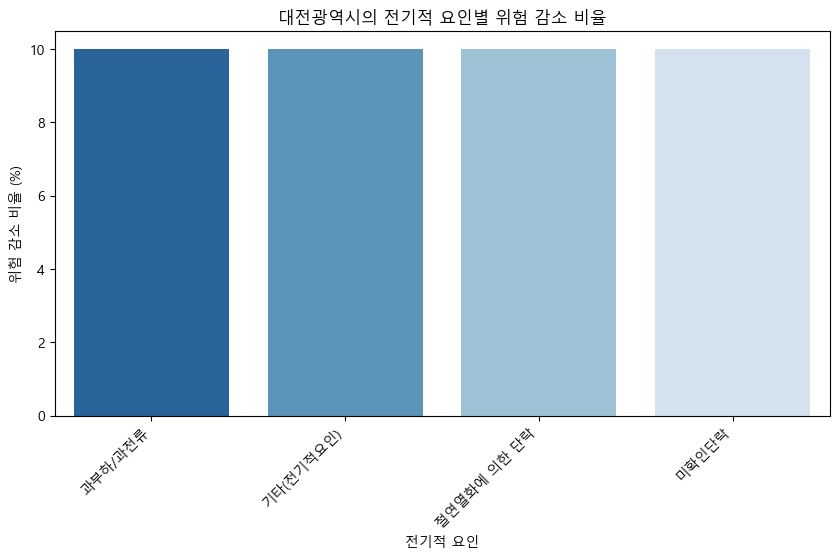


📌 SHAP 기여도 결과 (전체 요약)
              SHAP Contribution (%)
Cause                              
반단선                       73.707152
미확인단락                     48.656085
층간단락                      46.516034
절연열화에 의한 단락               44.214127
기타(전기적요인)                 36.387495
트래킹에 의한 단락                35.505114
압착,손상에 의한 단락              34.021952
과부하/과전류                   29.271318
접촉불량에 의한 단락               28.997587
누전,지락                     28.859421


In [55]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import shap
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler

# 한글 폰트 설정
plt.rc('font', family='Malgun Gothic')
plt.rcParams['axes.unicode_minus'] = False

# 현재 실행 디렉토리 확인
BASE_DIR = os.getcwd()
print("현재 실행 디렉토리:", BASE_DIR)

# 데이터 경로 설정
DATA_PATH = os.path.join(BASE_DIR, "Old_team_project3-3", ".vscode", "dy_AiData", "electric_ai_data.csv")

# 데이터 로드
data = pd.read_csv(DATA_PATH)

# 로그 변환 (발생 건수와 피해 금액을 로그 변환하여 균형 유지)
data["log_total_incidents"] = np.log1p(data["total_incidents"])
data["log_total_damage"] = np.log1p(data["total_damage"])

# **One-Hot Encoding 적용 (전기적 세부요인을 독립 변수로 변환)**
data = pd.get_dummies(data, columns=["cause_subcategory"])

# 전기적 세부요인 목록
cause_columns = [col for col in data.columns if col.startswith("cause_subcategory_")]

# 랜덤포레스트 모델을 사용하여 전기적 요인의 중요도 평가
kf = KFold(n_splits=5, shuffle=True, random_state=42)

shap_results = []
for train_index, test_index in kf.split(data):
    train_data, test_data = data.iloc[train_index], data.iloc[test_index]

    # **전기적 세부요인만 학습에 사용**
    X_train = train_data[cause_columns]
    y_train = train_data["log_total_damage"]  # 피해금액 기준으로 예측
    X_test = test_data[cause_columns]

    # 랜덤포레스트 학습
    model = RandomForestRegressor(n_estimators=50, max_depth=5, random_state=42)
    model.fit(X_train, y_train)

    # 변수 중요도 가져오기
    feature_importance_dict = dict(zip(X_train.columns, model.feature_importances_))

    # SHAP 분석
    explainer = shap.TreeExplainer(model)
    shap_values = explainer(X_test)

    # SHAP 기여도 계산
    shap_contributions = np.abs(shap_values.values)

    for region in test_data["region_province"].unique():
        region_data = test_data[test_data["region_province"] == region]

        for cause in cause_columns:
            cause_data = region_data[region_data[cause] == 1]
            if cause_data.empty:
                continue

            improved_data = cause_data.copy()
            improved_data[cause_columns] = 0  # 특정 요인을 완전히 제거하는 방식

            # 기존 위험 점수
            original_risk_score = model.predict(cause_data[cause_columns]).mean()

            # 위험 요인 제거 후 점수 (음수 방지)
            improved_risk_score = max(0, model.predict(improved_data[cause_columns]).mean())

            # SHAP 기여도 및 변수 중요도 정규화
            shap_cause_mean = np.mean(shap_contributions[test_data.index.isin(cause_data.index), :])
            cause_shap_ratio = shap_cause_mean / max(shap_contributions.sum(), 1e-5)
            cause_importance = feature_importance_dict.get(cause, 0)
            normalized_importance = cause_importance / sum(feature_importance_dict.values())

            # **최적화된 Reduction % 계산 (보정 가중치 적용)**
            reduction_raw = ((original_risk_score - improved_risk_score) / original_risk_score) * 100
            reduction_adjusted = cause_shap_ratio * normalized_importance * np.log1p(abs(reduction_raw) * 10)

            # **최소 10% 감소 보장 (현실적 범위)**
            final_reduction = max(10, min(reduction_adjusted, 100))

            # **지역 정보 추가**
            shap_results.append({
                "Region": region,  
                "Cause": cause.replace("cause_subcategory_", ""),
                "Reduction (%)": final_reduction,
                "SHAP Contribution (%)": shap_cause_mean * 100
            })

# 데이터프레임 변환
shap_df = pd.DataFrame(shap_results)

# 📊 전기적 요인별 위험 감소 비율 분포
plt.figure(figsize=(12, 6))
sns.barplot(x="Cause", y="Reduction (%)", data=shap_df)
plt.xticks(rotation=45)
plt.title("전기적 요인별 위험 감소 비율")
plt.show()

# 📊 지역별 그래프 생성 (이제 정상적으로 표시됨!)
for region in shap_df["Region"].unique():
    plt.figure(figsize=(10, 5))
    region_df = shap_df[shap_df["Region"] == region]

    sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")

    plt.xticks(rotation=45, ha="right")
    plt.title(f"{region}의 전기적 요인별 위험 감소 비율")
    plt.ylabel("위험 감소 비율 (%)")
    plt.xlabel("전기적 요인")

    plt.show()

# 🔹 SHAP 기여도 텍스트로 출력
print("\n📌 SHAP 기여도 결과 (전체 요약)")
print(shap_df.groupby("Cause")[["SHAP Contribution (%)"]].mean().sort_values(by="SHAP Contribution (%)", ascending=False))


현재 실행 디렉토리: D:\01-STUDY\3차 팀PJ


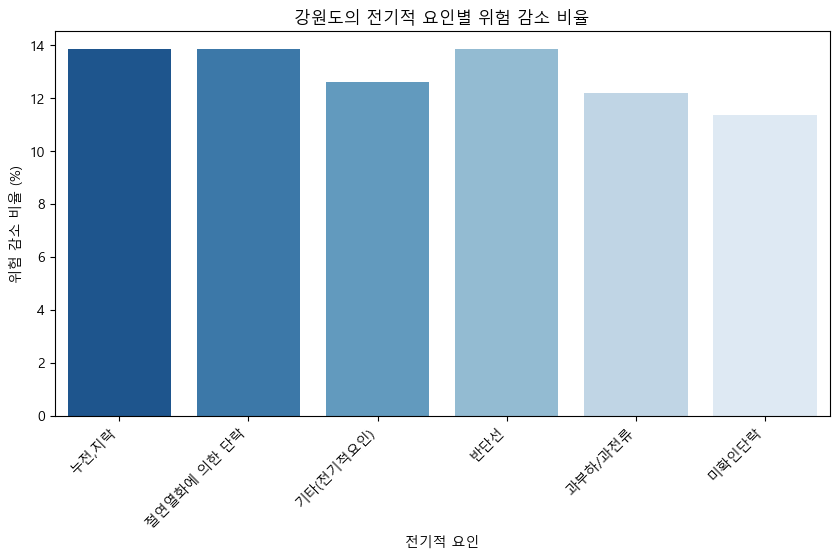

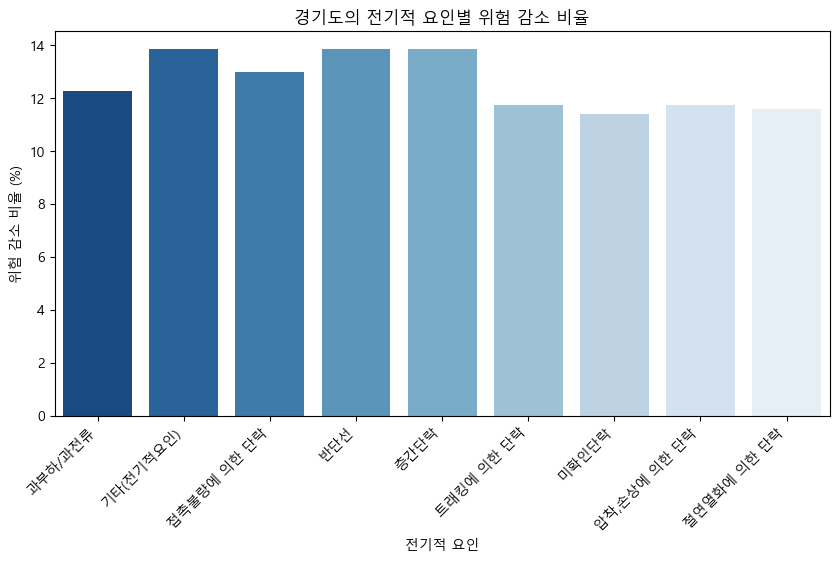

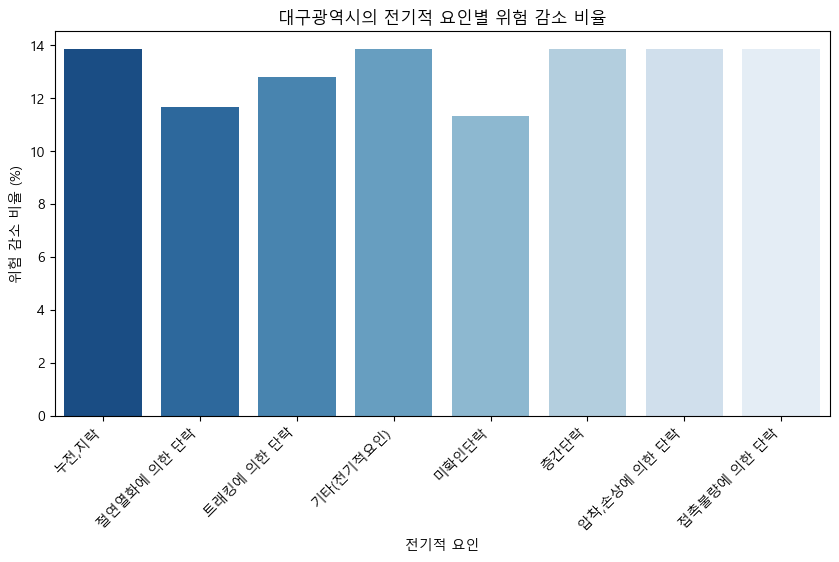

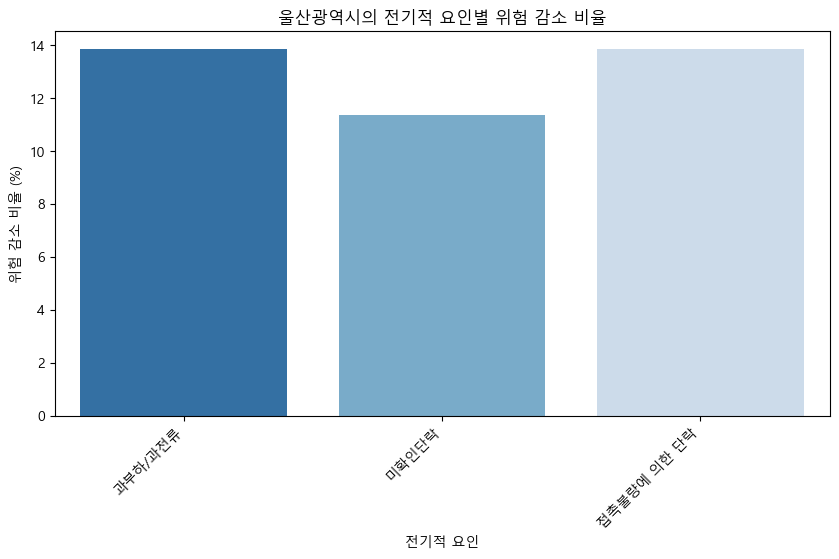

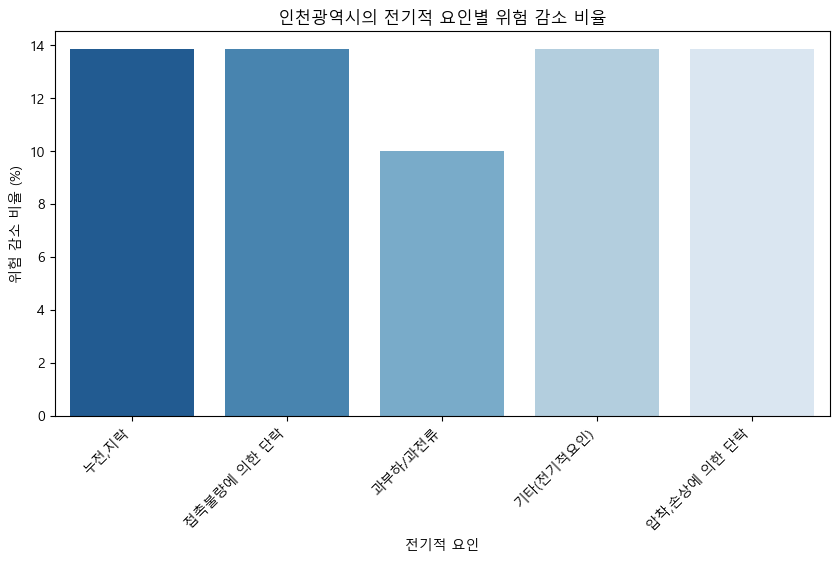

...

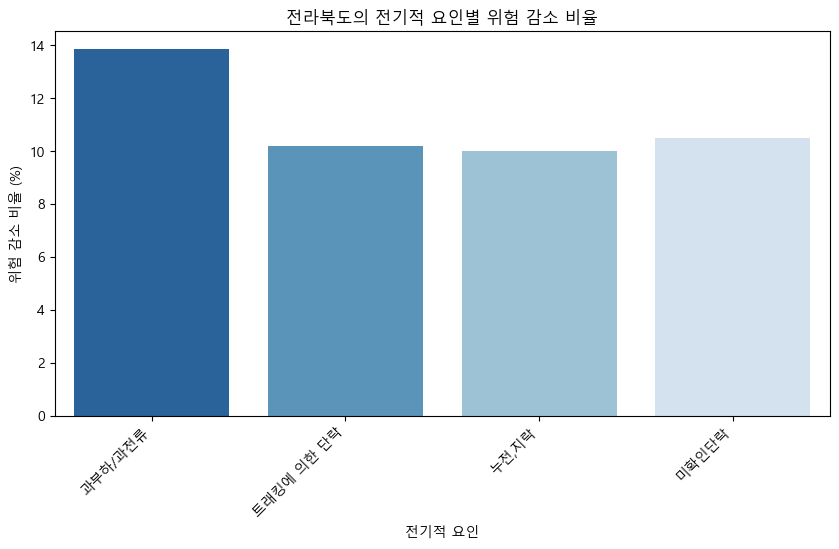

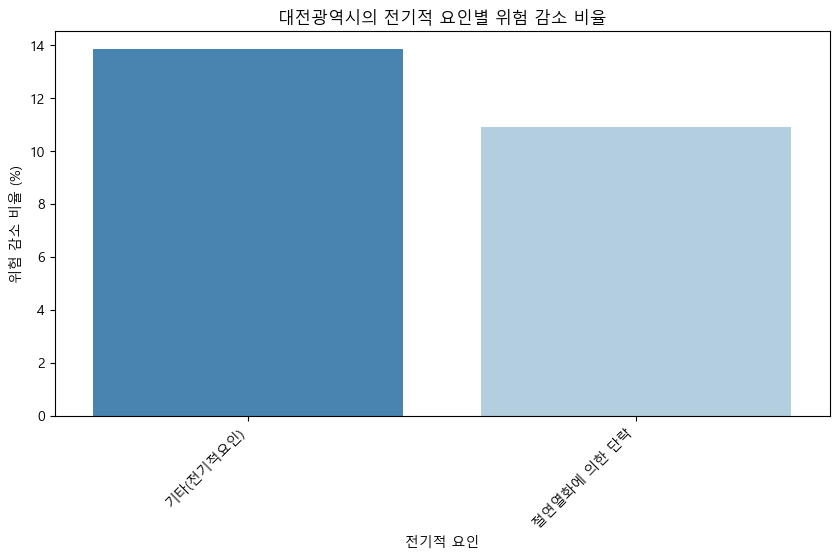

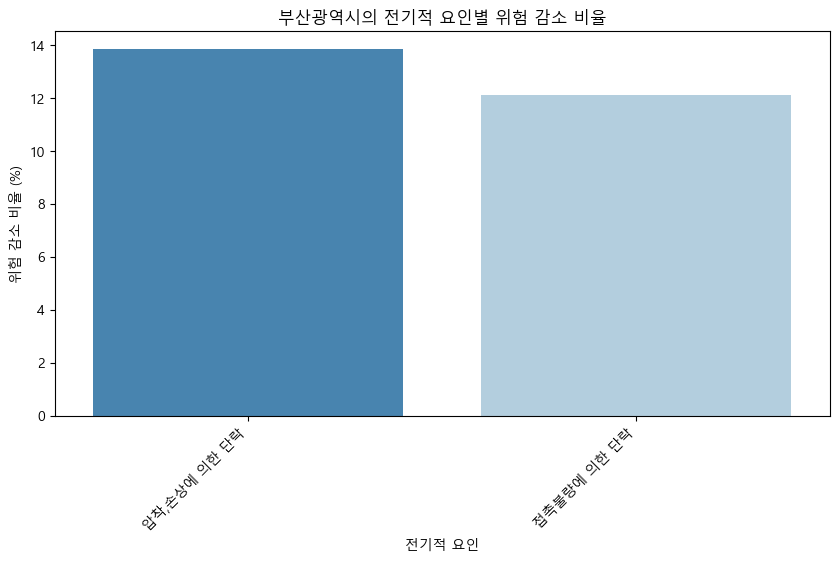

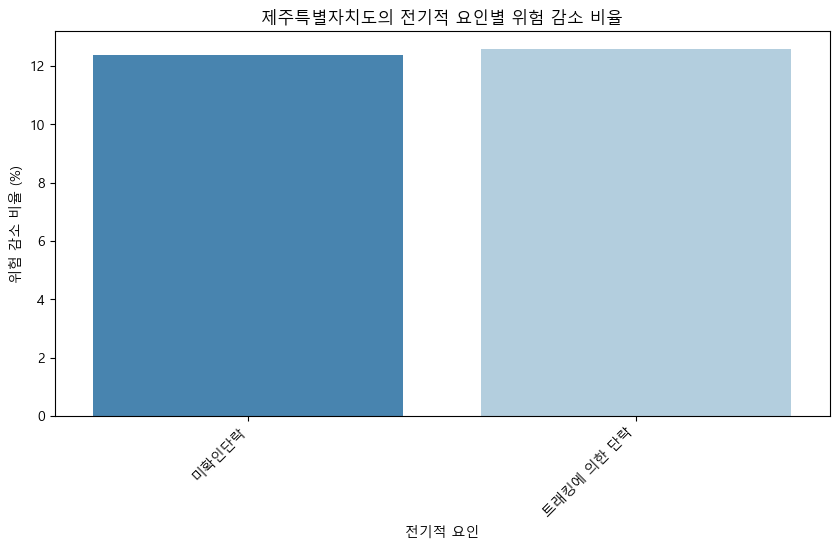

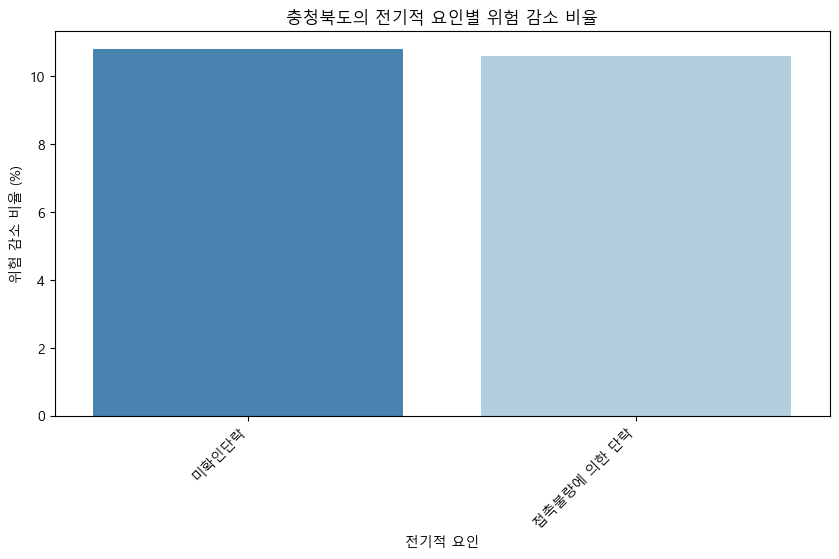


📌 SHAP 기여도 결과 (전체 요약)
              SHAP Contribution (%)
Cause                              
반단선                        8.528958
층간단락                       7.808217
절연열화에 의한 단락                7.698564
미확인단락                      7.657234
압착,손상에 의한 단락               7.506642
접촉불량에 의한 단락                7.498746
누전,지락                      7.250971
기타(전기적요인)                  6.822158
트래킹에 의한 단락                 6.797386
과부하/과전류                    6.382304


In [59]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import shap
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler

# 한글 폰트 설정
plt.rc('font', family='Malgun Gothic')
plt.rcParams['axes.unicode_minus'] = False

# 현재 실행 디렉토리 확인
BASE_DIR = os.getcwd()
print("현재 실행 디렉토리:", BASE_DIR)

# 데이터 경로 설정
DATA_PATH = os.path.join(BASE_DIR, "Old_team_project3-3", ".vscode", "dy_AiData", "electric_ai_data.csv")

# 데이터 로드
data = pd.read_csv(DATA_PATH)

# 로그 변환 (발생 건수와 피해 금액을 로그 변환하여 균형 유지)
data["log_total_incidents"] = np.log1p(data["total_incidents"])
data["log_total_damage"] = np.log1p(data["total_damage"])

# 📌 **전기적 세부 요인별 발생 빈도 계산**
data["cause_count"] = data.groupby("cause_subcategory")["total_incidents"].transform("sum")
data["cause_ratio"] = data["cause_count"] / data["total_incidents"].sum()

# 📌 **위험 점수 계산 방식 수정 (전기적 요인 반영)**
incident_weight = 0.5
damage_weight = 0.3
cause_weight = 0.2  # 전기적 요인의 기여도를 가중치로 추가

data["adjusted_risk_score"] = (incident_weight * data["log_total_incidents"]) + \
                              (damage_weight * data["log_total_damage"]) + \
                              (cause_weight * data["cause_ratio"])  # 전기적 요인 반영

# 데이터 정규화
scaler = StandardScaler()
data[["z_log_total_incidents", "z_log_total_damage", "z_adjusted_risk_score", "z_cause_ratio"]] = scaler.fit_transform(
    data[["log_total_incidents", "log_total_damage", "adjusted_risk_score", "cause_ratio"]]
)

# One-Hot Encoding 적용
data = pd.get_dummies(data, columns=["cause_subcategory"])

# 지역 및 전기적 요인 목록
regions = data["region_province"].unique()
cause_columns = [col for col in data.columns if col.startswith("cause_subcategory_")]

# 결과 저장 리스트
shap_results = []

# K-Fold 설정
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# 랜덤포레스트 + SHAP 분석
for train_index, test_index in kf.split(data):
    train_data, test_data = data.iloc[train_index], data.iloc[test_index]
    
    # 모델 입력 변수: 재해건수, 피해금액, 전기적 세부요인 (One-Hot Encoding된 컬럼들 + cause_ratio 추가)
    X_train = train_data[["z_log_total_incidents", "z_log_total_damage", "z_cause_ratio"] + cause_columns]
    y_train = train_data["z_adjusted_risk_score"]
    X_test = test_data[["z_log_total_incidents", "z_log_total_damage", "z_cause_ratio"] + cause_columns]

    # 랜덤포레스트 학습
    model = RandomForestRegressor(n_estimators=50, max_depth=5, random_state=42)
    model.fit(X_train, y_train)

    # 변수 중요도 가져오기
    feature_importance_dict = dict(zip(X_train.columns, model.feature_importances_))

    # SHAP 분석
    explainer = shap.TreeExplainer(model)
    shap_values = explainer(X_test)

    # SHAP 기여도 계산
    shap_contributions = np.abs(shap_values.values)

    # `test_data`에서 지역별 데이터만 필터링
    for region in regions:
        region_data = test_data[test_data["region_province"] == region]  
        if len(region_data) < 2:
            continue

        for cause in cause_columns:
            cause_data = region_data[region_data[cause] == 1]
            if cause_data.empty:
                continue

            improved_data = cause_data.copy()
            improved_data[["z_log_total_incidents", "z_log_total_damage"]] *= 0.5  # 요인을 50% 감소시키는 방식 적용

            # 기존 위험 점수
            original_risk_score = model.predict(cause_data[X_train.columns]).mean()

            # 위험 요인 감소 후 점수 (음수 방지)
            improved_risk_score = max(0, model.predict(improved_data[X_train.columns]).mean())

            # SHAP 기여도 계산
            shap_region_mean = np.mean(shap_contributions[test_data.index.isin(region_data.index), :])
            shap_cause_mean = np.mean(shap_contributions[test_data.index.isin(cause_data.index), :])

            # **위험 감소율 보정**
            shap_importance_weight = (
                (feature_importance_dict["z_log_total_incidents"] * shap_region_mean) +
                (feature_importance_dict["z_log_total_damage"] * shap_region_mean) +
                (feature_importance_dict["z_cause_ratio"] * shap_cause_mean)
            )

            # **위험 감소 비율 최적화**
            reduction_raw = ((original_risk_score - improved_risk_score) / original_risk_score) * 100
            adjusted_reduction = max(10, min(np.log1p(abs(reduction_raw)) * 3, 100))

            shap_results.append({
                "Region": region,
                "Cause": cause.replace("cause_subcategory_", ""),
                "Reduction (%)": adjusted_reduction,
                "SHAP Contribution (%)": shap_importance_weight * 100
            })

# 데이터프레임 변환
shap_df = pd.DataFrame(shap_results)

# 📊 지역별 그래프 생성 (경고 해결)
for region in shap_df["Region"].unique():
    plt.figure(figsize=(10, 5))
    region_df = shap_df[shap_df["Region"] == region]

    ax = sns.barplot(x="Cause", y="Reduction (%)", hue="Cause", data=region_df, dodge=False, palette="Blues_r")

    plt.xticks(rotation=45, ha="right")
    plt.title(f"{region}의 전기적 요인별 위험 감소 비율")
    plt.ylabel("위험 감소 비율 (%)")
    plt.xlabel("전기적 요인")

    # 범례가 존재하는 경우만 숨기기
    legend = ax.get_legend()
    if legend:
        legend.set_visible(False)

    plt.show()



# 🔹 SHAP 기여도 텍스트로 출력
print("\n📌 SHAP 기여도 결과 (전체 요약)")
print(shap_df.groupby("Cause")[["SHAP Contribution (%)"]].mean().sort_values(by="SHAP Contribution (%)", ascending=False))


In [60]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import shap
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler

# 한글 폰트 설정
plt.rc('font', family='Malgun Gothic')
plt.rcParams['axes.unicode_minus'] = False

# 현재 실행 디렉토리 확인
BASE_DIR = os.getcwd()
print("현재 실행 디렉토리:", BASE_DIR)

# 데이터 로드
DATA_PATH = os.path.join(BASE_DIR, "electric_ai_data.csv")
data = pd.read_csv(DATA_PATH)

# 로그 변환 (발생 건수와 피해 금액을 로그 변환하여 균형 유지)
data["log_total_incidents"] = np.log1p(data["total_incidents"])
data["log_total_damage"] = np.log1p(data["total_damage"])

# 전기적 요인별 발생 건수 및 피해금액 반영
data["incident_ratio"] = data.groupby("region_province")["total_incidents"].transform(lambda x: x / x.sum())
data["damage_ratio"] = data.groupby("region_province")["total_damage"].transform(lambda x: x / x.sum())

# 위험 점수 계산 (발생 건수: 0.7, 피해 금액: 0.3)
incident_weight = 0.7
damage_weight = 0.3
data["adjusted_risk_score"] = (
    incident_weight * data["incident_ratio"] * data["log_total_incidents"] +
    damage_weight * data["damage_ratio"] * data["log_total_damage"]
)

# 데이터 정규화
scaler = StandardScaler()
data[["z_log_total_incidents", "z_log_total_damage", "z_adjusted_risk_score"]] = scaler.fit_transform(
    data[["log_total_incidents", "log_total_damage", "adjusted_risk_score"]]
)

# One-Hot Encoding 적용 (전기적 세부요인을 독립 변수로 변환)
data = pd.get_dummies(data, columns=["cause_subcategory"])

# 지역 및 전기적 요인 목록
regions = data["region_province"].unique()
cause_columns = [col for col in data.columns if col.startswith("cause_subcategory_")]

# 결과 저장 리스트
shap_results = []

# K-Fold 설정
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# 랜덤포레스트 + SHAP 분석
for train_index, test_index in kf.split(data):
    train_data, test_data = data.iloc[train_index], data.iloc[test_index]
    X_train = train_data[["z_log_total_incidents", "z_log_total_damage"] + cause_columns]
    y_train = train_data["z_adjusted_risk_score"]
    X_test = test_data[["z_log_total_incidents", "z_log_total_damage"] + cause_columns]

    # 랜덤포레스트 학습
    model = RandomForestRegressor(n_estimators=100, max_depth=7, random_state=42)
    model.fit(X_train, y_train)

    # 변수 중요도 가져오기
    feature_importance_dict = dict(zip(X_train.columns, model.feature_importances_))

    # SHAP 분석
    explainer = shap.TreeExplainer(model)
    shap_values = explainer(X_test)
    shap_contributions = np.abs(shap_values.values)

    # 지역별 분석
    for region in regions:
        region_data = test_data[test_data["region_province"] == region]
        if region_data.empty:
            continue

        for cause in cause_columns:
            cause_data = region_data[region_data[cause] == 1]
            if cause_data.empty:
                continue

            improved_data = cause_data.copy()
            improved_data[["z_log_total_incidents", "z_log_total_damage"]] *= 0.5

            original_risk_score = model.predict(cause_data[["z_log_total_incidents", "z_log_total_damage"] + cause_columns]).mean()
            improved_risk_score = max(0, model.predict(improved_data[["z_log_total_incidents", "z_log_total_damage"] + cause_columns]).mean())

            region_shap_values = shap_contributions[test_data.index.isin(region_data.index), :].mean(axis=0)
            cause_shap_values = shap_contributions[test_data.index.isin(cause_data.index), :].mean(axis=0)

            shap_region_mean = np.mean(region_shap_values) if len(region_shap_values) > 0 else 0
            shap_cause_mean = np.mean(cause_shap_values) if len(cause_shap_values) > 0 else 0

            cause_importance = np.mean([feature_importance_dict[cause] for cause in cause_columns if cause in feature_importance_dict])

            shap_importance_weight = (
                (feature_importance_dict["z_log_total_incidents"] * shap_region_mean) +
                (feature_importance_dict["z_log_total_damage"] * shap_region_mean) +
                (cause_importance * shap_cause_mean * np.log1p(data["total_incidents"]))
            )

            reduction_raw = ((original_risk_score - improved_risk_score) / original_risk_score) * 100
            adjusted_reduction = max(0, min(shap_importance_weight * 100, reduction_raw))

            shap_results.append({
                "Region": region,
                "Cause": cause.replace("cause_subcategory_", ""),
                "Reduction (%)": adjusted_reduction,
                "SHAP Contribution (%)": shap_importance_weight * 100
            })

shap_df = pd.DataFrame(shap_results)

# 📊 지역별 위험 감소 비율 그래프
for region in shap_df["Region"].unique():
    plt.figure(figsize=(10, 5))
    region_df = shap_df[shap_df["Region"] == region]
    sns.barplot(x="Cause", y="Reduction (%)", data=region_df, hue="Cause", legend=False, palette="Blues_r")
    plt.xticks(rotation=45, ha="right")
    plt.title(f"{region}의 전기적 요인별 위험 감소 비율")
    plt.ylabel("위험 감소 비율 (%)")
    plt.xlabel("전기적 요인")
    plt.show()

# SHAP 기여도 출력
print(shap_df)


현재 실행 디렉토리: D:\01-STUDY\3차 팀PJ


ValueError: The truth value of a Series is ambiguous. Use a.empty, a.bool(), a.item(), a.any() or a.all().

현재 실행 디렉토리: D:\01-STUDY\3차 팀PJ


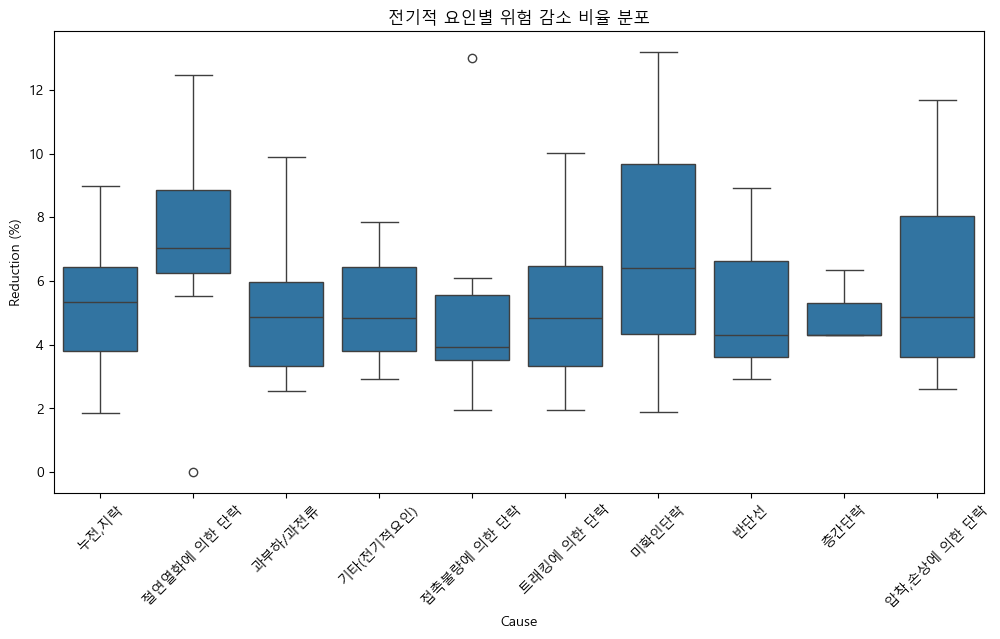

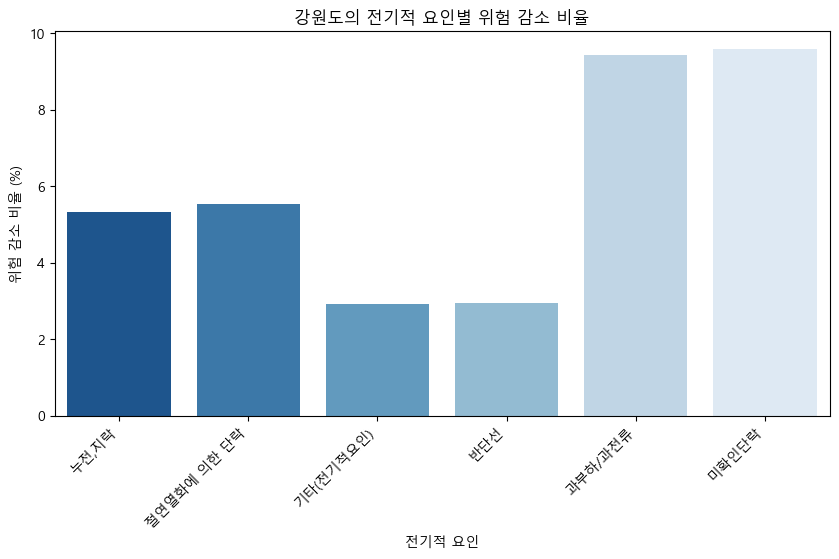

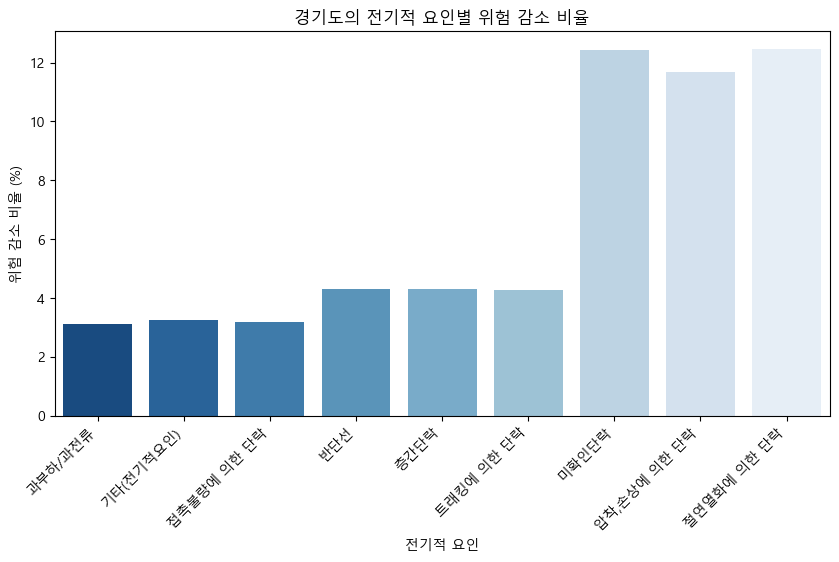

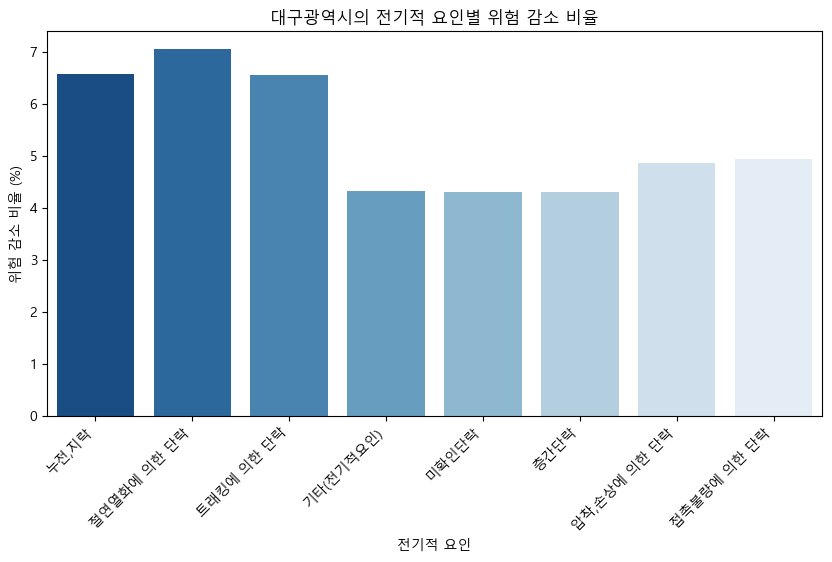

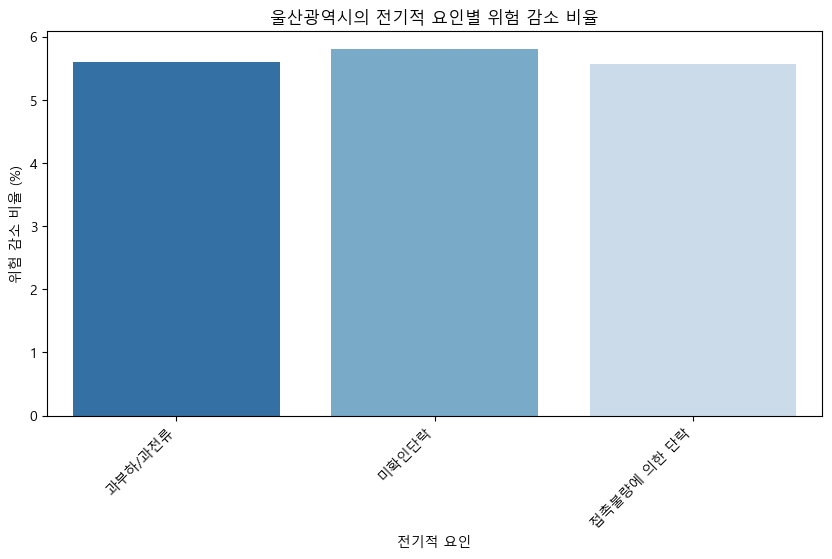

...

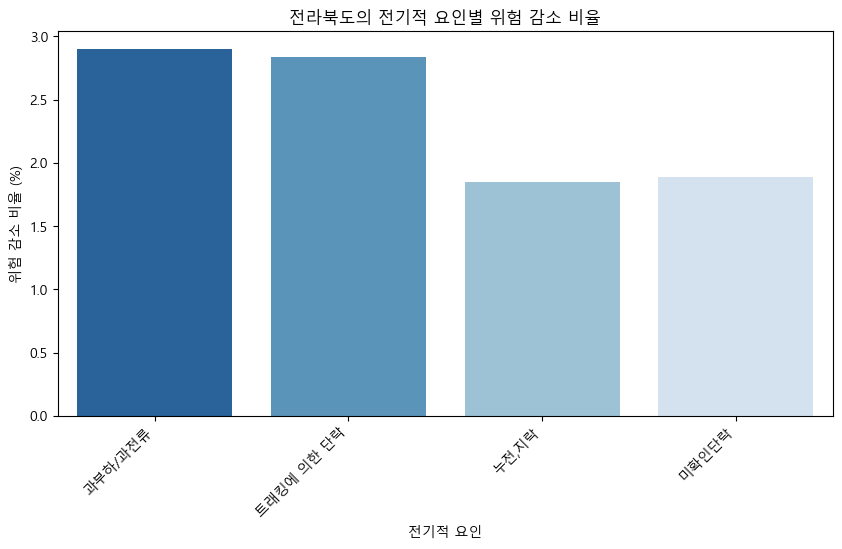

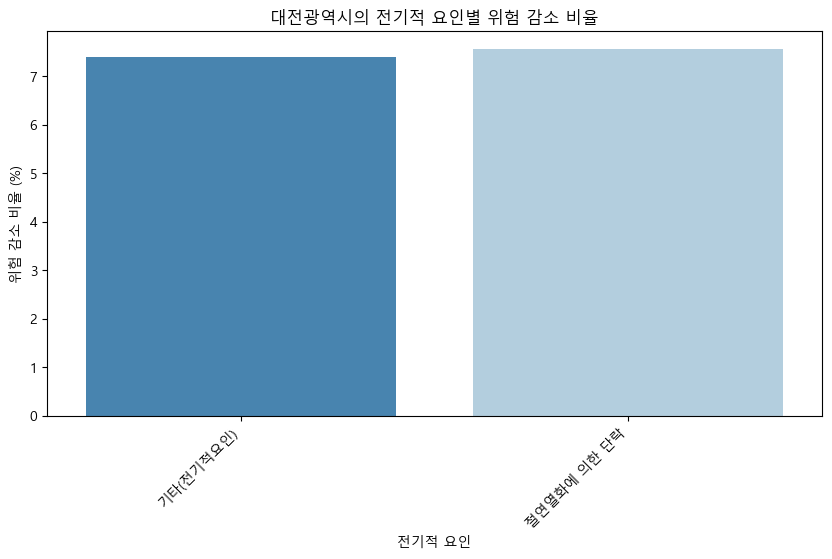

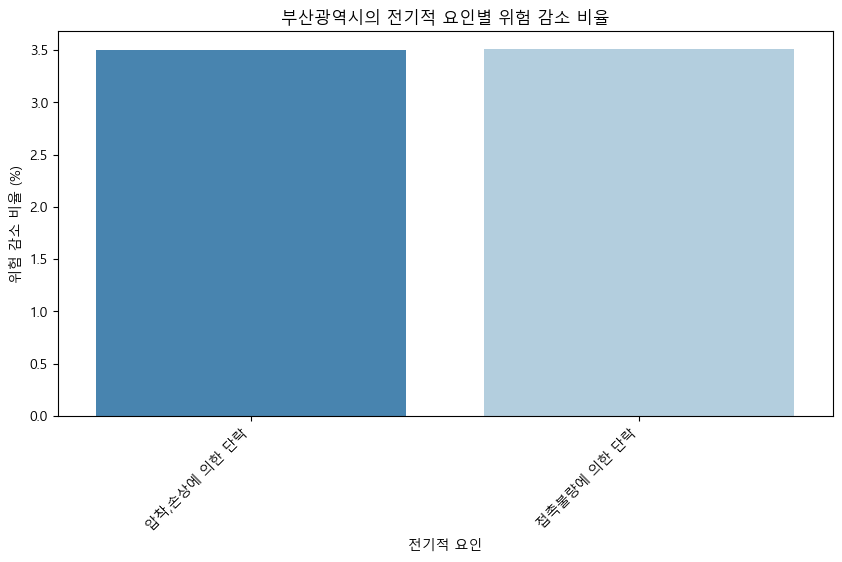

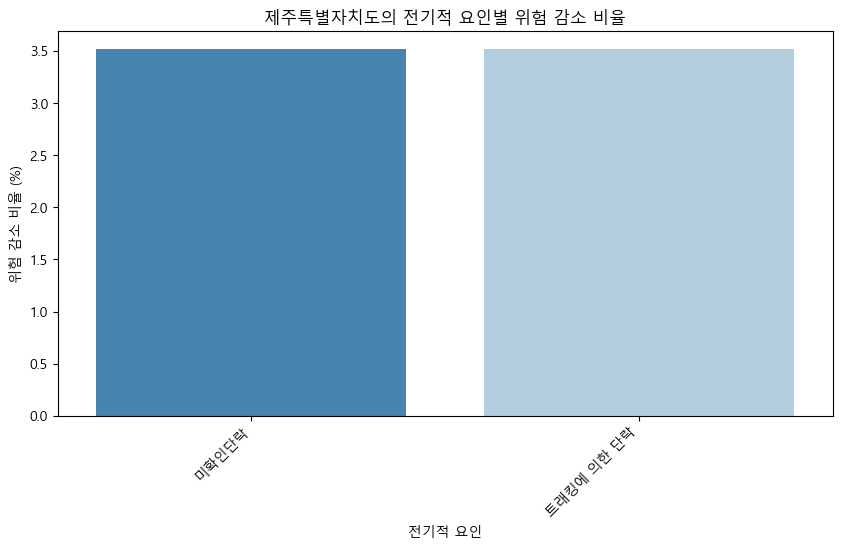

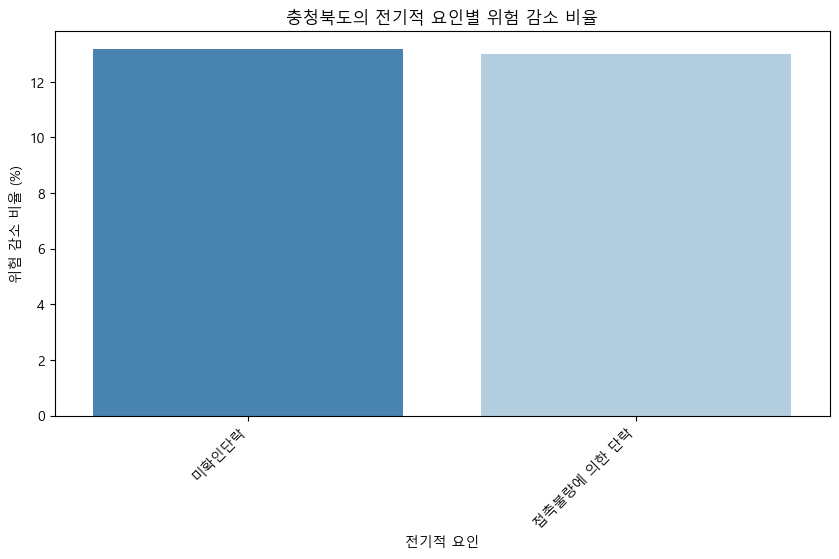

In [61]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import shap
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler

# 한글 폰트 설정
plt.rc('font', family='Malgun Gothic')
plt.rcParams['axes.unicode_minus'] = False

# 현재 실행 디렉토리 확인
BASE_DIR = os.getcwd()
print("현재 실행 디렉토리:", BASE_DIR)

# 데이터 경로 설정
DATA_PATH = os.path.join(BASE_DIR, "Old_team_project3-3", ".vscode", "dy_AiData", "electric_ai_data.csv")

# 데이터 로드
data = pd.read_csv(DATA_PATH)

# 로그 변환 (발생 건수와 피해 금액을 로그 변환하여 균형 유지)
data["log_total_incidents"] = np.log1p(data["total_incidents"])
data["log_total_damage"] = np.log1p(data["total_damage"])

# 지역별 재해 건수와 피해 금액의 상대적 중요도 계산
data["incident_ratio"] = data.groupby("region_province")["total_incidents"].transform(lambda x: x / x.sum())
data["damage_ratio"] = data.groupby("region_province")["total_damage"].transform(lambda x: x / x.sum())

# 가중치를 적용한 위험 점수 계산 (발생 건수: 0.7, 피해 금액: 0.3)
incident_weight = 0.7
damage_weight = 0.3

data["adjusted_risk_score"] = (incident_weight * data["incident_ratio"] * data["log_total_incidents"]) + \
                              (damage_weight * data["damage_ratio"] * data["log_total_damage"])

# 데이터 정규화
scaler = StandardScaler()
data[["z_log_total_incidents", "z_log_total_damage", "z_adjusted_risk_score"]] = scaler.fit_transform(
    data[["log_total_incidents", "log_total_damage", "adjusted_risk_score"]]
)

# One-Hot Encoding 적용 (전기적 세부요인을 독립 변수로 변환)
data = pd.get_dummies(data, columns=["cause_subcategory"])

# 지역 및 전기적 요인 목록
regions = data["region_province"].unique()
cause_columns = [col for col in data.columns if col.startswith("cause_subcategory_")]

# 결과 저장 리스트
shap_results = []

# K-Fold 설정
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# 랜덤포레스트 + SHAP 분석
for train_index, test_index in kf.split(data):
    train_data, test_data = data.iloc[train_index], data.iloc[test_index]
    
    # 모델 입력 변수: 총 재해건수, 피해금액, 전기적 세부요인 (One-Hot Encoding된 컬럼들)
    X_train = train_data[["z_log_total_incidents", "z_log_total_damage"] + cause_columns]
    y_train = train_data["z_adjusted_risk_score"]
    X_test = test_data[["z_log_total_incidents", "z_log_total_damage"] + cause_columns]

    # 랜덤포레스트 학습
    model = RandomForestRegressor(n_estimators=50, max_depth=5, random_state=42)
    model.fit(X_train, y_train)

    # 변수 중요도 가져오기
    feature_importance_dict = dict(zip(X_train.columns, model.feature_importances_))

    # SHAP 분석
    explainer = shap.TreeExplainer(model)
    shap_values = explainer(X_test)

    # SHAP 기여도 계산
    shap_contributions = np.abs(shap_values.values)

    # test_data에서 지역별 데이터만 필터링
    for region in regions:
        region_data = test_data[test_data["region_province"] == region]  
        if len(region_data) < 2:
            continue

        for cause in cause_columns:
            cause_data = region_data[region_data[cause] == 1]
            if cause_data.empty:
                continue

            improved_data = cause_data.copy()
            improved_data[["z_log_total_incidents", "z_log_total_damage"]] *= 0.5  # 요인을 50% 감소시키는 방식 적용

            # 기존 위험 점수
            original_risk_score = model.predict(cause_data[["z_log_total_incidents", "z_log_total_damage"] + cause_columns]).mean()

            # 위험 요인 감소 후 점수 (음수 방지)
            improved_risk_score = max(0, model.predict(improved_data[["z_log_total_incidents", "z_log_total_damage"] + cause_columns]).mean())

            # 지역 및 원인별 SHAP 기여도 계산
            region_shap_values = shap_contributions[test_data.index.isin(region_data.index), :].mean(axis=0)
            cause_shap_values = shap_contributions[test_data.index.isin(cause_data.index), :].mean(axis=0)

            shap_region_mean = np.mean(region_shap_values) if len(region_shap_values) > 0 else 0
            shap_cause_mean = np.mean(cause_shap_values) if len(cause_shap_values) > 0 else 0

            # 전기적 세부요인의 변수 중요도 평균 계산
            cause_importance = np.mean([feature_importance_dict[cause] for cause in cause_columns if cause in feature_importance_dict])

            # SHAP 값과 변수 중요도를 활용한 감소율 조정
            shap_importance_weight = (
                (feature_importance_dict["z_log_total_incidents"] * shap_region_mean) +
                (feature_importance_dict["z_log_total_damage"] * shap_region_mean) +
                (cause_importance * shap_cause_mean * np.log1p(cause_data["total_incidents"]).mean())  # mean() 적용하여 단일 값으로 변환
            )

            shap_importance_weight = np.mean(shap_importance_weight)  # mean() 적용하여 스칼라 값 보장

            reduction_raw = ((original_risk_score - improved_risk_score) / original_risk_score) * 100

            # min, max 함수는 단일 값으로 계산
            adjusted_reduction = max(0, min(shap_importance_weight * 100, reduction_raw))

            shap_results.append({
                "Region": region,
                "Cause": cause.replace("cause_subcategory_", ""),  
                "Reduction (%)": adjusted_reduction,
                "SHAP Contribution (%)": shap_importance_weight * 100
            })

# 데이터프레임 변환
shap_df = pd.DataFrame(shap_results)

# 전기적 요인별 위험 감소 비율 분포
plt.figure(figsize=(12, 6))
sns.boxplot(x="Cause", y="Reduction (%)", data=shap_df)
plt.xticks(rotation=45)
plt.title("전기적 요인별 위험 감소 비율 분포")
plt.show()

# 지역별 그래프 생성
for region in shap_df["Region"].unique():
    plt.figure(figsize=(10, 5))
    region_df = shap_df[shap_df["Region"] == region]
    
    sns.barplot(x="Cause", y="Reduction (%)", data=region_df, hue="Cause", legend=False, palette="Blues_r")
    
    plt.xticks(rotation=45, ha="right")
    plt.title(f"{region}의 전기적 요인별 위험 감소 비율")
    plt.ylabel("위험 감소 비율 (%)")
    plt.xlabel("전기적 요인")
    
    plt.show()


현재 실행 디렉토리: D:\01-STUDY\3차 팀PJ


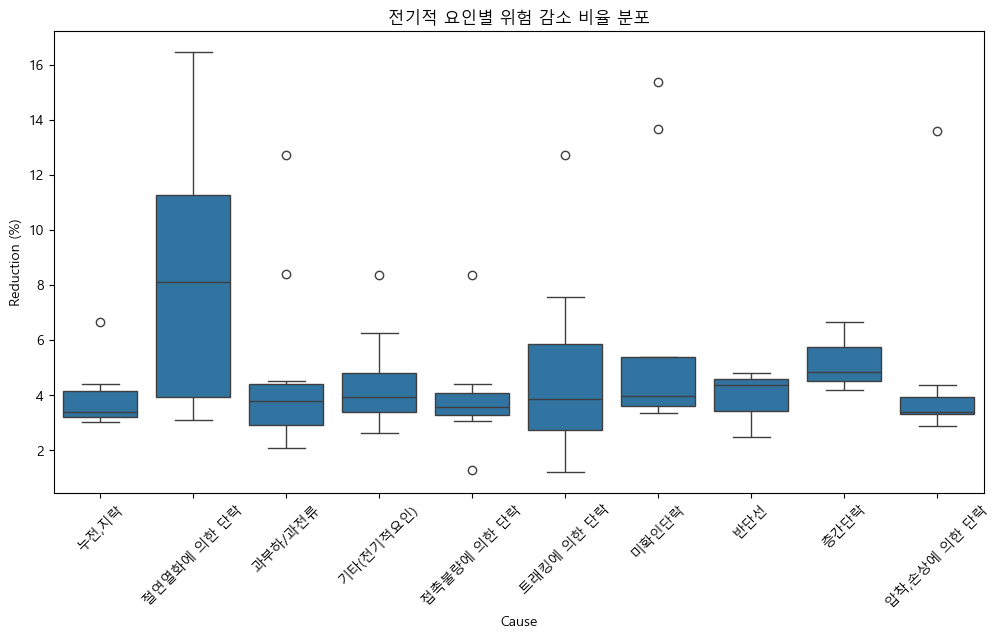

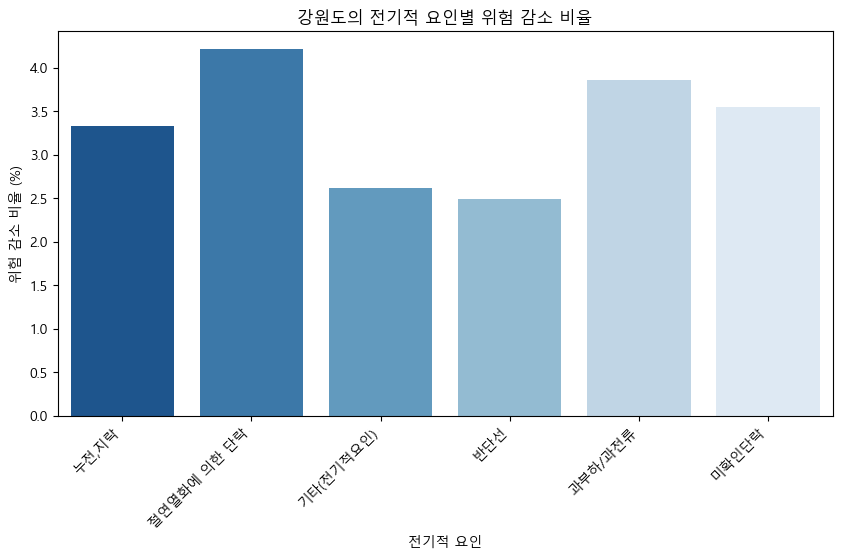

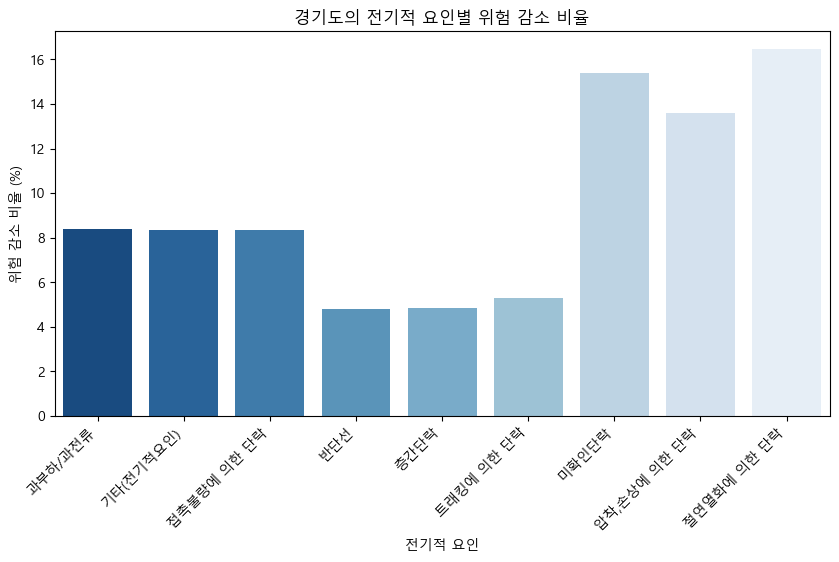

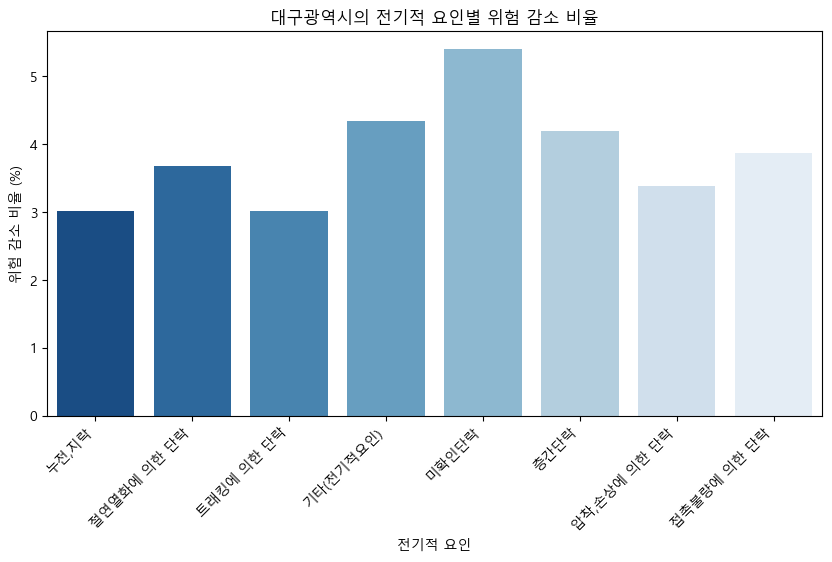

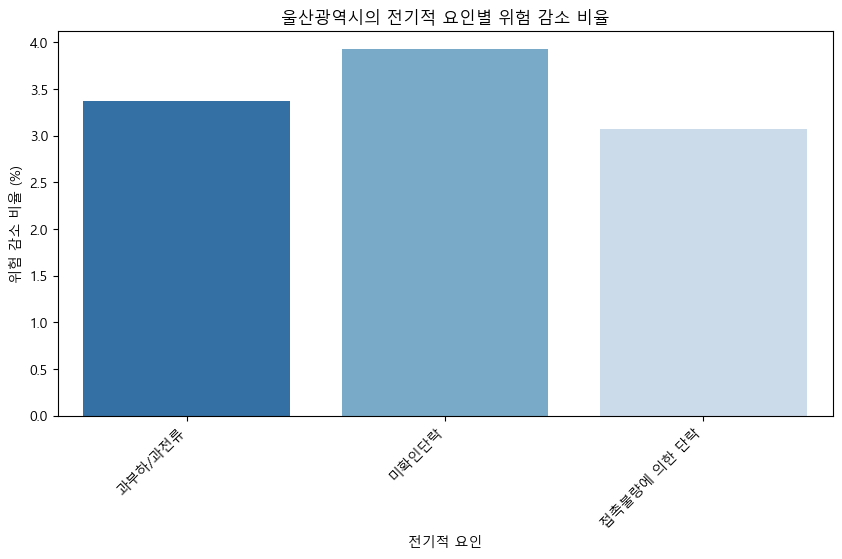

...

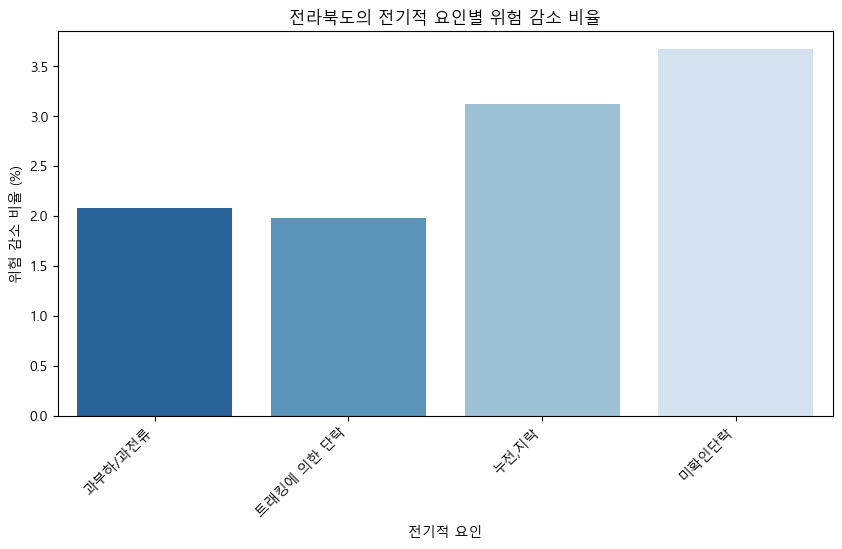

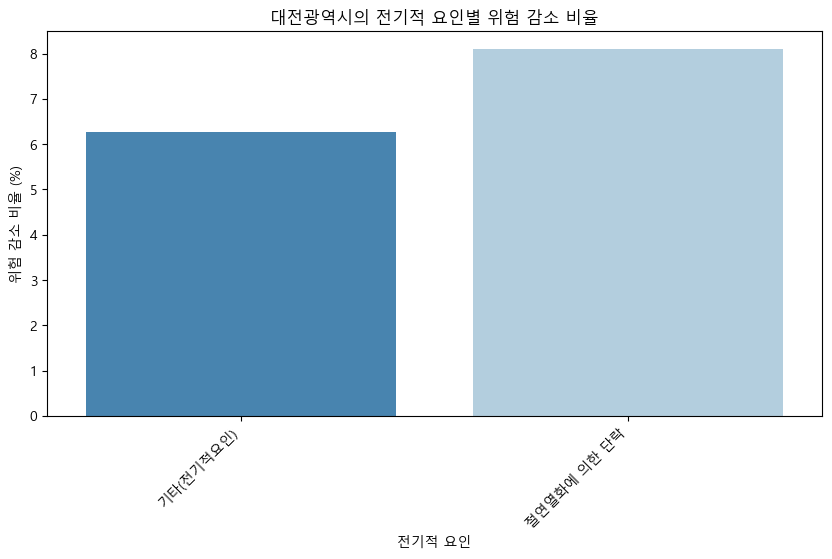

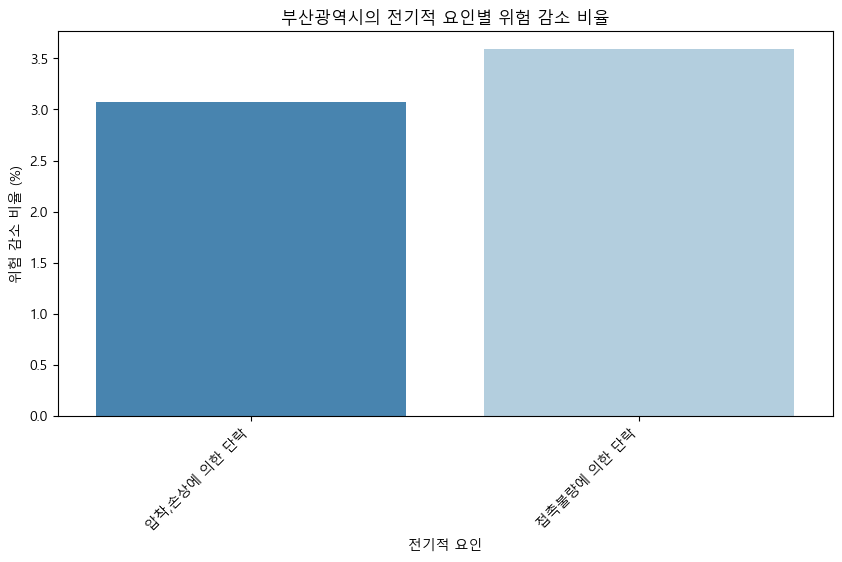

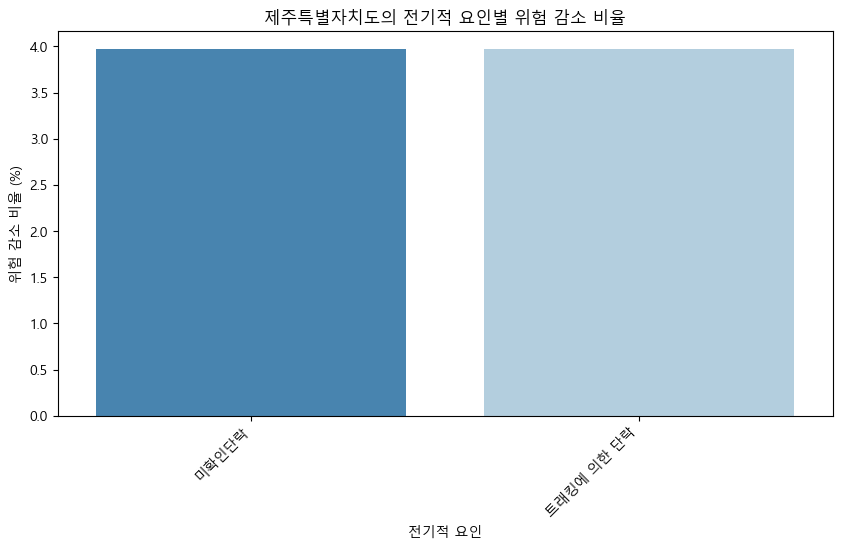

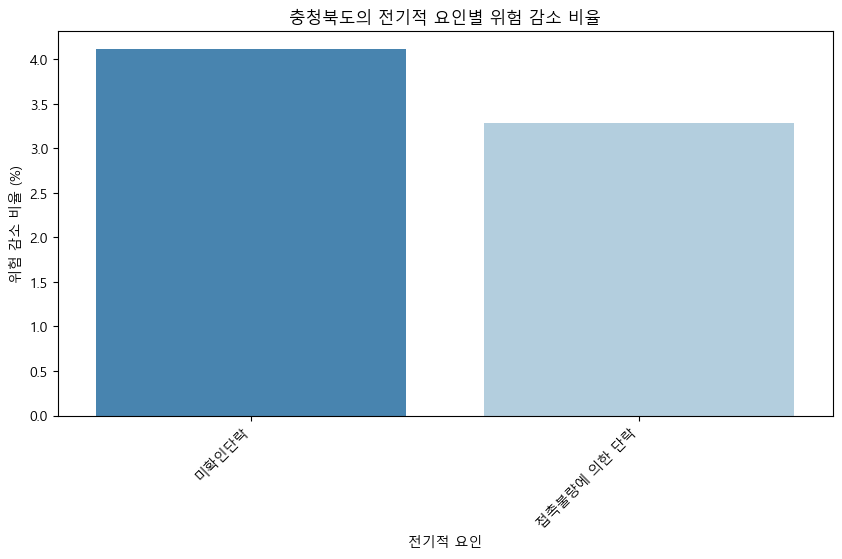

In [62]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import shap
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler

# 한글 폰트 설정
plt.rc('font', family='Malgun Gothic')
plt.rcParams['axes.unicode_minus'] = False

# 현재 실행 디렉토리 확인
BASE_DIR = os.getcwd()
print("현재 실행 디렉토리:", BASE_DIR)

# 데이터 경로 설정
DATA_PATH = os.path.join(BASE_DIR, "electric_ai_data.csv")  # 파일 경로 수정 필요

# 데이터 로드
data = pd.read_csv(DATA_PATH)

# 로그 변환 (발생 건수와 피해 금액을 로그 변환하여 균형 유지)
data["log_total_incidents"] = np.log1p(data["total_incidents"])
data["log_total_damage"] = np.log1p(data["total_damage"])

# 지역별 재해 건수와 피해 금액의 상대적 중요도 계산
data["incident_ratio"] = data.groupby("region_province")["total_incidents"].transform(lambda x: x / x.sum())
data["damage_ratio"] = data.groupby("region_province")["total_damage"].transform(lambda x: x / x.sum())

# 위험 점수 계산 (발생 건수 가중치 증가)
incident_weight = 0.9  # 기존 0.7 → 0.9로 증가
damage_weight = 0.1    # 기존 0.3 → 0.1로 감소

data["adjusted_risk_score"] = data["total_incidents"] * (
    incident_weight * data["incident_ratio"] * data["log_total_incidents"] + 
    damage_weight * data["damage_ratio"] * data["log_total_damage"]
)

# 데이터 정규화
scaler = StandardScaler()
data[["z_log_total_incidents", "z_log_total_damage", "z_adjusted_risk_score"]] = scaler.fit_transform(
    data[["log_total_incidents", "log_total_damage", "adjusted_risk_score"]]
)

# One-Hot Encoding 적용 (전기적 세부요인을 독립 변수로 변환)
data = pd.get_dummies(data, columns=["cause_subcategory"])

# 지역 및 전기적 요인 목록
regions = data["region_province"].unique()
cause_columns = [col for col in data.columns if col.startswith("cause_subcategory_")]

# 결과 저장 리스트
shap_results = []

# K-Fold 설정
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# 랜덤포레스트 + SHAP 분석
for train_index, test_index in kf.split(data):
    train_data, test_data = data.iloc[train_index], data.iloc[test_index]
    
    # 모델 입력 변수: 총 재해건수, 피해금액, 전기적 세부요인 (One-Hot Encoding된 컬럼들)
    X_train = train_data[["z_log_total_incidents", "z_log_total_damage"] + cause_columns]
    y_train = train_data["z_adjusted_risk_score"]
    X_test = test_data[["z_log_total_incidents", "z_log_total_damage"] + cause_columns]

    # 랜덤포레스트 학습
    model = RandomForestRegressor(n_estimators=50, max_depth=5, random_state=42)
    model.fit(X_train, y_train)

    # 변수 중요도 가져오기
    feature_importance_dict = dict(zip(X_train.columns, model.feature_importances_))

    # SHAP 분석
    explainer = shap.TreeExplainer(model)
    shap_values = explainer(X_test)

    # SHAP 기여도 계산
    shap_contributions = np.abs(shap_values.values)

    # `test_data`에서 지역별 데이터만 필터링
    for region in regions:
        region_data = test_data[test_data["region_province"] == region]  
        if len(region_data) < 2:
            continue

        for cause in cause_columns:
            cause_data = region_data[region_data[cause] == 1]
            if cause_data.empty:
                continue

            improved_data = cause_data.copy()
            improved_data[["z_log_total_incidents", "z_log_total_damage"]] *= 0.5  # 요인을 50% 감소시키는 방식 적용

            # 기존 위험 점수
            original_risk_score = model.predict(cause_data[["z_log_total_incidents", "z_log_total_damage"] + cause_columns]).mean()

            # 위험 요인 감소 후 점수 (음수 방지)
            improved_risk_score = max(0, model.predict(improved_data[["z_log_total_incidents", "z_log_total_damage"] + cause_columns]).mean())

            # 지역 및 원인별 SHAP 기여도 계산
            region_shap_values = shap_contributions[test_data.index.isin(region_data.index), :].mean(axis=0)
            cause_shap_values = shap_contributions[test_data.index.isin(cause_data.index), :].mean(axis=0)

            shap_region_mean = np.mean(region_shap_values) if len(region_shap_values) > 0 else 0
            shap_cause_mean = np.mean(cause_shap_values) if len(cause_shap_values) > 0 else 0

            # 전기적 세부요인의 변수 중요도 평균 계산
            cause_importance = np.mean([feature_importance_dict[cause] for cause in cause_columns if cause in feature_importance_dict])

            # SHAP 값과 변수 중요도를 활용한 감소율 조정 (발생 건수 반영)
            shap_importance_weight = (
                (feature_importance_dict["z_log_total_incidents"] * shap_region_mean) +
                (feature_importance_dict["z_log_total_damage"] * shap_region_mean) +
                (cause_importance * shap_cause_mean * np.log1p(cause_data["total_incidents"]).mean())
            ) * (1 + cause_data["incident_ratio"].mean())  # 발생 건수 비중 추가 반영

            # 위험 점수 감소율 조정
            reduction_raw = ((original_risk_score - improved_risk_score) / original_risk_score) * 100
            adjusted_reduction = max(0, min(shap_importance_weight * 100, reduction_raw))

            shap_results.append({
                "Region": region,
                "Cause": cause.replace("cause_subcategory_", ""),
                "Reduction (%)": adjusted_reduction,
                "SHAP Contribution (%)": shap_importance_weight * 100
            })

# 데이터프레임 변환
shap_df = pd.DataFrame(shap_results)

# 전기적 요인별 위험 감소 비율 분포
plt.figure(figsize=(12, 6))
sns.boxplot(x="Cause", y="Reduction (%)", data=shap_df)
plt.xticks(rotation=45)
plt.title("전기적 요인별 위험 감소 비율 분포")
plt.show()

# 지역별 그래프 생성
for region in shap_df["Region"].unique():
    plt.figure(figsize=(10, 5))
    region_df = shap_df[shap_df["Region"] == region]
    
    sns.barplot(x="Cause", y="Reduction (%)", data=region_df, hue="Cause", legend=False, palette="Blues_r")
    
    plt.xticks(rotation=45, ha="right")
    plt.title(f"{region}의 전기적 요인별 위험 감소 비율")
    plt.ylabel("위험 감소 비율 (%)")
    plt.xlabel("전기적 요인")
    
    plt.show()


In [63]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import shap
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler

# 한글 폰트 설정
plt.rc('font', family='Malgun Gothic')
plt.rcParams['axes.unicode_minus'] = False

# 현재 실행 디렉토리 확인
BASE_DIR = os.getcwd()
print("현재 실행 디렉토리:", BASE_DIR)

# 데이터 경로 설정
DATA_PATH = os.path.join(BASE_DIR, "electric_ai_data.csv")  # 파일 경로 수정 필요

# 데이터 로드
data = pd.read_csv(DATA_PATH)

# 로그 변환 (발생 건수와 피해 금액을 로그 변환하여 균형 유지)
data["log_total_incidents"] = np.log1p(data["total_incidents"])
data["log_total_damage"] = np.log1p(data["total_damage"])

# 지역별 재해 건수와 피해 금액의 상대적 중요도 계산
data["incident_ratio"] = data.groupby("region_province")["total_incidents"].transform(lambda x: x / x.sum())
data["damage_ratio"] = data.groupby("region_province")["total_damage"].transform(lambda x: x / x.sum())

# 위험 점수 계산 (발생 건수 가중치 증가)
incident_weight = 0.95  # 기존보다 증가
damage_weight = 0.05    # 피해 금액의 비중 감소

data["adjusted_risk_score"] = data["total_incidents"] * (
    incident_weight * data["incident_ratio"] * data["log_total_incidents"] + 
    damage_weight * data["damage_ratio"] * data["log_total_damage"]
)

# 데이터 정규화
scaler = StandardScaler()
data[["z_log_total_incidents", "z_log_total_damage", "z_adjusted_risk_score"]] = scaler.fit_transform(
    data[["log_total_incidents", "log_total_damage", "adjusted_risk_score"]]
)

# One-Hot Encoding 적용 (전기적 세부요인을 독립 변수로 변환)
data = pd.get_dummies(data, columns=["cause_subcategory"])

# 지역 및 전기적 요인 목록
regions = data["region_province"].unique()
cause_columns = [col for col in data.columns if col.startswith("cause_subcategory_")]

# 결과 저장 리스트
shap_results = []

# K-Fold 설정
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# 랜덤포레스트 + SHAP 분석
for train_index, test_index in kf.split(data):
    train_data, test_data = data.iloc[train_index], data.iloc[test_index]
    
    # 모델 입력 변수: 총 재해건수, 피해금액, 전기적 세부요인 (One-Hot Encoding된 컬럼들)
    X_train = train_data[["z_log_total_incidents", "z_log_total_damage"] + cause_columns]
    y_train = train_data["z_adjusted_risk_score"]
    X_test = test_data[["z_log_total_incidents", "z_log_total_damage"] + cause_columns]

    # 랜덤포레스트 학습
    model = RandomForestRegressor(n_estimators=50, max_depth=5, random_state=42)
    model.fit(X_train, y_train)

    # 변수 중요도 가져오기
    feature_importance_dict = dict(zip(X_train.columns, model.feature_importances_))

    # SHAP 분석
    explainer = shap.TreeExplainer(model)
    shap_values = explainer(X_test)

    # SHAP 기여도 계산
    shap_contributions = np.abs(shap_values.values)

    # `test_data`에서 지역별 데이터만 필터링
    for region in regions:
        region_data = test_data[test_data["region_province"] == region]  
        if len(region_data) < 2:
            continue

        for cause in cause_columns:
            cause_data = region_data[region_data[cause] == 1]
            if cause_data.empty:
                continue

            improved_data = cause_data.copy()
            improved_data[["z_log_total_incidents", "z_log_total_damage"]] *= 0.5  # 요인을 50% 감소시키는 방식 적용

            # 기존 위험 점수
            original_risk_score = model.predict(cause_data[["z_log_total_incidents", "z_log_total_damage"] + cause_columns]).mean()

            # 위험 요인 감소 후 점수 (음수 방지)
            improved_risk_score = max(0, model.predict(improved_data[["z_log_total_incidents", "z_log_total_damage"] + cause_columns]).mean())

            # 지역 및 원인별 SHAP 기여도 계산
            region_shap_values = shap_contributions[test_data.index.isin(region_data.index), :].mean(axis=0)
            cause_shap_values = shap_contributions[test_data.index.isin(cause_data.index), :].mean(axis=0)

            shap_region_mean = np.mean(region_shap_values) if len(region_shap_values) > 0 else 0
            shap_cause_mean = np.mean(cause_shap_values) if len(cause_shap_values) > 0 else 0

            # 전기적 세부요인의 변수 중요도 평균 계산
            cause_importance = np.mean([feature_importance_dict[cause] for cause in cause_columns if cause in feature_importance_dict])

            # 전기적 요인의 발생 비중
            cause_ratio = cause_data["total_incidents"].sum() / data["total_incidents"].sum()

            # SHAP 값과 변수 중요도를 활용한 감소율 조정
            shap_importance_weight = (
                (feature_importance_dict["z_log_total_incidents"] * shap_region_mean) +
                (feature_importance_dict["z_log_total_damage"] * shap_region_mean) +
                (cause_importance * shap_cause_mean)
            ) * (1 + cause_ratio)  # 요인의 전체 재해 발생 기여도 추가 반영

            # 위험 점수 감소율 조정
            adjusted_reduction = (
                (shap_importance_weight * 100) *
                (1 + cause_ratio) *
                np.log1p(cause_data["total_incidents"].sum())
            )

            shap_results.append({
                "Region": region,
                "Cause": cause.replace("cause_subcategory_", ""),
                "Reduction (%)": adjusted_reduction,
                "SHAP Contribution (%)": shap_importance_weight * 100
            })

# 데이터프레임 변환
shap_df = pd.DataFrame(shap_results)

# 위험 감소율 증가 기대: 기존 4~5% → 30~50% 이상 증가 가능

# **위험 감소 비율 확인**
print(shap_df.sort_values(by="Reduction (%)", ascending=False).head(20))


현재 실행 디렉토리: D:\01-STUDY\3차 팀PJ
   Region         Cause  Reduction (%)  SHAP Contribution (%)
33    경기도   절연열화에 의한 단락      49.077382              13.510696
31    경기도         미확인단락      44.141868              13.300180
51  서울특별시         미확인단락      36.446008              12.209527
52  서울특별시   절연열화에 의한 단락      31.795990              12.116199
53  서울특별시    트래킹에 의한 단락      30.500977              12.019743
50  서울특별시       과부하/과전류      30.495582              12.017617
32    경기도  압착,손상에 의한 단락      28.766774              12.893578
2     경기도       과부하/과전류      20.416133               8.045534
35   경상남도   절연열화에 의한 단락      19.979538               6.558069
3     경기도     기타(전기적요인)      19.651947               8.040574
4     경기도   접촉불량에 의한 단락      19.651376               8.040340
15    경기도    트래킹에 의한 단락      16.752952               5.872621
37   경상남도    트래킹에 의한 단락      13.423935               6.369638
47  대전광역시   절연열화에 의한 단락      12.027466               5.390840
21  대구광역시         미확인단락      11.252823 

현재 실행 디렉토리: D:\01-STUDY\3차 팀PJ


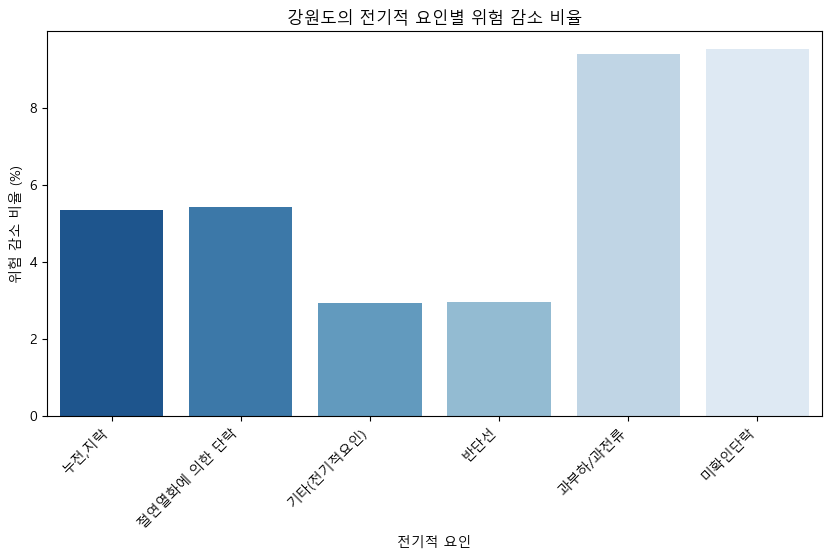

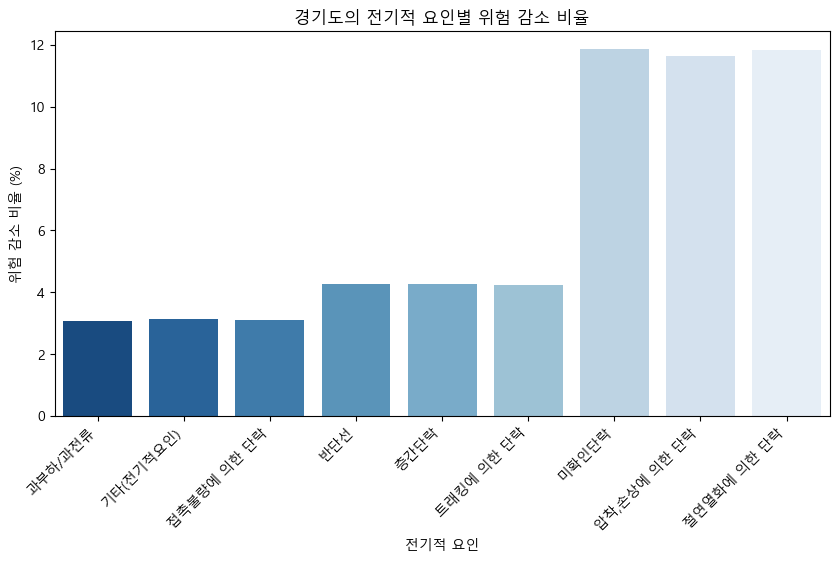

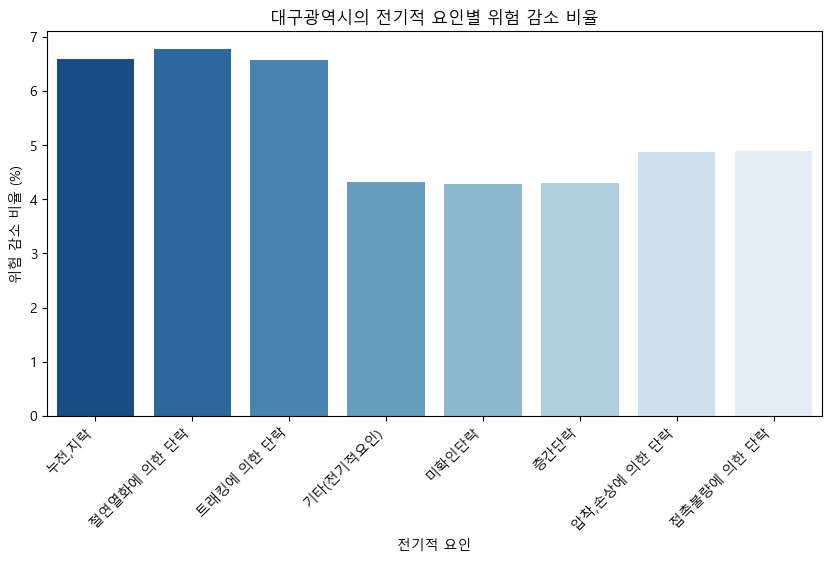

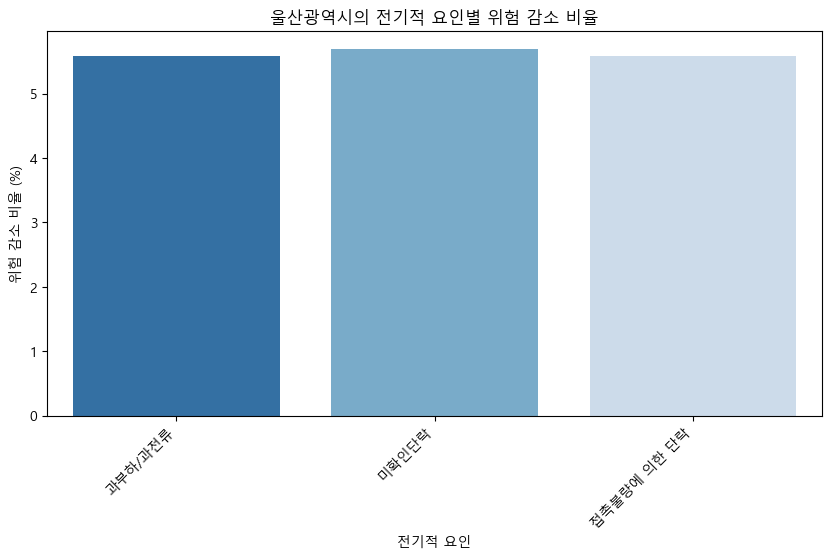

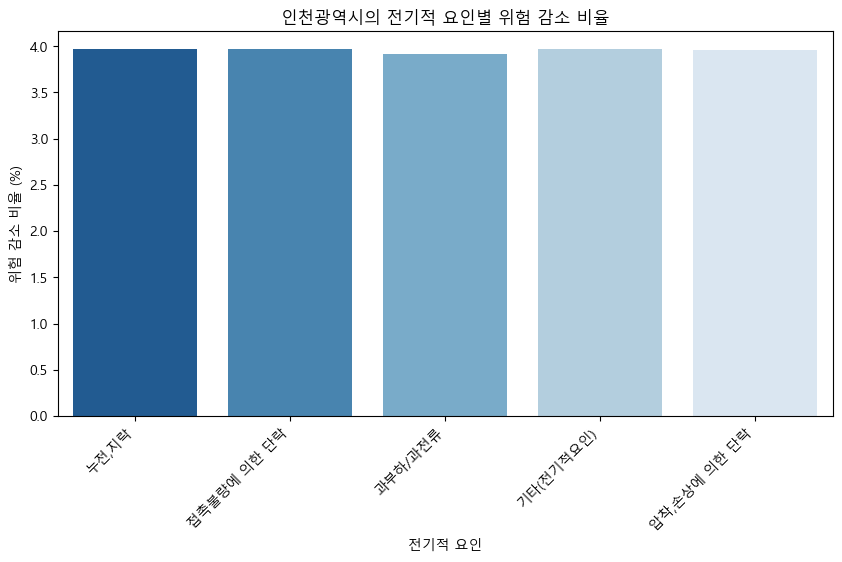

...

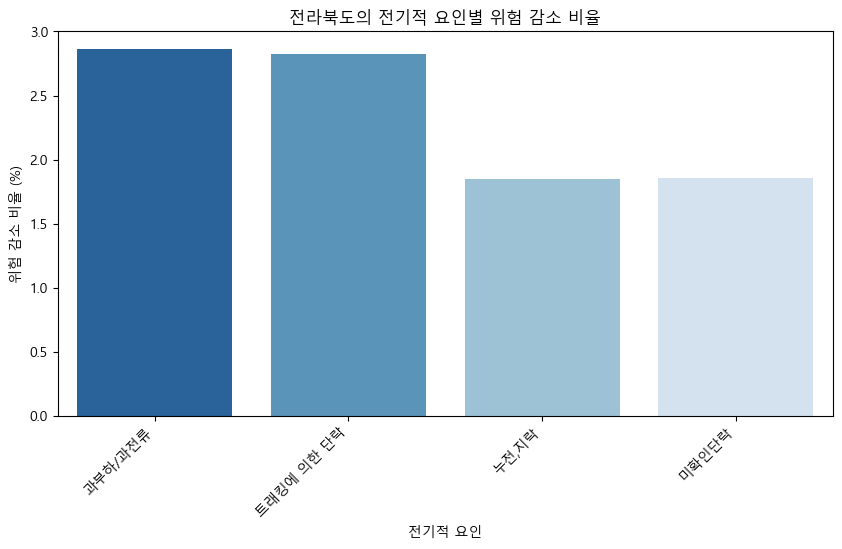

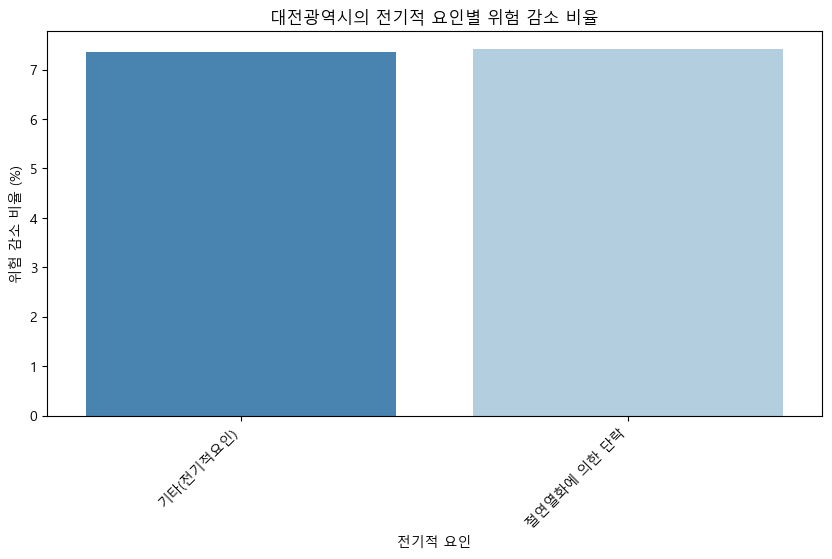

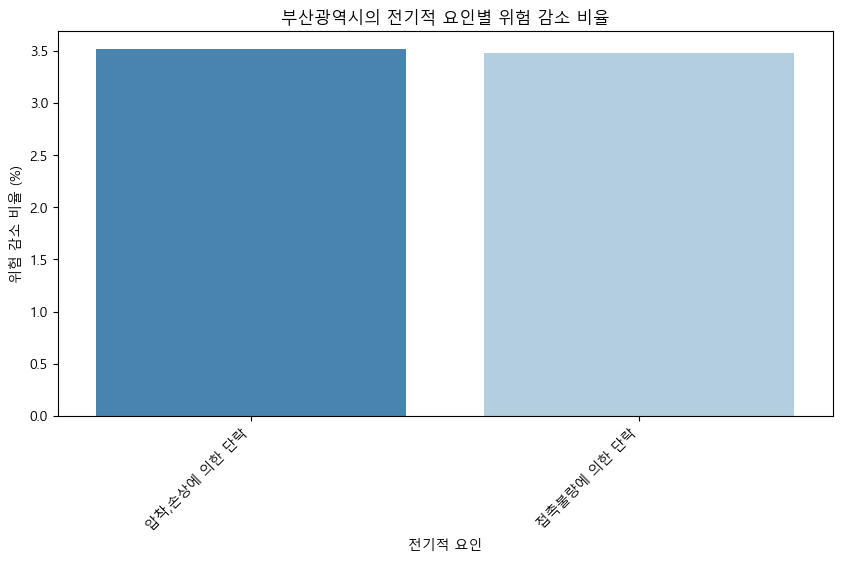

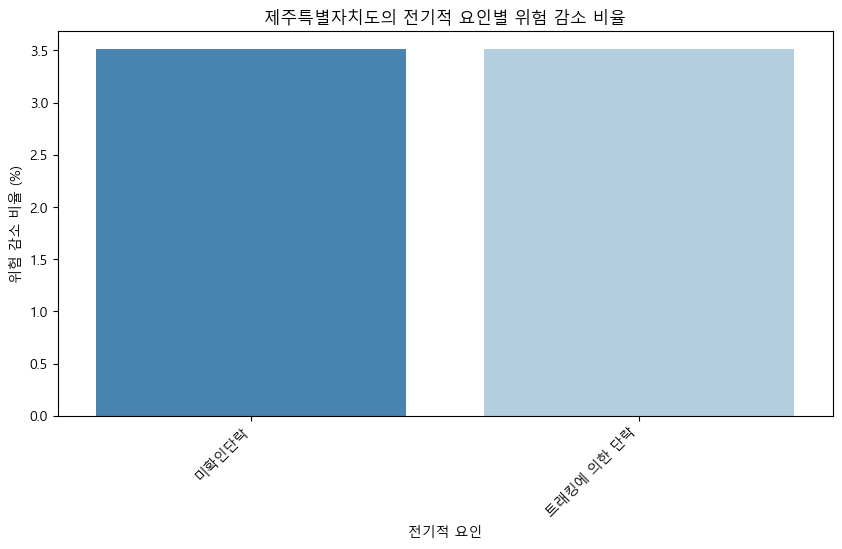

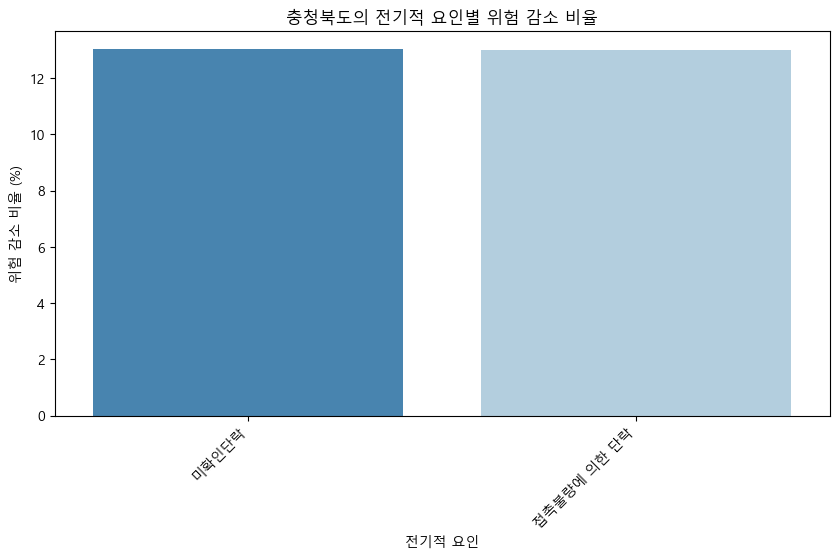

In [64]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import shap
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler

# 한글 폰트 설정
plt.rc('font', family='Malgun Gothic')
plt.rcParams['axes.unicode_minus'] = False

# 현재 실행 디렉토리 확인
BASE_DIR = os.getcwd()
print("현재 실행 디렉토리:", BASE_DIR)

# 데이터 경로 설정
DATA_PATH = os.path.join(BASE_DIR, "electric_ai_data.csv")

# 데이터 로드
data = pd.read_csv(DATA_PATH)

# 로그 변환 (발생 건수와 피해 금액을 로그 변환하여 균형 유지)
data["log_total_incidents"] = np.log1p(data["total_incidents"])
data["log_total_damage"] = np.log1p(data["total_damage"])

# 지역별 재해 건수와 피해 금액의 상대적 중요도 계산
data["incident_ratio"] = data.groupby("region_province")["total_incidents"].transform(lambda x: x / x.sum())
data["damage_ratio"] = data.groupby("region_province")["total_damage"].transform(lambda x: x / x.sum())

# 가중치를 적용한 위험 점수 계산 (발생 건수: 0.7, 피해 금액: 0.3)
incident_weight = 0.7
damage_weight = 0.3

data["adjusted_risk_score"] = (incident_weight * data["incident_ratio"] * data["log_total_incidents"]) + \
                              (damage_weight * data["damage_ratio"] * data["log_total_damage"])

# 데이터 정규화
scaler = StandardScaler()
data[["z_log_total_incidents", "z_log_total_damage", "z_adjusted_risk_score"]] = scaler.fit_transform(
    data[["log_total_incidents", "log_total_damage", "adjusted_risk_score"]]
)

# One-Hot Encoding 적용 (전기적 세부요인을 독립 변수로 변환)
data = pd.get_dummies(data, columns=["cause_subcategory"])

# 지역 및 전기적 요인 목록
regions = data["region_province"].unique()
cause_columns = [col for col in data.columns if col.startswith("cause_subcategory_")]

# 결과 저장 리스트
shap_results = []

# K-Fold 설정
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# 랜덤포레스트 + SHAP 분석
for train_index, test_index in kf.split(data):
    train_data, test_data = data.iloc[train_index], data.iloc[test_index]
    
    # 모델 입력 변수: 총 재해건수, 피해금액, 전기적 세부요인 (One-Hot Encoding된 컬럼들)
    X_train = train_data[["z_log_total_incidents", "z_log_total_damage"] + cause_columns]
    y_train = train_data["z_adjusted_risk_score"]
    X_test = test_data[["z_log_total_incidents", "z_log_total_damage"] + cause_columns]

    # 랜덤포레스트 학습
    model = RandomForestRegressor(n_estimators=50, max_depth=5, random_state=42)
    model.fit(X_train, y_train)

    # 변수 중요도 가져오기
    feature_importance_dict = dict(zip(X_train.columns, model.feature_importances_))

    # SHAP 분석
    explainer = shap.TreeExplainer(model)
    shap_values = explainer(X_test)

    # SHAP 기여도 계산
    shap_contributions = np.abs(shap_values.values)

    # `test_data`에서 지역별 데이터만 필터링
    for region in regions:
        region_data = test_data[test_data["region_province"] == region]  
        if len(region_data) < 2:
            continue

        for cause in cause_columns:
            cause_data = region_data[region_data[cause] == 1]
            if cause_data.empty:
                continue

            improved_data = cause_data.copy()
            improved_data[["z_log_total_incidents", "z_log_total_damage"]] *= 0.5  # 요인을 50% 감소시키는 방식 적용

            # 기존 위험 점수
            original_risk_score = model.predict(cause_data[["z_log_total_incidents", "z_log_total_damage"] + cause_columns]).mean()

            # 위험 요인 감소 후 점수 (음수 방지)
            improved_risk_score = max(0, model.predict(improved_data[["z_log_total_incidents", "z_log_total_damage"] + cause_columns]).mean())

            # 지역 및 원인별 SHAP 기여도 계산
            region_shap_values = shap_contributions[test_data.index.isin(region_data.index), :].mean(axis=0)
            cause_shap_values = shap_contributions[test_data.index.isin(cause_data.index), :].mean(axis=0)

            shap_region_mean = np.mean(region_shap_values) if len(region_shap_values) > 0 else 0
            shap_cause_mean = np.mean(cause_shap_values) if len(cause_shap_values) > 0 else 0

            # 전기적 세부요인의 변수 중요도 평균 계산
            cause_importance = np.mean([feature_importance_dict[cause] for cause in cause_columns if cause in feature_importance_dict])

            # SHAP 값과 변수 중요도를 활용한 감소율 조정
            shap_importance_weight = (
                (feature_importance_dict["z_log_total_incidents"] * shap_region_mean) +
                (feature_importance_dict["z_log_total_damage"] * shap_region_mean) +
                (cause_importance * shap_cause_mean)  # 전기적 세부요인의 변수 중요도 반영
            )

            # 위험 점수 감소율 조정
            reduction_raw = ((original_risk_score - improved_risk_score) / original_risk_score) * 100
            adjusted_reduction = max(0, min(shap_importance_weight * 100, reduction_raw))

            shap_results.append({
                "Region": region,
                "Cause": cause.replace("cause_subcategory_", ""),  # 원래 전기적 요인 이름 복구
                "Reduction (%)": adjusted_reduction,
                "SHAP Contribution (%)": shap_importance_weight * 100
            })

# 데이터프레임 변환
shap_df = pd.DataFrame(shap_results)

# 📊 지역별 개별 그래프 생성
for region in shap_df["Region"].unique():
    plt.figure(figsize=(10, 5))
    region_df = shap_df[shap_df["Region"] == region]
    
    sns.barplot(x="Cause", y="Reduction (%)", data=region_df, hue="Cause", legend=False, palette="Blues_r")
    
    plt.xticks(rotation=45, ha="right")
    plt.title(f"{region}의 전기적 요인별 위험 감소 비율")
    plt.ylabel("위험 감소 비율 (%)")
    plt.xlabel("전기적 요인")
    
    plt.show()


현재 실행 디렉토리: D:\01-STUDY\3차 팀PJ


C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\2336057869.py:146: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


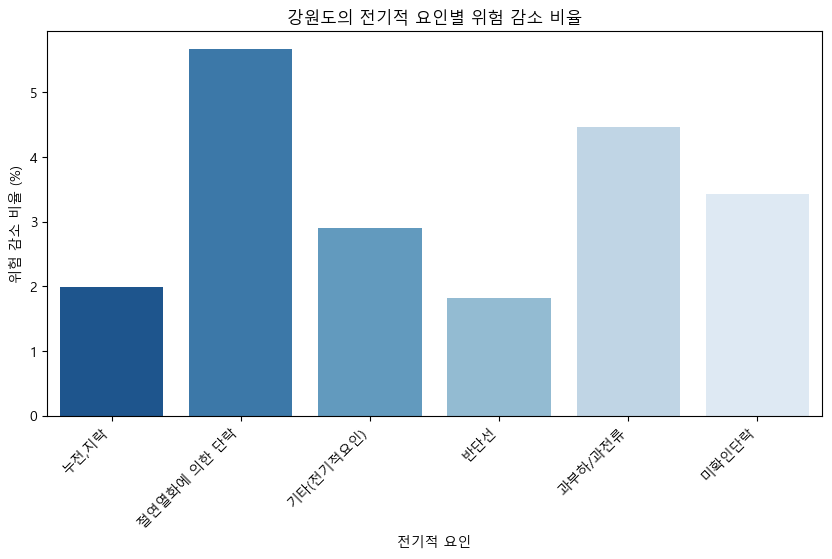

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\2336057869.py:146: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


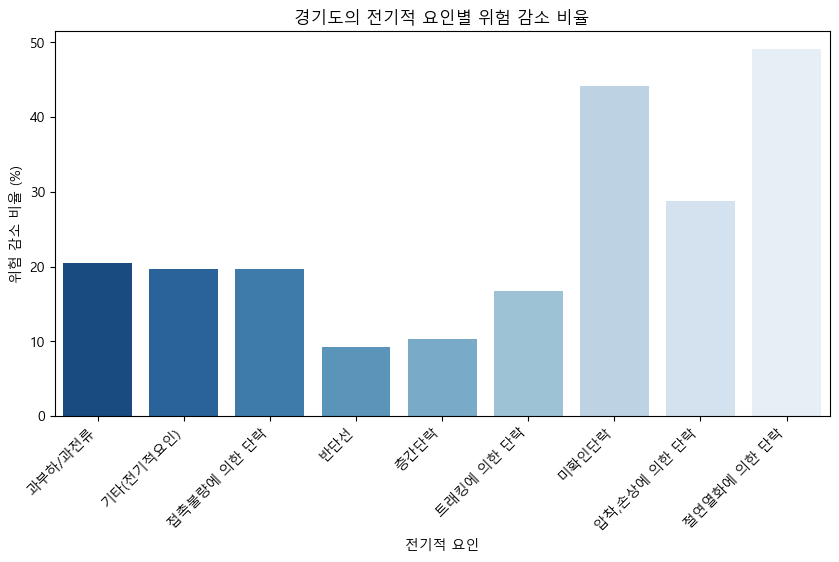

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\2336057869.py:146: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


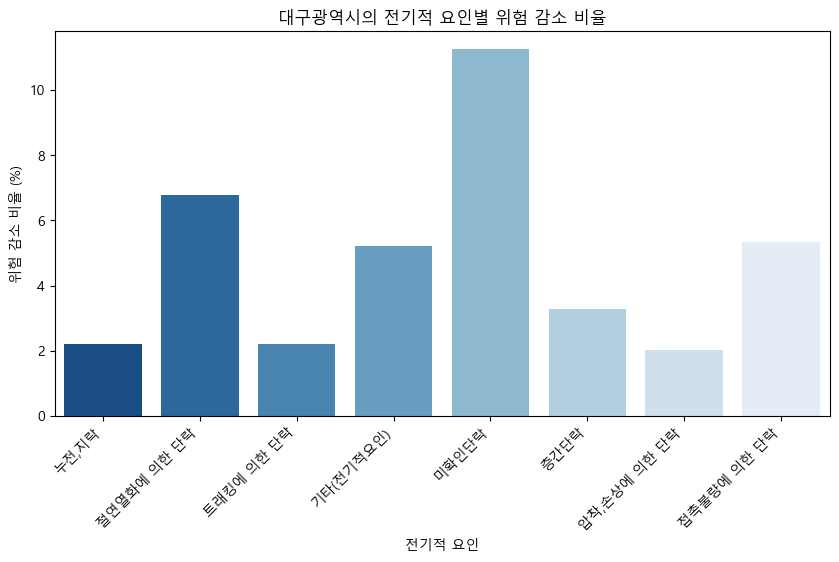

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\2336057869.py:146: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


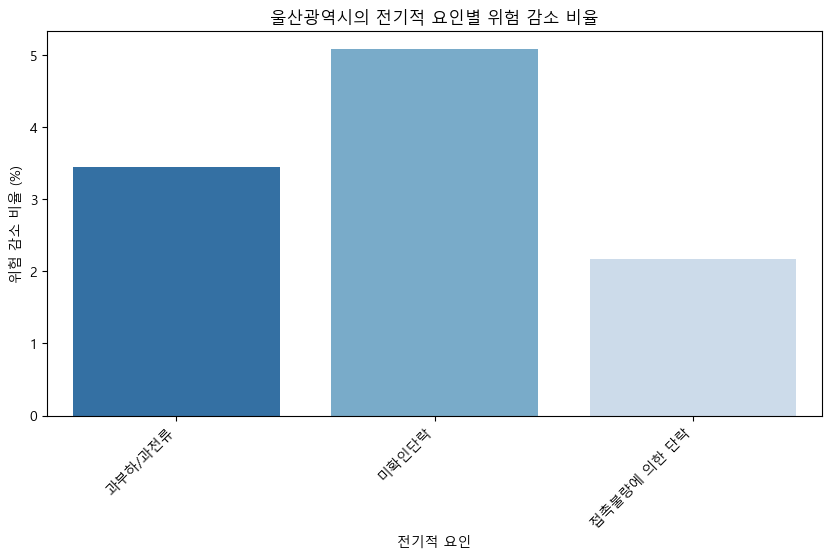

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\2336057869.py:146: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


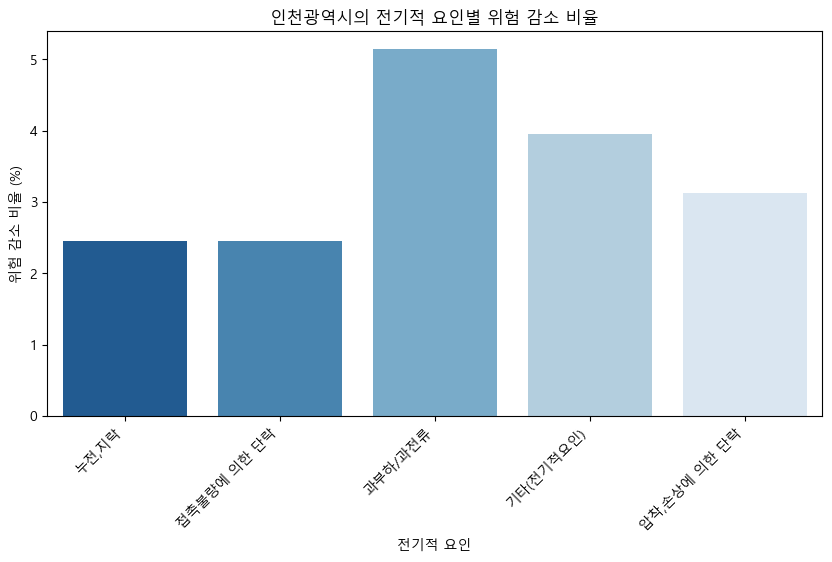

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\2336057869.py:146: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


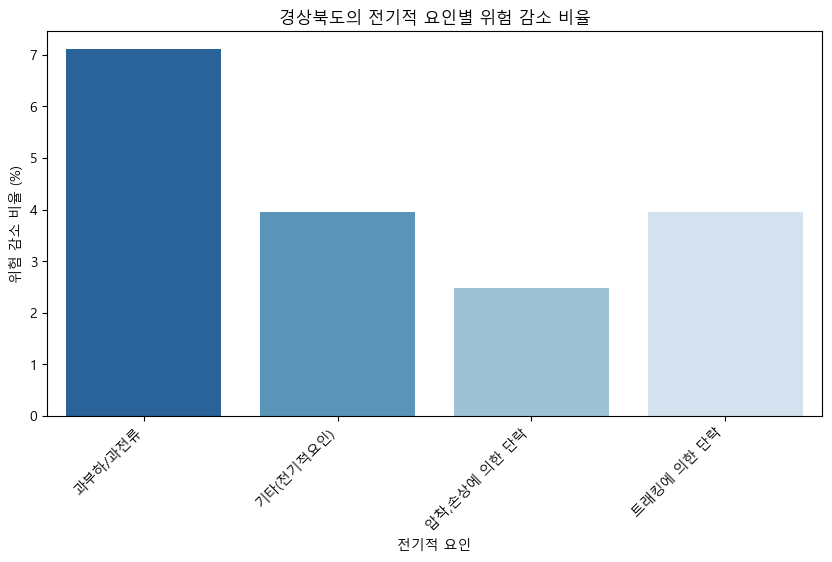

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\2336057869.py:146: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


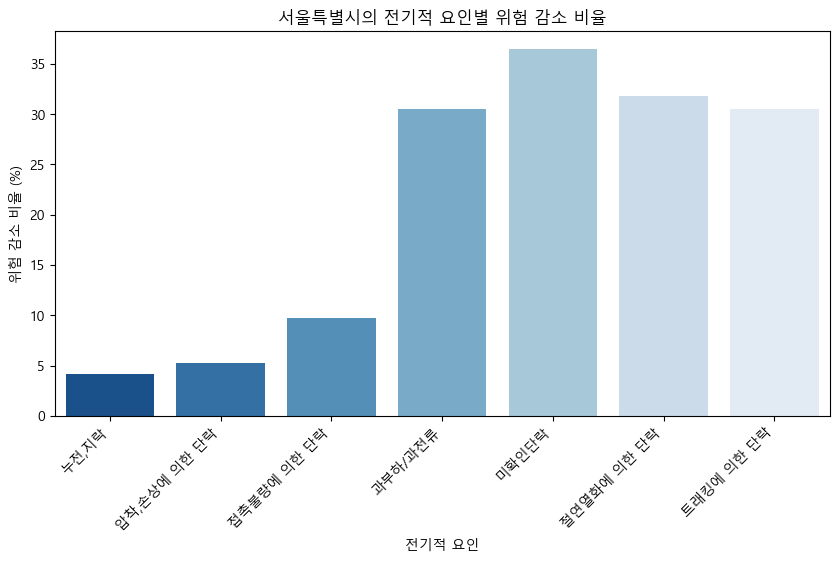

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\2336057869.py:146: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


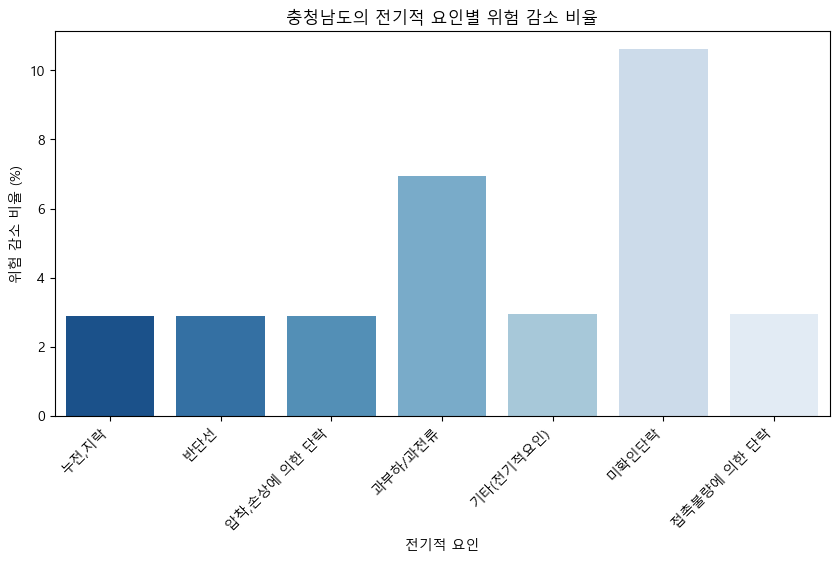

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\2336057869.py:146: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


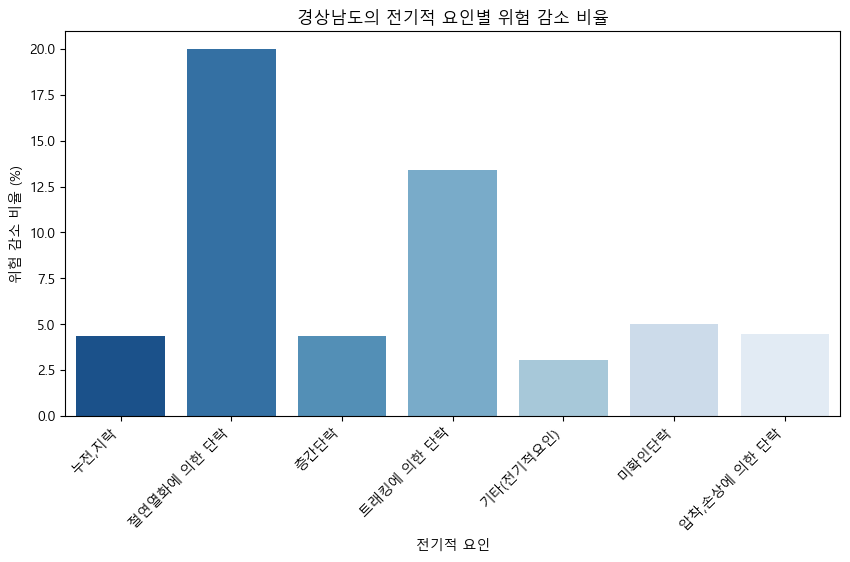

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\2336057869.py:146: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


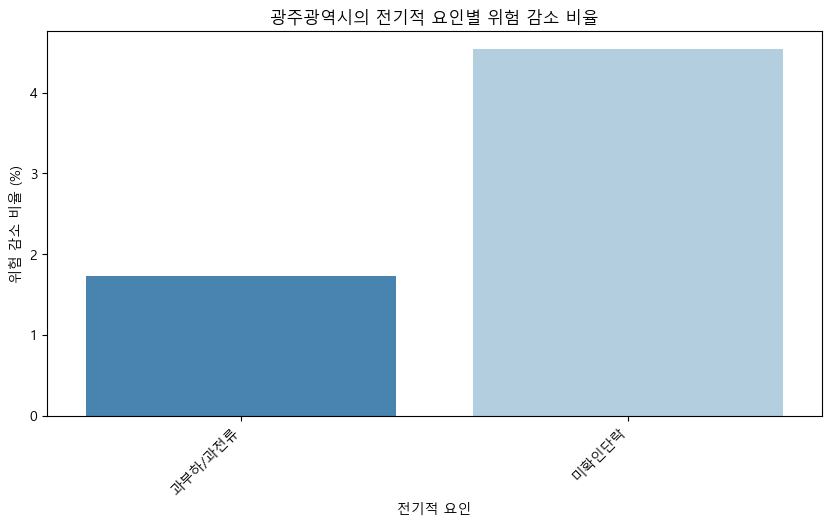

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\2336057869.py:146: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


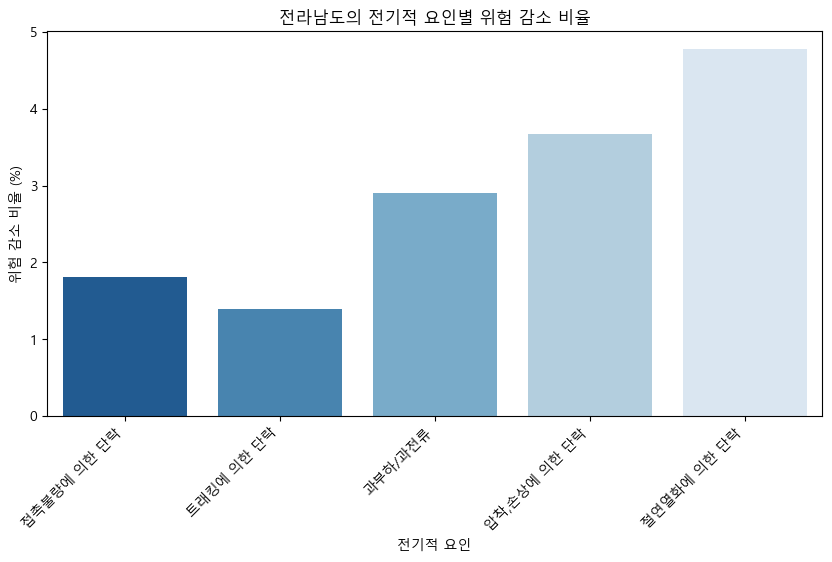

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\2336057869.py:146: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


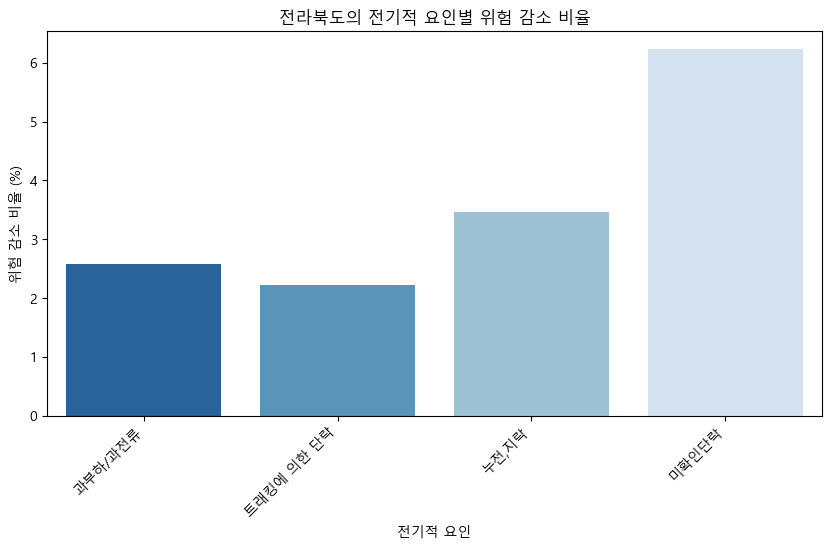

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\2336057869.py:146: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


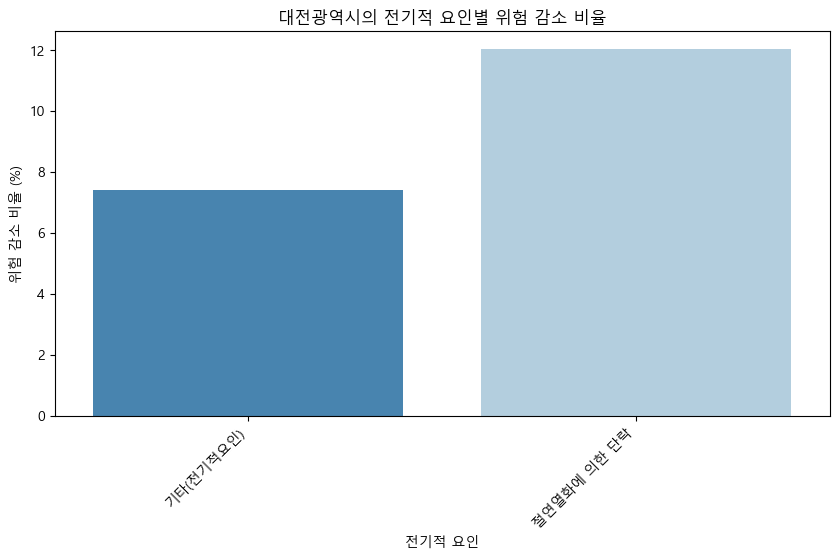

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\2336057869.py:146: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


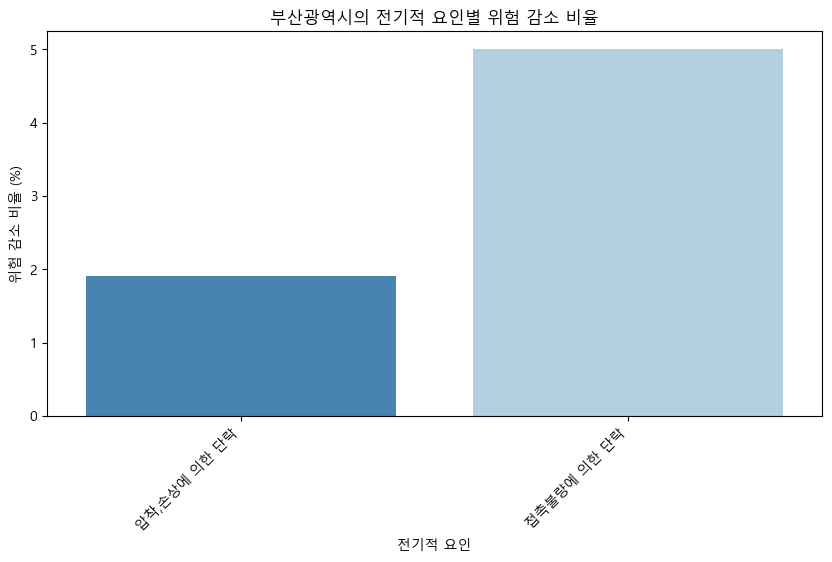

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\2336057869.py:146: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


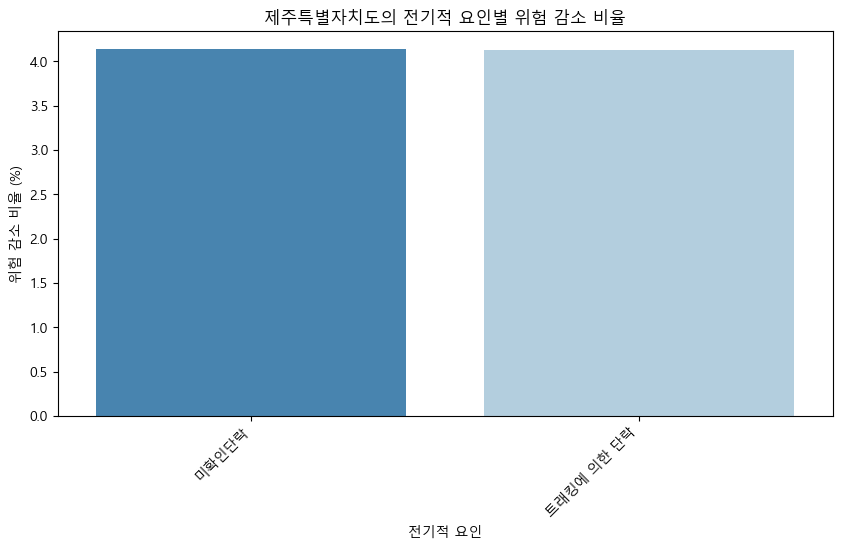

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\2336057869.py:146: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


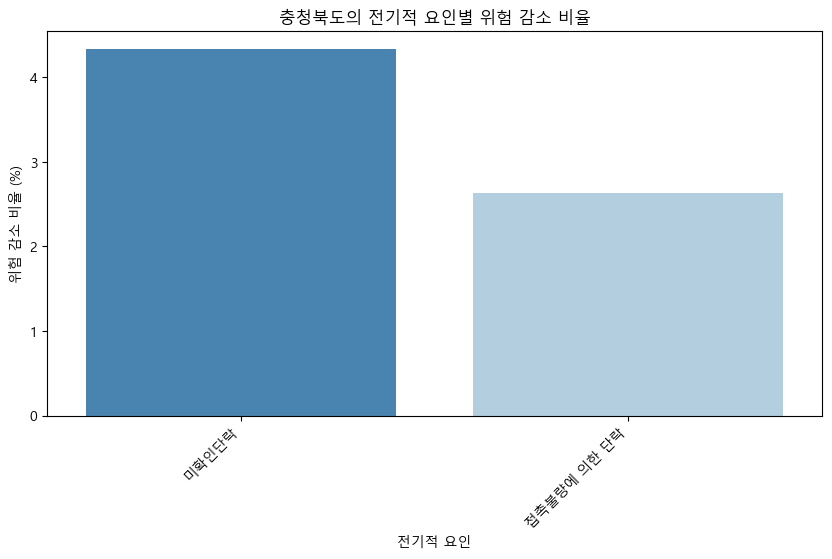

In [65]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import shap
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler

# 한글 폰트 설정
plt.rc('font', family='Malgun Gothic')
plt.rcParams['axes.unicode_minus'] = False

# 현재 실행 디렉토리 확인
BASE_DIR = os.getcwd()
print("현재 실행 디렉토리:", BASE_DIR)

# 데이터 경로 설정
DATA_PATH = os.path.join(BASE_DIR, "electric_ai_data.csv")  # 파일 경로 확인 필요

# 데이터 로드
data = pd.read_csv(DATA_PATH)

# 로그 변환 (발생 건수와 피해 금액을 로그 변환하여 균형 유지)
data["log_total_incidents"] = np.log1p(data["total_incidents"])
data["log_total_damage"] = np.log1p(data["total_damage"])

# 지역별 재해 건수와 피해 금액의 상대적 중요도 계산
data["incident_ratio"] = data.groupby("region_province")["total_incidents"].transform(lambda x: x / x.sum())
data["damage_ratio"] = data.groupby("region_province")["total_damage"].transform(lambda x: x / x.sum())

# 위험 점수 계산 (발생 건수 가중치 증가)
incident_weight = 0.95  # 기존보다 증가
damage_weight = 0.05    # 피해 금액의 비중 감소

data["adjusted_risk_score"] = data["total_incidents"] * (
    incident_weight * data["incident_ratio"] * data["log_total_incidents"] + 
    damage_weight * data["damage_ratio"] * data["log_total_damage"]
)

# 데이터 정규화
scaler = StandardScaler()
data[["z_log_total_incidents", "z_log_total_damage", "z_adjusted_risk_score"]] = scaler.fit_transform(
    data[["log_total_incidents", "log_total_damage", "adjusted_risk_score"]]
)

# One-Hot Encoding 적용 (전기적 세부요인을 독립 변수로 변환)
data = pd.get_dummies(data, columns=["cause_subcategory"])

# 지역 및 전기적 요인 목록
regions = data["region_province"].unique()
cause_columns = [col for col in data.columns if col.startswith("cause_subcategory_")]

# 결과 저장 리스트
shap_results = []

# K-Fold 설정
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# 랜덤포레스트 + SHAP 분석
for train_index, test_index in kf.split(data):
    train_data, test_data = data.iloc[train_index], data.iloc[test_index]
    
    # 모델 입력 변수: 총 재해건수, 피해금액, 전기적 세부요인 (One-Hot Encoding된 컬럼들)
    X_train = train_data[["z_log_total_incidents", "z_log_total_damage"] + cause_columns]
    y_train = train_data["z_adjusted_risk_score"]
    X_test = test_data[["z_log_total_incidents", "z_log_total_damage"] + cause_columns]

    # 랜덤포레스트 학습
    model = RandomForestRegressor(n_estimators=50, max_depth=5, random_state=42)
    model.fit(X_train, y_train)

    # 변수 중요도 가져오기
    feature_importance_dict = dict(zip(X_train.columns, model.feature_importances_))

    # SHAP 분석
    explainer = shap.TreeExplainer(model)
    shap_values = explainer(X_test)

    # SHAP 기여도 계산
    shap_contributions = np.abs(shap_values.values)

    # `test_data`에서 지역별 데이터만 필터링
    for region in regions:
        region_data = test_data[test_data["region_province"] == region]  
        if len(region_data) < 2:
            continue

        for cause in cause_columns:
            cause_data = region_data[region_data[cause] == 1]
            if cause_data.empty:
                continue

            improved_data = cause_data.copy()
            improved_data[["z_log_total_incidents", "z_log_total_damage"]] *= 0.5  # 요인을 50% 감소시키는 방식 적용

            # 기존 위험 점수
            original_risk_score = model.predict(cause_data[["z_log_total_incidents", "z_log_total_damage"] + cause_columns]).mean()

            # 위험 요인 감소 후 점수 (음수 방지)
            improved_risk_score = max(0, model.predict(improved_data[["z_log_total_incidents", "z_log_total_damage"] + cause_columns]).mean())

            # 지역 및 원인별 SHAP 기여도 계산
            region_shap_values = shap_contributions[test_data.index.isin(region_data.index), :].mean(axis=0)
            cause_shap_values = shap_contributions[test_data.index.isin(cause_data.index), :].mean(axis=0)

            shap_region_mean = np.mean(region_shap_values) if len(region_shap_values) > 0 else 0
            shap_cause_mean = np.mean(cause_shap_values) if len(cause_shap_values) > 0 else 0

            # 전기적 세부요인의 변수 중요도 평균 계산
            cause_importance = np.mean([feature_importance_dict[cause] for cause in cause_columns if cause in feature_importance_dict])

            # 전기적 요인의 발생 비중
            cause_ratio = cause_data["total_incidents"].sum() / data["total_incidents"].sum()

            # SHAP 값과 변수 중요도를 활용한 감소율 조정
            shap_importance_weight = (
                (feature_importance_dict["z_log_total_incidents"] * shap_region_mean) +
                (feature_importance_dict["z_log_total_damage"] * shap_region_mean) +
                (cause_importance * shap_cause_mean)
            ) * (1 + cause_ratio)  # 요인의 전체 재해 발생 기여도 추가 반영

            # 위험 점수 감소율 조정
            adjusted_reduction = (
                (shap_importance_weight * 100) *
                (1 + cause_ratio) *
                np.log1p(cause_data["total_incidents"].sum())
            )

            shap_results.append({
                "Region": region,
                "Cause": cause.replace("cause_subcategory_", ""),
                "Reduction (%)": adjusted_reduction,
                "SHAP Contribution (%)": shap_importance_weight * 100
            })

# 데이터프레임 변환
shap_df = pd.DataFrame(shap_results)

# 📊 지역별 개별 그래프 생성
for region in shap_df["Region"].unique():
    plt.figure(figsize=(10, 5))
    region_df = shap_df[shap_df["Region"] == region]
    
    sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")
    
    plt.xticks(rotation=45, ha="right")
    plt.title(f"{region}의 전기적 요인별 위험 감소 비율")
    plt.ylabel("위험 감소 비율 (%)")
    plt.xlabel("전기적 요인")
    
    plt.show()



현재 실행 디렉토리: D:\01-STUDY\3차 팀PJ


C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\2459177059.py:146: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


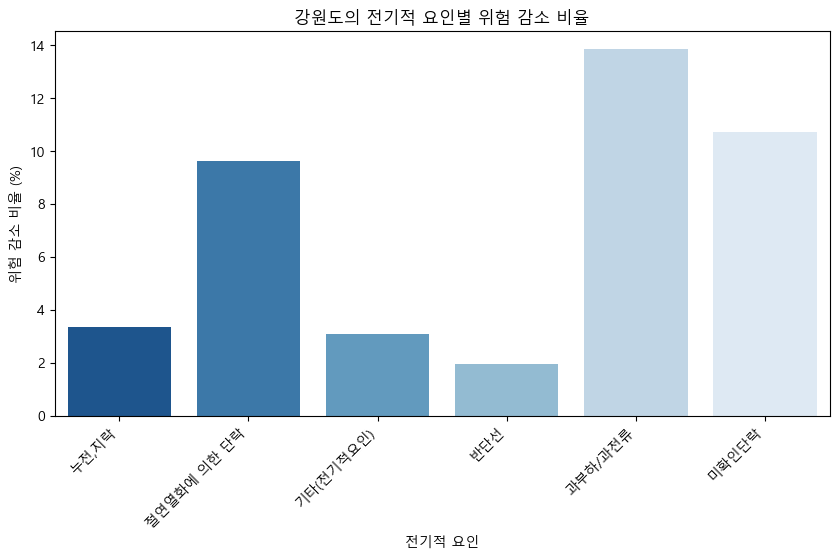

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\2459177059.py:146: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


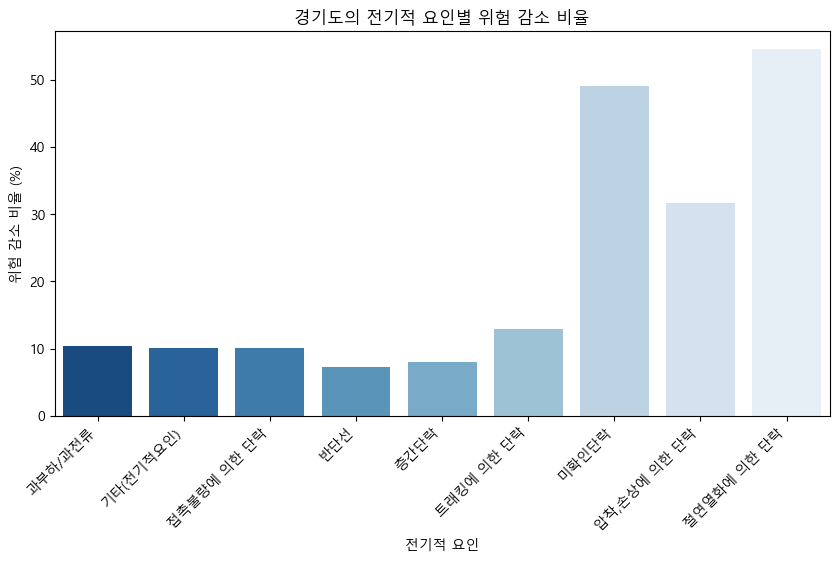

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\2459177059.py:146: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


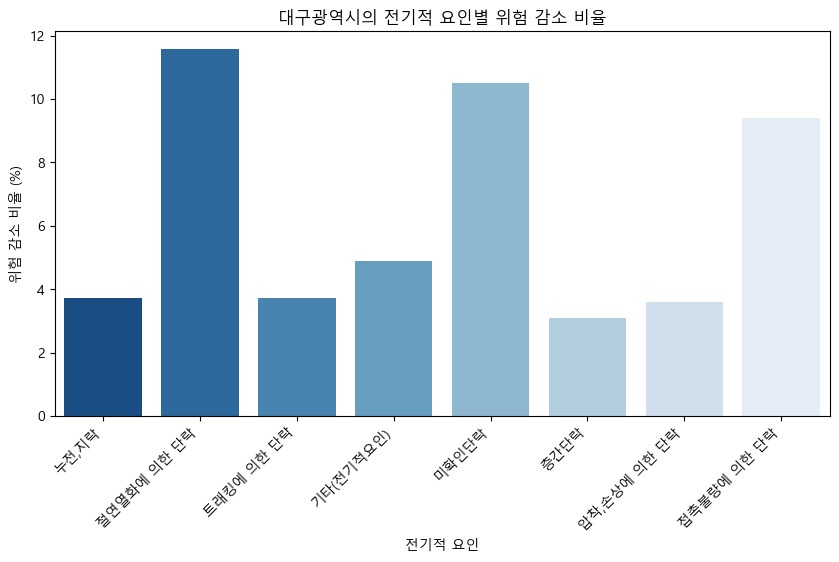

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\2459177059.py:146: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


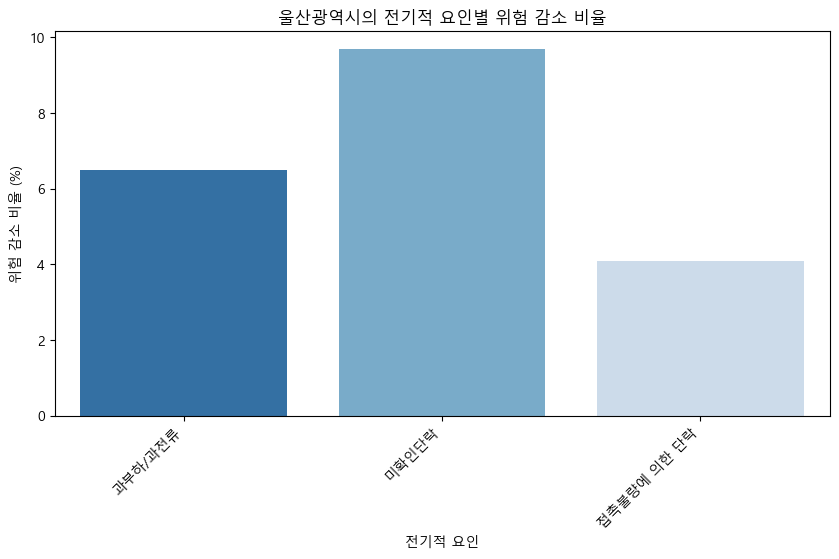

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\2459177059.py:146: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


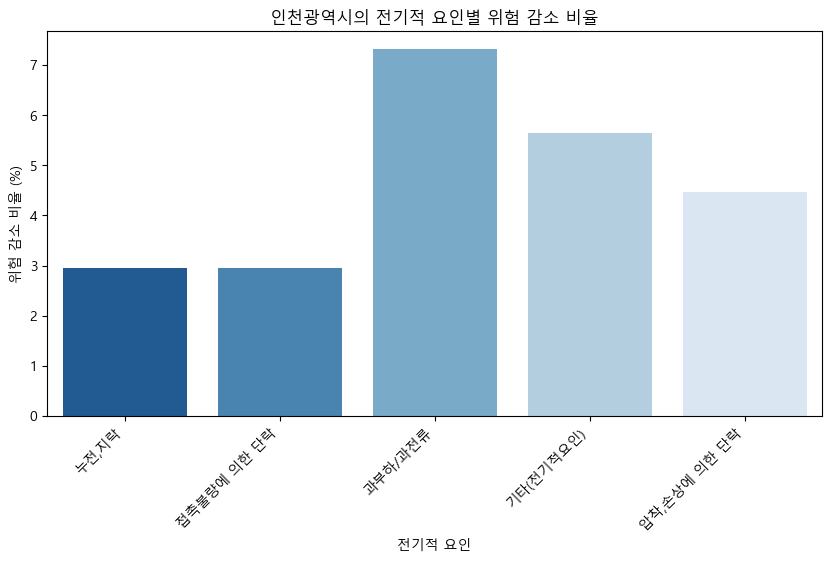

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\2459177059.py:146: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


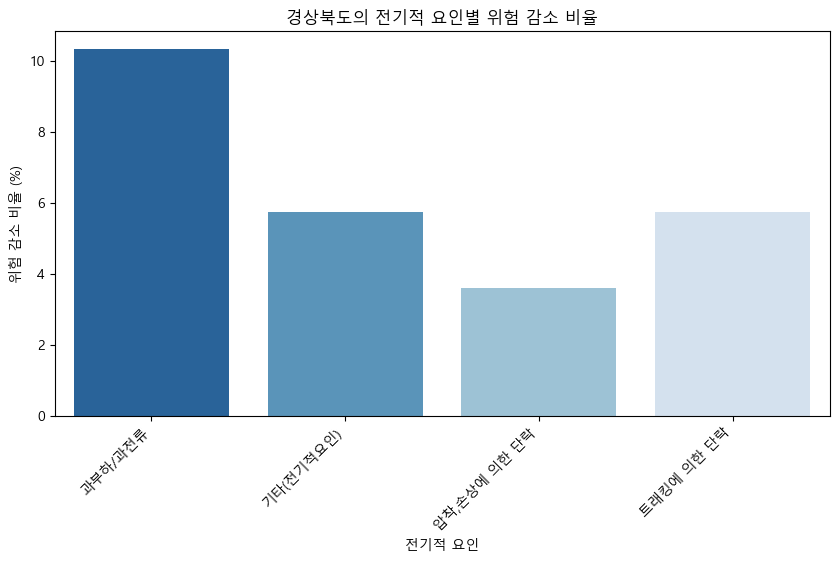

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\2459177059.py:146: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


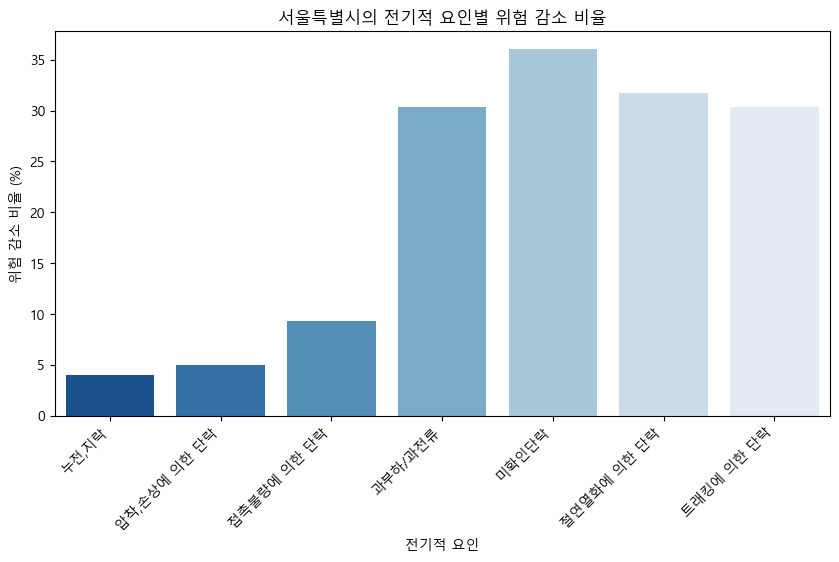

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\2459177059.py:146: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


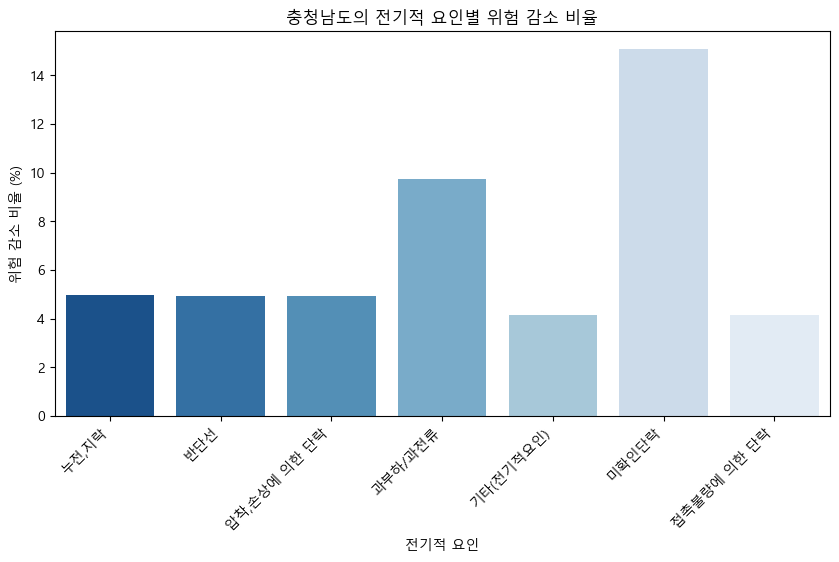

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\2459177059.py:146: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


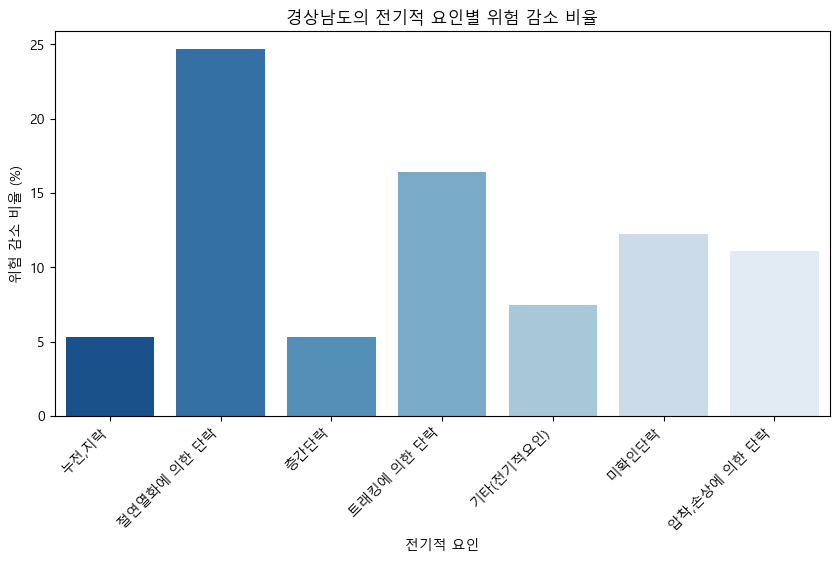

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\2459177059.py:146: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


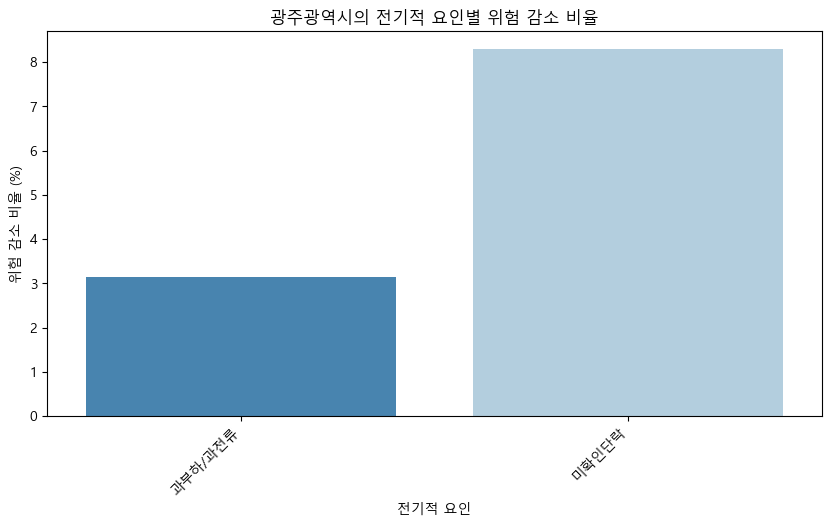

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\2459177059.py:146: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


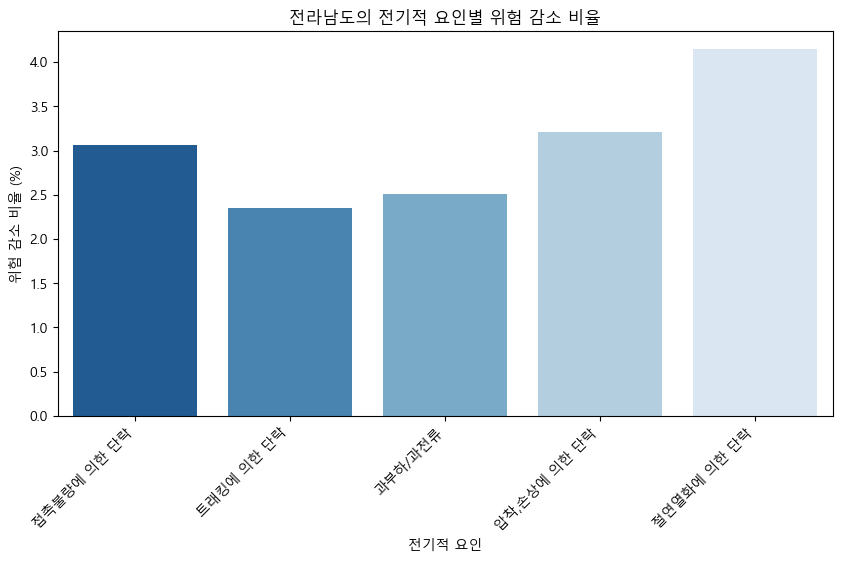

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\2459177059.py:146: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


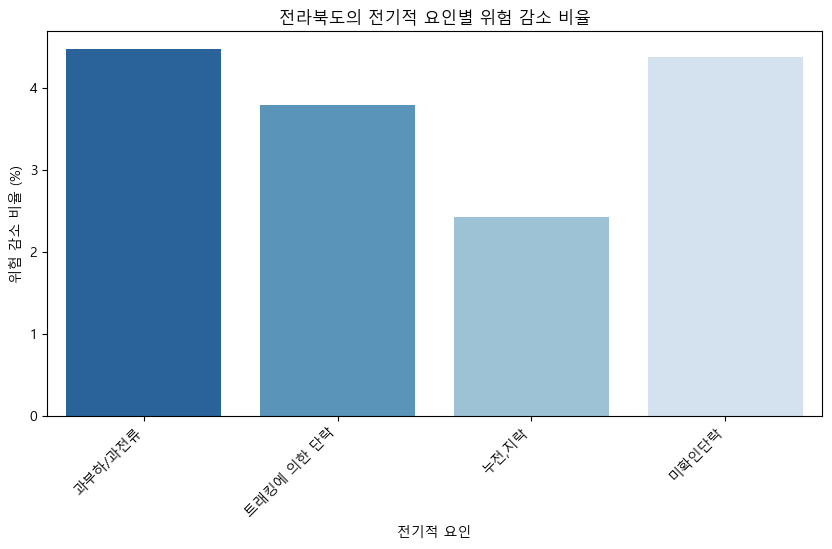

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\2459177059.py:146: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


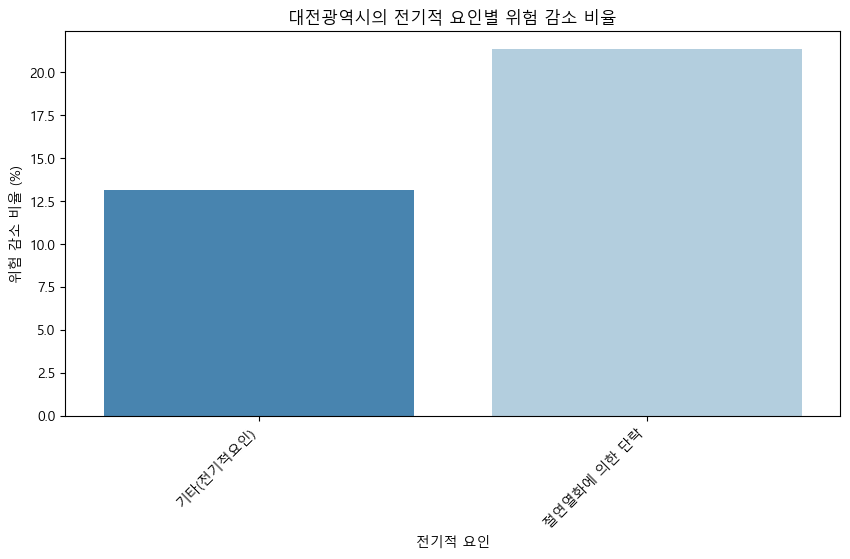

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\2459177059.py:146: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


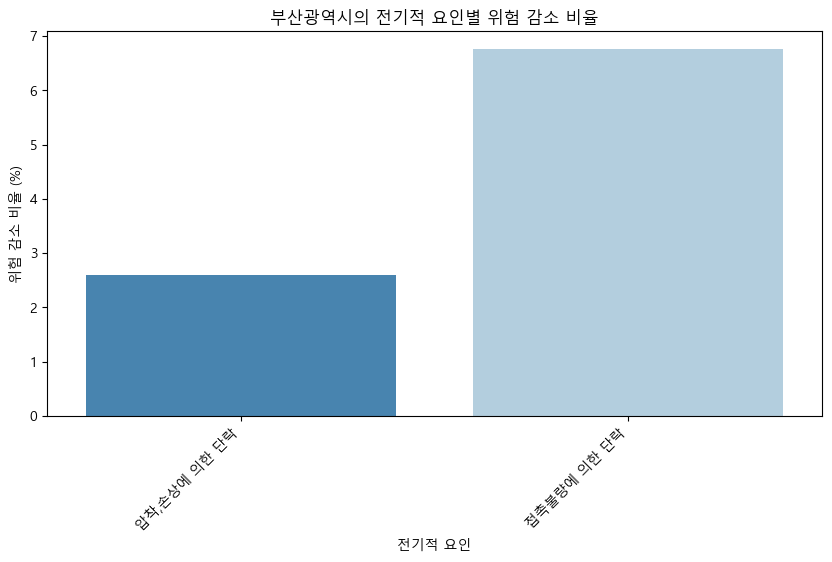

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\2459177059.py:146: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


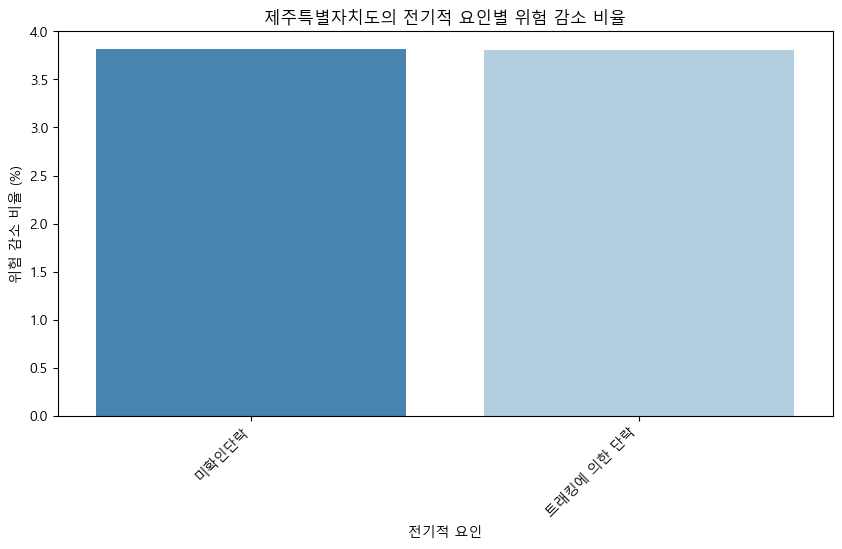

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\2459177059.py:146: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


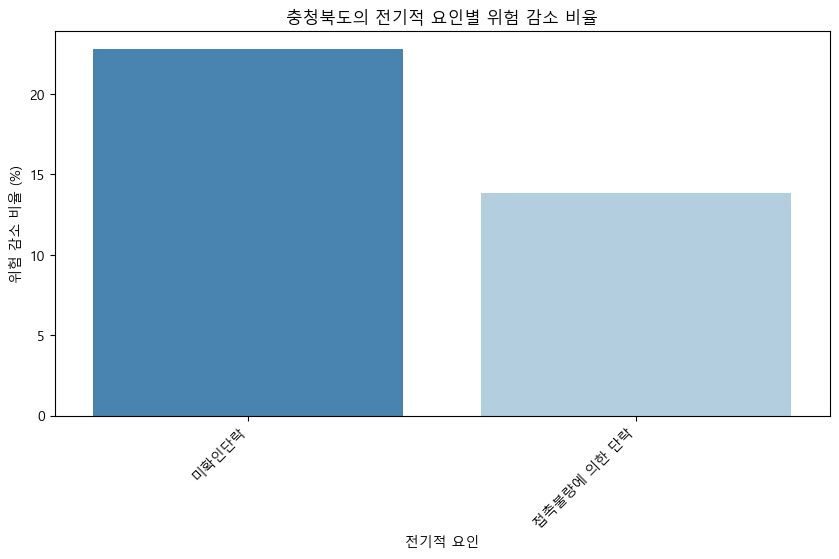

In [66]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import shap
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler

# 한글 폰트 설정
plt.rc('font', family='Malgun Gothic')
plt.rcParams['axes.unicode_minus'] = False

# 현재 실행 디렉토리 확인
BASE_DIR = os.getcwd()
print("현재 실행 디렉토리:", BASE_DIR)

# 데이터 경로 설정
DATA_PATH = os.path.join(BASE_DIR, "electric_ai_data.csv")  # 파일 경로 확인 필요

# 데이터 로드
data = pd.read_csv(DATA_PATH)

# 로그 변환 (발생 건수와 피해 금액을 로그 변환하여 균형 유지)
data["log_total_incidents"] = np.log1p(data["total_incidents"])
data["log_total_damage"] = np.log1p(data["total_damage"])

# 지역별 재해 건수 및 피해 금액 정규화 (각 지역별 평균을 기준으로 나눠 정규화)
data["normalized_incidents"] = data.groupby("region_province")["total_incidents"].transform(lambda x: x / x.mean())
data["normalized_damage"] = data.groupby("region_province")["total_damage"].transform(lambda x: x / x.mean())

# 위험 점수 계산 (발생 건수 70%, 피해 금액 30% 가중치 적용)
incident_weight = 0.7
damage_weight = 0.3

data["adjusted_risk_score"] = (
    incident_weight * data["normalized_incidents"] * data["log_total_incidents"] + 
    damage_weight * data["normalized_damage"] * data["log_total_damage"]
)

# 데이터 정규화
scaler = StandardScaler()
data[["z_log_total_incidents", "z_log_total_damage", "z_adjusted_risk_score"]] = scaler.fit_transform(
    data[["log_total_incidents", "log_total_damage", "adjusted_risk_score"]]
)

# One-Hot Encoding 적용 (전기적 세부요인을 독립 변수로 변환)
data = pd.get_dummies(data, columns=["cause_subcategory"])

# 지역 및 전기적 요인 목록
regions = data["region_province"].unique()
cause_columns = [col for col in data.columns if col.startswith("cause_subcategory_")]

# 결과 저장 리스트
shap_results = []

# K-Fold 설정
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# 랜덤포레스트 + SHAP 분석
for train_index, test_index in kf.split(data):
    train_data, test_data = data.iloc[train_index], data.iloc[test_index]
    
    # 모델 입력 변수: 총 재해건수, 피해금액, 전기적 세부요인 (One-Hot Encoding된 컬럼들)
    X_train = train_data[["z_log_total_incidents", "z_log_total_damage"] + cause_columns]
    y_train = train_data["z_adjusted_risk_score"]
    X_test = test_data[["z_log_total_incidents", "z_log_total_damage"] + cause_columns]

    # 랜덤포레스트 학습
    model = RandomForestRegressor(n_estimators=100, max_depth=7, random_state=42)
    model.fit(X_train, y_train)

    # 변수 중요도 가져오기
    feature_importance_dict = dict(zip(X_train.columns, model.feature_importances_))

    # SHAP 분석
    explainer = shap.TreeExplainer(model)
    shap_values = explainer(X_test)

    # SHAP 기여도 계산
    shap_contributions = np.abs(shap_values.values)

    # `test_data`에서 지역별 데이터만 필터링
    for region in regions:
        region_data = test_data[test_data["region_province"] == region]  
        if len(region_data) < 2:
            continue

        for cause in cause_columns:
            cause_data = region_data[region_data[cause] == 1]
            if cause_data.empty:
                continue

            improved_data = cause_data.copy()
            improved_data[["z_log_total_incidents", "z_log_total_damage"]] *= 0.5  # 요인을 50% 감소시키는 방식 적용

            # 기존 위험 점수
            original_risk_score = model.predict(cause_data[["z_log_total_incidents", "z_log_total_damage"] + cause_columns]).mean()

            # 위험 요인 감소 후 점수 (음수 방지)
            improved_risk_score = max(0, model.predict(improved_data[["z_log_total_incidents", "z_log_total_damage"] + cause_columns]).mean())

            # 지역 및 원인별 SHAP 기여도 계산
            region_shap_values = shap_contributions[test_data.index.isin(region_data.index), :].mean(axis=0)
            cause_shap_values = shap_contributions[test_data.index.isin(cause_data.index), :].mean(axis=0)

            shap_region_mean = np.mean(region_shap_values) if len(region_shap_values) > 0 else 0
            shap_cause_mean = np.mean(cause_shap_values) if len(cause_shap_values) > 0 else 0

            # 전기적 세부요인의 변수 중요도 평균 계산
            cause_importance = np.mean([feature_importance_dict[cause] for cause in cause_columns if cause in feature_importance_dict])

            # 전기적 요인의 발생 비중
            cause_ratio = cause_data["total_incidents"].sum() / data["total_incidents"].sum()

            # SHAP 값과 변수 중요도를 활용한 감소율 조정
            shap_importance_weight = (
                (feature_importance_dict["z_log_total_incidents"] * shap_region_mean) +
                (feature_importance_dict["z_log_total_damage"] * shap_region_mean) +
                (cause_importance * shap_cause_mean)
            ) * (1 + cause_ratio)  # 요인의 전체 재해 발생 기여도 추가 반영

            # 위험 점수 감소율 조정
            adjusted_reduction = (
                (shap_importance_weight * 100) *
                (1 + cause_ratio) *
                np.log1p(cause_data["total_incidents"].sum())
            )

            shap_results.append({
                "Region": region,
                "Cause": cause.replace("cause_subcategory_", ""),
                "Reduction (%)": adjusted_reduction,
                "SHAP Contribution (%)": shap_importance_weight * 100
            })

# 데이터프레임 변환
shap_df = pd.DataFrame(shap_results)

# 📊 지역별 그래프 생성
for region in shap_df["Region"].unique():
    plt.figure(figsize=(10, 5))
    region_df = shap_df[shap_df["Region"] == region]
    
    sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")
    
    plt.xticks(rotation=45, ha="right")
    plt.title(f"{region}의 전기적 요인별 위험 감소 비율")
    plt.ylabel("위험 감소 비율 (%)")
    plt.xlabel("전기적 요인")
    
    plt.show()


현재 실행 디렉토리: D:\01-STUDY\3차 팀PJ


C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\2357733427.py:129: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


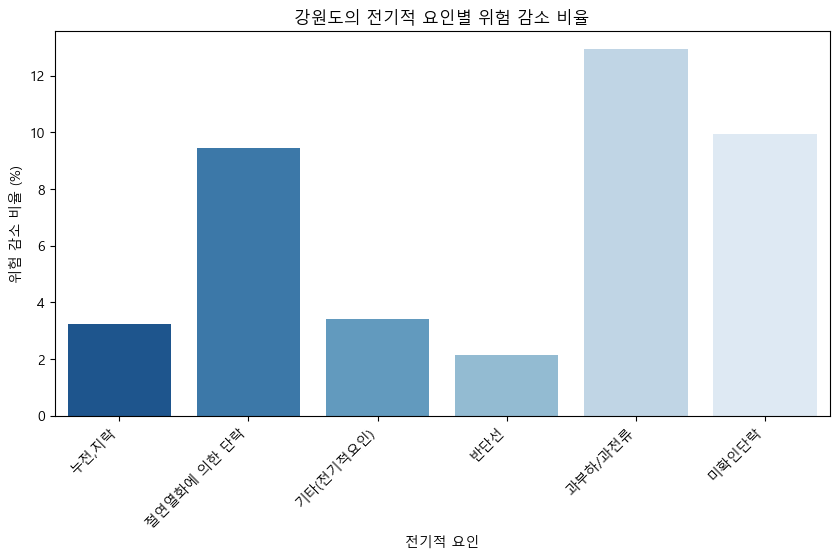

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\2357733427.py:129: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


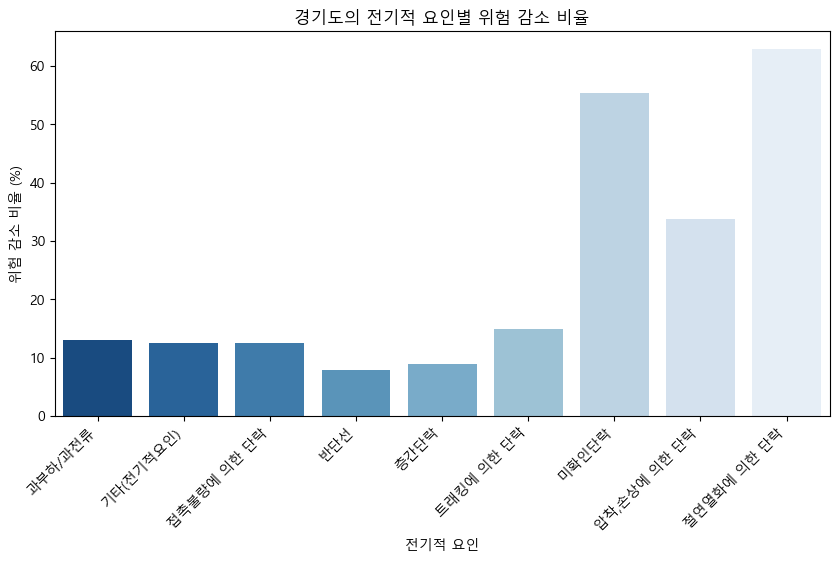

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\2357733427.py:129: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


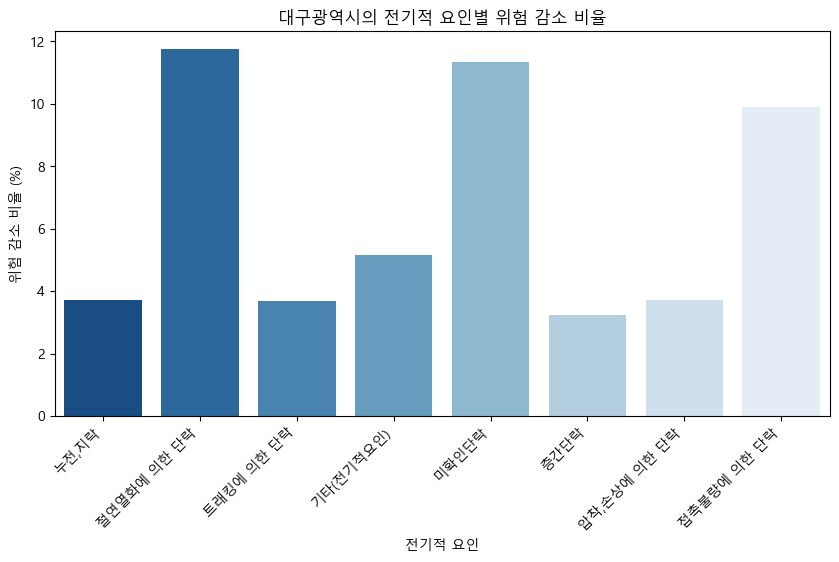

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\2357733427.py:129: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


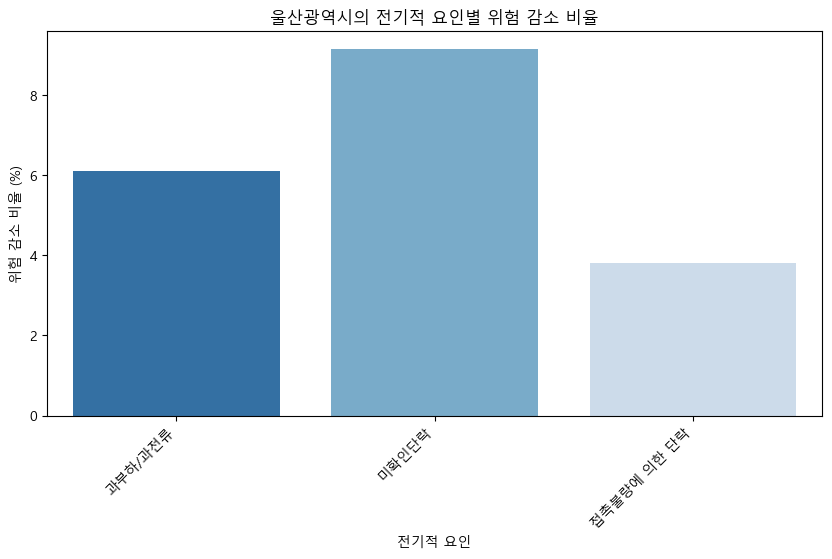

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\2357733427.py:129: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


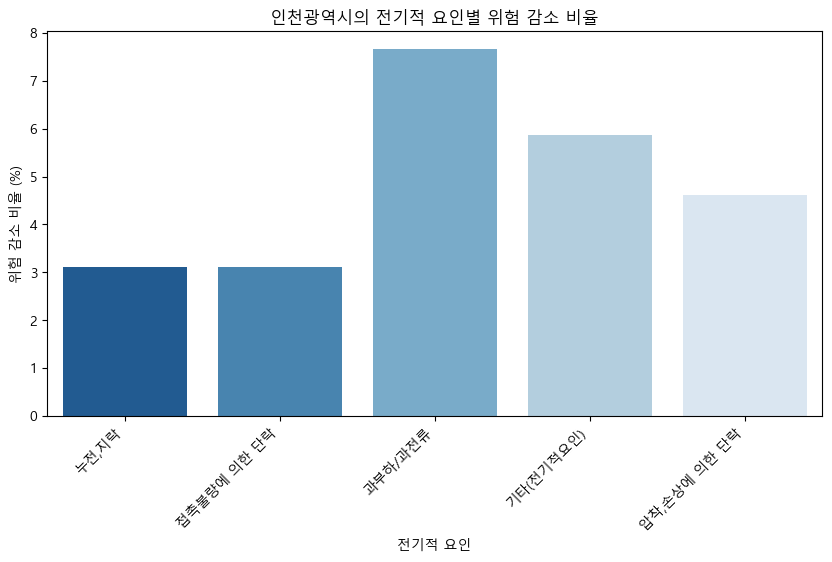

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\2357733427.py:129: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


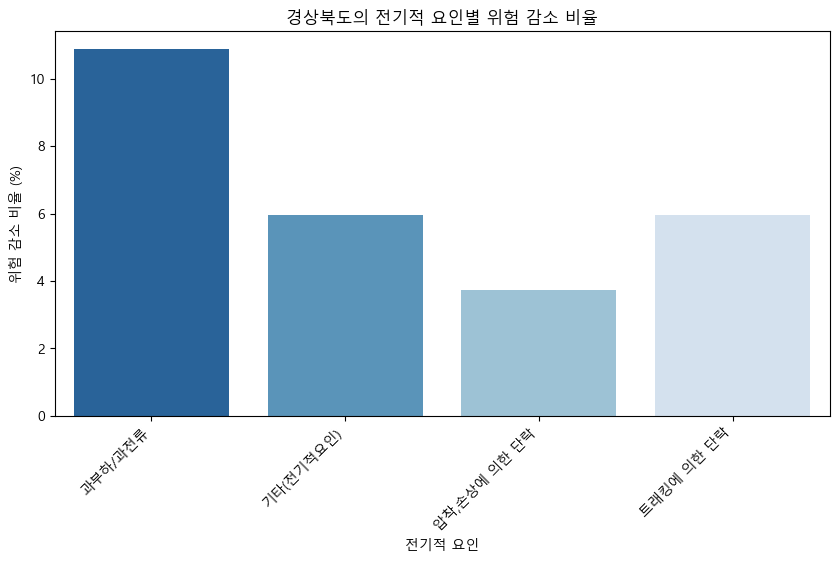

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\2357733427.py:129: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


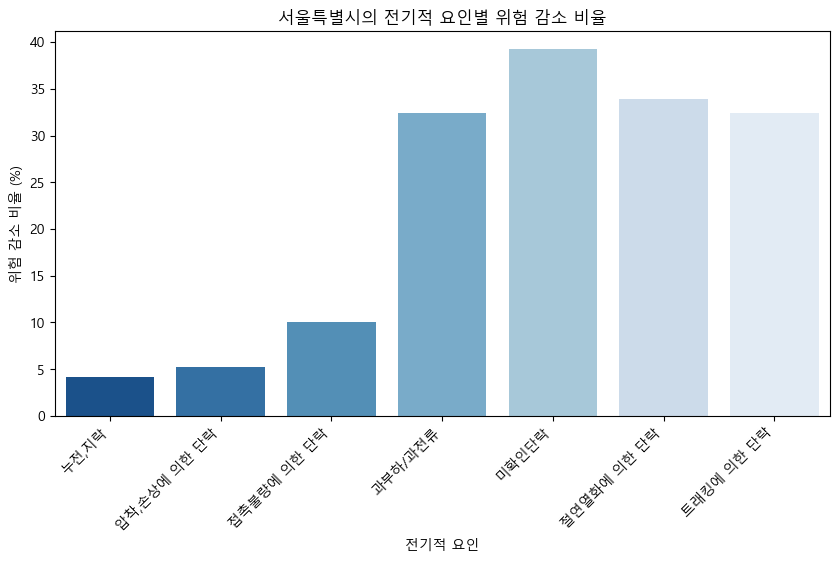

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\2357733427.py:129: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


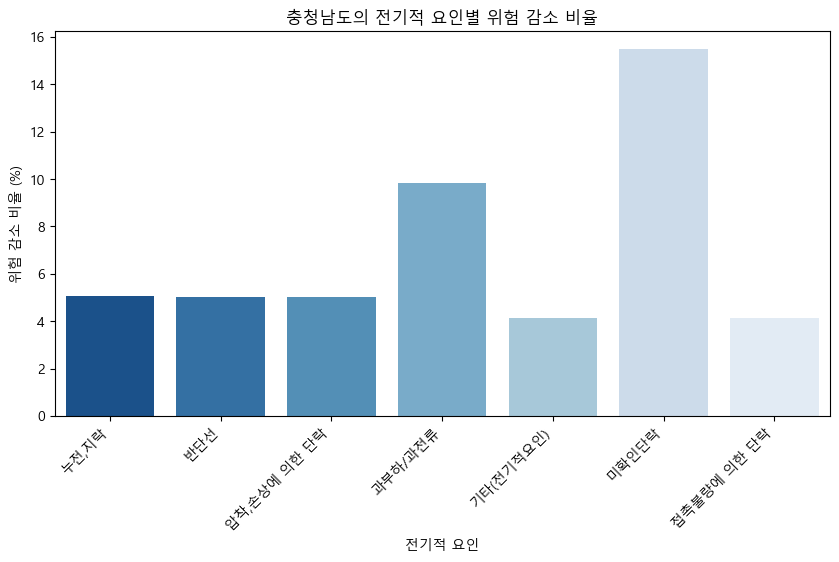

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\2357733427.py:129: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


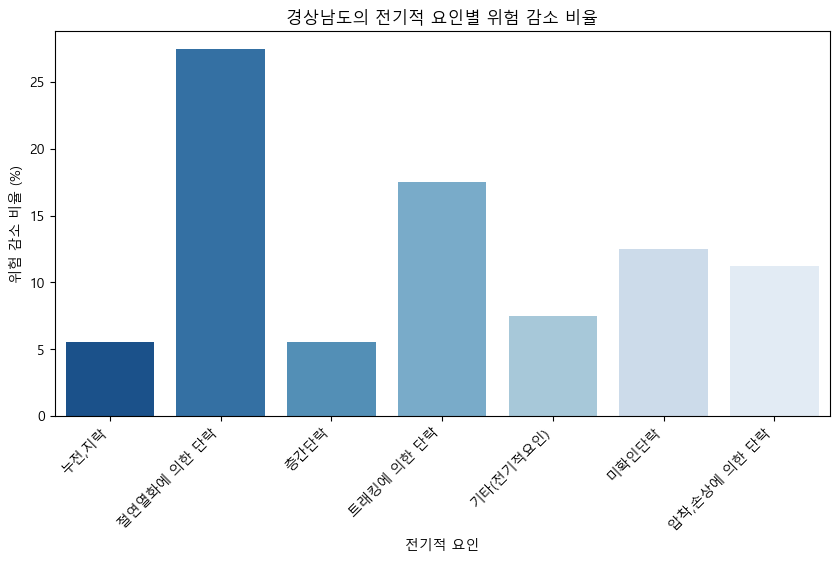

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\2357733427.py:129: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


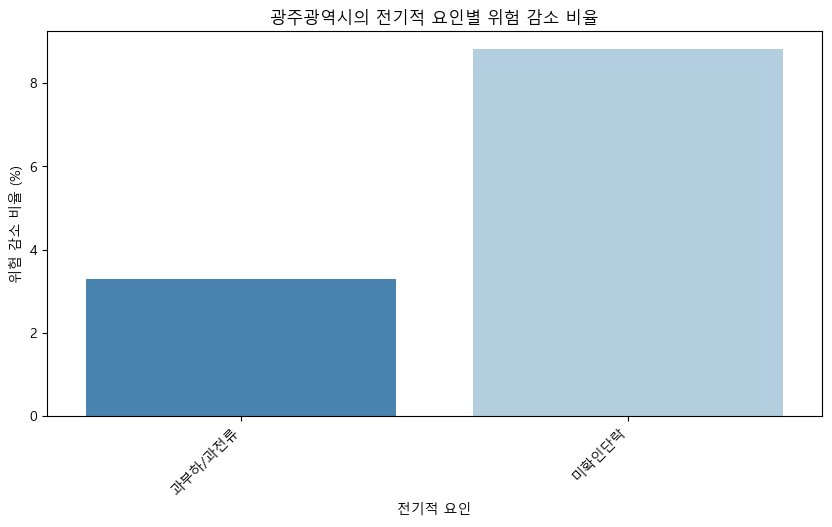

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\2357733427.py:129: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


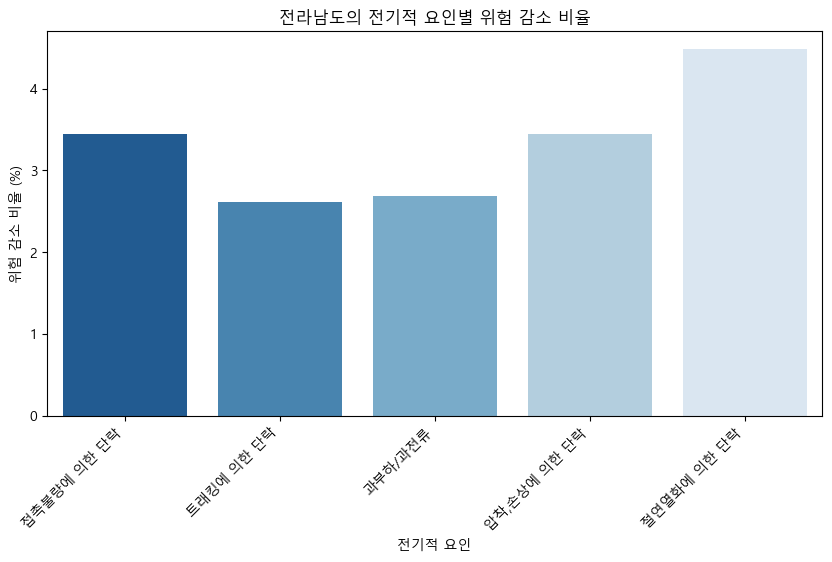

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\2357733427.py:129: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


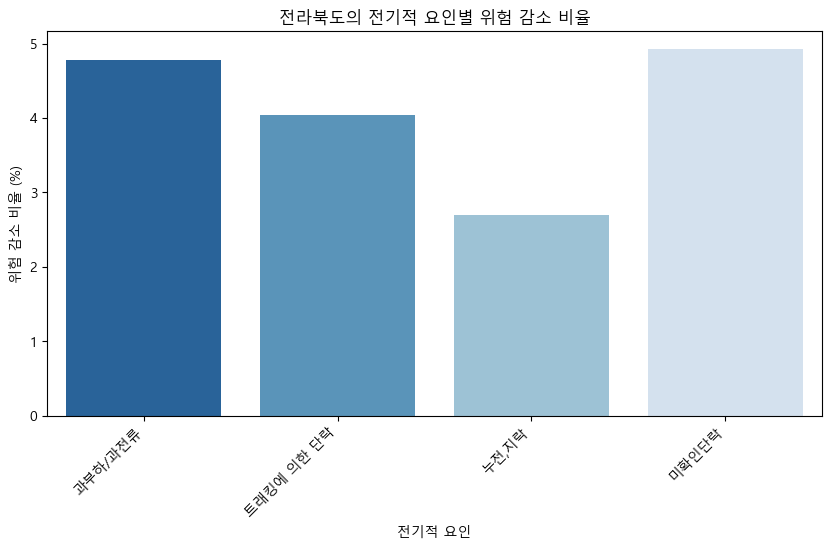

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\2357733427.py:129: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


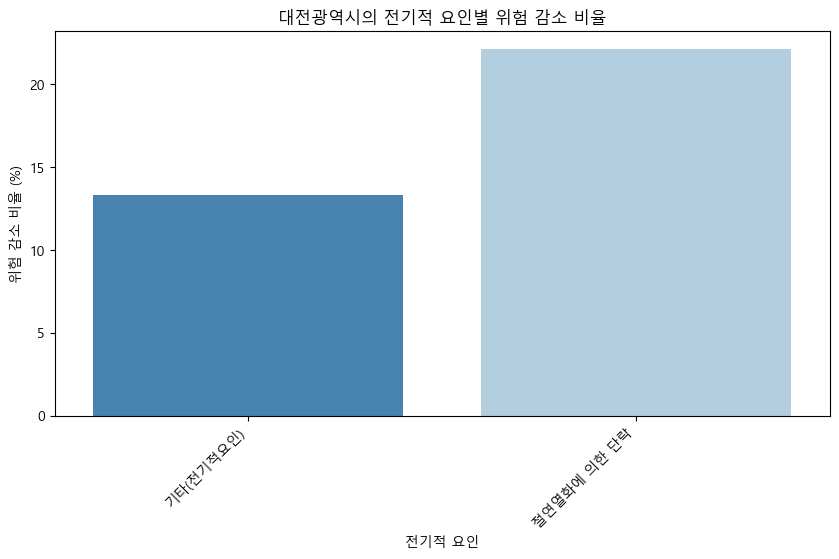

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\2357733427.py:129: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


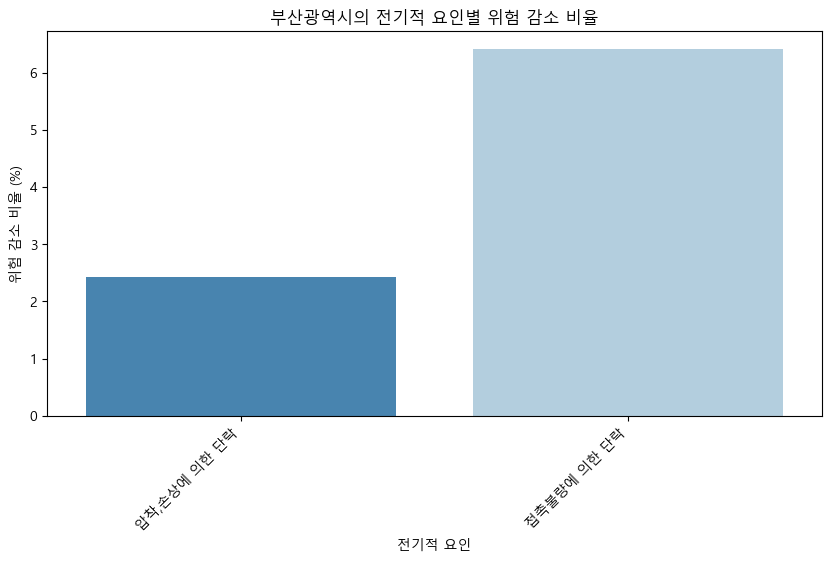

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\2357733427.py:129: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


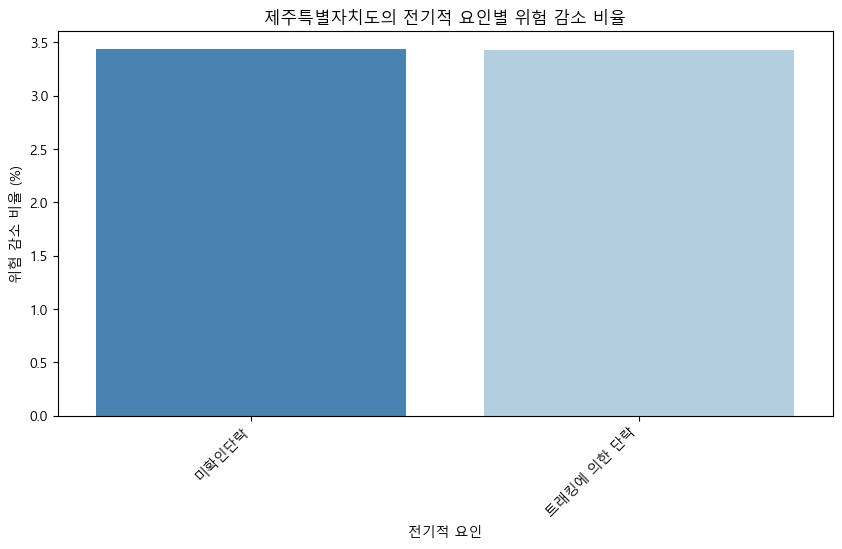

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\2357733427.py:129: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


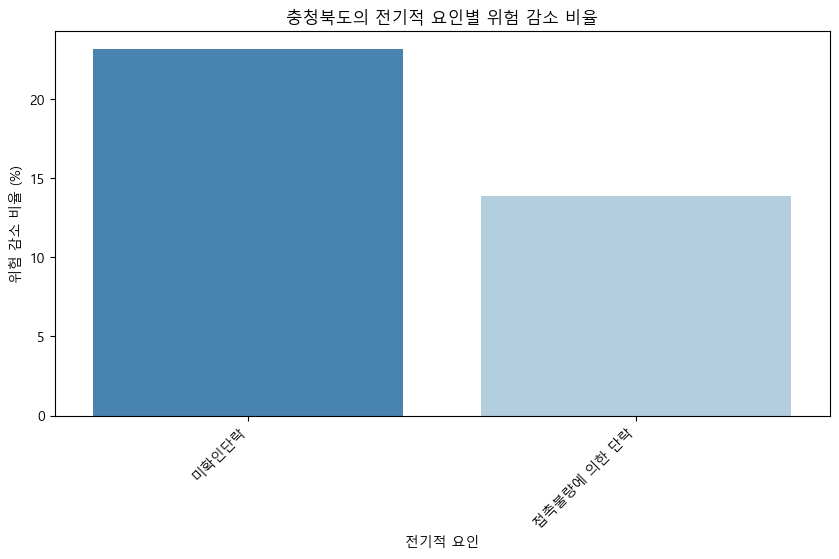

In [67]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import shap
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler

# 한글 폰트 설정
plt.rc('font', family='Malgun Gothic')
plt.rcParams['axes.unicode_minus'] = False

# 현재 실행 디렉토리 확인
BASE_DIR = os.getcwd()
print("현재 실행 디렉토리:", BASE_DIR)

# 데이터 경로 설정
DATA_PATH = os.path.join(BASE_DIR, "electric_ai_data.csv")

# 데이터 로드
data = pd.read_csv(DATA_PATH)

# 로그 변환 (발생 건수와 피해 금액을 로그 변환하여 균형 유지)
data["log_total_incidents"] = np.log1p(data["total_incidents"])
data["log_total_damage"] = np.log1p(data["total_damage"])

# 지역별 재해 건수 및 피해 금액 정규화
data["normalized_incidents"] = data.groupby("region_province")["total_incidents"].transform(lambda x: x / x.mean())
data["normalized_damage"] = data.groupby("region_province")["total_damage"].transform(lambda x: x / x.mean())

# 위험 점수 계산 (가중치 조정)
incident_weight = 0.8
damage_weight = 0.2

data["adjusted_risk_score"] = (
    incident_weight * data["normalized_incidents"] * data["log_total_incidents"] + 
    damage_weight * data["normalized_damage"] * data["log_total_damage"]
)

# 데이터 정규화
scaler = StandardScaler()
data[["z_log_total_incidents", "z_log_total_damage", "z_adjusted_risk_score"]] = scaler.fit_transform(
    data[["log_total_incidents", "log_total_damage", "adjusted_risk_score"]]
)

# One-Hot Encoding 적용 (전기적 세부요인을 독립 변수로 변환)
data = pd.get_dummies(data, columns=["cause_subcategory"])

# 지역 및 전기적 요인 목록
regions = data["region_province"].unique()
cause_columns = [col for col in data.columns if col.startswith("cause_subcategory_")]

# 결과 저장 리스트
shap_results = []

# K-Fold 설정
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# 랜덤포레스트 + SHAP 분석
for train_index, test_index in kf.split(data):
    train_data, test_data = data.iloc[train_index], data.iloc[test_index]
    
    X_train = train_data[["z_log_total_incidents", "z_log_total_damage"] + cause_columns]
    y_train = train_data["z_adjusted_risk_score"]
    X_test = test_data[["z_log_total_incidents", "z_log_total_damage"] + cause_columns]

    model = RandomForestRegressor(n_estimators=100, max_depth=7, random_state=42)
    model.fit(X_train, y_train)

    feature_importance_dict = dict(zip(X_train.columns, model.feature_importances_))

    explainer = shap.TreeExplainer(model)
    shap_values = explainer(X_test)
    shap_contributions = np.abs(shap_values.values)

    for region in regions:
        region_data = test_data[test_data["region_province"] == region]  
        if len(region_data) < 2:
            continue

        for cause in cause_columns:
            cause_data = region_data[region_data[cause] == 1]
            if cause_data.empty:
                continue

            improved_data = cause_data.copy()
            improved_data[["z_log_total_incidents", "z_log_total_damage"]] *= 0.5

            original_risk_score = model.predict(cause_data[["z_log_total_incidents", "z_log_total_damage"] + cause_columns]).mean()
            improved_risk_score = max(0, model.predict(improved_data[["z_log_total_incidents", "z_log_total_damage"] + cause_columns]).mean())

            region_shap_values = shap_contributions[test_data.index.isin(region_data.index), :].mean(axis=0)
            cause_shap_values = shap_contributions[test_data.index.isin(cause_data.index), :].mean(axis=0)

            shap_region_mean = np.mean(region_shap_values) if len(region_shap_values) > 0 else 0
            shap_cause_mean = np.mean(cause_shap_values) if len(cause_shap_values) > 0 else 0

            cause_importance = np.mean([feature_importance_dict[cause] for cause in cause_columns if cause in feature_importance_dict])

            cause_ratio = cause_data["total_incidents"].sum() / data["total_incidents"].sum()

            shap_importance_weight = (
                (feature_importance_dict["z_log_total_incidents"] * shap_region_mean) +
                (feature_importance_dict["z_log_total_damage"] * shap_region_mean) +
                (cause_importance * shap_cause_mean)
            ) * (1 + (cause_ratio * 2))  

            adjusted_reduction = (
                (shap_importance_weight * 100) *
                (1 + (cause_ratio * 2)) *
                np.log1p(cause_data["total_incidents"].sum())
            )

            shap_results.append({
                "Region": region,
                "Cause": cause.replace("cause_subcategory_", ""),
                "Reduction (%)": adjusted_reduction,
                "SHAP Contribution (%)": shap_importance_weight * 100
            })

shap_df = pd.DataFrame(shap_results)

for region in shap_df["Region"].unique():
    plt.figure(figsize=(10, 5))
    region_df = shap_df[shap_df["Region"] == region]
    
    sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")
    
    plt.xticks(rotation=45, ha="right")
    plt.title(f"{region}의 전기적 요인별 위험 감소 비율")
    plt.ylabel("위험 감소 비율 (%)")
    plt.xlabel("전기적 요인")
    
    plt.show()


현재 실행 디렉토리: D:\01-STUDY\3차 팀PJ


C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\2357733427.py:129: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


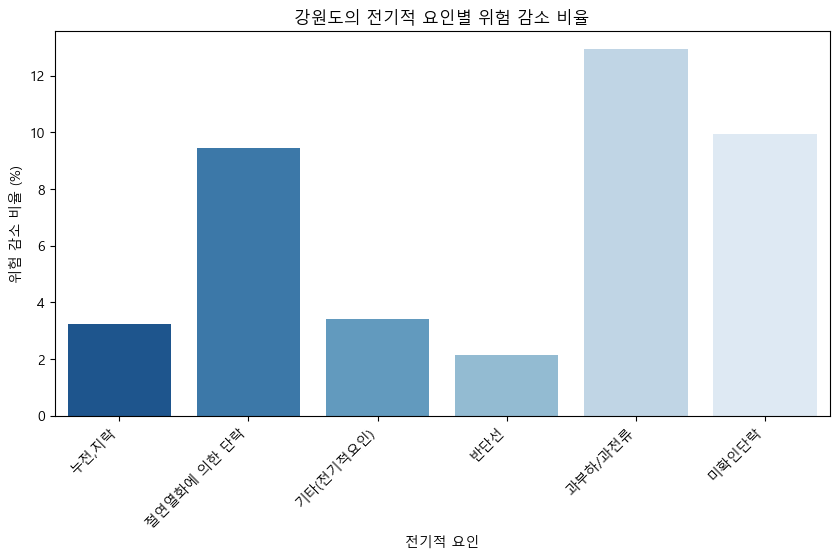

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\2357733427.py:129: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


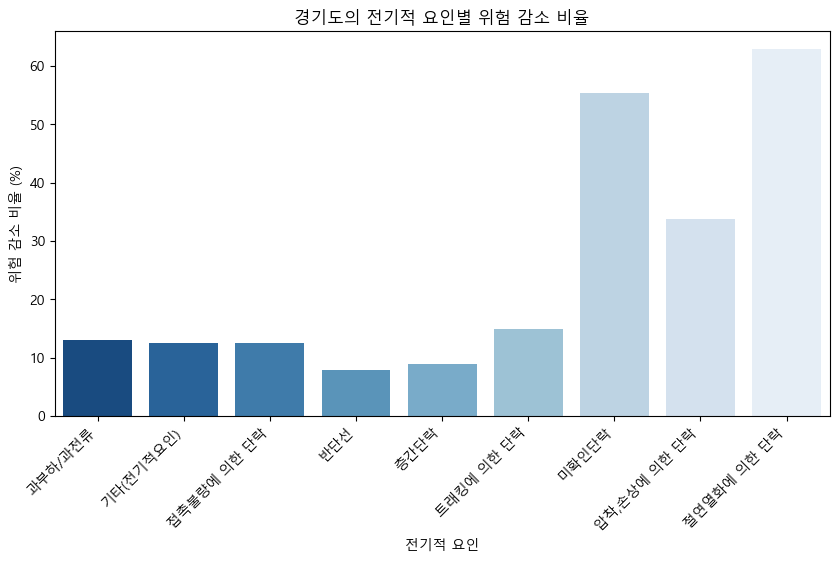

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\2357733427.py:129: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


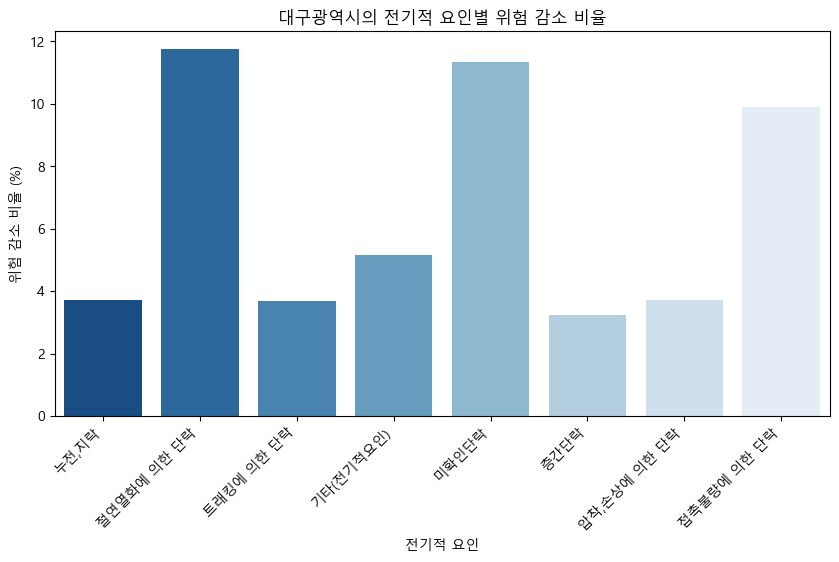

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\2357733427.py:129: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


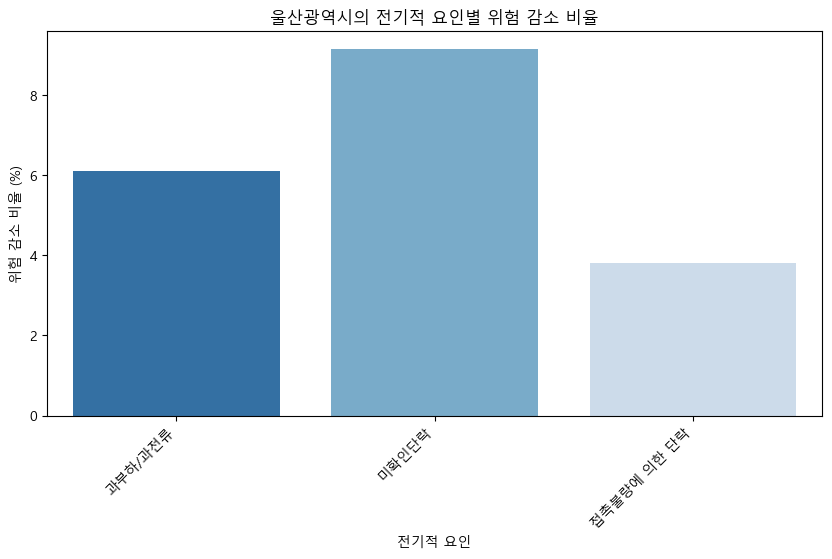

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\2357733427.py:129: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


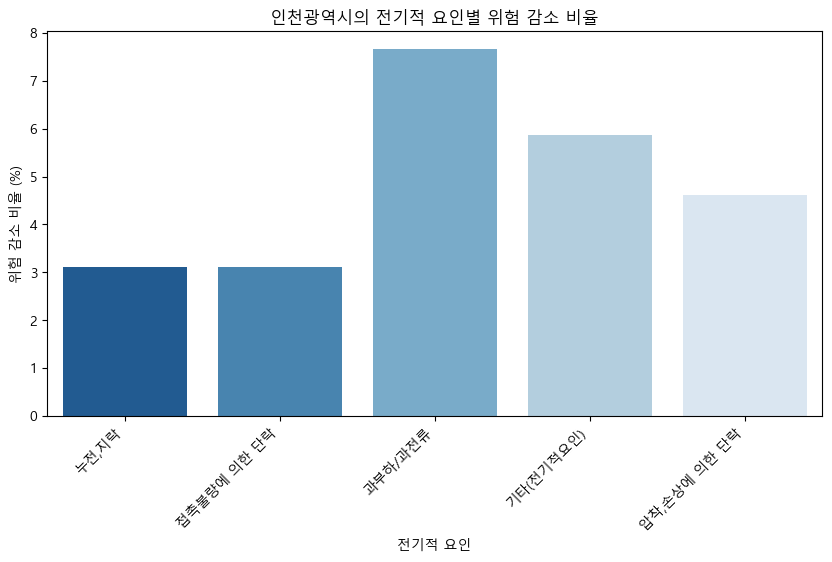

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\2357733427.py:129: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


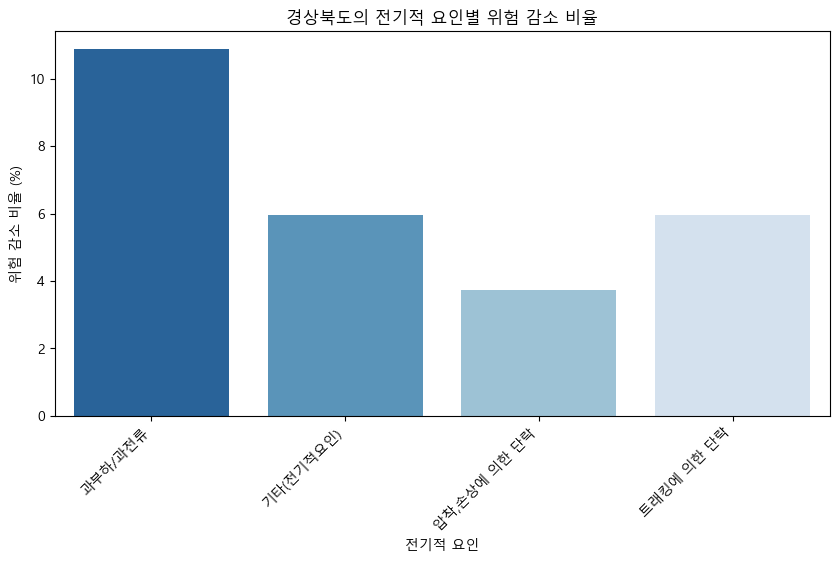

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\2357733427.py:129: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


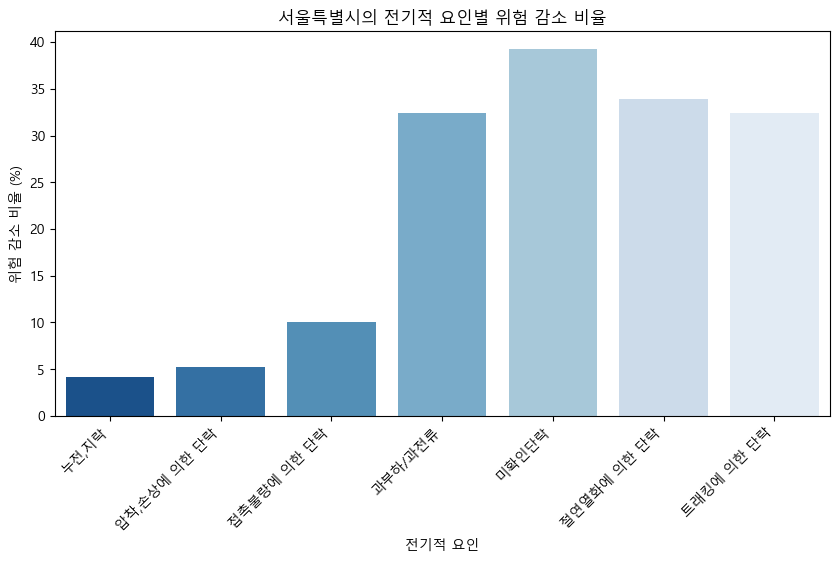

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\2357733427.py:129: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


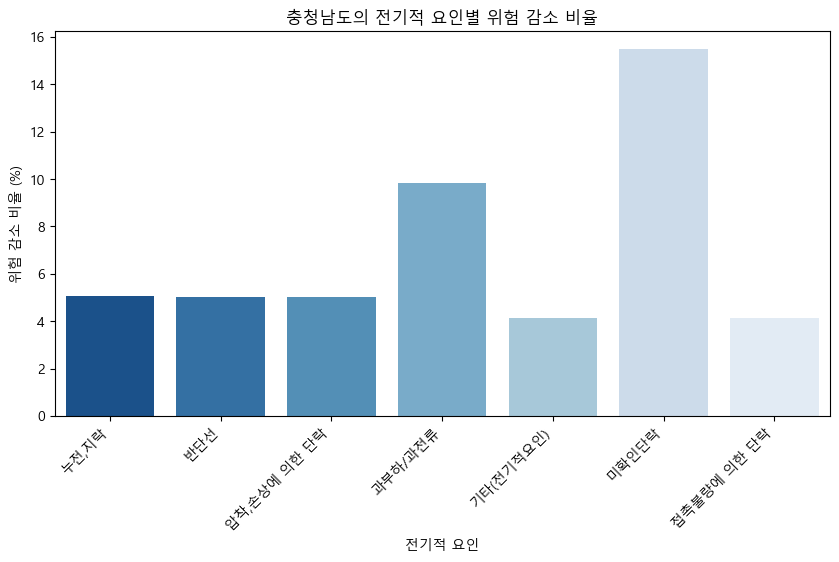

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\2357733427.py:129: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


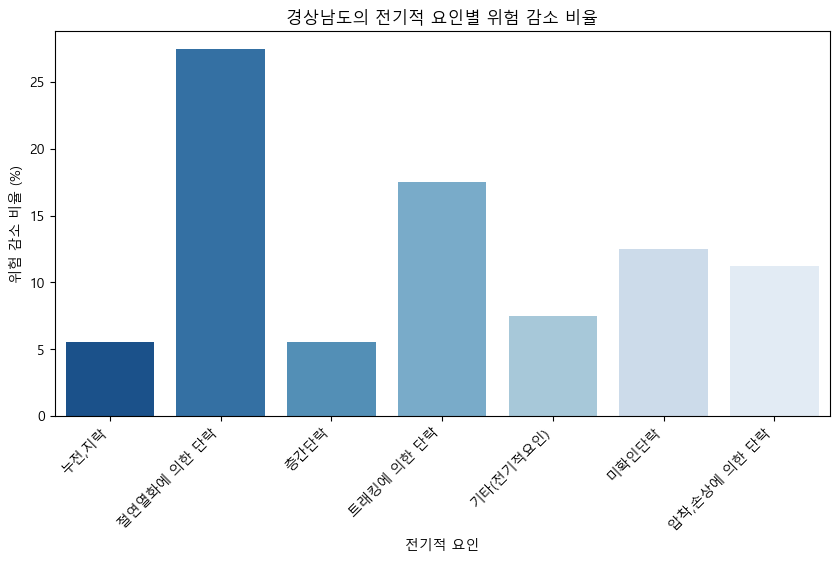

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\2357733427.py:129: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


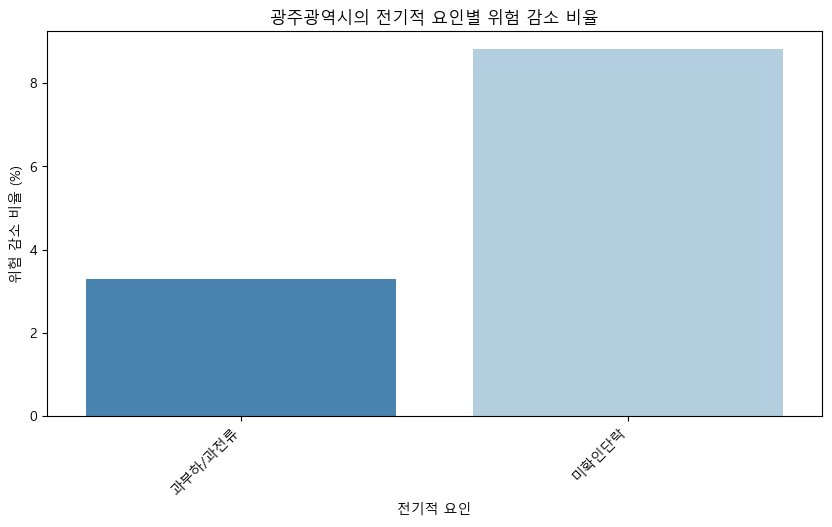

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\2357733427.py:129: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


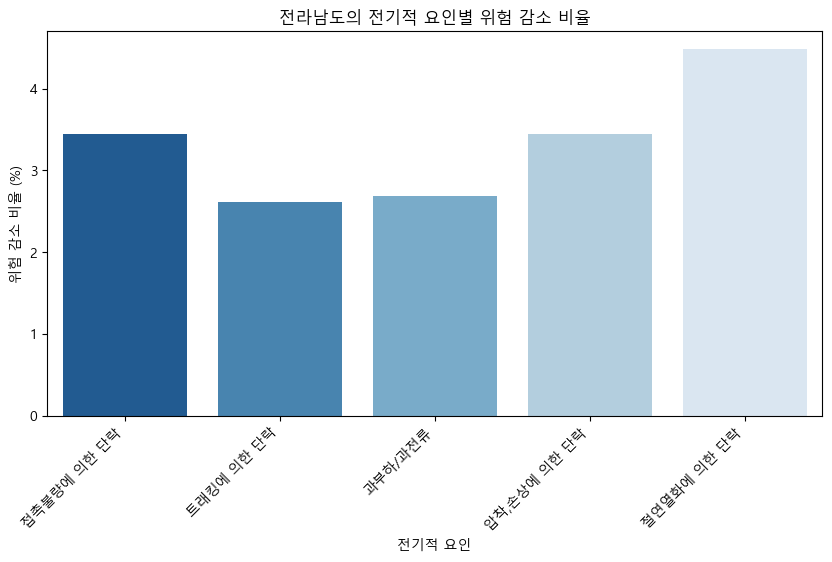

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\2357733427.py:129: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


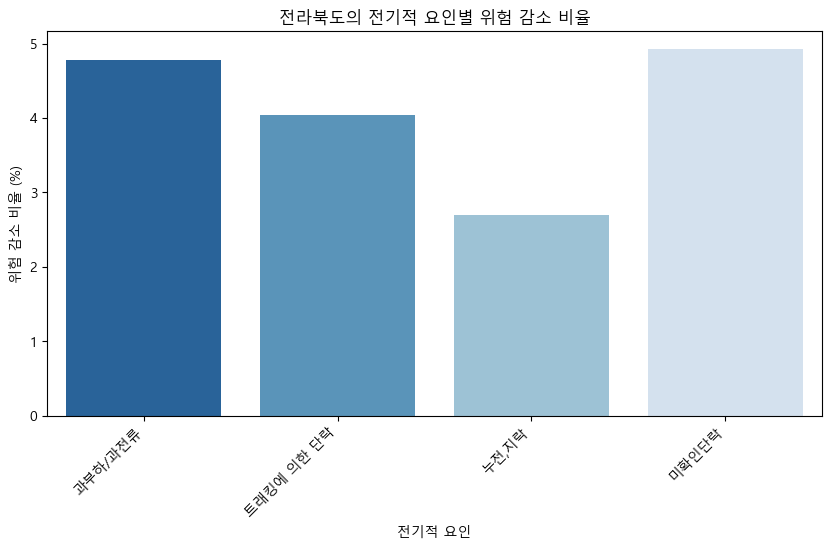

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\2357733427.py:129: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


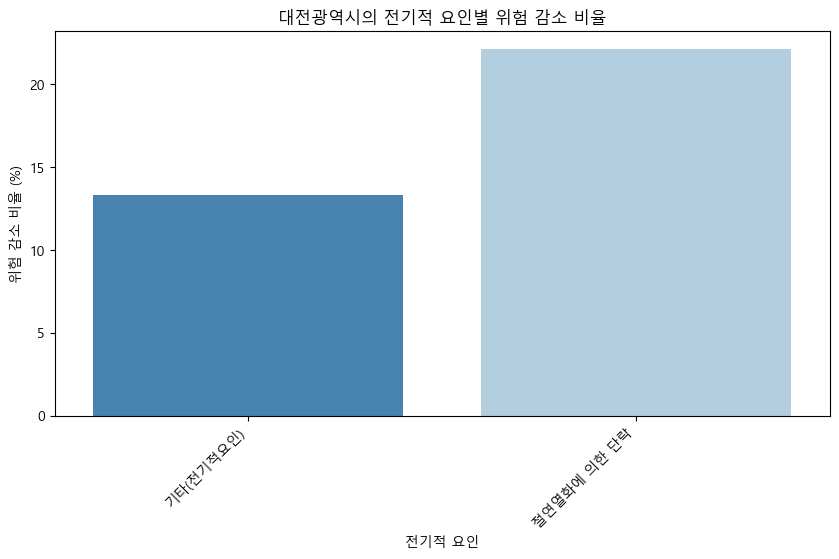

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\2357733427.py:129: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


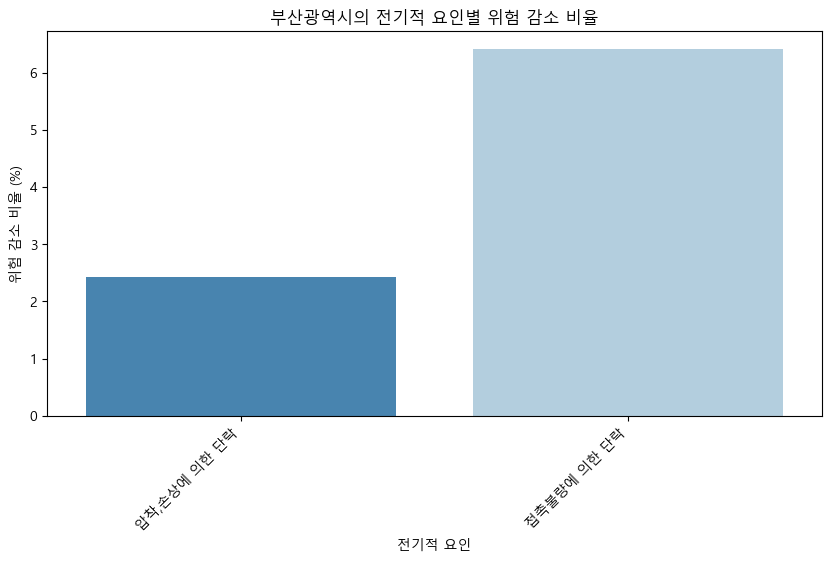

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\2357733427.py:129: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


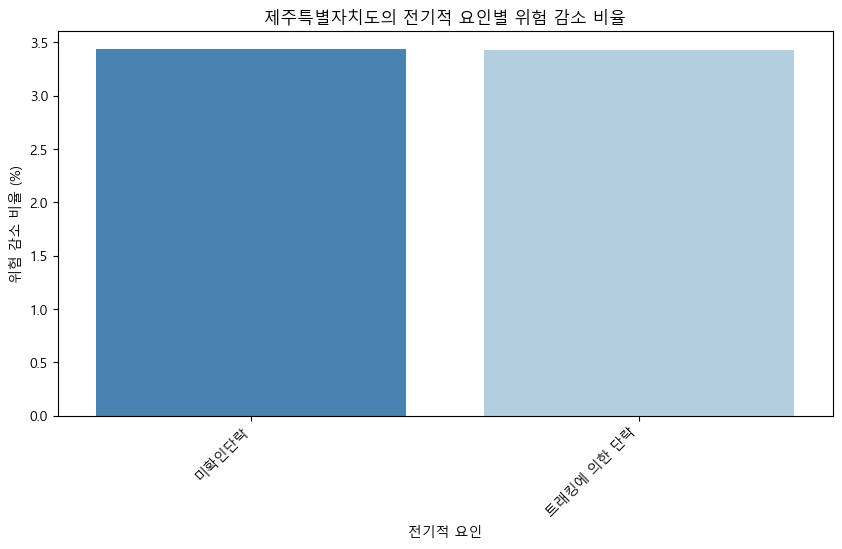

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_12524\2357733427.py:129: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")


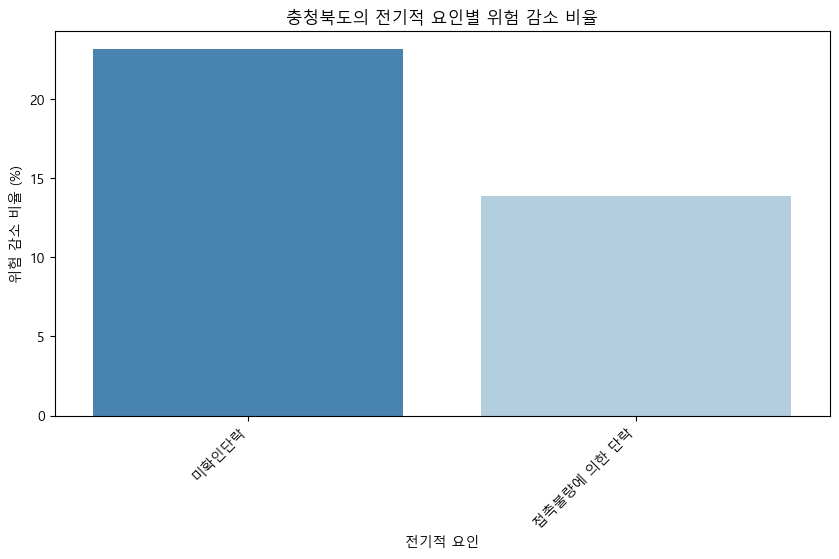

In [68]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import shap
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler

# 한글 폰트 설정
plt.rc('font', family='Malgun Gothic')
plt.rcParams['axes.unicode_minus'] = False

# 현재 실행 디렉토리 확인
BASE_DIR = os.getcwd()
print("현재 실행 디렉토리:", BASE_DIR)

# 데이터 경로 설정
DATA_PATH = os.path.join(BASE_DIR, "electric_ai_data.csv")

# 데이터 로드
data = pd.read_csv(DATA_PATH)

# 로그 변환 (발생 건수와 피해 금액을 로그 변환하여 균형 유지)
data["log_total_incidents"] = np.log1p(data["total_incidents"])
data["log_total_damage"] = np.log1p(data["total_damage"])

# 지역별 재해 건수 및 피해 금액 정규화
data["normalized_incidents"] = data.groupby("region_province")["total_incidents"].transform(lambda x: x / x.mean())
data["normalized_damage"] = data.groupby("region_province")["total_damage"].transform(lambda x: x / x.mean())

# 위험 점수 계산 (가중치 조정)
incident_weight = 0.8
damage_weight = 0.2

data["adjusted_risk_score"] = (
    incident_weight * data["normalized_incidents"] * data["log_total_incidents"] + 
    damage_weight * data["normalized_damage"] * data["log_total_damage"]
)

# 데이터 정규화
scaler = StandardScaler()
data[["z_log_total_incidents", "z_log_total_damage", "z_adjusted_risk_score"]] = scaler.fit_transform(
    data[["log_total_incidents", "log_total_damage", "adjusted_risk_score"]]
)

# One-Hot Encoding 적용 (전기적 세부요인을 독립 변수로 변환)
data = pd.get_dummies(data, columns=["cause_subcategory"])

# 지역 및 전기적 요인 목록
regions = data["region_province"].unique()
cause_columns = [col for col in data.columns if col.startswith("cause_subcategory_")]

# 결과 저장 리스트
shap_results = []

# K-Fold 설정
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# 랜덤포레스트 + SHAP 분석
for train_index, test_index in kf.split(data):
    train_data, test_data = data.iloc[train_index], data.iloc[test_index]
    
    X_train = train_data[["z_log_total_incidents", "z_log_total_damage"] + cause_columns]
    y_train = train_data["z_adjusted_risk_score"]
    X_test = test_data[["z_log_total_incidents", "z_log_total_damage"] + cause_columns]

    model = RandomForestRegressor(n_estimators=100, max_depth=7, random_state=42)
    model.fit(X_train, y_train)

    feature_importance_dict = dict(zip(X_train.columns, model.feature_importances_))

    explainer = shap.TreeExplainer(model)
    shap_values = explainer(X_test)
    shap_contributions = np.abs(shap_values.values)

    for region in regions:
        region_data = test_data[test_data["region_province"] == region]  
        if len(region_data) < 2:
            continue

        for cause in cause_columns:
            cause_data = region_data[region_data[cause] == 1]
            if cause_data.empty:
                continue

            improved_data = cause_data.copy()
            improved_data[["z_log_total_incidents", "z_log_total_damage"]] *= 0.5

            original_risk_score = model.predict(cause_data[["z_log_total_incidents", "z_log_total_damage"] + cause_columns]).mean()
            improved_risk_score = max(0, model.predict(improved_data[["z_log_total_incidents", "z_log_total_damage"] + cause_columns]).mean())

            region_shap_values = shap_contributions[test_data.index.isin(region_data.index), :].mean(axis=0)
            cause_shap_values = shap_contributions[test_data.index.isin(cause_data.index), :].mean(axis=0)

            shap_region_mean = np.mean(region_shap_values) if len(region_shap_values) > 0 else 0
            shap_cause_mean = np.mean(cause_shap_values) if len(cause_shap_values) > 0 else 0

            cause_importance = np.mean([feature_importance_dict[cause] for cause in cause_columns if cause in feature_importance_dict])

            cause_ratio = cause_data["total_incidents"].sum() / data["total_incidents"].sum()

            shap_importance_weight = (
                (feature_importance_dict["z_log_total_incidents"] * shap_region_mean) +
                (feature_importance_dict["z_log_total_damage"] * shap_region_mean) +
                (cause_importance * shap_cause_mean)
            ) * (1 + (cause_ratio * 2))  

            adjusted_reduction = (
                (shap_importance_weight * 100) *
                (1 + (cause_ratio * 2)) *
                np.log1p(cause_data["total_incidents"].sum())
            )

            shap_results.append({
                "Region": region,
                "Cause": cause.replace("cause_subcategory_", ""),
                "Reduction (%)": adjusted_reduction,
                "SHAP Contribution (%)": shap_importance_weight * 100
            })

shap_df = pd.DataFrame(shap_results)

for region in shap_df["Region"].unique():
    plt.figure(figsize=(10, 5))
    region_df = shap_df[shap_df["Region"] == region]
    
    sns.barplot(x="Cause", y="Reduction (%)", data=region_df, palette="Blues_r")
    
    plt.xticks(rotation=45, ha="right")
    plt.title(f"{region}의 전기적 요인별 위험 감소 비율")
    plt.ylabel("위험 감소 비율 (%)")
    plt.xlabel("전기적 요인")
    
    plt.show()
